# Import Libraries

In [ ]:
import sys
sys.path.append("..")
import seaborn as sb
import dgl
import torch

import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE
from tqdm import tqdm
import torch.nn.functional as F

import statistics
import argparse
import random

from dgl.data import CitationGraphDataset
# from dgl.nn import GINConv, GraphConv, SAGEConv
import seaborn as sb
import torch
import torch.nn as nn
from torch.autograd import Variable
from scipy.optimize import linear_sum_assignment
import scipy
import scipy.optimize
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
from torch.utils.data import Dataset
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import sklearn as sk
import networkx as nx


import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.multiprocessing as mp
import random
import math


import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Data

from torch_geometric.nn import GCNConv,GINConv,SAGEConv,GATConv,PNAConv, GraphSAGE
from torch_geometric.utils import add_self_loops
from torch_geometric.transforms import normalize_features
from pygod.utils import load_data
from pygod.utils.utility import check_parameter
from pygod.metrics import eval_roc_auc
from pygod.generator import gen_contextual_outliers, gen_structural_outliers
from scipy.linalg import sqrtm

# Utils

In [2]:

def _normalize(x):
    x_min = x.min()
    x_max = x.max()
    x_norm = (x - x_min)/x_max
    return x_norm

def gen_joint_structural_outliers(data, m, n, random_state=None):
    """
    We randomly select n nodes from the network which will be the anomalies 
    and for each node we select m nodes from the network. 
    We connect each of n nodes with the m other nodes.

    Parameters
    ----------
    data : PyTorch Geometric Data instance (torch_geometric.data.Data)
        The input data.
    m : int
        Number nodes in the outlier cliques.
    n : int
        Number of outlier cliques.
    p : int, optional
        Probability of edge drop in cliques. Default: ``0``.
    random_state : int, optional
        The seed to control the randomness, Default: ``None``.

    Returns
    -------
    data : PyTorch Geometric Data instance (torch_geometric.data.Data)
        The structural outlier graph with injected edges.
    y_outlier : torch.Tensor
        The outlier label tensor where 1 represents outliers and 0 represents
        regular nodes.
    """

    if not isinstance(data, Data):
        raise TypeError("data should be torch_geometric.data.Data")

    if isinstance(m, int):
        check_parameter(m, low=0, high=data.num_nodes, param_name='m')
    else:
        raise ValueError("m should be int, got %s" % m)

    if isinstance(n, int):
        check_parameter(n, low=0, high=data.num_nodes, param_name='n')
    else:
        raise ValueError("n should be int, got %s" % n)

    check_parameter(m * n, low=0, high=data.num_nodes, param_name='m*n')

    if random_state:
        np.random.seed(random_state)


    outlier_idx = np.random.choice(data.num_nodes, size=n, replace=False)
    all_nodes = [i for i in range(data.num_nodes)]
    rem_nodes = []
    
    for node in all_nodes:
        if node is not outlier_idx:
            rem_nodes.append(node)
    
    
    
    new_edges = []
    
    # connect all m nodes in each clique
    for i in range(0, n):
        other_idx = np.random.choice(data.num_nodes, size=m, replace=False)
        for j in other_idx:
            new_edges.append(torch.tensor([[i, j]], dtype=torch.long))
                    

    new_edges = torch.cat(new_edges)


    y_outlier = torch.zeros(data.x.shape[0], dtype=torch.long)
    y_outlier[outlier_idx] = 1

    data.edge_index = torch.cat([data.edge_index, new_edges.T], dim=1)

    return data, y_outlier


def KL_neighbor_loss(predictions, targets, mask_len):
    x1 = predictions.squeeze().cpu().detach()
    x2 = targets.squeeze().cpu().detach()
    
    mean_x1 = x1.mean(0)
    mean_x2 = x2.mean(0)
    
    nn = x1.shape[0]
    h_dim = x1.shape[1]
    
    cov_x1 = (x1-mean_x1).transpose(1,0).matmul(x1-mean_x1) / max((nn-1),1)
    cov_x2 = (x2-mean_x2).transpose(1,0).matmul(x2-mean_x2) / max((nn-1),1)
    
    eye = torch.eye(h_dim)
    cov_x1 = cov_x1 + eye
    cov_x2 = cov_x2 + eye
    
    KL_loss = 0.5 * (math.log(torch.det(cov_x1) / torch.det(cov_x2)) - h_dim  + torch.trace(torch.inverse(cov_x2).matmul(cov_x1)) 
            + (mean_x2 - mean_x1).reshape(1,-1).matmul(torch.inverse(cov_x2)).matmul(mean_x2 - mean_x1))
    KL_loss = KL_loss.to(device)
    return KL_loss

def W2_neighbor_loss(predictions, targets, mask_len):
    
    x1 = predictions.squeeze().cpu().detach()
    x2 = targets.squeeze().cpu().detach()
    
    mean_x1 = x1.mean(0)
    mean_x2 = x2.mean(0)

    nn = x1.shape[0]
    
    cov_x1 = (x1-mean_x1).transpose(1,0).matmul(x1-mean_x1) / (nn-1)
    cov_x2 = (x2-mean_x2).transpose(1,0).matmul(x2-mean_x2) / (nn-1)
    

    W2_loss = torch.square(mean_x1-mean_x2).sum() + torch.trace(cov_x1 + cov_x2 
                     + 2 * sqrtm(sqrtm(cov_x1) @ (cov_x2.numpy()) @ (sqrtm(cov_x1))))

    return W2_loss



# Layers

In [3]:
class MLP(nn.Module):
    def __init__(self, num_layers, input_dim, hidden_dim, output_dim):
        

        super(MLP, self).__init__()

        self.linear_or_not = True  # default is linear model
        self.num_layers = num_layers

        if num_layers < 1:
            raise ValueError("number of layers should be positive!")
        elif num_layers == 1:
            # Linear model
            self.linear = nn.Linear(input_dim, output_dim)
        else:
            # Multi-layer model
            self.linear_or_not = False
            self.linears = torch.nn.ModuleList()
            self.batch_norms = torch.nn.ModuleList()

            self.linears.append(nn.Linear(input_dim, hidden_dim))
            for layer in range(num_layers - 2):
                self.linears.append(nn.Linear(hidden_dim, hidden_dim))
            self.linears.append(nn.Linear(hidden_dim, output_dim))

            for layer in range(num_layers - 1):
                self.batch_norms.append(nn.BatchNorm1d((hidden_dim)))

    def forward(self, x):
        if self.linear_or_not:
            # If linear model
            return self.linear(x)
        else:
            # If MLP
            h = x
            for layer in range(self.num_layers - 1):
                h = self.linears[layer](h)
                
                if len(h.shape) > 2:
                    h = torch.transpose(h, 0, 1)
                    h = torch.transpose(h, 1, 2)
                    
                h = self.batch_norms[layer](h)
                
                if len(h.shape) > 2:
                    h = torch.transpose(h, 1, 2)
                    h = torch.transpose(h, 0, 1)

                h = F.relu(h)
                # h = F.relu(self.linears[layer](h))
                
            return self.linears[self.num_layers - 1](h)


class MLP_generator(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(MLP_generator, self).__init__()
        self.linear = nn.Linear(input_dim, output_dim)
        self.linear2 = nn.Linear(output_dim, output_dim)
        self.linear3 = nn.Linear(output_dim, output_dim)
        self.linear4 = nn.Linear(output_dim, output_dim)

    def forward(self, embedding):
        neighbor_embedding = F.relu(self.linear(embedding))
        neighbor_embedding = F.relu(self.linear2(neighbor_embedding))
        neighbor_embedding = F.relu(self.linear3(neighbor_embedding))
        neighbor_embedding = self.linear4(neighbor_embedding)
        return neighbor_embedding


class PairNorm(nn.Module):
    def __init__(self, mode='PN', scale=10):
        
        assert mode in ['None', 'PN', 'PN-SI', 'PN-SCS']
        super(PairNorm, self).__init__()
        self.mode = mode
        self.scale = scale

        # Scale can be set based on origina data, and also the current feature lengths.
        # We leave the experiments to future. A good pool we used for choosing scale:
        # [0.1, 1, 10, 50, 100]
    def forward(self, x):
        if self.mode == 'None':
            return x
        col_mean = x.mean(dim=0)
        if self.mode == 'PN':
            x = x - col_mean
            rownorm_mean = (1e-6 + x.pow(2).sum(dim=1).mean()).sqrt()
            x = self.scale * x / rownorm_mean
        if self.mode == 'PN-SI':
            x = x - col_mean
            rownorm_individual = (1e-6 + x.pow(2).sum(dim=1, keepdim=True)).sqrt()
            x = self.scale * x / rownorm_individual
        if self.mode == 'PN-SCS':
            rownorm_individual = (1e-6 + x.pow(2).sum(dim=1, keepdim=True)).sqrt()
            x = self.scale * x / rownorm_individual - col_mean
        return x


# FNN
class FNN(nn.Module):
    def __init__(self, in_features, hidden, out_features, layer_num):
        super(FNN, self).__init__()
        self.linear1 = MLP(layer_num, in_features, hidden, out_features)
        self.linear2 = nn.Linear(out_features, out_features)
    def forward(self, embedding):
        x = self.linear1(embedding)
        x = self.linear2(F.relu(x))
        x = F.relu(x)
        return x


# GAD-NR

In [4]:

# Training
def train(data, y, yc, ys, yj, ysj, lr, epoch, device, encoder, lambda_loss1, lambda_loss2, lambda_loss3, hidden_dim, sample_size=10,loss_step=20,
          real_loss=False,calculate_contextual=False,calculate_structural=False):
    '''
     Main training function
     INPUT:
     -----------------------
     data : torch geometric dataset object
     lr    :    learning rate
     epoch     :    number of training epoch
     device     :   CPU or GPU
     encoder    :    GCN or GIN or GraphSAGE
     lambda_loss    :   Trade-off between degree loss and neighborhood reconstruction loss
     hidden_dim     :   latent variable dimension
    '''
    
    in_nodes = data.edge_index[0,:]
    out_nodes = data.edge_index[1,:]
    
    
    neighbor_dict = {}
    for in_node, out_node in zip(in_nodes, out_nodes):
        if in_node.item() not in neighbor_dict:
            neighbor_dict[in_node.item()] = []
        neighbor_dict[in_node.item()].append(out_node.item())

    neighbor_num_list = []
    for i in neighbor_dict:
        neighbor_num_list.append(len(neighbor_dict[i]))
    
    neighbor_num_list = torch.tensor(neighbor_num_list).to(device)
    
    in_dim = data.x.shape[1]
    GNNModel = GNNStructEncoder(in_dim, hidden_dim, hidden_dim, 2, sample_size, device=device, 
                    neighbor_num_list=neighbor_num_list, GNN_name=encoder, 
                    lambda_loss1=lambda_loss1, lambda_loss2=lambda_loss2,lambda_loss3=lambda_loss3)
    GNNModel.to(device)
    degree_params = list(map(id, GNNModel.degree_decoder.parameters()))
    base_params = filter(lambda p: id(p) not in degree_params,
                         GNNModel.parameters())

    opt = torch.optim.Adam([{'params': base_params}, {'params': GNNModel.degree_decoder.parameters(), 'lr': 1e-2}],lr=lr, weight_decay=0.0003)
    min_loss = float('inf')
    arg_min_loss_per_node = None
    
    best_auc = 0
    best_auc_contextual = 0
    best_auc_dense_structural = 0
    best_auc_joint_structural = 0
    best_auc_structure_type = 0
    
        
    loss_values = []
    for i in tqdm(range(1,epoch+1,1)):
        
        if i%loss_step==0:
            GNNModel.lambda_loss2 = GNNModel.lambda_loss2 + 0.5
            GNNModel.lambda_loss3 = GNNModel.lambda_loss3 / 2
        
        loss,loss_per_node,h_loss,degree_loss,feature_loss = GNNModel(data.edge_index, data.x, neighbor_num_list, neighbor_dict, device=device)
        
        
        
        loss_per_node = loss_per_node.cpu().detach()
        
        h_loss = h_loss.cpu().detach()
        degree_loss = degree_loss.cpu().detach()
        feature_loss = feature_loss.cpu().detach()
        
        h_loss_norm = h_loss / (torch.max(h_loss) - torch.min(h_loss))
        degree_loss_norm = degree_loss / (torch.max(degree_loss) - torch.min(degree_loss))
        feature_loss_norm = feature_loss / (torch.max(feature_loss) - torch.min(feature_loss))
        
        comb_loss = args.h_loss_weight * h_loss_norm + args.degree_loss_weight *  degree_loss_norm + args.feature_loss_weight * feature_loss_norm
        
        if real_loss:
            comp_loss = loss_per_node
        else:
            comp_loss = comb_loss
            
        
        auc_score = eval_roc_auc(y.numpy(), comp_loss.numpy()) * 100
        print("Dataset Name: ",dataset_str, ", AUC Score(benchmark/combined): ", auc_score)
        
        contextual_auc_score = eval_roc_auc(yc.numpy(), comp_loss.numpy()) * 100
        print("Dataset Name: ",dataset_str, ", AUC Score (contextual): ", contextual_auc_score)

        dense_structural_auc_score = eval_roc_auc(ys.numpy(), comp_loss.numpy()) * 100
        print("Dataset Name: ",dataset_str, ", AUC Score (structural): ", dense_structural_auc_score)
        
        joint_type_auc_score = eval_roc_auc(yj.numpy(), comp_loss.numpy()) * 100
        print("Dataset Name: ",dataset_str, ", AUC Score (joint-type): ", joint_type_auc_score)
        
        structure_type_auc_score = eval_roc_auc(ysj.numpy(), comp_loss.numpy()) * 100
        print("Dataset Name: ",dataset_str, ", AUC Score (structure type): ", structure_type_auc_score) 
        
        best_auc = max(best_auc, auc_score)
        best_auc_contextual = max(best_auc_contextual, contextual_auc_score)
        best_auc_dense_structural = max(best_auc_dense_structural, dense_structural_auc_score)
        best_auc_joint_type = max(best_auc_joint_structural, joint_type_auc_score)
        best_auc_structure_type = max(best_auc_structure_type, structure_type_auc_score)
        
        
        
        print("===========================================================================================")
        print("Dataset Name: ",dataset_str, " Best AUC Score(benchmark/combined): ", best_auc)
        
        print("Dataset Name: ",dataset_str, " Best AUC Score (contextual): ", best_auc_contextual)

        
        print("Dataset Name: ",dataset_str, " Best AUC Score (structural): ", best_auc_dense_structural)
        
        
        print("Dataset Name: ",dataset_str, " Best AUC Score (joint-type): ", best_auc_joint_type)
        
        
        print("Dataset Name: ",dataset_str, " Best AUC Score (structure type): ", best_auc_structure_type) 
        print("===========================================================================================")
        
        
        if loss < min_loss:
            min_loss = loss
            arg_min_loss_per_node = loss_per_node
        opt.zero_grad()
        loss.backward()
        opt.step()
        
        loss = loss.cpu().detach()
        loss_values.append(loss)
        
        
        if args.plot_loss:

            plt.plot(np.array(loss_values), 'r')
            plt.show()
    
    return min_loss.item(), arg_min_loss_per_node.cpu().detach()




def evaluate(model, embeddings, labels, mask):
    model.eval()
    with torch.no_grad():
        logits = model(embeddings)
        logits = logits[mask]
        labels = labels[mask]
        _, indices = torch.max(logits, dim=1)
        correct = torch.sum(indices == labels)
        return correct.item() * 1.0 / len(labels)


def train_real_datasets(dataset_str, epoch_num = 10, lr = 5e-6, encoder = "GCN", 
                        lambda_loss1=1e-2, lambda_loss2=1e-3, lambda_loss3=1e-3, sample_size=8, loss_step=20, hidden_dim=None,
                        real_loss=False,calculate_contextual=False,calculate_structural=False):
    
    data = load_data(dataset_str)
    node_features = data.x
    
    if args.normalize_feat:
    
        node_features_min = node_features.min()
        node_features_max = node_features.max()
        node_features = (node_features - node_features_min)/node_features_max
        data.x = node_features
    
    yc = []
    ys = []
    yj = []
    
    if calculate_contextual:
        
        if dataset_str == "inj_cora":
            yc = data.y >> 0 & 1 # contextual outliers
        else:
            data, yc = gen_contextual_outliers(data=data,n=args.contextual_n,k=args.contextual_k)
            
        yc = yc.cpu().detach()
    
    
    if calculate_structural:
        
        if dataset_str == "inj_cora":
            ys = data.y >> 1 & 1 # structural outliers
        else:
            data, ys = gen_structural_outliers(data=data,n=args.structural_n,m=args.structural_m,p=0.2)
            
        ys = ys.cpu().detach()
        data, yj = gen_joint_structural_outliers(data=data,n=args.structural_n,m=args.structural_m)
        
    
    if args.use_combine_outlier:
        data.y = torch.logical_or(ys, yc).int()
        
    ysj = torch.logical_or(ys, yj).int()
    y = data.y.bool()    # binary labels (inlier/outlier)
    y = y.cpu().detach()
    
    edge_index = data.edge_index.cpu()
    
    num_nodes = node_features.shape[0]
    self_edges = torch.tensor([[i for i in range(num_nodes)],[i for i in range(num_nodes)]])
    edge_index = torch.cat([edge_index,self_edges],dim=1)
    data.edge_index = edge_index
    data = data.to(device)
    

    loss, loss_per_node, = train(data, y, yc, ys, yj, ysj, lr=lr, epoch=epoch_num, device=device, encoder=encoder, lambda_loss1=lambda_loss1, 
          lambda_loss2=lambda_loss2, lambda_loss3=lambda_loss3, hidden_dim=hidden_dim, sample_size=sample_size,loss_step=loss_step,
                                 real_loss=real_loss,calculate_contextual=calculate_contextual,calculate_structural=calculate_structural)

In [5]:
# generate ground truth neighbors Hv
def generate_gt_neighbor(neighbor_dict, node_embeddings, neighbor_num_list, in_dim):
    max_neighbor_num = max(neighbor_num_list)
    all_gt_neighbor_embeddings = []
    for i, embedding in enumerate(node_embeddings):
        neighbor_indexes = neighbor_dict[i]
        neighbor_embeddings = []
        for index in neighbor_indexes:
            neighbor_embeddings.append(node_embeddings[index].tolist())
        if len(neighbor_embeddings) < max_neighbor_num:
            for _ in range(max_neighbor_num - len(neighbor_embeddings)):
                neighbor_embeddings.append(torch.zeros(in_dim).tolist())
        all_gt_neighbor_embeddings.append(neighbor_embeddings)
    return all_gt_neighbor_embeddings


# Main Autoencoder structure here
class GNNStructEncoder(nn.Module):
    def __init__(self, in_dim0, in_dim, hidden_dim, layer_num, sample_size, device, neighbor_num_list, 
                 GNN_name="GIN", norm_mode="PN-SCS", norm_scale=20, lambda_loss1=0.01, lambda_loss2=0.001, lambda_loss3=0.0001):
        
        super(GNNStructEncoder, self).__init__()
        
        self.mlp0 = nn.Linear(in_dim0, hidden_dim)
        self.norm = PairNorm(norm_mode, norm_scale)
        self.out_dim = hidden_dim
        self.lambda_loss1 = lambda_loss1
        self.lambda_loss2 = lambda_loss2
        self.lambda_loss3 = lambda_loss3
        # GNN Encoder
        if GNN_name == "GIN":
            self.linear1 = MLP(layer_num, hidden_dim, hidden_dim, hidden_dim)
            self.graphconv1 = GINConv(self.linear1)
            self.linear2 = MLP(layer_num, hidden_dim, hidden_dim, hidden_dim)
            self.graphconv2 = GINConv(self.linear2)
        elif GNN_name == "GCN":
            self.graphconv1 = GCNConv(hidden_dim, hidden_dim)
            self.graphconv2 = GCNConv(hidden_dim, hidden_dim)
        elif GNN_name == "GAT":
            self.graphconv1 = GATConv(hidden_dim, hidden_dim)
            self.graphconv2 = GATConv(hidden_dim, hidden_dim)
        else:
            self.graphconv1 = SAGEConv(hidden_dim, hidden_dim, aggr=args.aggregator)
            # self.graphconv2 = SAGEConv(hidden_dim, hidden_dim, aggr='mean')
            
            # self.graphconv1 = GraphSAGE(hidden_dim, hidden_dim, aggr='mean', num_layers=1)
            

        self.neighbor_num_list = neighbor_num_list
        self.tot_node = len(neighbor_num_list)

        self.gaussian_mean = nn.Parameter(
            torch.FloatTensor(sample_size, hidden_dim).uniform_(-0.5 / hidden_dim,
                                                                                     0.5 / hidden_dim)).to(device)
        self.gaussian_log_sigma = nn.Parameter(
            torch.FloatTensor(sample_size, hidden_dim).uniform_(-0.5 / hidden_dim,
                                                                                     0.5 / hidden_dim)).to(device)
        self.m = torch.distributions.Normal(torch.zeros(sample_size, hidden_dim),
                                            torch.ones(sample_size, hidden_dim))
        
        self.m_batched = torch.distributions.Normal(torch.zeros(sample_size, self.tot_node, hidden_dim),
                                            torch.ones(sample_size, self.tot_node, hidden_dim))

        self.m_h = torch.distributions.Normal(torch.zeros(sample_size, hidden_dim),
                                            50* torch.ones(sample_size, hidden_dim))

        # Before MLP Gaussian Means, and std

        self.mlp_gaussian_mean = nn.Parameter(
            torch.FloatTensor(hidden_dim).uniform_(-0.5 / hidden_dim, 0.5 / hidden_dim)).to(device)
        self.mlp_gaussian_log_sigma = nn.Parameter(
            torch.FloatTensor(hidden_dim).uniform_(-0.5 / hidden_dim, 0.5 / hidden_dim)).to(device)
        self.mlp_m = torch.distributions.Normal(torch.zeros(hidden_dim), torch.ones(hidden_dim))

        self.mlp_mean = FNN(hidden_dim, hidden_dim, hidden_dim, 3)
        self.mlp_sigma = FNN(hidden_dim, hidden_dim, hidden_dim, 3)
        self.softplus = nn.Softplus()

        self.mean_agg = SAGEConv(hidden_dim, hidden_dim, aggr=args.aggregator, normalize = False)
        # self.mean_agg = GraphSAGE(hidden_dim, hidden_dim, aggr='mean', num_layers=1)
        self.std_agg = PNAConv(hidden_dim, hidden_dim, aggregators=["std"],scalers=["identity"], deg=neighbor_num_list)        
        self.layer1_generator = MLP_generator(hidden_dim, hidden_dim)
        
        # Decoders
        self.degree_decoder = FNN(hidden_dim, hidden_dim, 1, 4)
        self.feature_decoder = FNN(hidden_dim, hidden_dim, in_dim, 3)
        self.degree_loss_func = nn.MSELoss()
        self.feature_loss_func = nn.MSELoss()
        self.pool = mp.Pool(4)
        self.in_dim = in_dim
        self.sample_size = sample_size 
        self.init_projection = FNN(in_dim, hidden_dim, hidden_dim, 1)
        

    def forward_encoder(self, x, edge_index):
        
        # Apply graph convolution and activation, pair-norm to avoid trivial solution
        h0 = self.mlp0(x)
        l1 = self.graphconv1(h0, edge_index)
        return l1, h0
        
        

    # Sample neighbors from neighbor set, if the length of neighbor set less than sample size, then do the padding.
    def sample_neighbors(self, indexes, neighbor_dict, gt_embeddings):
        sampled_embeddings_list = []
        mark_len_list = []
        for index in indexes:
            sampled_embeddings = []
            neighbor_indexes = neighbor_dict[index]
            if len(neighbor_indexes) < self.sample_size:
                mask_len = len(neighbor_indexes)
                sample_indexes = neighbor_indexes
            else:
                sample_indexes = random.sample(neighbor_indexes, self.sample_size)
                mask_len = self.sample_size
            for index in sample_indexes:
                sampled_embeddings.append(gt_embeddings[index].tolist())
            if len(sampled_embeddings) < self.sample_size:
                for _ in range(self.sample_size - len(sampled_embeddings)):
                    sampled_embeddings.append(torch.zeros(self.out_dim).tolist())
            sampled_embeddings_list.append(sampled_embeddings)
            mark_len_list.append(mask_len)
        
        return sampled_embeddings_list, mark_len_list
    
    def reconstruction_neighbors2(self, l1, h0, edge_index):
                
        recon_loss = 0
        recon_loss_per_node = []
    
        sample_sz_per_node = [self.sample_size]* self.tot_node

        # mean_neigh = self.graphconv1(h0, edge_index)
        mean_neigh = self.mean_agg(h0, edge_index).detach()
        std_neigh = self.std_agg(h0, edge_index).detach()
        # mean_neigh = self.graphconv2(mean_neigh, edge_index)
        # mean_neigh = l1
        # mean_neigh = self.mean_agg(h0, edge_index, num_sampled_nodes_per_hop=sample_sz_per_node)
        
        
        cov_neigh = torch.bmm(std_neigh.unsqueeze(dim=-1),std_neigh.unsqueeze(dim=1))
        
        target_mean = mean_neigh
        target_cov = cov_neigh
        
        self_embedding = l1
        # self_embedding = _normalize(self_embedding)
        
        self_embedding = self_embedding.unsqueeze(0)
        self_embedding = self_embedding.repeat(self.sample_size, 1, 1)
        generated_mean = self.mlp_mean(self_embedding)
        generated_sigma = self.mlp_sigma(self_embedding)

        
        std_z = self.m_batched.sample().to(device)
        var = generated_mean + generated_sigma.exp() * std_z
        nhij = self.layer1_generator(var)
        
        generated_mean = torch.mean(nhij,dim=0)
        generated_std = torch.std(nhij,dim=0)
        generated_cov = torch.bmm(generated_std.unsqueeze(dim=-1),generated_std.unsqueeze(dim=1))/self.sample_size
        
        
        tot_nodes = l1.shape[0]
        h_dim = l1.shape[1]
        
        single_eye = torch.eye(h_dim).to(device)
        single_eye = single_eye.unsqueeze(dim=0)
        batch_eye = single_eye.repeat(tot_nodes,1,1)
        
        target_cov = target_cov + batch_eye
        generated_cov = generated_cov + batch_eye

        
        det_target_cov = torch.linalg.det(target_cov) 
        det_generated_cov = torch.linalg.det(generated_cov) 
        trace_mat = torch.matmul(torch.inverse(generated_cov),target_cov)
             
        
        x = torch.bmm(torch.unsqueeze(generated_mean - target_mean,dim=1),torch.inverse(generated_cov))
        y = torch.unsqueeze(generated_mean - target_mean,dim=-1)
        z = torch.bmm(x,y).squeeze()
        
        KL_loss = 0.5 * (torch.log(det_target_cov / det_generated_cov) - h_dim  + trace_mat.diagonal(offset=0, dim1=-1, dim2=-2).sum(-1) + z)
        
        recon_loss = torch.mean(KL_loss)
        recon_loss_per_node = KL_loss
        
        
        return recon_loss, recon_loss_per_node
    
        

    def reconstruction_neighbors(self, FNN_generator, neighbor_indexes, neighbor_dict, from_layer, to_layer, device):
        
        
        local_index_loss = 0
        local_index_loss_per_node = []
        sampled_embeddings_list, mark_len_list = self.sample_neighbors(neighbor_indexes, neighbor_dict, to_layer)
        for i, neighbor_embeddings1 in enumerate(sampled_embeddings_list):
            # Generating h^k_v, reparameterization trick
            
            # print(len(neighbor_embeddings1))
            
            index = neighbor_indexes[i]
            mask_len1 = mark_len_list[i]
            mean = from_layer[index].repeat(self.sample_size, 1)
            mean = self.mlp_mean(mean)
            sigma = from_layer[index].repeat(self.sample_size, 1)
            sigma = self.mlp_sigma(sigma)
            std_z = self.m.sample().to(device)
            var = mean + sigma.exp() * std_z
            nhij = FNN_generator(var)
            
            generated_neighbors = nhij
            sum_neighbor_norm = 0
            
            for indexi, generated_neighbor in enumerate(generated_neighbors):
                sum_neighbor_norm += torch.norm(generated_neighbor) / math.sqrt(self.out_dim)
            generated_neighbors = torch.unsqueeze(generated_neighbors, dim=0).to(device)
            target_neighbors = torch.unsqueeze(torch.FloatTensor(neighbor_embeddings1), dim=0).to(device)
            
            if args.neigh_loss == "KL":
                KL_loss = KL_neighbor_loss(generated_neighbors, target_neighbors, mask_len1)
                local_index_loss += KL_loss
                local_index_loss_per_node.append(KL_loss)
            
            else:
                W2_loss = W2_neighbor_loss(generated_neighbors, target_neighbors, mask_len1)
                local_index_loss += W2_loss
                local_index_loss_per_node.append(W2_loss)
            
            
        local_index_loss_per_node = torch.stack(local_index_loss_per_node)
        return local_index_loss, local_index_loss_per_node
    

    def neighbor_decoder(self, gij, ground_truth_degree_matrix, h0, neighbor_dict, device, h, edge_index):
        
        # Degree decoder below:
        tot_nodes = gij.shape[0]
        degree_logits = self.degree_decoding(gij)
        ground_truth_degree_matrix = torch.unsqueeze(ground_truth_degree_matrix, dim=1)
        degree_loss = self.degree_loss_func(degree_logits, ground_truth_degree_matrix.float())
        degree_loss_per_node = (degree_logits-ground_truth_degree_matrix).pow(2)
        _, degree_masks = torch.max(degree_logits.data, dim=1)
        h_loss = 0
        feature_loss = 0
        # layer 1
        loss_list = []
        loss_list_per_node = []
        feature_loss_list = []
        # Sample multiple times to remove noise
        for _ in range(3):
            local_index_loss_sum = 0
            local_index_loss_sum_per_node = []
            indexes = []
            h0_prime = self.feature_decoder(gij)
            feature_losses = self.feature_loss_func(h0, h0_prime)
            feature_losses_per_node = (h0-h0_prime).pow(2).mean(1)
            feature_loss_list.append(feature_losses_per_node)
            

            
            #local_index_loss, local_index_loss_per_node = self.reconstruction_neighbors(self.layer1_generator, indexes, neighbor_dict, gij, h0, device)
            local_index_loss, local_index_loss_per_node = self.reconstruction_neighbors2(gij,h0,edge_index)
            
            # print(local_index_loss, local_index_loss2)
            # print(local_index_loss_per_node, local_index_loss_per_node2)

            loss_list.append(local_index_loss)
            loss_list_per_node.append(local_index_loss_per_node)
            
        loss_list = torch.stack(loss_list)
        h_loss += torch.mean(loss_list)
        
        loss_list_per_node = torch.stack(loss_list_per_node)
        h_loss_per_node = torch.mean(loss_list_per_node,dim=0)
        
        feature_loss_per_node = torch.mean(torch.stack(feature_loss_list),dim=0)
        feature_loss += torch.mean(torch.stack(feature_loss_list))
                
        h_loss_per_node = h_loss_per_node.reshape(tot_nodes,1)
        degree_loss_per_node = degree_loss_per_node.reshape(tot_nodes,1)
        feature_loss_per_node = feature_loss_per_node.reshape(tot_nodes,1)
        
        loss = self.lambda_loss1 * h_loss + degree_loss * self.lambda_loss3 + self.lambda_loss2 * feature_loss
        loss_per_node = self.lambda_loss1 * h_loss_per_node + degree_loss_per_node * self.lambda_loss3 + self.lambda_loss2 * feature_loss_per_node
        

        return loss,loss_per_node,h_loss_per_node,degree_loss_per_node,feature_loss_per_node

    def degree_decoding(self, node_embeddings):
        degree_logits = F.relu(self.degree_decoder(node_embeddings))
        return degree_logits

    def forward(self, edge_index, x, ground_truth_degree_matrix, neighbor_dict, device):
        
        # Generate GNN encodings
        l1, h0 = self.forward_encoder(x, edge_index)
        loss, loss_per_node,h_loss,degree_loss,feature_loss = self.neighbor_decoder(l1, ground_truth_degree_matrix, h0, neighbor_dict, device, x, edge_index)
        
        return loss, loss_per_node,h_loss,degree_loss,feature_loss


# Execution

GAD-NR: Graph Anomaly Detection via Neighborhood Reconstruction
Dataset:  weibo lr: 0.01 lambda_loss1 (neighbor): 0.01 lambda_loss2 (feature): 0.5 lambda_loss3 (degree): 0.8 sample_size: 10 dimension: 16 encoder: GCN loss_step: 100 real_loss: False h_loss_weight: 1.0 feature_loss_weight 2.0 degree_loss_weight: 1.0 calculate_contextual True calculate_structural True


  0%|          | 0/500 [00:00<?, ?it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  74.07707231116049
Dataset Name:  weibo , AUC Score (contextual):  68.42352490913201
Dataset Name:  weibo , AUC Score (structural):  51.20663072990177
Dataset Name:  weibo , AUC Score (joint-type):  47.59002536267703
Dataset Name:  weibo , AUC Score (structure type):  50.92886822091247
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.07707231116049
Dataset Name:  weibo  Best AUC Score (contextual):  68.42352490913201
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.59002536267703
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


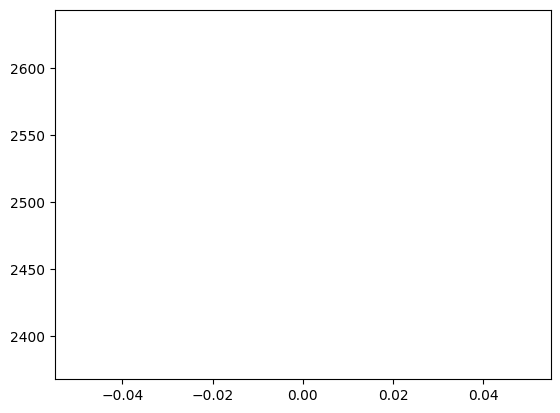

  0%|          | 1/500 [00:00<01:34,  5.26it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo , AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo , AUC Score (structural):  51.178419802631204
Dataset Name:  weibo , AUC Score (joint-type):  47.66159817818856
Dataset Name:  weibo , AUC Score (structure type):  50.908905179885
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.66159817818856
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


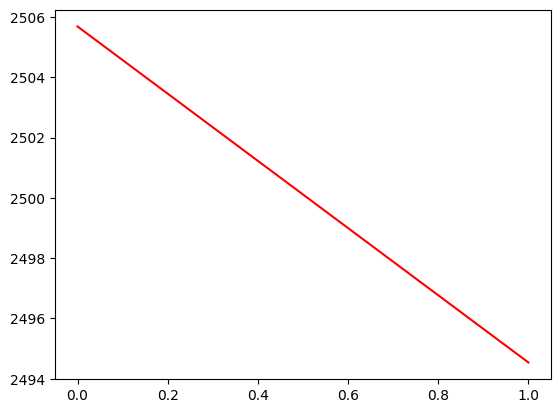

  0%|          | 2/500 [00:00<01:28,  5.61it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  71.86129075057673
Dataset Name:  weibo , AUC Score (contextual):  67.24500161009928
Dataset Name:  weibo , AUC Score (structural):  51.13574914550989
Dataset Name:  weibo , AUC Score (joint-type):  47.69368453732338
Dataset Name:  weibo , AUC Score (structure type):  50.87506942056363
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.69368453732338
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


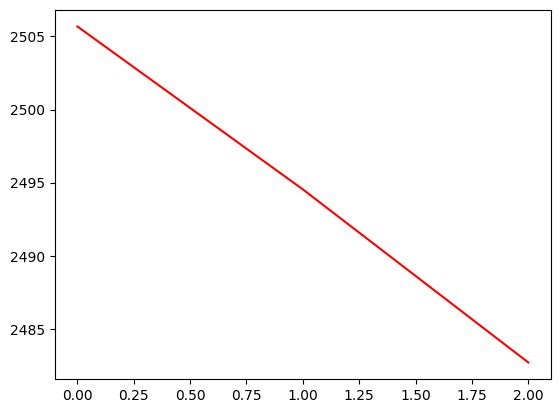

  1%|          | 3/500 [00:00<01:33,  5.33it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.26013448859665
Dataset Name:  weibo , AUC Score (contextual):  65.82025163799419
Dataset Name:  weibo , AUC Score (structural):  51.07598018376497
Dataset Name:  weibo , AUC Score (joint-type):  47.65818719586612
Dataset Name:  weibo , AUC Score (structure type):  50.81816848669894
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.65818719586612
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


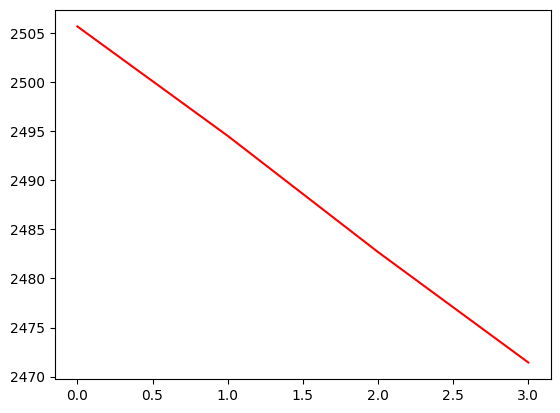

  1%|          | 4/500 [00:00<01:30,  5.47it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.29122259525818
Dataset Name:  weibo , AUC Score (contextual):  64.26975782603644
Dataset Name:  weibo , AUC Score (structural):  51.04416707761548
Dataset Name:  weibo , AUC Score (joint-type):  47.678306210242546
Dataset Name:  weibo , AUC Score (structure type):  50.78050135035388
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.678306210242546
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


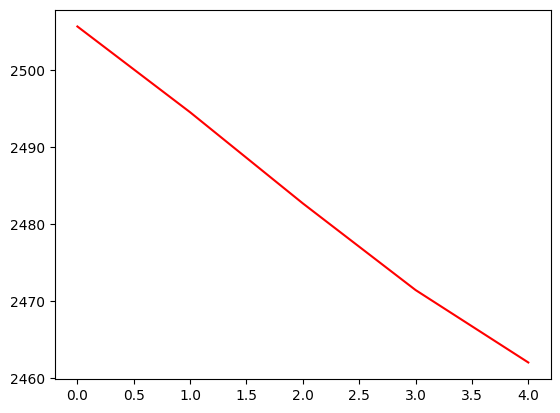

  1%|          | 5/500 [00:00<01:31,  5.40it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.48501035444802
Dataset Name:  weibo , AUC Score (contextual):  62.99431059711269
Dataset Name:  weibo , AUC Score (structural):  51.00553788948028
Dataset Name:  weibo , AUC Score (joint-type):  47.717055547558054
Dataset Name:  weibo , AUC Score (structure type):  50.739373155953956
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.717055547558054
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


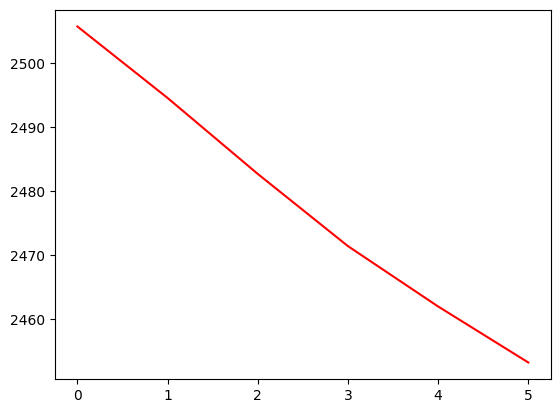

  1%|          | 6/500 [00:01<01:26,  5.69it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.8370777895103
Dataset Name:  weibo , AUC Score (contextual):  62.50018066643656
Dataset Name:  weibo , AUC Score (structural):  51.00481802053043
Dataset Name:  weibo , AUC Score (joint-type):  47.70570969534147
Dataset Name:  weibo , AUC Score (structure type):  50.73704299505779
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.70570969534147
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


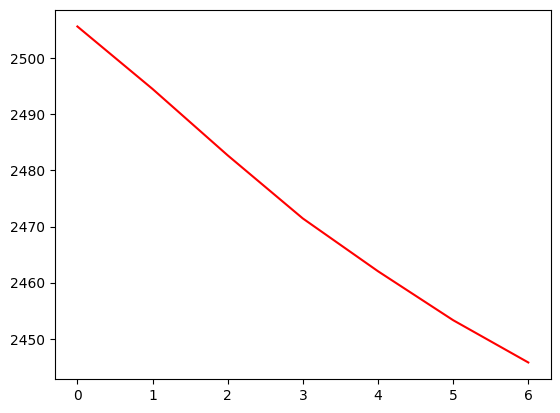

  1%|▏         | 7/500 [00:01<01:26,  5.71it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.5533903709442
Dataset Name:  weibo , AUC Score (contextual):  63.109792583368154
Dataset Name:  weibo , AUC Score (structural):  51.014102629505565
Dataset Name:  weibo , AUC Score (joint-type):  47.62812430082089
Dataset Name:  weibo , AUC Score (structure type):  50.74100825663172
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.62812430082089
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


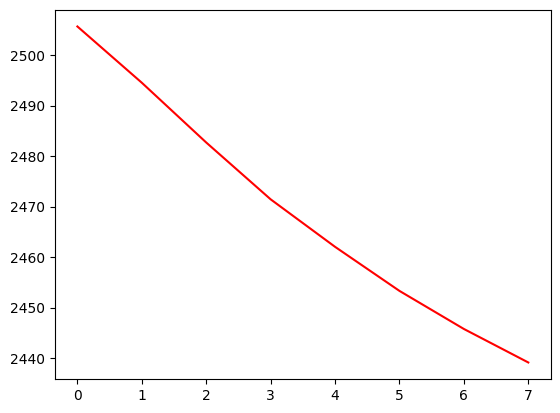

  2%|▏         | 8/500 [00:01<01:26,  5.69it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.97210566122642
Dataset Name:  weibo , AUC Score (contextual):  64.39353601505921
Dataset Name:  weibo , AUC Score (structural):  51.04642304487561
Dataset Name:  weibo , AUC Score (joint-type):  47.60560603616681
Dataset Name:  weibo , AUC Score (structure type):  50.77386409498943
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.60560603616681
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


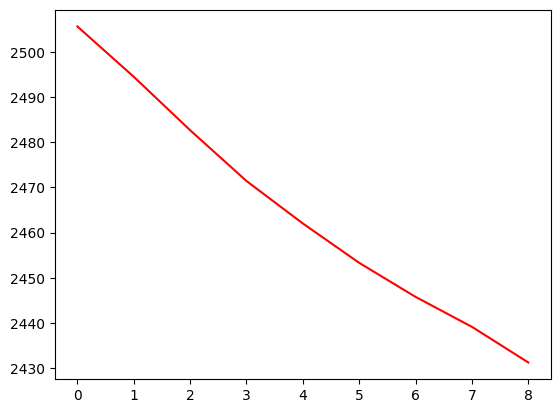

  2%|▏         | 9/500 [00:01<01:28,  5.57it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.01039357908051
Dataset Name:  weibo , AUC Score (contextual):  65.15057174423183
Dataset Name:  weibo , AUC Score (structural):  51.05242573163058
Dataset Name:  weibo , AUC Score (joint-type):  47.56756491128266
Dataset Name:  weibo , AUC Score (structure type):  50.778330711475036
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.56756491128266
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


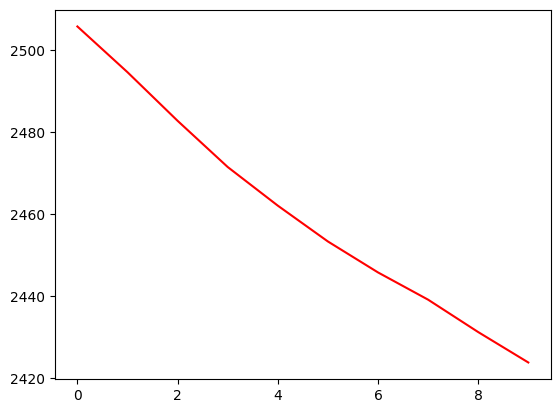

  2%|▏         | 10/500 [00:01<01:55,  4.25it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.97740730980618
Dataset Name:  weibo , AUC Score (contextual):  64.94787845571534
Dataset Name:  weibo , AUC Score (structural):  51.03411158535549
Dataset Name:  weibo , AUC Score (joint-type):  47.446113705962915
Dataset Name:  weibo , AUC Score (structure type):  50.74509885693359
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.446113705962915
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


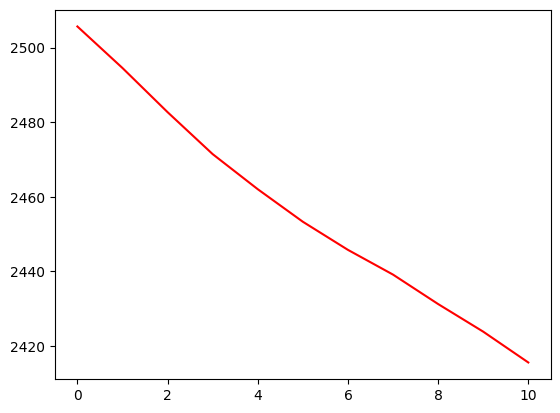

  2%|▏         | 11/500 [00:02<01:44,  4.68it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.37557848255824
Dataset Name:  weibo , AUC Score (contextual):  63.745608360259865
Dataset Name:  weibo , AUC Score (structural):  51.07048480623055
Dataset Name:  weibo , AUC Score (joint-type):  47.32333279567001
Dataset Name:  weibo , AUC Score (structure type):  50.755678585012355
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.32333279567001
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


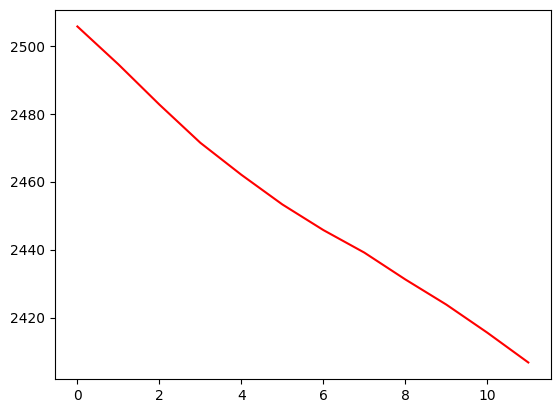

  2%|▏         | 12/500 [00:02<01:35,  5.11it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.78580997340921
Dataset Name:  weibo , AUC Score (contextual):  62.646101333925344
Dataset Name:  weibo , AUC Score (structural):  51.111460653777044
Dataset Name:  weibo , AUC Score (joint-type):  47.253349844800304
Dataset Name:  weibo , AUC Score (structure type):  50.77619425588562
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.253349844800304
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


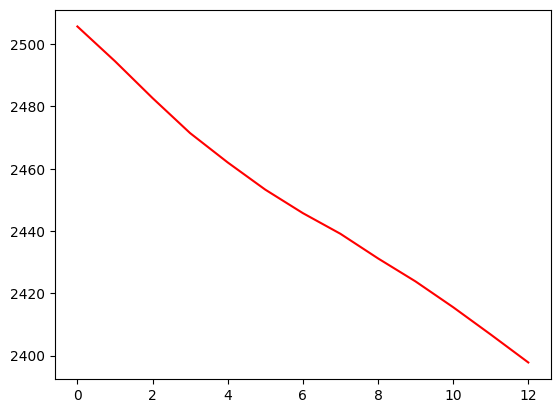

  3%|▎         | 13/500 [00:02<01:32,  5.25it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.84304160916743
Dataset Name:  weibo , AUC Score (contextual):  61.95245784401635
Dataset Name:  weibo , AUC Score (structural):  51.11782327500695
Dataset Name:  weibo , AUC Score (joint-type):  47.27026022326325
Dataset Name:  weibo , AUC Score (structure type):  50.77590084931801
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.27026022326325
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


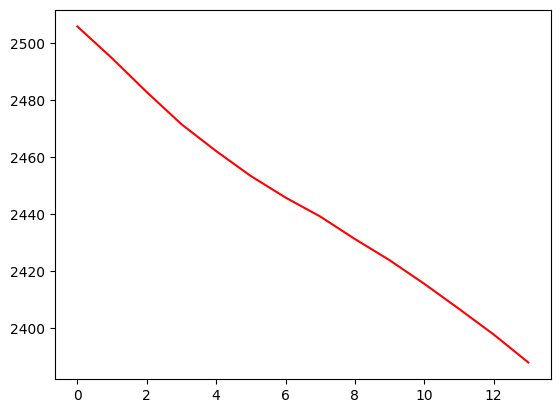

  3%|▎         | 14/500 [00:02<01:34,  5.13it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.880605602224115
Dataset Name:  weibo , AUC Score (contextual):  59.64099700122622
Dataset Name:  weibo , AUC Score (structural):  51.09458624540163
Dataset Name:  weibo , AUC Score (joint-type):  47.38178200122911
Dataset Name:  weibo , AUC Score (structure type):  50.75127463789072
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.38178200122911
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


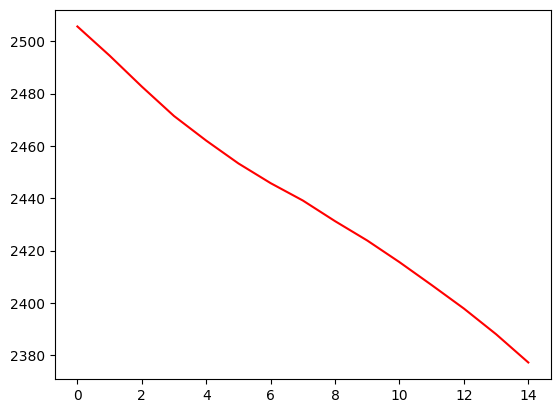

  3%|▎         | 15/500 [00:02<01:34,  5.16it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.555585685120846
Dataset Name:  weibo , AUC Score (contextual):  57.82138246535396
Dataset Name:  weibo , AUC Score (structural):  51.071383225352996
Dataset Name:  weibo , AUC Score (joint-type):  47.48468960349932
Dataset Name:  weibo , AUC Score (structure type):  50.72930902582411
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.48468960349932
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


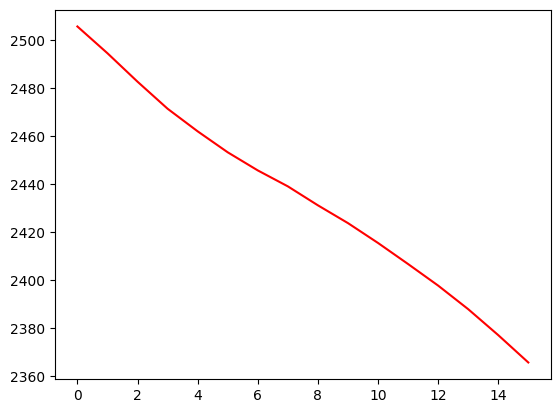

  3%|▎         | 16/500 [00:03<01:34,  5.12it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.11320068308174
Dataset Name:  weibo , AUC Score (contextual):  56.72045901415673
Dataset Name:  weibo , AUC Score (structural):  51.080852052760164
Dataset Name:  weibo , AUC Score (joint-type):  47.546058378673386
Dataset Name:  weibo , AUC Score (structure type):  50.73957255847564
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.546058378673386
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


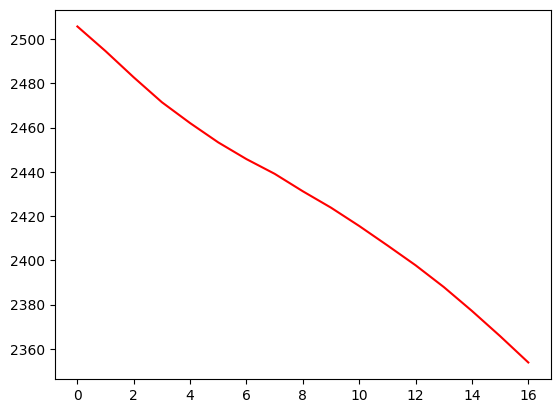

  3%|▎         | 17/500 [00:03<01:32,  5.20it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.226285807222
Dataset Name:  weibo , AUC Score (contextual):  56.14384401520026
Dataset Name:  weibo , AUC Score (structural):  51.09369349453863
Dataset Name:  weibo , AUC Score (joint-type):  47.556088979231745
Dataset Name:  weibo , AUC Score (structure type):  50.75496358454177
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.556088979231745
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


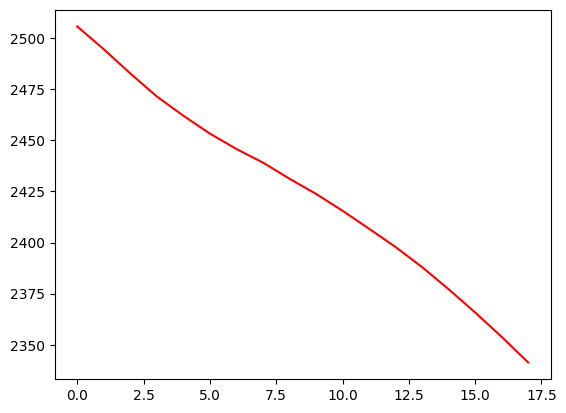

  4%|▎         | 18/500 [00:03<01:30,  5.35it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  56.94569616313743
Dataset Name:  weibo , AUC Score (contextual):  56.05871399028853
Dataset Name:  weibo , AUC Score (structural):  51.10815039025965
Dataset Name:  weibo , AUC Score (joint-type):  47.58161353339034
Dataset Name:  weibo , AUC Score (structure type):  50.77548210402247
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.58161353339034
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


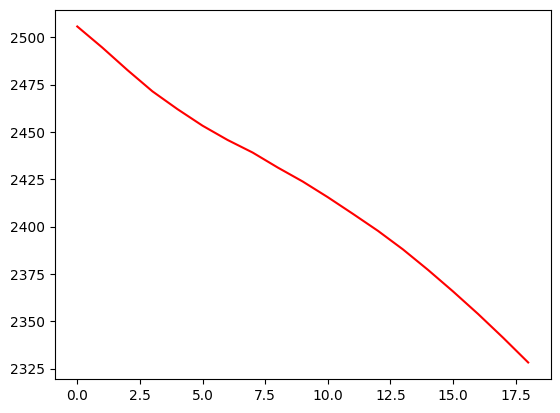

  4%|▍         | 19/500 [00:03<01:29,  5.39it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.0681183274647
Dataset Name:  weibo , AUC Score (contextual):  56.12571955828357
Dataset Name:  weibo , AUC Score (structural):  51.1380391223267
Dataset Name:  weibo , AUC Score (joint-type):  47.561248812660175
Dataset Name:  weibo , AUC Score (structure type):  50.802096643451655
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.561248812660175
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


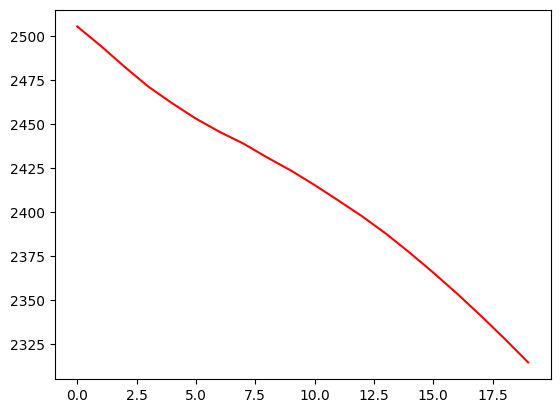

  4%|▍         | 20/500 [00:03<01:28,  5.44it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.30846105449674
Dataset Name:  weibo , AUC Score (contextual):  56.187290679866585
Dataset Name:  weibo , AUC Score (structural):  51.14348065139638
Dataset Name:  weibo , AUC Score (joint-type):  47.47561292172605
Dataset Name:  weibo , AUC Score (structure type):  50.795650244786536
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.47561292172605
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


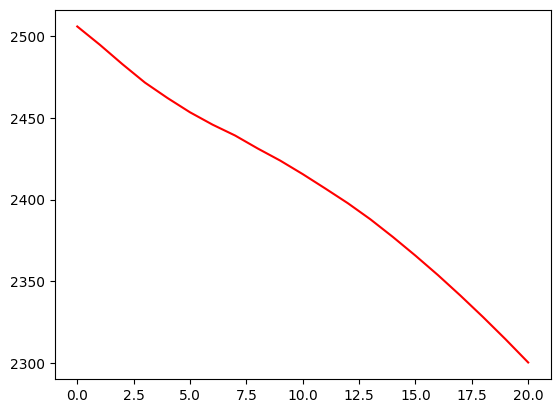

  4%|▍         | 21/500 [00:03<01:26,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.41584221374247
Dataset Name:  weibo , AUC Score (contextual):  56.26928433543947
Dataset Name:  weibo , AUC Score (structural):  51.107246302877776
Dataset Name:  weibo , AUC Score (joint-type):  47.402999467539885
Dataset Name:  weibo , AUC Score (structure type):  50.755208564782684
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.402999467539885
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


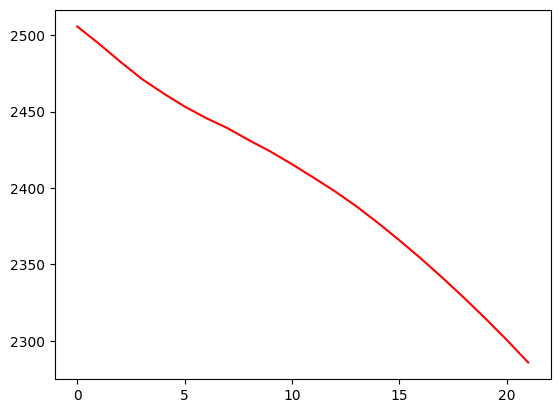

  4%|▍         | 22/500 [00:04<01:23,  5.76it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.516513005883716
Dataset Name:  weibo , AUC Score (contextual):  56.44588939051527
Dataset Name:  weibo , AUC Score (structural):  51.09873541131724
Dataset Name:  weibo , AUC Score (joint-type):  47.32818910948502
Dataset Name:  weibo , AUC Score (structure type):  50.75246535580589
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.32818910948502
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


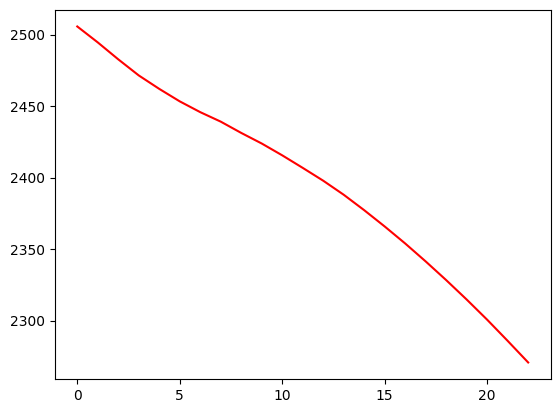

  5%|▍         | 23/500 [00:04<01:22,  5.77it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.032890275867935
Dataset Name:  weibo , AUC Score (contextual):  56.89443356591608
Dataset Name:  weibo , AUC Score (structural):  51.12592605188725
Dataset Name:  weibo , AUC Score (joint-type):  47.27439387133197
Dataset Name:  weibo , AUC Score (structure type):  50.77556186503115
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.27439387133197
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


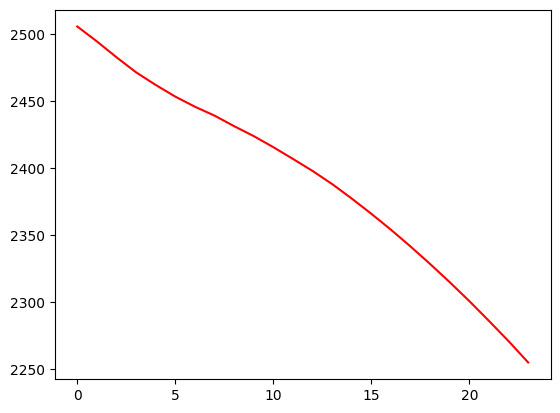

  5%|▍         | 24/500 [00:04<01:21,  5.85it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.76182874164873
Dataset Name:  weibo , AUC Score (contextual):  57.27513388105615
Dataset Name:  weibo , AUC Score (structural):  51.109573123381004
Dataset Name:  weibo , AUC Score (joint-type):  47.27147430171699
Dataset Name:  weibo , AUC Score (structure type):  50.76011671542343
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.27147430171699
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


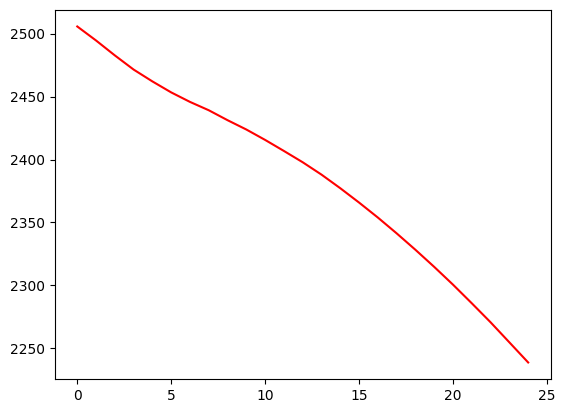

  5%|▌         | 25/500 [00:04<01:20,  5.93it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.305309780505254
Dataset Name:  weibo , AUC Score (contextual):  57.155980752809576
Dataset Name:  weibo , AUC Score (structural):  51.12730910719245
Dataset Name:  weibo , AUC Score (joint-type):  47.244388789546434
Dataset Name:  weibo , AUC Score (structure type):  50.766320982455085
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.244388789546434
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


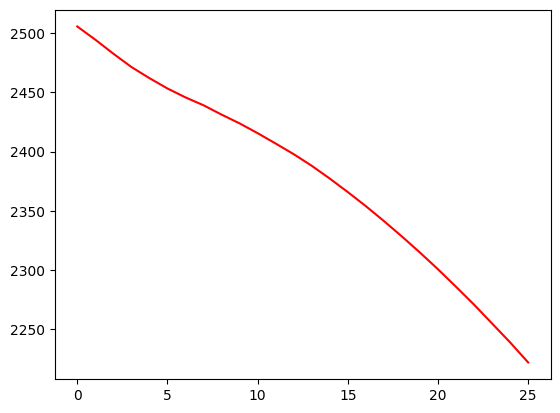

  5%|▌         | 26/500 [00:04<01:19,  5.93it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.43360405104403
Dataset Name:  weibo , AUC Score (contextual):  56.469708453512645
Dataset Name:  weibo , AUC Score (structural):  51.01913037563555
Dataset Name:  weibo , AUC Score (joint-type):  47.45624547972575
Dataset Name:  weibo , AUC Score (structure type):  50.69968065971015
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.45624547972575
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


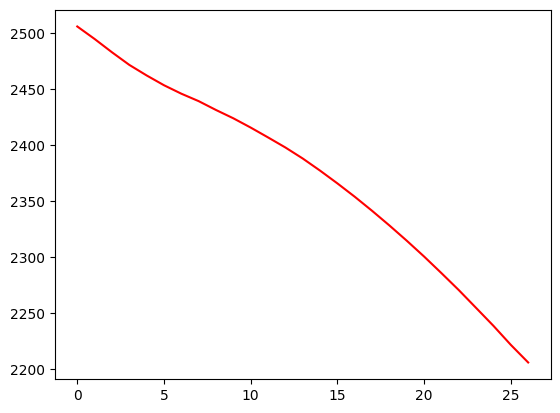

  5%|▌         | 27/500 [00:04<01:22,  5.73it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.29183034969114
Dataset Name:  weibo , AUC Score (contextual):  56.03654260519267
Dataset Name:  weibo , AUC Score (structural):  51.126481541313105
Dataset Name:  weibo , AUC Score (joint-type):  47.30038093156818
Dataset Name:  weibo , AUC Score (structure type):  50.77054831591467
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.30038093156818
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


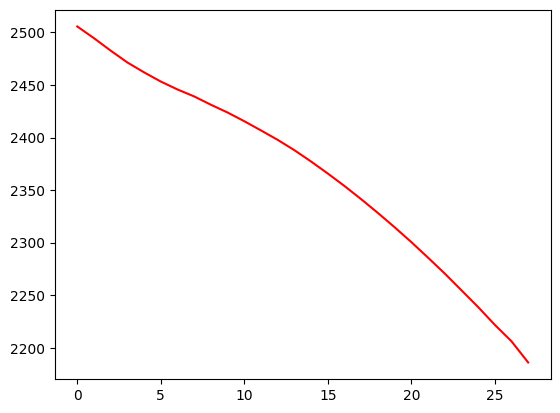

  6%|▌         | 28/500 [00:05<01:22,  5.73it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  56.88290302403687
Dataset Name:  weibo , AUC Score (contextual):  55.63199432042537
Dataset Name:  weibo , AUC Score (structural):  51.06799644033306
Dataset Name:  weibo , AUC Score (joint-type):  47.42191885677748
Dataset Name:  weibo , AUC Score (structure type):  50.72439517796846
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.42191885677748
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


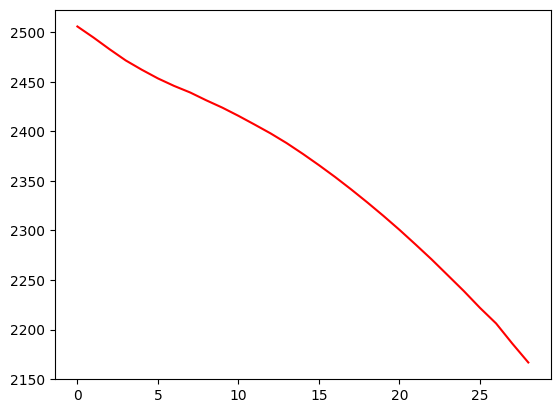

  6%|▌         | 29/500 [00:05<01:20,  5.82it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  56.588930859679046
Dataset Name:  weibo , AUC Score (contextual):  55.82702735203131
Dataset Name:  weibo , AUC Score (structural):  51.02654445899299
Dataset Name:  weibo , AUC Score (joint-type):  47.459714275307896
Dataset Name:  weibo , AUC Score (structure type):  50.683825310629246
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.459714275307896
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


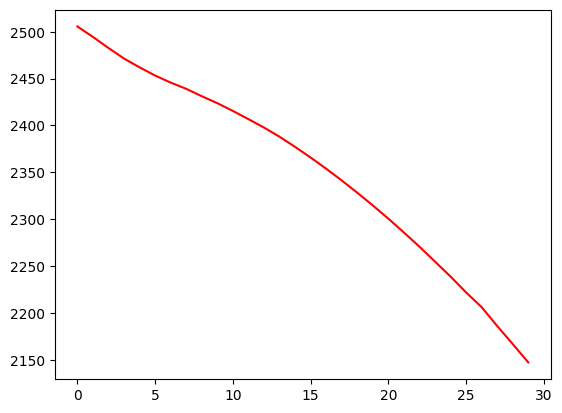

  6%|▌         | 30/500 [00:05<01:22,  5.68it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.356457757704085
Dataset Name:  weibo , AUC Score (contextual):  56.83818126422568
Dataset Name:  weibo , AUC Score (structural):  51.1471650200373
Dataset Name:  weibo , AUC Score (joint-type):  47.40883860676982
Dataset Name:  weibo , AUC Score (structure type):  50.79476147926134
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.40883860676982
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


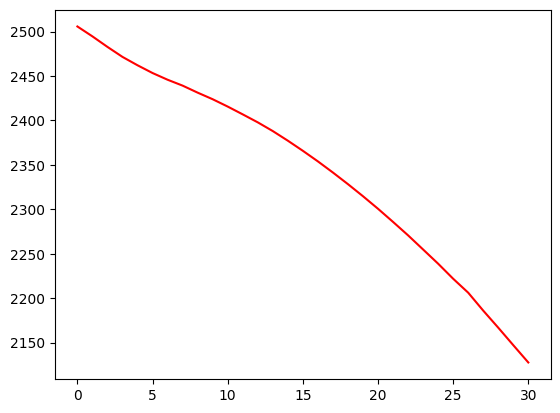

  6%|▌         | 31/500 [00:05<01:23,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.14264314481736
Dataset Name:  weibo , AUC Score (contextual):  56.850350955393026
Dataset Name:  weibo , AUC Score (structural):  51.05231803470108
Dataset Name:  weibo , AUC Score (joint-type):  47.44355546922109
Dataset Name:  weibo , AUC Score (structure type):  50.710625009542845
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.44355546922109
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


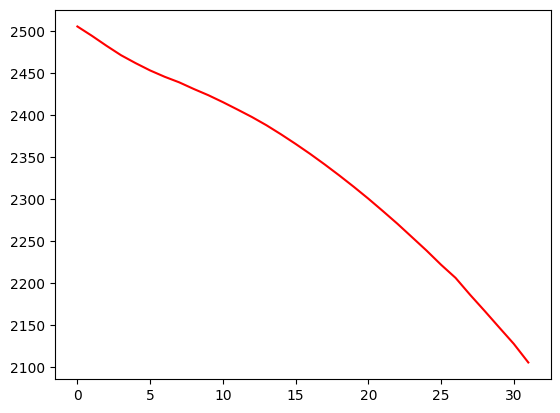

  6%|▋         | 32/500 [00:05<01:25,  5.47it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.06281423319305
Dataset Name:  weibo , AUC Score (contextual):  56.647137347539214
Dataset Name:  weibo , AUC Score (structural):  51.10924436433304
Dataset Name:  weibo , AUC Score (joint-type):  47.38568439625902
Dataset Name:  weibo , AUC Score (structure type):  50.755558943499345
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.38568439625902
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


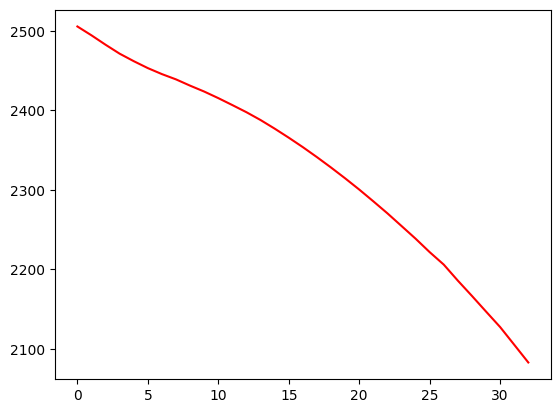

  7%|▋         | 33/500 [00:06<01:24,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  56.43212379603174
Dataset Name:  weibo , AUC Score (contextual):  55.72799323816115
Dataset Name:  weibo , AUC Score (structural):  51.11498064289399
Dataset Name:  weibo , AUC Score (joint-type):  47.33752595092695
Dataset Name:  weibo , AUC Score (structure type):  50.74230722163009
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.33752595092695
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


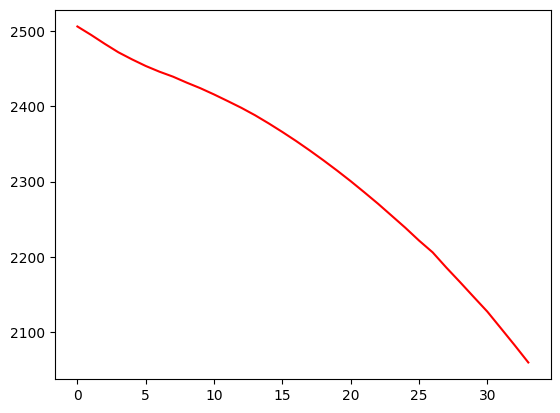

  7%|▋         | 34/500 [00:06<01:23,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.722124156771294
Dataset Name:  weibo , AUC Score (contextual):  55.00026883165761
Dataset Name:  weibo , AUC Score (structural):  51.0165258104194
Dataset Name:  weibo , AUC Score (joint-type):  47.417510595725176
Dataset Name:  weibo , AUC Score (structure type):  50.65002658320474
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.417510595725176
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


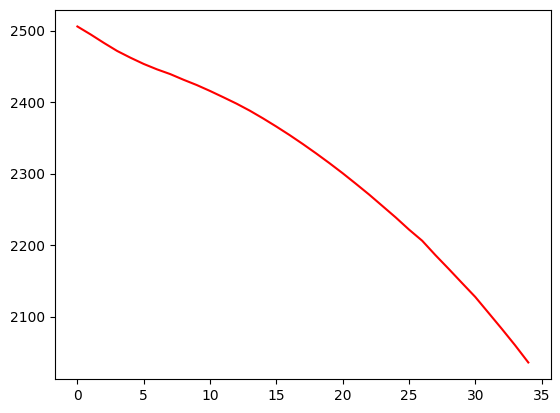

  7%|▋         | 35/500 [00:06<01:22,  5.63it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.37475183870173
Dataset Name:  weibo , AUC Score (contextual):  54.93196246531927
Dataset Name:  weibo , AUC Score (structural):  51.04159368782628
Dataset Name:  weibo , AUC Score (joint-type):  47.28396196581271
Dataset Name:  weibo , AUC Score (structure type):  50.648673494664784
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.28396196581271
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


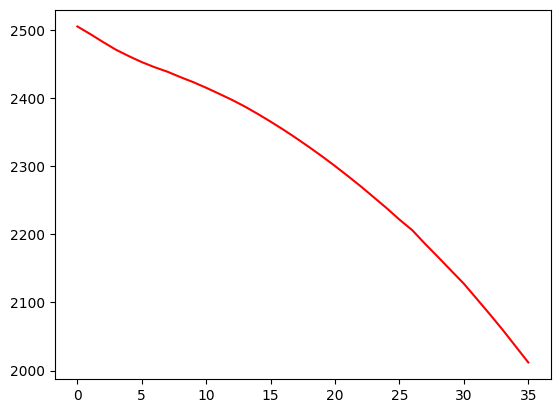

  7%|▋         | 36/500 [00:06<01:23,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.105718088765165
Dataset Name:  weibo , AUC Score (contextual):  55.06426811014813
Dataset Name:  weibo , AUC Score (structural):  50.87068432896311
Dataset Name:  weibo , AUC Score (joint-type):  47.28724286830082
Dataset Name:  weibo , AUC Score (structure type):  50.49207984578323
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.28724286830082
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


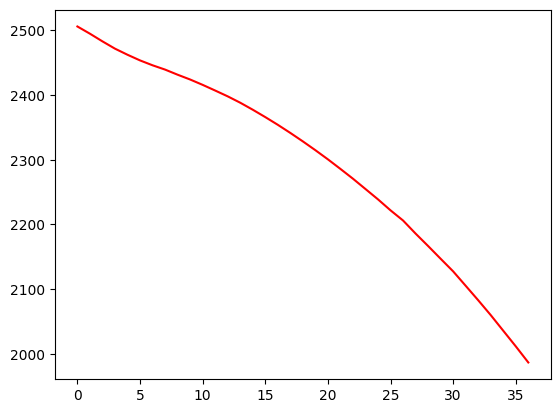

  7%|▋         | 37/500 [00:06<01:22,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.47888481341512
Dataset Name:  weibo , AUC Score (contextual):  55.23175312350589
Dataset Name:  weibo , AUC Score (structural):  51.055971227915045
Dataset Name:  weibo , AUC Score (joint-type):  47.22476118787748
Dataset Name:  weibo , AUC Score (structure type):  50.66163180996644
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.22476118787748
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


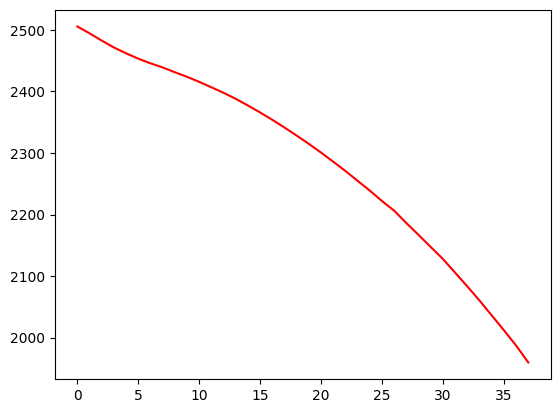

  8%|▊         | 38/500 [00:06<01:23,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.75804525630546
Dataset Name:  weibo , AUC Score (contextual):  55.49497689493077
Dataset Name:  weibo , AUC Score (structural):  51.05668542860544
Dataset Name:  weibo , AUC Score (joint-type):  47.18761616851871
Dataset Name:  weibo , AUC Score (structure type):  50.656196666946975
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.18761616851871
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


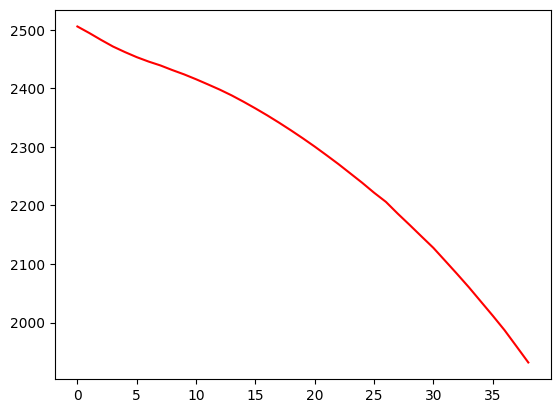

  8%|▊         | 39/500 [00:07<01:23,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.69141543806315
Dataset Name:  weibo , AUC Score (contextual):  55.67179874973045
Dataset Name:  weibo , AUC Score (structural):  51.024957346347655
Dataset Name:  weibo , AUC Score (joint-type):  47.228865929316356
Dataset Name:  weibo , AUC Score (structure type):  50.63574081683021
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.20663072990177
Dataset Name:  weibo  Best AUC Score (joint-type):  47.228865929316356
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


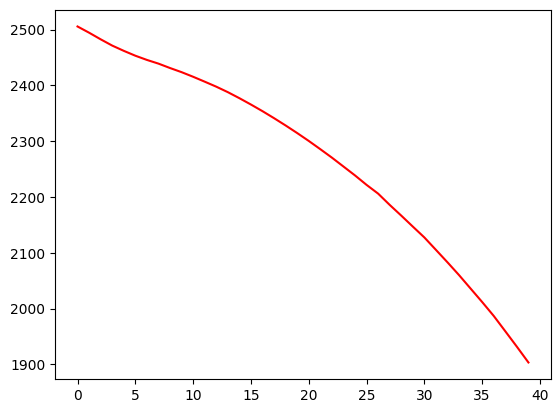

  8%|▊         | 40/500 [00:07<01:23,  5.53it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  56.710626959228485
Dataset Name:  weibo , AUC Score (contextual):  56.42811181315679
Dataset Name:  weibo , AUC Score (structural):  51.297045136349986
Dataset Name:  weibo , AUC Score (joint-type):  47.27160438155133
Dataset Name:  weibo , AUC Score (structure type):  50.91944787606688
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.297045136349986
Dataset Name:  weibo  Best AUC Score (joint-type):  47.27160438155133
Dataset Name:  weibo  Best AUC Score (structure type):  50.92886822091247


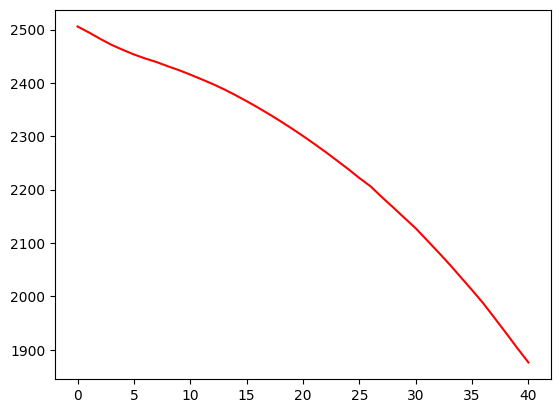

  8%|▊         | 41/500 [00:07<01:23,  5.49it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.491872660160716
Dataset Name:  weibo , AUC Score (contextual):  56.91978468029556
Dataset Name:  weibo , AUC Score (structural):  51.310631954245814
Dataset Name:  weibo , AUC Score (joint-type):  47.34486823490915
Dataset Name:  weibo , AUC Score (structure type):  50.93149463698372
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.34486823490915
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


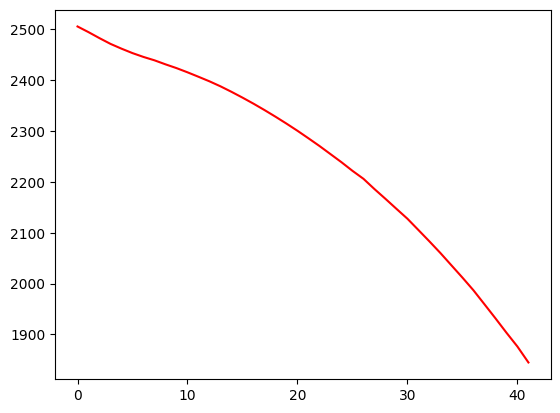

  8%|▊         | 42/500 [00:07<01:22,  5.53it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  56.51058464875891
Dataset Name:  weibo , AUC Score (contextual):  56.26111821250651
Dataset Name:  weibo , AUC Score (structural):  51.12904926284286
Dataset Name:  weibo , AUC Score (joint-type):  47.289006172721734
Dataset Name:  weibo , AUC Score (structure type):  50.74029325616114
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.289006172721734
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


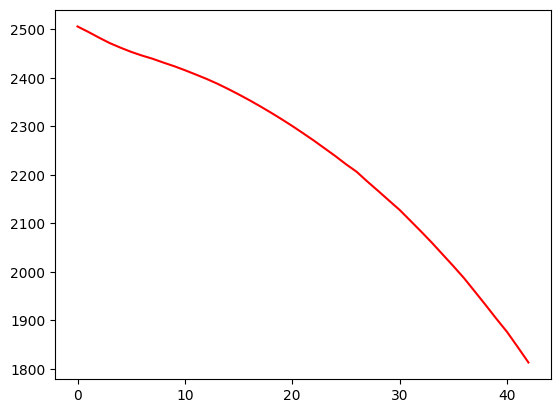

  9%|▊         | 43/500 [00:07<01:22,  5.57it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  56.48522588104521
Dataset Name:  weibo , AUC Score (contextual):  56.20443231136834
Dataset Name:  weibo , AUC Score (structural):  50.98406652269287
Dataset Name:  weibo , AUC Score (joint-type):  47.39539702388902
Dataset Name:  weibo , AUC Score (structure type):  50.603756652352985
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.39539702388902
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


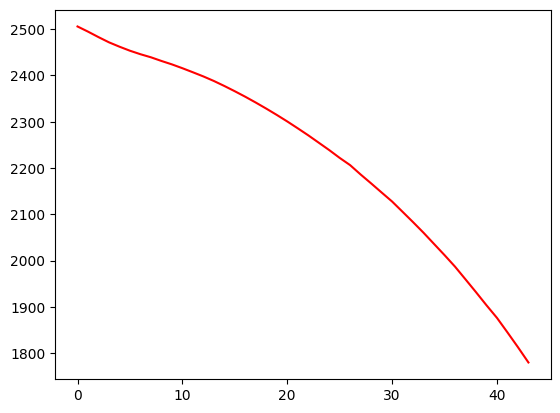

  9%|▉         | 44/500 [00:08<01:22,  5.51it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  56.23416032366286
Dataset Name:  weibo , AUC Score (contextual):  55.81904912219237
Dataset Name:  weibo , AUC Score (structural):  50.97643137721699
Dataset Name:  weibo , AUC Score (joint-type):  47.49500927035619
Dataset Name:  weibo , AUC Score (structure type):  50.60122139172021
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.49500927035619
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


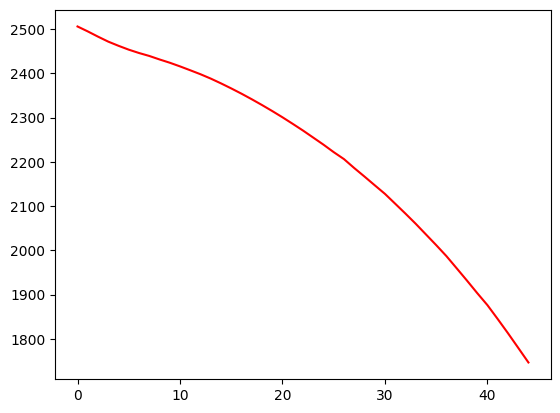

  9%|▉         | 45/500 [00:08<01:21,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.87216735380418
Dataset Name:  weibo , AUC Score (contextual):  55.48659397227391
Dataset Name:  weibo , AUC Score (structural):  50.74039938556068
Dataset Name:  weibo , AUC Score (joint-type):  47.31457408682511
Dataset Name:  weibo , AUC Score (structure type):  50.36129458042177
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.31457408682511
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


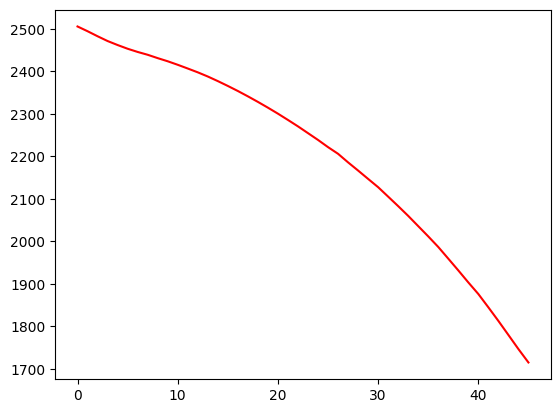

  9%|▉         | 46/500 [00:08<01:20,  5.62it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.17222562241331
Dataset Name:  weibo , AUC Score (contextual):  54.68403030108567
Dataset Name:  weibo , AUC Score (structural):  50.82204216051377
Dataset Name:  weibo , AUC Score (joint-type):  47.44893210237341
Dataset Name:  weibo , AUC Score (structure type):  50.42849038161996
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.44893210237341
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


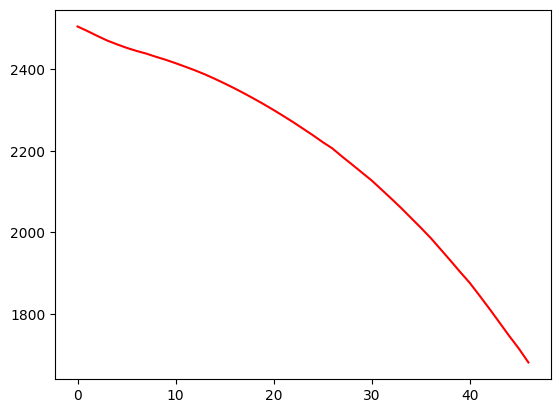

  9%|▉         | 47/500 [00:08<01:17,  5.83it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  54.10269399075162
Dataset Name:  weibo , AUC Score (contextual):  54.31723407490401
Dataset Name:  weibo , AUC Score (structural):  50.85011988368732
Dataset Name:  weibo , AUC Score (joint-type):  47.39822987361443
Dataset Name:  weibo , AUC Score (structure type):  50.45054714912506
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.39822987361443
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


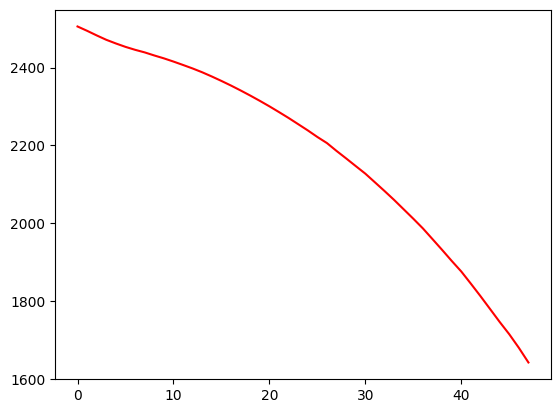

 10%|▉         | 48/500 [00:08<01:17,  5.80it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.27351823171586
Dataset Name:  weibo , AUC Score (contextual):  54.91987949404148
Dataset Name:  weibo , AUC Score (structural):  50.80517625452752
Dataset Name:  weibo , AUC Score (joint-type):  47.355158995136165
Dataset Name:  weibo , AUC Score (structure type):  50.41419322081562
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.355158995136165
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


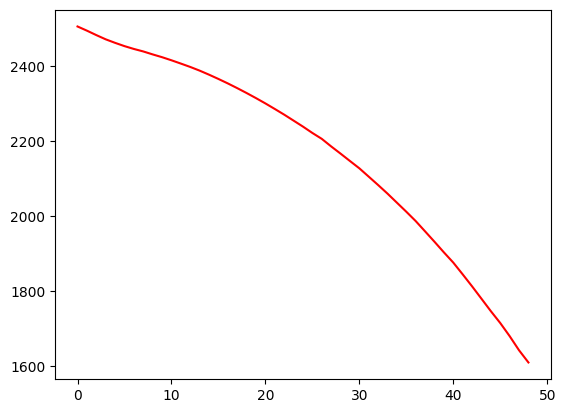

 10%|▉         | 49/500 [00:08<01:19,  5.65it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.00847126526036
Dataset Name:  weibo , AUC Score (contextual):  54.64214459443131
Dataset Name:  weibo , AUC Score (structural):  50.95793584663957
Dataset Name:  weibo , AUC Score (joint-type):  47.572392318467806
Dataset Name:  weibo , AUC Score (structure type):  50.59846393970615
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.572392318467806
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


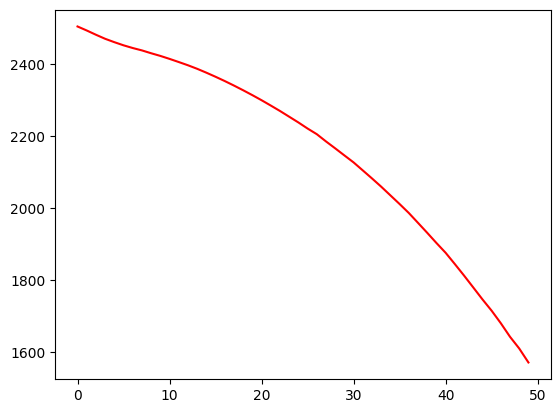

 10%|█         | 50/500 [00:09<01:18,  5.74it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  56.7605649303681
Dataset Name:  weibo , AUC Score (contextual):  55.522062407101316
Dataset Name:  weibo , AUC Score (structural):  50.664399362887636
Dataset Name:  weibo , AUC Score (joint-type):  47.729962357786604
Dataset Name:  weibo , AUC Score (structure type):  50.33075181131553
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.729962357786604
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


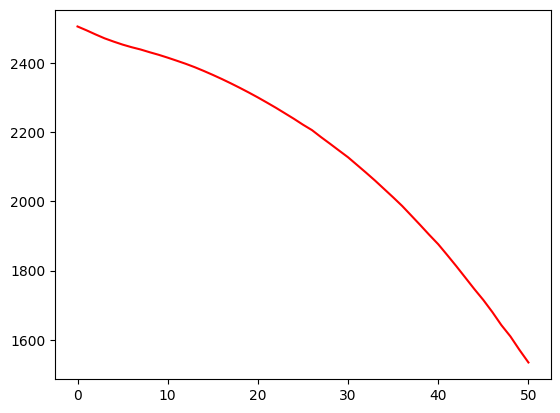

 10%|█         | 51/500 [00:09<01:17,  5.78it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.08554907922757
Dataset Name:  weibo , AUC Score (contextual):  56.7289720166479
Dataset Name:  weibo , AUC Score (structural):  50.954789962646174
Dataset Name:  weibo , AUC Score (joint-type):  47.80029218821454
Dataset Name:  weibo , AUC Score (structure type):  50.605819044148625
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.80029218821454
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


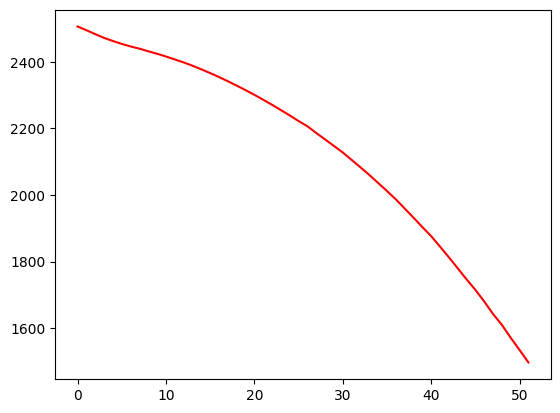

 10%|█         | 52/500 [00:09<01:17,  5.79it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.74920530299371
Dataset Name:  weibo , AUC Score (contextual):  56.83844142389434
Dataset Name:  weibo , AUC Score (structural):  50.99386127501828
Dataset Name:  weibo , AUC Score (joint-type):  47.738258560553895
Dataset Name:  weibo , AUC Score (structure type):  50.64208181701959
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.738258560553895
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


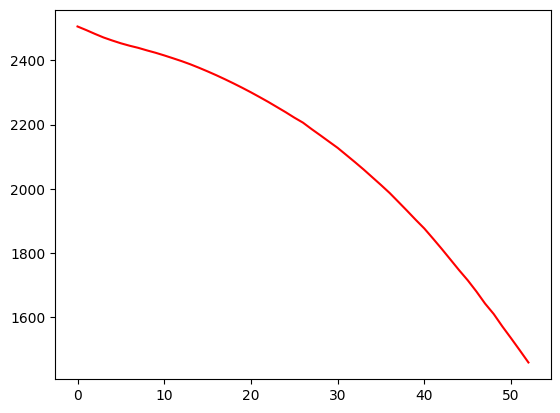

 11%|█         | 53/500 [00:09<01:16,  5.82it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.0383906369132
Dataset Name:  weibo , AUC Score (contextual):  56.92594179245386
Dataset Name:  weibo , AUC Score (structural):  50.75148933516985
Dataset Name:  weibo , AUC Score (joint-type):  47.860562511454255
Dataset Name:  weibo , AUC Score (structure type):  50.40535399189036
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.860562511454255
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


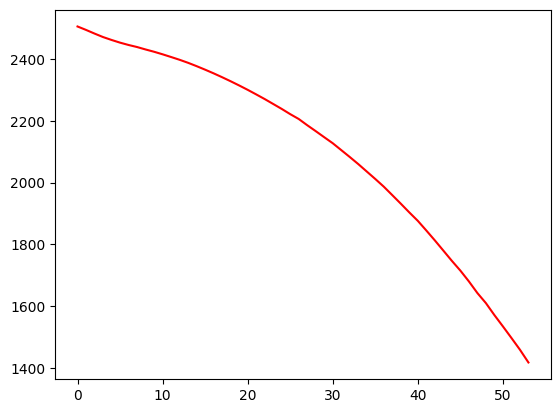

 11%|█         | 54/500 [00:09<01:16,  5.86it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.89562581892464
Dataset Name:  weibo , AUC Score (contextual):  56.84624621395415
Dataset Name:  weibo , AUC Score (structural):  50.83641119821337
Dataset Name:  weibo , AUC Score (joint-type):  47.69998618263093
Dataset Name:  weibo , AUC Score (structure type):  50.466559171615835
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.69998618263093
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


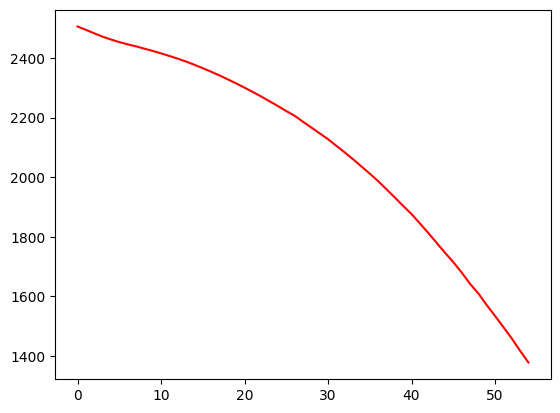

 11%|█         | 55/500 [00:09<01:15,  5.88it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.810253135224144
Dataset Name:  weibo , AUC Score (contextual):  56.09866295274286
Dataset Name:  weibo , AUC Score (structural):  50.64678241252458
Dataset Name:  weibo , AUC Score (joint-type):  47.69249936549947
Dataset Name:  weibo , AUC Score (structure type):  50.292551985376846
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.69249936549947
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


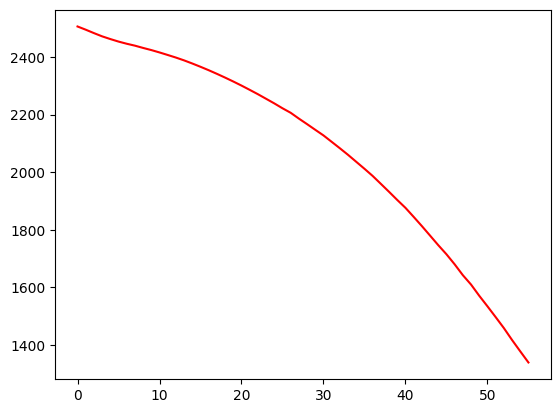

 11%|█         | 56/500 [00:10<01:15,  5.85it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.78674667340047
Dataset Name:  weibo , AUC Score (contextual):  56.50549486126841
Dataset Name:  weibo , AUC Score (structural):  50.70913893470732
Dataset Name:  weibo , AUC Score (joint-type):  47.673016296979775
Dataset Name:  weibo , AUC Score (structure type):  50.33177730999846
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.673016296979775
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


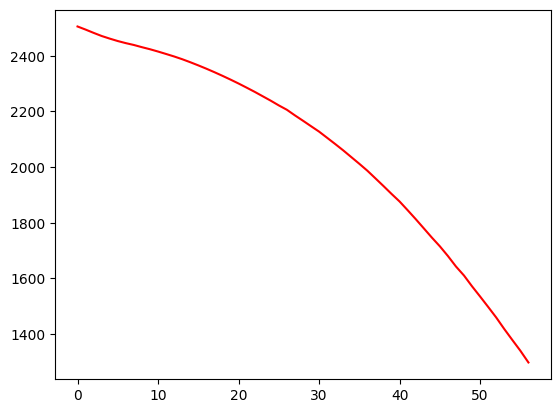

 11%|█▏        | 57/500 [00:10<01:16,  5.81it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.827742583592226
Dataset Name:  weibo , AUC Score (contextual):  56.75180825423034
Dataset Name:  weibo , AUC Score (structural):  50.96535276412673
Dataset Name:  weibo , AUC Score (joint-type):  47.83489342414641
Dataset Name:  weibo , AUC Score (structure type):  50.61441329283297
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.83489342414641
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


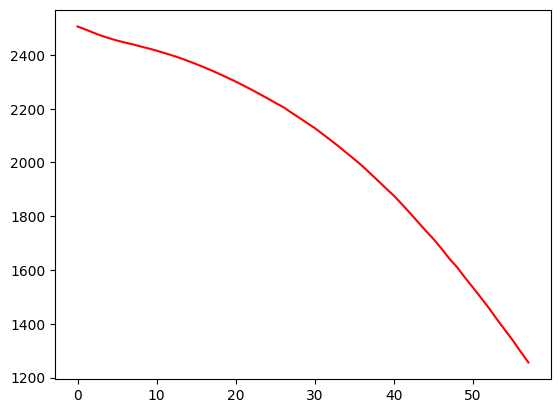

 12%|█▏        | 58/500 [00:10<01:16,  5.78it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  56.14363915283679
Dataset Name:  weibo , AUC Score (contextual):  56.43149388884938
Dataset Name:  weibo , AUC Score (structural):  50.77850425969698
Dataset Name:  weibo , AUC Score (joint-type):  47.96705453582601
Dataset Name:  weibo , AUC Score (structure type):  50.4367969209516
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.96705453582601
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


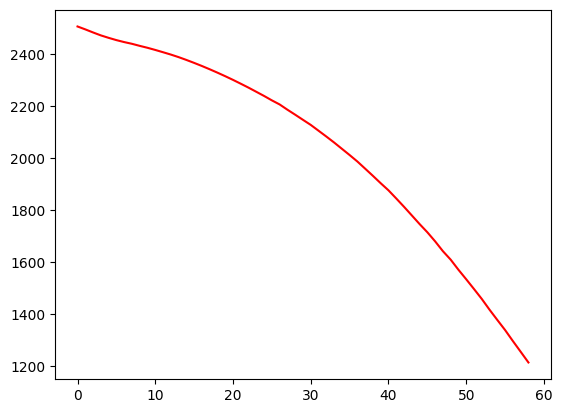

 12%|█▏        | 59/500 [00:10<01:17,  5.71it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.56125663317495
Dataset Name:  weibo , AUC Score (contextual):  56.47095143859625
Dataset Name:  weibo , AUC Score (structural):  50.495989706440845
Dataset Name:  weibo , AUC Score (joint-type):  47.887257784121815
Dataset Name:  weibo , AUC Score (structure type):  50.16008034440348
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.887257784121815
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


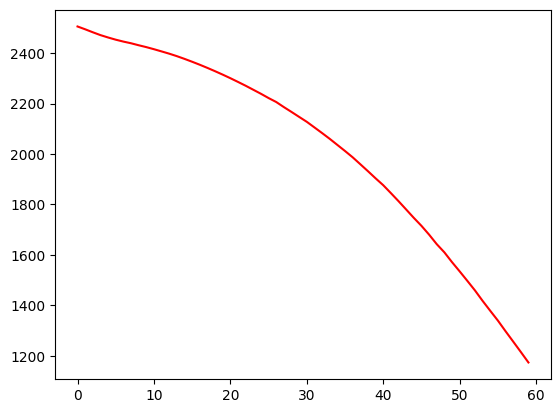

 12%|█▏        | 60/500 [00:10<01:18,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.91225652373024
Dataset Name:  weibo , AUC Score (contextual):  56.24050778542261
Dataset Name:  weibo , AUC Score (structural):  50.718760805119565
Dataset Name:  weibo , AUC Score (joint-type):  47.959278652396044
Dataset Name:  weibo , AUC Score (structure type):  50.401474188539986
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.959278652396044
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


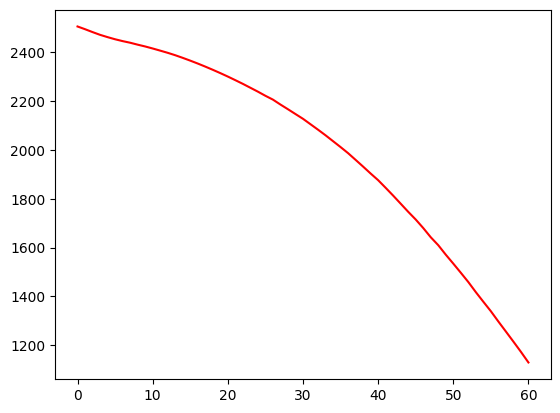

 12%|█▏        | 61/500 [00:11<01:19,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.06072500090185
Dataset Name:  weibo , AUC Score (contextual):  55.77378133984542
Dataset Name:  weibo , AUC Score (structural):  50.841413437175845
Dataset Name:  weibo , AUC Score (joint-type):  47.94199248774504
Dataset Name:  weibo , AUC Score (structure type):  50.51337603509849
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.94199248774504
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


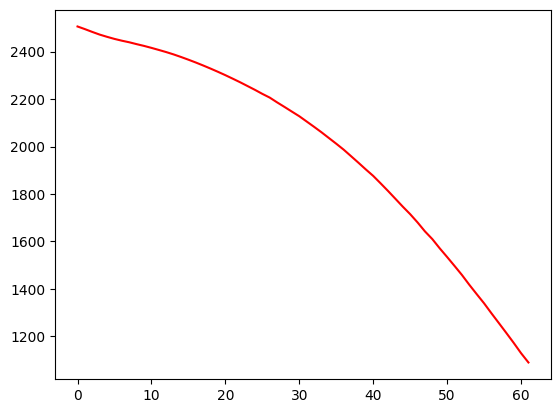

 12%|█▏        | 62/500 [00:11<01:18,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.90652198768716
Dataset Name:  weibo , AUC Score (contextual):  56.68003309230984
Dataset Name:  weibo , AUC Score (structural):  50.5486988510438
Dataset Name:  weibo , AUC Score (joint-type):  47.93175954077771
Dataset Name:  weibo , AUC Score (structure type):  50.19020721682163
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.93175954077771
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


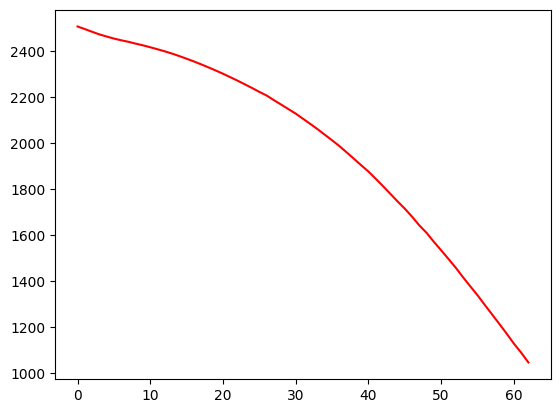

 13%|█▎        | 63/500 [00:11<01:19,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.650549760964175
Dataset Name:  weibo , AUC Score (contextual):  56.86197142059319
Dataset Name:  weibo , AUC Score (structural):  50.541792076906944
Dataset Name:  weibo , AUC Score (joint-type):  47.973067114835054
Dataset Name:  weibo , AUC Score (structure type):  50.18618498309865
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.973067114835054
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


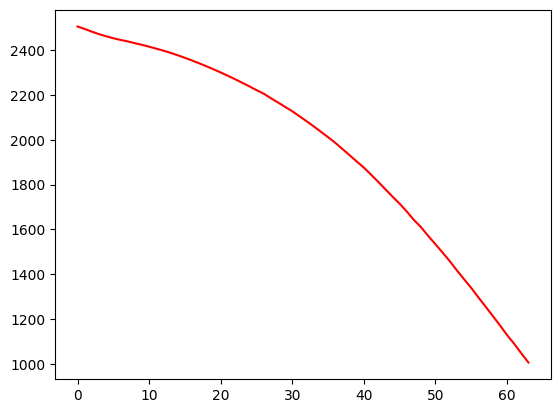

 13%|█▎        | 64/500 [00:11<01:20,  5.44it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  54.80790160247846
Dataset Name:  weibo , AUC Score (contextual):  55.468642955136325
Dataset Name:  weibo , AUC Score (structural):  50.843624058360405
Dataset Name:  weibo , AUC Score (joint-type):  48.12835353039561
Dataset Name:  weibo , AUC Score (structure type):  50.50496124868366
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.12835353039561
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


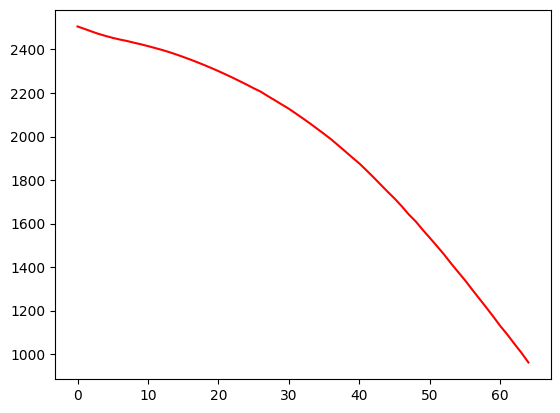

 13%|█▎        | 65/500 [00:11<01:19,  5.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  55.76605489722286
Dataset Name:  weibo , AUC Score (contextual):  56.82057712664631
Dataset Name:  weibo , AUC Score (structural):  50.84049517914534
Dataset Name:  weibo , AUC Score (joint-type):  48.126619132604546
Dataset Name:  weibo , AUC Score (structure type):  50.46776982978317
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.126619132604546
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


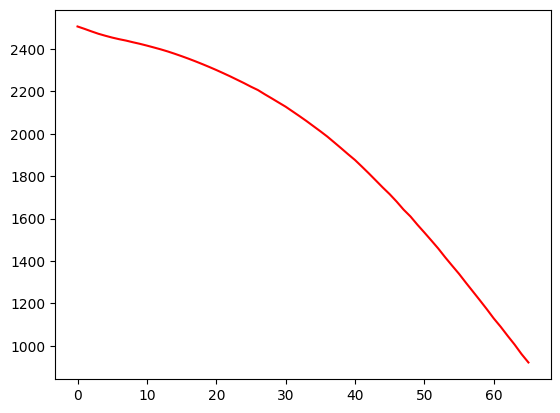

 13%|█▎        | 66/500 [00:11<01:19,  5.46it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.362294401383274
Dataset Name:  weibo , AUC Score (contextual):  58.08550234230421
Dataset Name:  weibo , AUC Score (structural):  50.57902120495859
Dataset Name:  weibo , AUC Score (joint-type):  48.07158090936788
Dataset Name:  weibo , AUC Score (structure type):  50.24012336521266
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.07158090936788
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


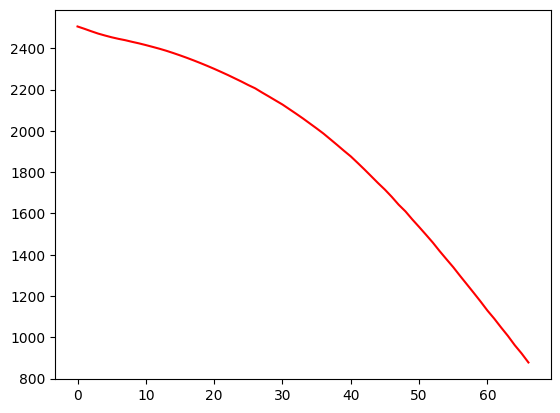

 13%|█▎        | 67/500 [00:12<01:19,  5.47it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.858250144142964
Dataset Name:  weibo , AUC Score (contextual):  59.841551199133725
Dataset Name:  weibo , AUC Score (structural):  50.85661004075478
Dataset Name:  weibo , AUC Score (joint-type):  48.11742682431187
Dataset Name:  weibo , AUC Score (structure type):  50.52745955034389
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.11742682431187
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


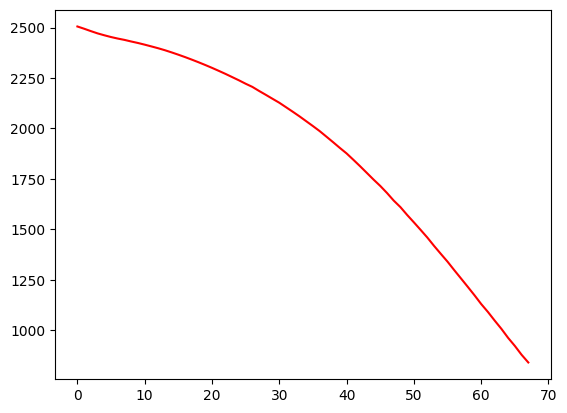

 14%|█▎        | 68/500 [00:12<01:17,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.23663780954053
Dataset Name:  weibo , AUC Score (contextual):  64.22370956468349
Dataset Name:  weibo , AUC Score (structural):  50.90115689175325
Dataset Name:  weibo , AUC Score (joint-type):  47.895857506502544
Dataset Name:  weibo , AUC Score (structure type):  50.52775580551896
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.895857506502544
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


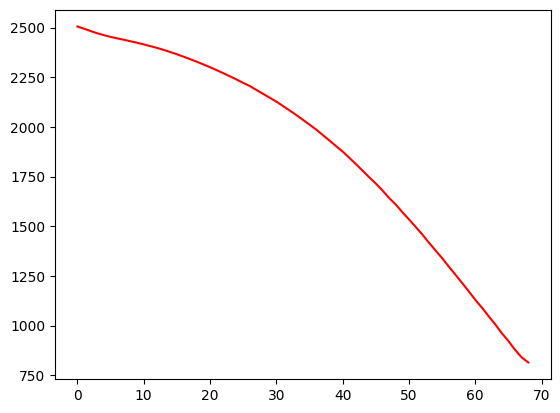

 14%|█▍        | 69/500 [00:12<01:16,  5.61it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.558979388320225
Dataset Name:  weibo , AUC Score (contextual):  62.309772695606824
Dataset Name:  weibo , AUC Score (structural):  50.841569314310654
Dataset Name:  weibo , AUC Score (joint-type):  48.06906603257083
Dataset Name:  weibo , AUC Score (structure type):  50.52616343395299
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.06906603257083
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


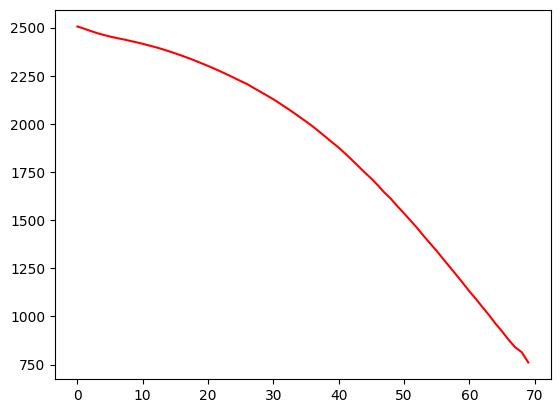

 14%|█▍        | 70/500 [00:12<01:45,  4.08it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.80373200352914
Dataset Name:  weibo , AUC Score (contextual):  63.36003727798985
Dataset Name:  weibo , AUC Score (structural):  50.790637169044494
Dataset Name:  weibo , AUC Score (joint-type):  48.15708672046768
Dataset Name:  weibo , AUC Score (structure type):  50.52716899238374
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.15708672046768
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


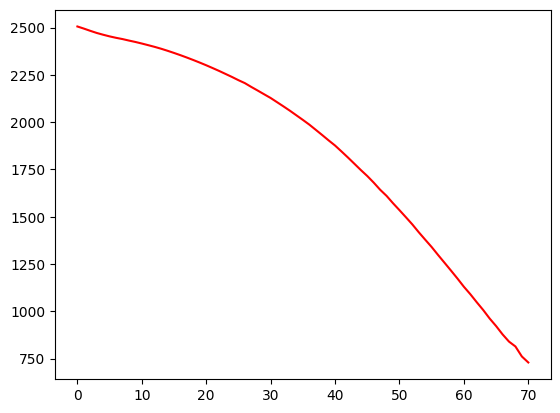

 14%|█▍        | 71/500 [00:13<01:36,  4.43it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.14474827410581
Dataset Name:  weibo , AUC Score (contextual):  64.20379289671602
Dataset Name:  weibo , AUC Score (structural):  50.94849819465937
Dataset Name:  weibo , AUC Score (joint-type):  48.19443408623542
Dataset Name:  weibo , AUC Score (structure type):  50.63355878352156
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.19443408623542
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


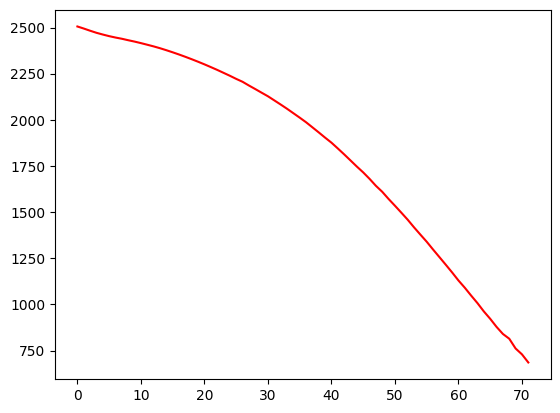

 14%|█▍        | 72/500 [00:13<01:31,  4.69it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.27236508799294
Dataset Name:  weibo , AUC Score (contextual):  64.71093081082518
Dataset Name:  weibo , AUC Score (structural):  50.90943821880616
Dataset Name:  weibo , AUC Score (joint-type):  48.390247596847324
Dataset Name:  weibo , AUC Score (structure type):  50.55435610191087
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.390247596847324
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


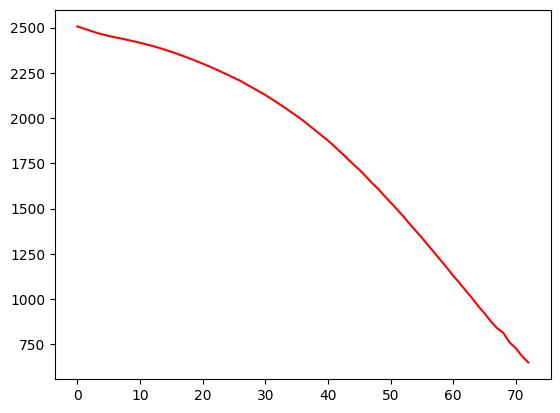

 15%|█▍        | 73/500 [00:13<01:27,  4.88it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.33406775422509
Dataset Name:  weibo , AUC Score (contextual):  64.219922796173
Dataset Name:  weibo , AUC Score (structural):  51.05610726614178
Dataset Name:  weibo , AUC Score (joint-type):  48.721575388201586
Dataset Name:  weibo , AUC Score (structure type):  50.704001997215656
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.721575388201586
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


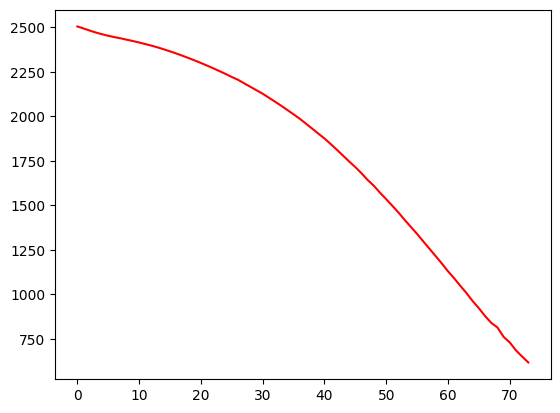

 15%|█▍        | 74/500 [00:13<01:25,  4.99it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.78980439967741
Dataset Name:  weibo , AUC Score (contextual):  63.64418944942698
Dataset Name:  weibo , AUC Score (structural):  51.136670237670124
Dataset Name:  weibo , AUC Score (joint-type):  48.79843811697588
Dataset Name:  weibo , AUC Score (structure type):  50.791693529034944
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.79843811697588
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


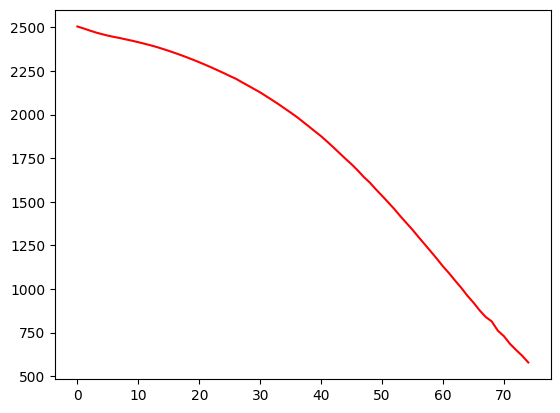

 15%|█▌        | 75/500 [00:13<01:23,  5.07it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.17595102257435
Dataset Name:  weibo , AUC Score (contextual):  63.68066961629918
Dataset Name:  weibo , AUC Score (structural):  51.03911665844769
Dataset Name:  weibo , AUC Score (joint-type):  48.869548426409786
Dataset Name:  weibo , AUC Score (structure type):  50.73272450615971
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.869548426409786
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


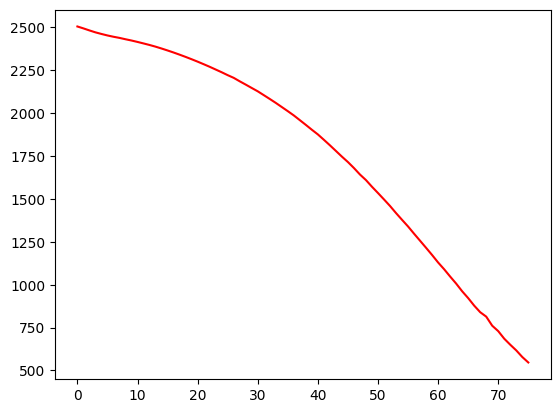

 15%|█▌        | 76/500 [00:13<01:21,  5.19it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.17164293632212
Dataset Name:  weibo , AUC Score (contextual):  63.199576575685946
Dataset Name:  weibo , AUC Score (structural):  50.88407275777826
Dataset Name:  weibo , AUC Score (joint-type):  48.93510866291228
Dataset Name:  weibo , AUC Score (structure type):  50.593581426532474
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.93510866291228
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


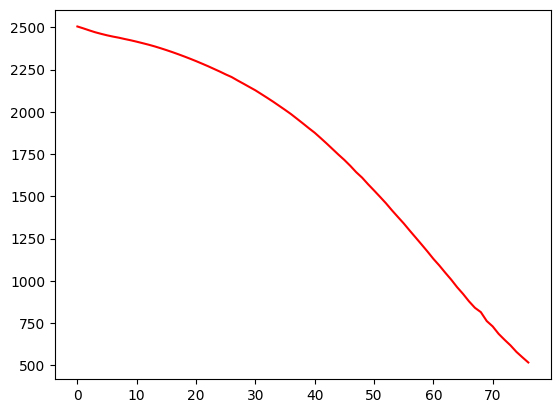

 15%|█▌        | 77/500 [00:14<01:20,  5.26it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.48188139739498
Dataset Name:  weibo , AUC Score (contextual):  62.7049841389322
Dataset Name:  weibo , AUC Score (structural):  50.80379886748177
Dataset Name:  weibo , AUC Score (joint-type):  48.99387584139973
Dataset Name:  weibo , AUC Score (structure type):  50.51533017981094
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.99387584139973
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


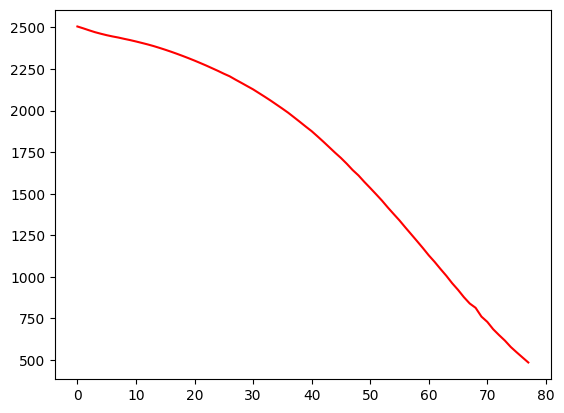

 16%|█▌        | 78/500 [00:14<01:19,  5.29it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.128815202909884
Dataset Name:  weibo , AUC Score (contextual):  62.52096453329956
Dataset Name:  weibo , AUC Score (structural):  50.735419819635986
Dataset Name:  weibo , AUC Score (joint-type):  49.079121492830865
Dataset Name:  weibo , AUC Score (structure type):  50.42621149565794
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.079121492830865
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


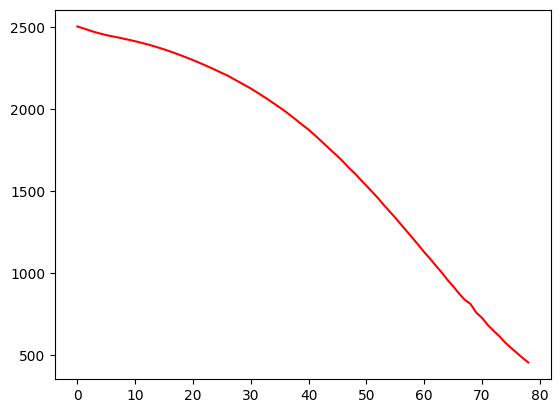

 16%|█▌        | 79/500 [00:14<01:17,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.50667704455256
Dataset Name:  weibo , AUC Score (contextual):  62.64141845988945
Dataset Name:  weibo , AUC Score (structural):  50.56886651815826
Dataset Name:  weibo , AUC Score (joint-type):  49.00607443919693
Dataset Name:  weibo , AUC Score (structure type):  50.25836299873134
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.00607443919693
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


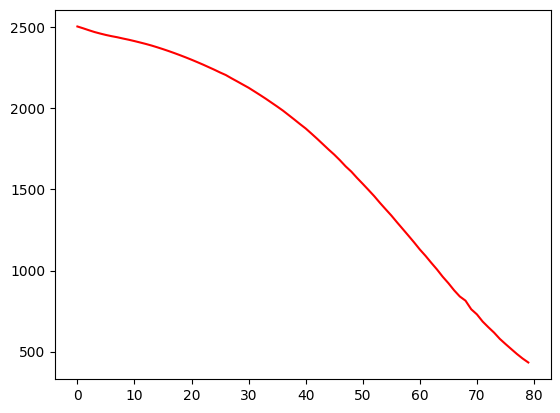

 16%|█▌        | 80/500 [00:14<01:16,  5.51it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.2943475780619
Dataset Name:  weibo , AUC Score (contextual):  62.21299329886507
Dataset Name:  weibo , AUC Score (structural):  50.60882207900419
Dataset Name:  weibo , AUC Score (joint-type):  48.43175751731362
Dataset Name:  weibo , AUC Score (structure type):  50.284097318457675
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.43175751731362
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


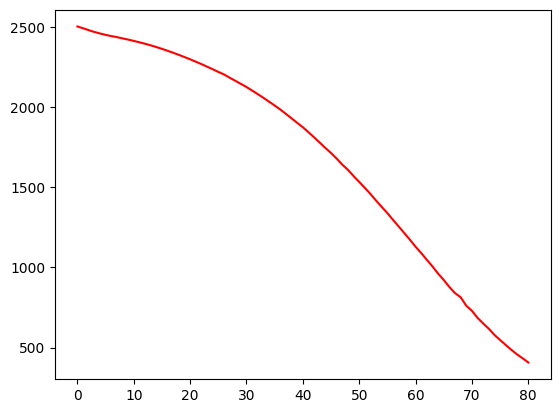

 16%|█▌        | 81/500 [00:14<01:14,  5.63it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.23488913984405
Dataset Name:  weibo , AUC Score (contextual):  61.63772245819668
Dataset Name:  weibo , AUC Score (structural):  50.66162758401778
Dataset Name:  weibo , AUC Score (joint-type):  48.0756567441769
Dataset Name:  weibo , AUC Score (structure type):  50.31689618466633
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.0756567441769
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


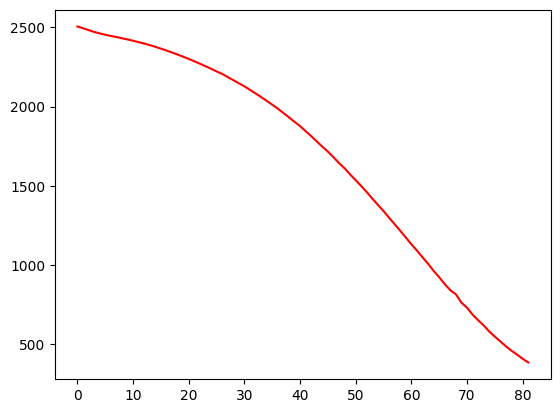

 16%|█▋        | 82/500 [00:15<01:15,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.72230024658689
Dataset Name:  weibo , AUC Score (contextual):  62.14720180932378
Dataset Name:  weibo , AUC Score (structural):  50.899717153853565
Dataset Name:  weibo , AUC Score (joint-type):  47.64032289861809
Dataset Name:  weibo , AUC Score (structure type):  50.460044406371864
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.64032289861809
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


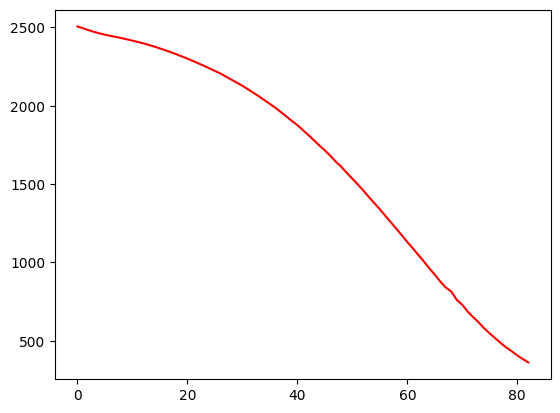

 17%|█▋        | 83/500 [00:15<01:12,  5.76it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.30807646944811
Dataset Name:  weibo , AUC Score (contextual):  61.869351283194206
Dataset Name:  weibo , AUC Score (structural):  50.60978568311029
Dataset Name:  weibo , AUC Score (joint-type):  47.429304500704454
Dataset Name:  weibo , AUC Score (structure type):  50.17777019668381
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.429304500704454
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


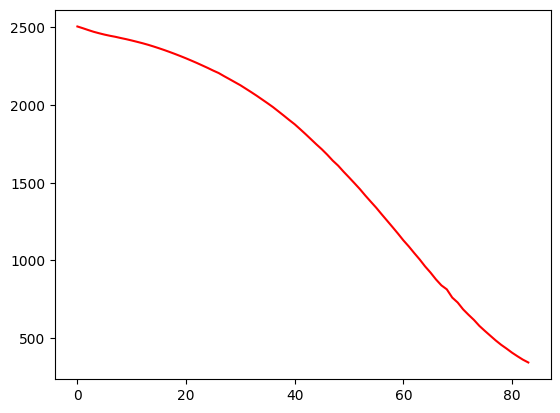

 17%|█▋        | 84/500 [00:15<01:11,  5.82it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.82190349422114
Dataset Name:  weibo , AUC Score (contextual):  60.89068842295256
Dataset Name:  weibo , AUC Score (structural):  50.624690371327674
Dataset Name:  weibo , AUC Score (joint-type):  47.83469107773744
Dataset Name:  weibo , AUC Score (structure type):  50.1972575202667
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.83469107773744
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


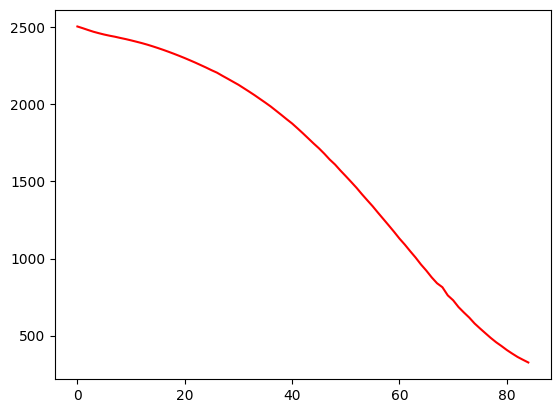

 17%|█▋        | 85/500 [00:15<01:10,  5.89it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.51753469366792
Dataset Name:  weibo , AUC Score (contextual):  60.909130852797624
Dataset Name:  weibo , AUC Score (structural):  50.48976028930796
Dataset Name:  weibo , AUC Score (joint-type):  48.0951398126966
Dataset Name:  weibo , AUC Score (structure type):  50.098464965204826
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.0951398126966
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


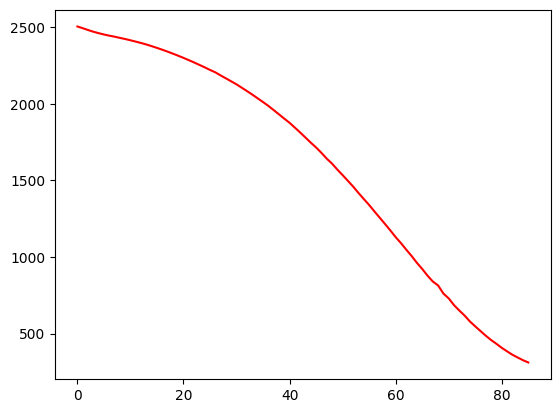

 17%|█▋        | 86/500 [00:15<01:09,  5.99it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.85423003810999
Dataset Name:  weibo , AUC Score (contextual):  61.72773770355327
Dataset Name:  weibo , AUC Score (structural):  50.307894184932636
Dataset Name:  weibo , AUC Score (joint-type):  48.22689623155829
Dataset Name:  weibo , AUC Score (structure type):  49.94203653555552
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.22689623155829
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


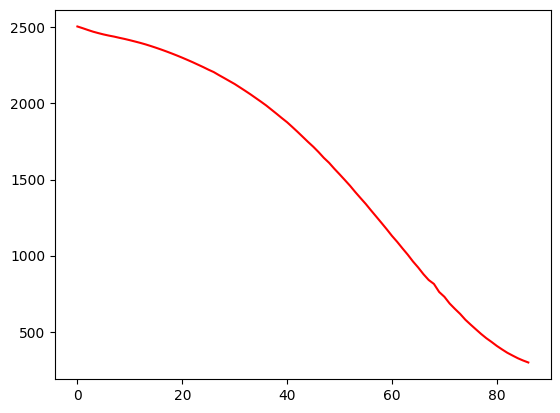

 17%|█▋        | 87/500 [00:15<01:10,  5.85it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  57.48783726855348
Dataset Name:  weibo , AUC Score (contextual):  61.14015263856827
Dataset Name:  weibo , AUC Score (structural):  50.246076147397424
Dataset Name:  weibo , AUC Score (joint-type):  48.54495587981086
Dataset Name:  weibo , AUC Score (structure type):  49.89382100581366
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.54495587981086
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


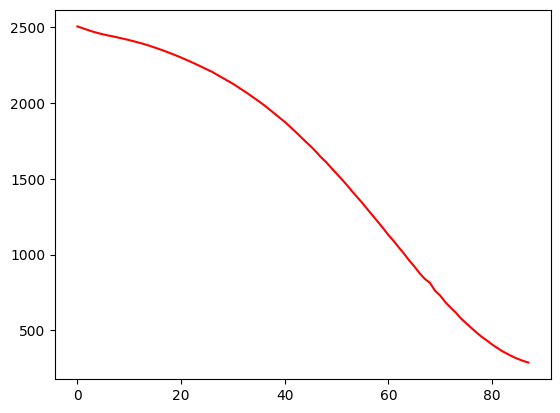

 18%|█▊        | 88/500 [00:16<01:09,  5.94it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.49139636166647
Dataset Name:  weibo , AUC Score (contextual):  61.83602193897579
Dataset Name:  weibo , AUC Score (structural):  50.19083895908083
Dataset Name:  weibo , AUC Score (joint-type):  48.423201154877674
Dataset Name:  weibo , AUC Score (structure type):  49.87875756960458
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.423201154877674
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


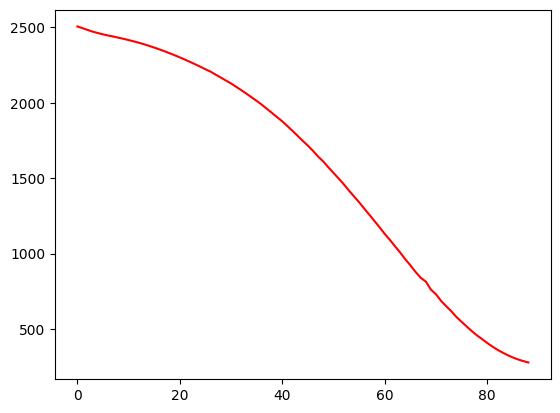

 18%|█▊        | 89/500 [00:16<01:09,  5.90it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.132914182506084
Dataset Name:  weibo , AUC Score (contextual):  63.29788802380981
Dataset Name:  weibo , AUC Score (structural):  50.13756298853311
Dataset Name:  weibo , AUC Score (joint-type):  48.43193095709273
Dataset Name:  weibo , AUC Score (structure type):  49.86780182534208
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.43193095709273
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


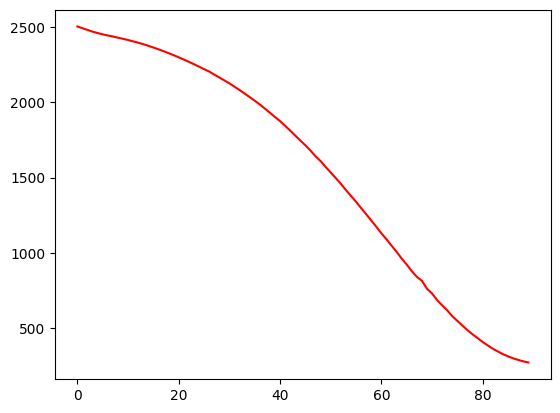

 18%|█▊        | 90/500 [00:16<01:08,  5.96it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.91215747320897
Dataset Name:  weibo , AUC Score (contextual):  63.808379106981704
Dataset Name:  weibo , AUC Score (structural):  50.14376406436875
Dataset Name:  weibo , AUC Score (joint-type):  48.31075436475657
Dataset Name:  weibo , AUC Score (structure type):  49.865705250257
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.31075436475657
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


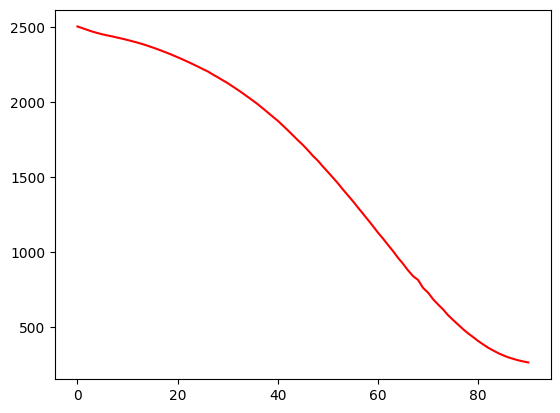

 18%|█▊        | 91/500 [00:16<01:09,  5.85it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.75134558910298
Dataset Name:  weibo , AUC Score (contextual):  63.986068160676915
Dataset Name:  weibo , AUC Score (structural):  50.0951785785139
Dataset Name:  weibo , AUC Score (joint-type):  48.356686999590096
Dataset Name:  weibo , AUC Score (structure type):  49.82239787115589
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.356686999590096
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


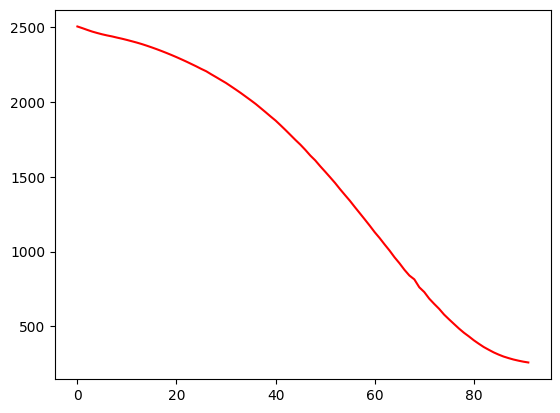

 18%|█▊        | 92/500 [00:16<01:09,  5.86it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.106054982822066
Dataset Name:  weibo , AUC Score (contextual):  64.68514609699794
Dataset Name:  weibo , AUC Score (structural):  49.84344834231752
Dataset Name:  weibo , AUC Score (joint-type):  48.49324191900709
Dataset Name:  weibo , AUC Score (structure type):  49.62588098882685
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.49324191900709
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


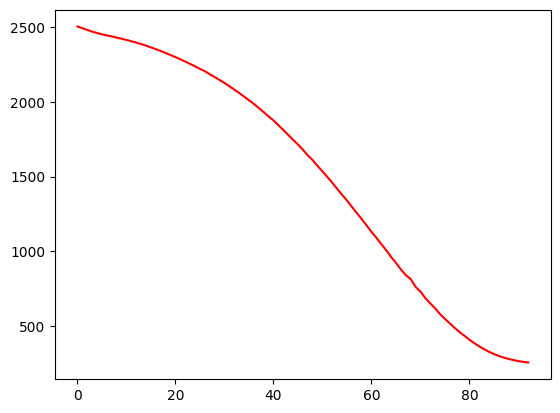

 19%|█▊        | 93/500 [00:16<01:08,  5.91it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.052769470917355
Dataset Name:  weibo , AUC Score (contextual):  64.58299006710385
Dataset Name:  weibo , AUC Score (structural):  50.03059159623854
Dataset Name:  weibo , AUC Score (joint-type):  48.42597619134339
Dataset Name:  weibo , AUC Score (structure type):  49.77525056920874
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.42597619134339
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


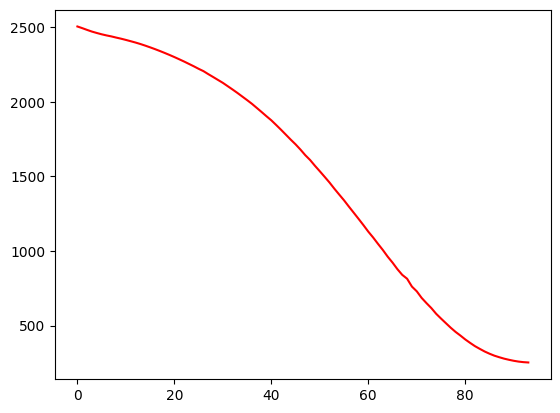

 19%|█▉        | 94/500 [00:17<01:07,  6.00it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.92499735559566
Dataset Name:  weibo , AUC Score (contextual):  64.86084059323343
Dataset Name:  weibo , AUC Score (structural):  49.88084184989315
Dataset Name:  weibo , AUC Score (joint-type):  48.44433190129889
Dataset Name:  weibo , AUC Score (structure type):  49.61873098412096
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.44433190129889
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


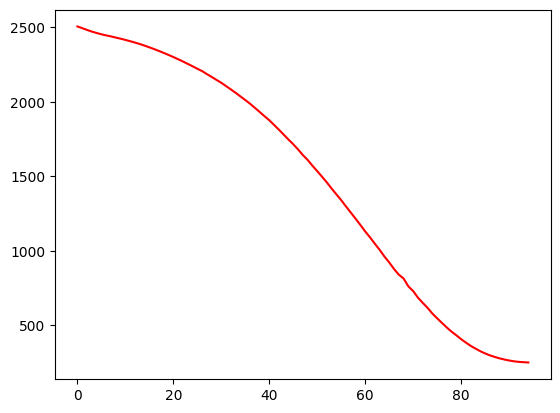

 19%|█▉        | 95/500 [00:17<01:08,  5.88it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.36430476011125
Dataset Name:  weibo , AUC Score (contextual):  64.98057185407701
Dataset Name:  weibo , AUC Score (structural):  49.72666519291921
Dataset Name:  weibo , AUC Score (joint-type):  49.11230630390002
Dataset Name:  weibo , AUC Score (structure type):  49.55066635764973
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.11230630390002
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


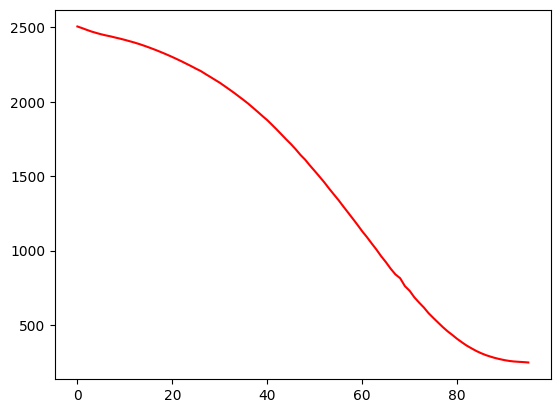

 19%|█▉        | 96/500 [00:17<01:07,  5.97it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.43903593271657
Dataset Name:  weibo , AUC Score (contextual):  64.82002443188355
Dataset Name:  weibo , AUC Score (structural):  49.733118506300265
Dataset Name:  weibo , AUC Score (joint-type):  49.07634645636516
Dataset Name:  weibo , AUC Score (structure type):  49.55120474445826
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.07634645636516
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


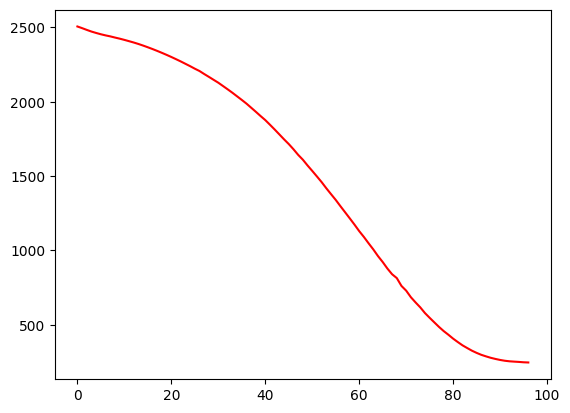

 19%|█▉        | 97/500 [00:17<01:09,  5.81it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.711149725868516
Dataset Name:  weibo , AUC Score (contextual):  65.44076540130786
Dataset Name:  weibo , AUC Score (structural):  49.777798561395755
Dataset Name:  weibo , AUC Score (joint-type):  49.17387742548305
Dataset Name:  weibo , AUC Score (structure type):  49.617893493529905
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.17387742548305
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


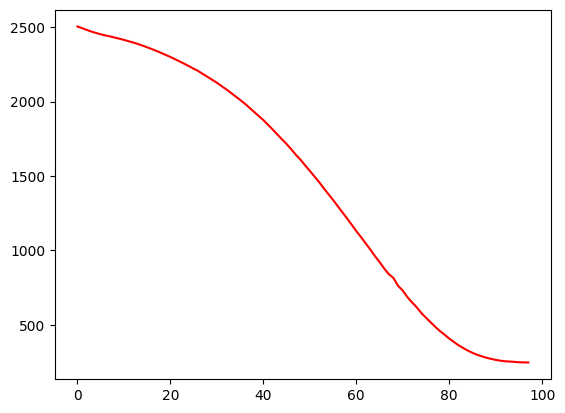

 20%|█▉        | 98/500 [00:17<01:10,  5.72it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.502208765481996
Dataset Name:  weibo , AUC Score (contextual):  66.02638481546296
Dataset Name:  weibo , AUC Score (structural):  49.92441376026664
Dataset Name:  weibo , AUC Score (joint-type):  49.45140997868425
Dataset Name:  weibo , AUC Score (structure type):  49.80943955585424
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.45140997868425
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


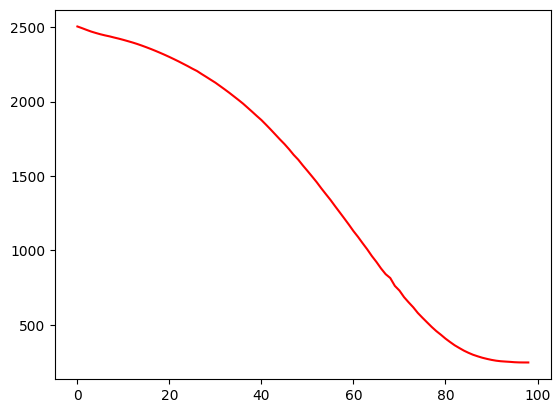

 20%|█▉        | 99/500 [00:17<01:10,  5.68it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.964232979054486
Dataset Name:  weibo , AUC Score (contextual):  66.06003213260975
Dataset Name:  weibo , AUC Score (structural):  49.89785796475476
Dataset Name:  weibo , AUC Score (joint-type):  48.812515645713404
Dataset Name:  weibo , AUC Score (structure type):  49.70622311341856
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.812515645713404
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


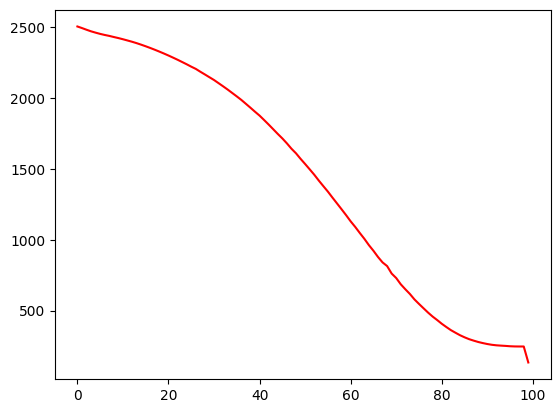

 20%|██        | 100/500 [00:18<01:09,  5.77it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.024305285935
Dataset Name:  weibo , AUC Score (contextual):  66.13675032823478
Dataset Name:  weibo , AUC Score (structural):  49.86488003128879
Dataset Name:  weibo , AUC Score (joint-type):  48.74123189650039
Dataset Name:  weibo , AUC Score (structure type):  49.687080471337424
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.74123189650039
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


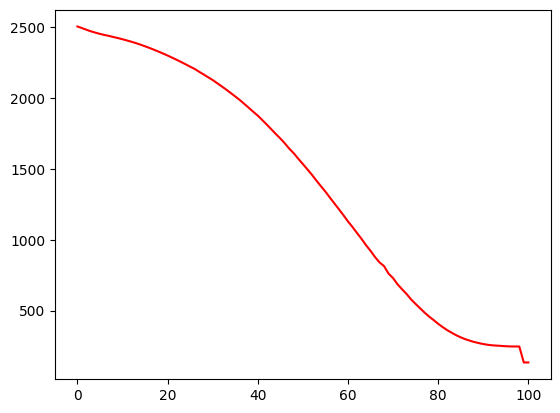

 20%|██        | 101/500 [00:18<01:07,  5.91it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.155585440551654
Dataset Name:  weibo , AUC Score (contextual):  66.20066288683574
Dataset Name:  weibo , AUC Score (structural):  49.92601220943085
Dataset Name:  weibo , AUC Score (joint-type):  49.15104118790061
Dataset Name:  weibo , AUC Score (structure type):  49.79943524648088
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.15104118790061
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


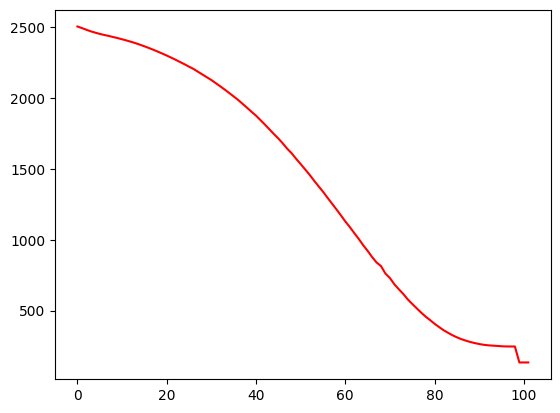

 20%|██        | 102/500 [00:18<01:08,  5.80it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.34226815910937
Dataset Name:  weibo , AUC Score (contextual):  66.35016797642606
Dataset Name:  weibo , AUC Score (structural):  49.9366458641545
Dataset Name:  weibo , AUC Score (joint-type):  49.342272997681114
Dataset Name:  weibo , AUC Score (structure type):  49.80214142356081
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.342272997681114
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


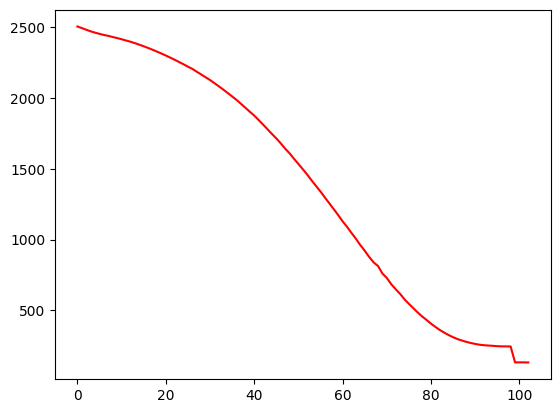

 21%|██        | 103/500 [00:18<01:08,  5.82it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.03809287392642
Dataset Name:  weibo , AUC Score (contextual):  66.22190925977637
Dataset Name:  weibo , AUC Score (structural):  49.89933171221113
Dataset Name:  weibo , AUC Score (joint-type):  49.06729868122173
Dataset Name:  weibo , AUC Score (structure type):  49.74395007052013
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.06729868122173
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


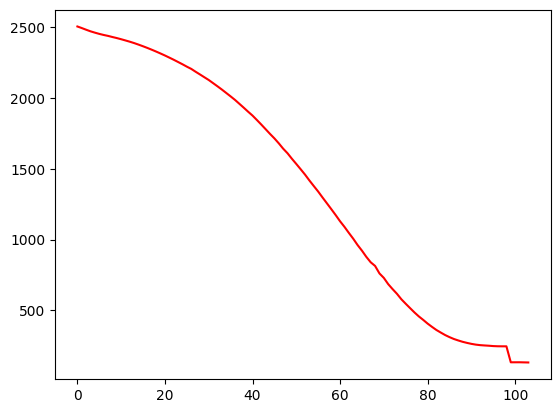

 21%|██        | 104/500 [00:18<01:07,  5.85it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.198423262442915
Dataset Name:  weibo , AUC Score (contextual):  66.06295170222471
Dataset Name:  weibo , AUC Score (structural):  49.841779039910215
Dataset Name:  weibo , AUC Score (joint-type):  49.22431949457335
Dataset Name:  weibo , AUC Score (structure type):  49.686804156414524
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.22431949457335
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


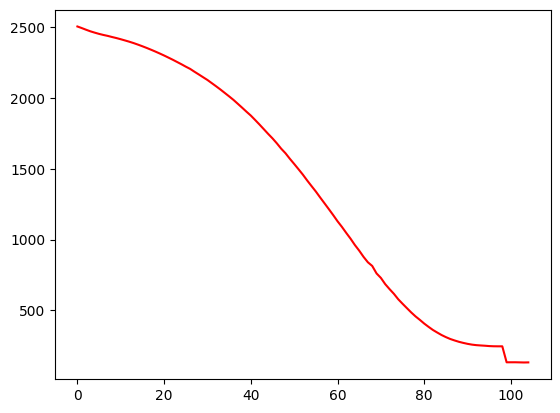

 21%|██        | 105/500 [00:18<01:06,  5.90it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.1799277175764
Dataset Name:  weibo , AUC Score (contextual):  65.7904489026176
Dataset Name:  weibo , AUC Score (structural):  49.987206738426835
Dataset Name:  weibo , AUC Score (joint-type):  49.554201954435065
Dataset Name:  weibo , AUC Score (structure type):  49.83829594934856
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.554201954435065
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


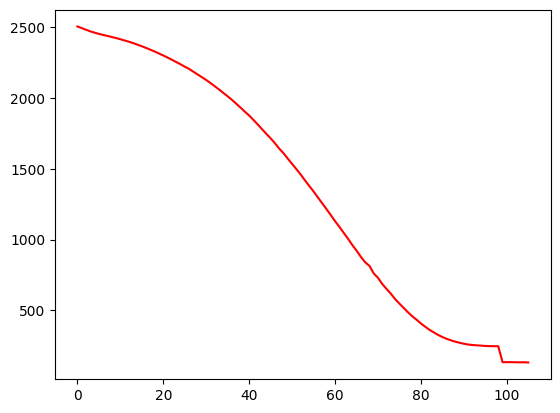

 21%|██        | 106/500 [00:19<01:07,  5.87it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.01826748409842
Dataset Name:  weibo , AUC Score (contextual):  65.61527472571944
Dataset Name:  weibo , AUC Score (structural):  49.936900935829634
Dataset Name:  weibo , AUC Score (joint-type):  49.564781780960594
Dataset Name:  weibo , AUC Score (structure type):  49.77650965370277
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.564781780960594
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


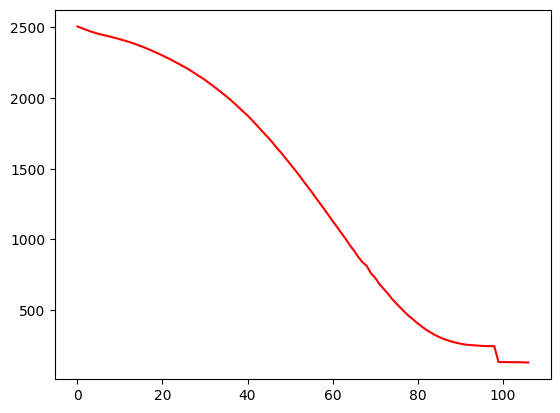

 21%|██▏       | 107/500 [00:19<01:07,  5.86it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.85503283647065
Dataset Name:  weibo , AUC Score (contextual):  65.6048105257133
Dataset Name:  weibo , AUC Score (structural):  49.82953276537374
Dataset Name:  weibo , AUC Score (joint-type):  49.62152549535846
Dataset Name:  weibo , AUC Score (structure type):  49.69718733057907
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.62152549535846
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


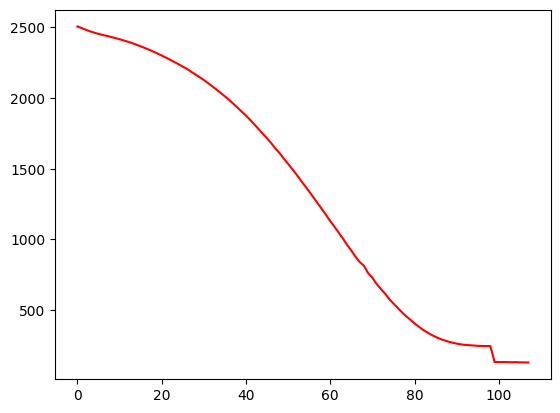

 22%|██▏       | 108/500 [00:19<01:06,  5.86it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.332098055124675
Dataset Name:  weibo , AUC Score (contextual):  65.38977410625037
Dataset Name:  weibo , AUC Score (structural):  49.69713072706764
Dataset Name:  weibo , AUC Score (joint-type):  49.45178576487231
Dataset Name:  weibo , AUC Score (structure type):  49.56597762270719
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.45178576487231
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


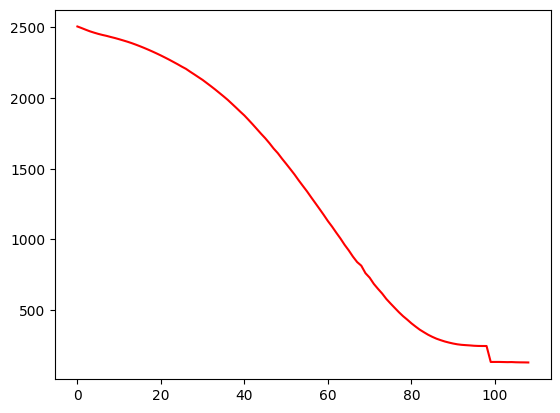

 22%|██▏       | 109/500 [00:19<01:07,  5.83it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.08123121020783
Dataset Name:  weibo , AUC Score (contextual):  65.17757053651283
Dataset Name:  weibo , AUC Score (structural):  49.67456822033658
Dataset Name:  weibo , AUC Score (joint-type):  49.327371629992825
Dataset Name:  weibo , AUC Score (structure type):  49.50678071123575
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.327371629992825
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


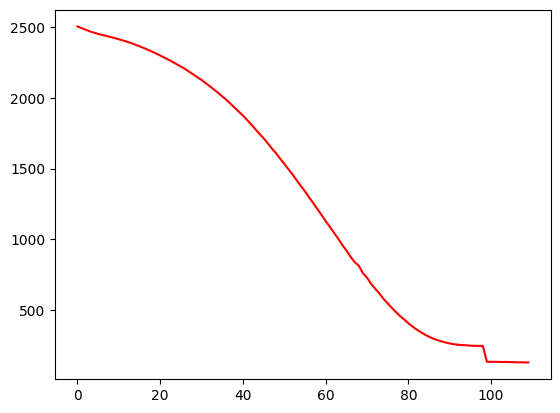

 22%|██▏       | 110/500 [00:19<01:07,  5.80it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.10811089256136
Dataset Name:  weibo , AUC Score (contextual):  64.94082523803165
Dataset Name:  weibo , AUC Score (structural):  49.603153819556624
Dataset Name:  weibo , AUC Score (joint-type):  49.30391389986859
Dataset Name:  weibo , AUC Score (structure type):  49.4334774956593
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.30391389986859
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


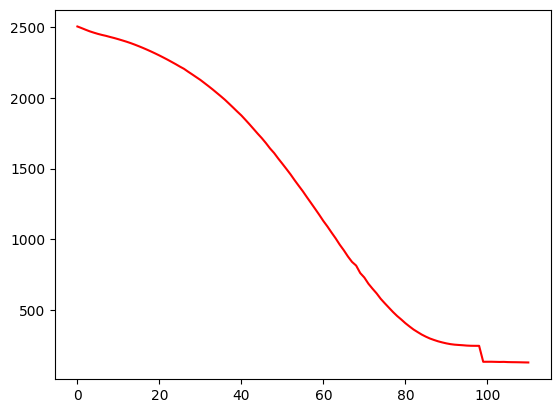

 22%|██▏       | 111/500 [00:19<01:06,  5.84it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.45435207813495
Dataset Name:  weibo , AUC Score (contextual):  65.2365689680391
Dataset Name:  weibo , AUC Score (structural):  49.623519875751754
Dataset Name:  weibo , AUC Score (joint-type):  48.89984257449383
Dataset Name:  weibo , AUC Score (structure type):  49.40455558419355
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.89984257449383
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


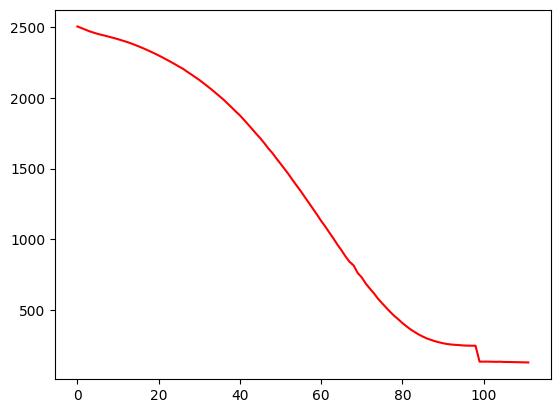

 22%|██▏       | 112/500 [00:20<01:06,  5.88it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.20854475830145
Dataset Name:  weibo , AUC Score (contextual):  65.24344874594368
Dataset Name:  weibo , AUC Score (structural):  49.66835864211177
Dataset Name:  weibo , AUC Score (joint-type):  48.54001284610631
Dataset Name:  weibo , AUC Score (structure type):  49.44076993073782
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.54001284610631
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


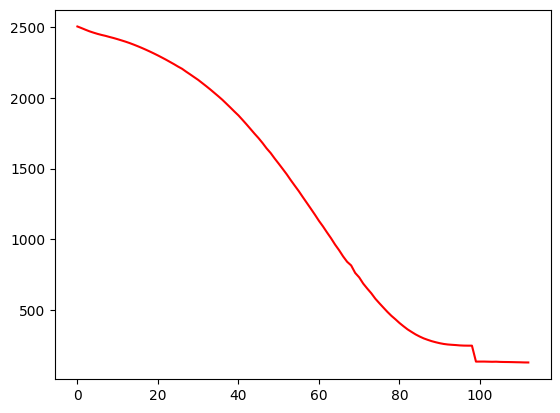

 23%|██▎       | 113/500 [00:20<01:05,  5.90it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.36638359821196
Dataset Name:  weibo , AUC Score (contextual):  66.20268635092532
Dataset Name:  weibo , AUC Score (structural):  49.556883817686106
Dataset Name:  weibo , AUC Score (joint-type):  48.441527958203324
Dataset Name:  weibo , AUC Score (structure type):  49.30709902602693
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.441527958203324
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


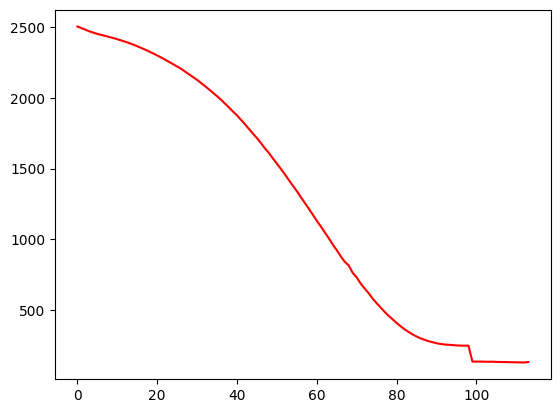

 23%|██▎       | 114/500 [00:20<01:05,  5.86it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.16435416308729
Dataset Name:  weibo , AUC Score (contextual):  65.85650055182755
Dataset Name:  weibo , AUC Score (structural):  49.45335305887622
Dataset Name:  weibo , AUC Score (joint-type):  48.922620998816555
Dataset Name:  weibo , AUC Score (structure type):  49.249426119542605
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.922620998816555
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


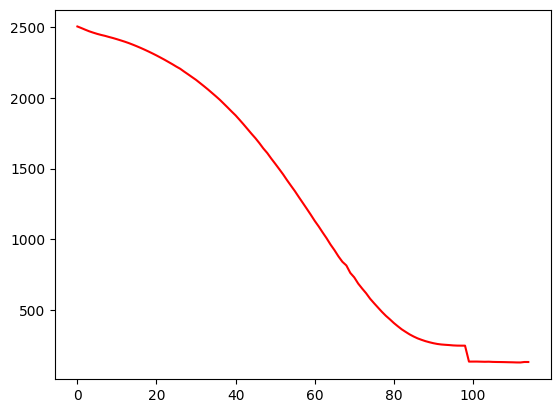

 23%|██▎       | 115/500 [00:20<01:05,  5.86it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.56759005801793
Dataset Name:  weibo , AUC Score (contextual):  65.9652472933277
Dataset Name:  weibo , AUC Score (structural):  49.74779646413975
Dataset Name:  weibo , AUC Score (joint-type):  49.43528007922729
Dataset Name:  weibo , AUC Score (structure type):  49.59921802307099
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.43528007922729
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


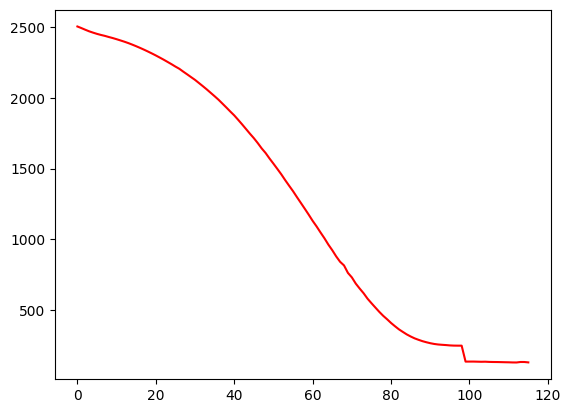

 23%|██▎       | 116/500 [00:20<01:04,  5.91it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.012565964895764
Dataset Name:  weibo , AUC Score (contextual):  66.78076113468929
Dataset Name:  weibo , AUC Score (structural):  49.65437221192488
Dataset Name:  weibo , AUC Score (joint-type):  49.29846500014165
Dataset Name:  weibo , AUC Score (structure type):  49.53093120521847
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.29846500014165
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


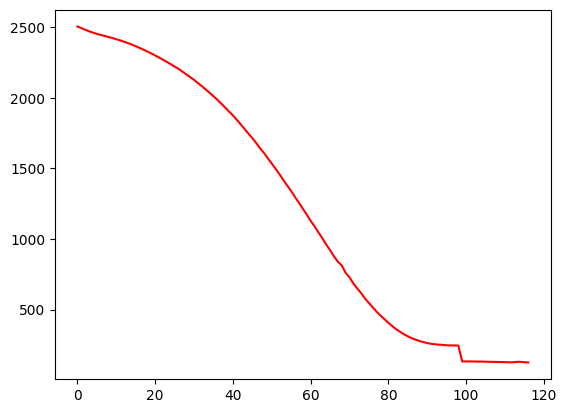

 23%|██▎       | 117/500 [00:20<01:05,  5.84it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.13402024666026
Dataset Name:  weibo , AUC Score (contextual):  68.08959552109116
Dataset Name:  weibo , AUC Score (structural):  49.74889043821313
Dataset Name:  weibo , AUC Score (joint-type):  48.877960255696486
Dataset Name:  weibo , AUC Score (structure type):  49.596261168535236
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.877960255696486
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


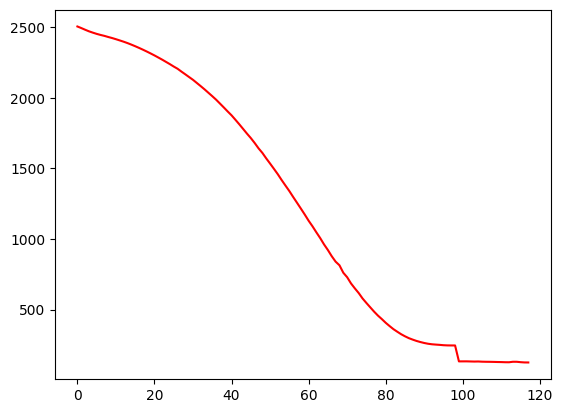

 24%|██▎       | 118/500 [00:21<01:06,  5.75it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.72643530013837
Dataset Name:  weibo , AUC Score (contextual):  66.11076326799856
Dataset Name:  weibo , AUC Score (structural):  49.420975960911676
Dataset Name:  weibo , AUC Score (joint-type):  49.203795787379015
Dataset Name:  weibo , AUC Score (structure type):  49.3012593807492
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.203795787379015
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


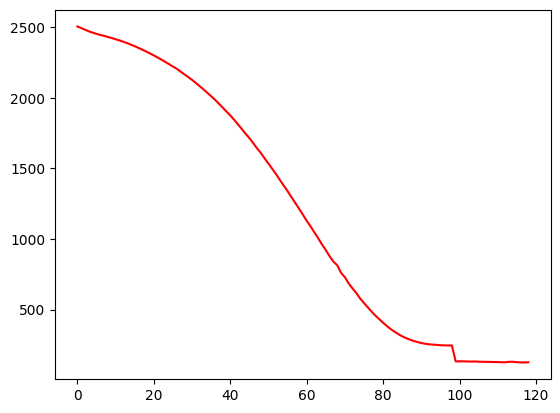

 24%|██▍       | 119/500 [00:21<01:07,  5.62it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.77214680999236
Dataset Name:  weibo , AUC Score (contextual):  65.83654052391533
Dataset Name:  weibo , AUC Score (structural):  49.91668225438015
Dataset Name:  weibo , AUC Score (joint-type):  49.412993067612035
Dataset Name:  weibo , AUC Score (structure type):  49.819039362969335
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.412993067612035
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


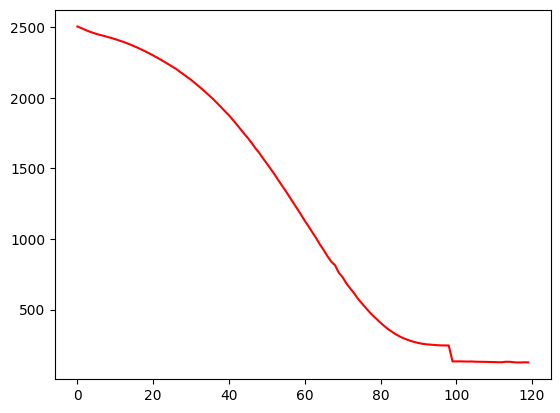

 24%|██▍       | 120/500 [00:21<01:07,  5.64it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.06410892133371
Dataset Name:  weibo , AUC Score (contextual):  65.9577315695664
Dataset Name:  weibo , AUC Score (structural):  49.40700370137342
Dataset Name:  weibo , AUC Score (joint-type):  49.2910938095296
Dataset Name:  weibo , AUC Score (structure type):  49.26040465266473
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.2910938095296
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


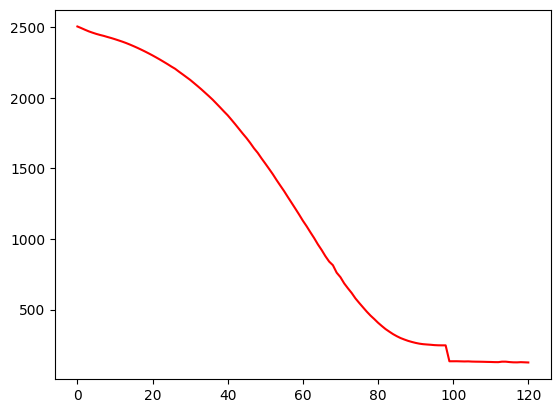

 24%|██▍       | 121/500 [00:21<01:07,  5.61it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.70039632436966
Dataset Name:  weibo , AUC Score (contextual):  65.26430487938131
Dataset Name:  weibo , AUC Score (structural):  49.57529999263126
Dataset Name:  weibo , AUC Score (joint-type):  49.487976865445994
Dataset Name:  weibo , AUC Score (structure type):  49.46174422741094
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.487976865445994
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


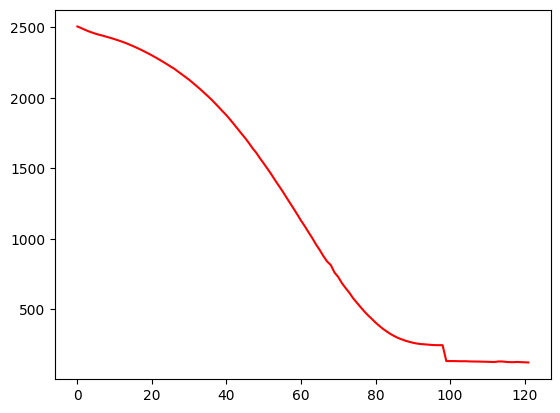

 24%|██▍       | 122/500 [00:21<01:07,  5.64it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.69075876979253
Dataset Name:  weibo , AUC Score (contextual):  64.93862833416296
Dataset Name:  weibo , AUC Score (structural):  49.563606373390925
Dataset Name:  weibo , AUC Score (joint-type):  49.411461016229914
Dataset Name:  weibo , AUC Score (structure type):  49.40631602359923
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.411461016229914
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


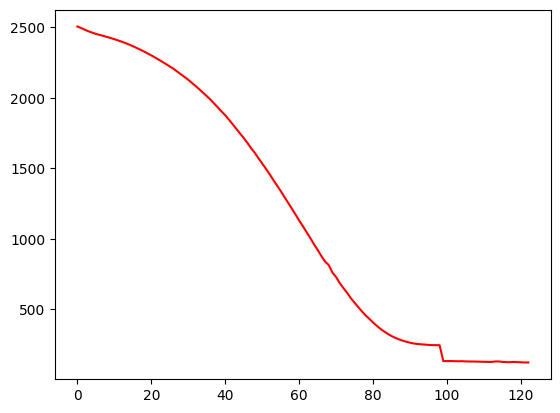

 25%|██▍       | 123/500 [00:22<01:06,  5.68it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.878435050677794
Dataset Name:  weibo , AUC Score (contextual):  64.96204270434241
Dataset Name:  weibo , AUC Score (structural):  49.29231497384099
Dataset Name:  weibo , AUC Score (joint-type):  48.77831910259946
Dataset Name:  weibo , AUC Score (structure type):  49.056498482603786
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.77831910259946
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


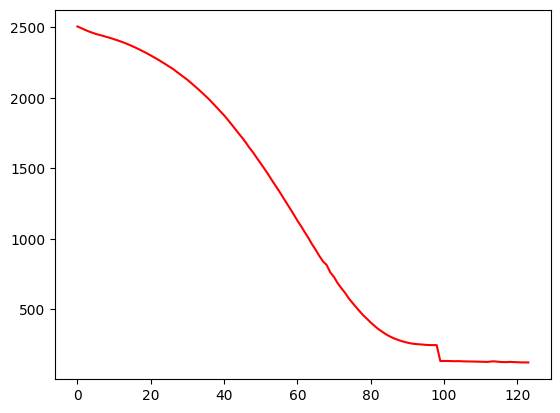

 25%|██▍       | 124/500 [00:22<01:06,  5.70it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.18283442237955
Dataset Name:  weibo , AUC Score (contextual):  64.07758655078577
Dataset Name:  weibo , AUC Score (structural):  49.642259141485425
Dataset Name:  weibo , AUC Score (joint-type):  49.26663880067549
Dataset Name:  weibo , AUC Score (structure type):  49.44995668977229
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.26663880067549
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


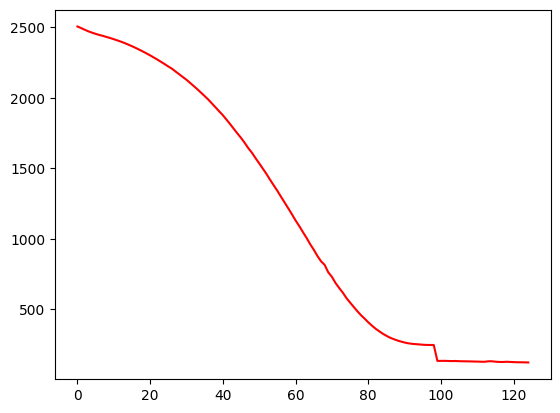

 25%|██▌       | 125/500 [00:22<01:05,  5.76it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.123083112558696
Dataset Name:  weibo , AUC Score (contextual):  64.57122506875442
Dataset Name:  weibo , AUC Score (structural):  49.32126844309918
Dataset Name:  weibo , AUC Score (joint-type):  49.13300345087347
Dataset Name:  weibo , AUC Score (structure type):  49.14799005676477
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.13300345087347
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


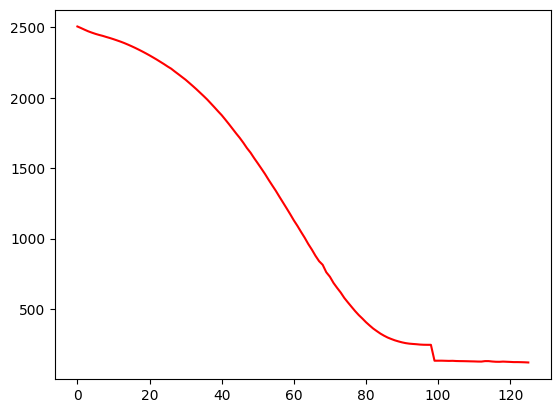

 25%|██▌       | 126/500 [00:22<01:06,  5.62it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.17452151566862
Dataset Name:  weibo , AUC Score (contextual):  63.91943837886994
Dataset Name:  weibo , AUC Score (structural):  49.55864948050402
Dataset Name:  weibo , AUC Score (joint-type):  49.07440971216512
Dataset Name:  weibo , AUC Score (structure type):  49.37166841115387
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.07440971216512
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


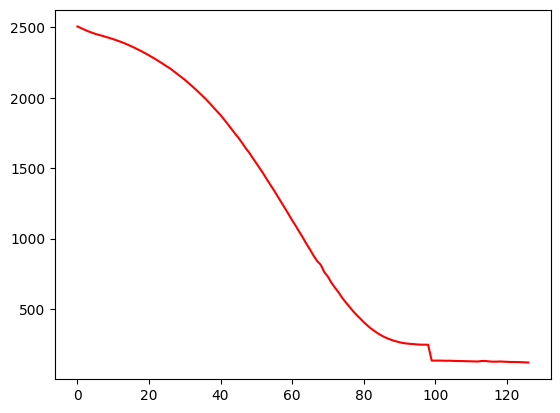

 25%|██▌       | 127/500 [00:22<01:06,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.23950049188977
Dataset Name:  weibo , AUC Score (contextual):  63.919843071687865
Dataset Name:  weibo , AUC Score (structural):  49.425470890653614
Dataset Name:  weibo , AUC Score (joint-type):  48.99826964913711
Dataset Name:  weibo , AUC Score (structure type):  49.27418621552017
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.99826964913711
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


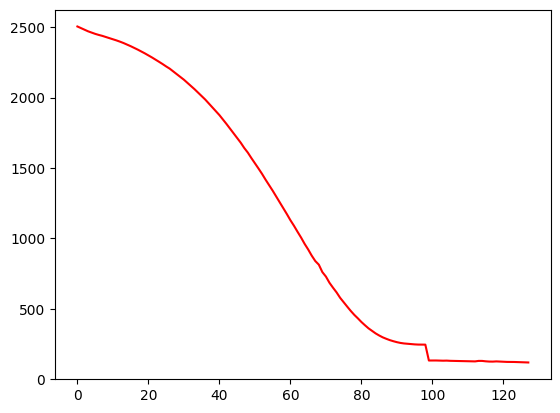

 26%|██▌       | 128/500 [00:22<01:07,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.33052608666676
Dataset Name:  weibo , AUC Score (contextual):  63.3964885382322
Dataset Name:  weibo , AUC Score (structural):  49.65551720033329
Dataset Name:  weibo , AUC Score (joint-type):  48.57935476933376
Dataset Name:  weibo , AUC Score (structure type):  49.47735459625091
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.57935476933376
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


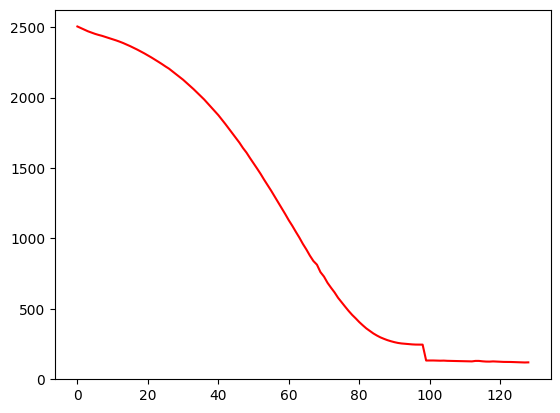

 26%|██▌       | 129/500 [00:23<01:06,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.873908075002035
Dataset Name:  weibo , AUC Score (contextual):  66.38679267644751
Dataset Name:  weibo , AUC Score (structural):  49.56814098094898
Dataset Name:  weibo , AUC Score (joint-type):  48.639046959976454
Dataset Name:  weibo , AUC Score (structure type):  49.39612370613401
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.639046959976454
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


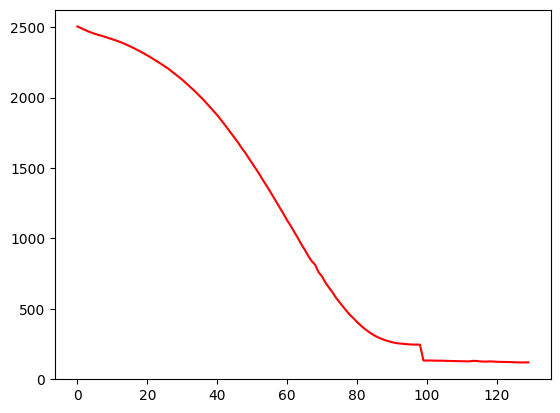

 26%|██▌       | 130/500 [00:23<01:06,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.39053969694209
Dataset Name:  weibo , AUC Score (contextual):  62.656363187522516
Dataset Name:  weibo , AUC Score (structural):  49.44282143282262
Dataset Name:  weibo , AUC Score (joint-type):  49.14468172933335
Dataset Name:  weibo , AUC Score (structure type):  49.32233907589807
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.14468172933335
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


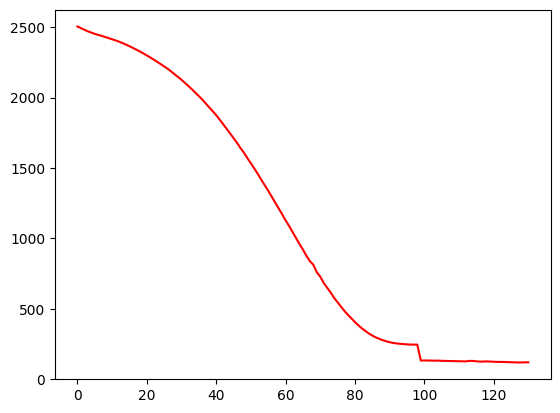

 26%|██▌       | 131/500 [00:23<01:06,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.3094142629082
Dataset Name:  weibo , AUC Score (contextual):  64.63375010912252
Dataset Name:  weibo , AUC Score (structural):  49.62438711944723
Dataset Name:  weibo , AUC Score (joint-type):  48.770745565578444
Dataset Name:  weibo , AUC Score (structure type):  49.50798282358073
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.770745565578444
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


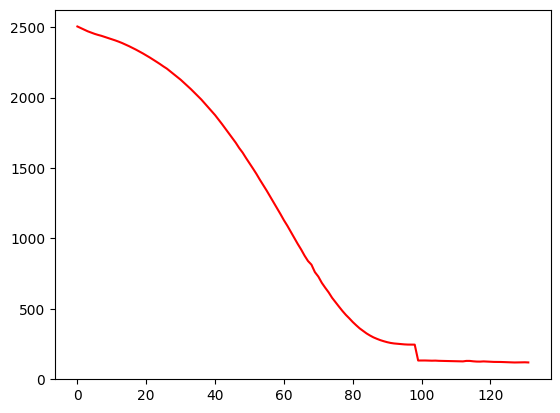

 26%|██▋       | 132/500 [00:23<01:05,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.14763174483606
Dataset Name:  weibo , AUC Score (contextual):  64.045297845242
Dataset Name:  weibo , AUC Score (structural):  49.21032076680214
Dataset Name:  weibo , AUC Score (joint-type):  48.876543830833775
Dataset Name:  weibo , AUC Score (structure type):  49.027832945808775
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.876543830833775
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


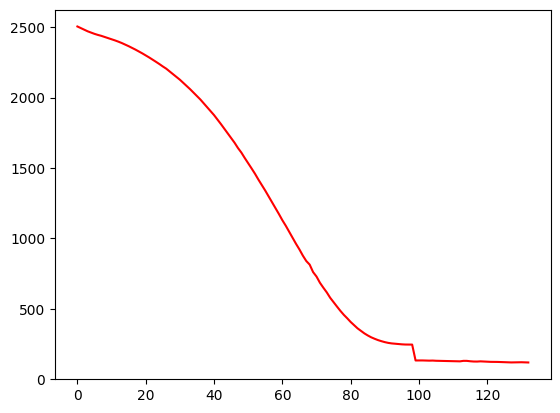

 27%|██▋       | 133/500 [00:23<01:06,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.43225158343264
Dataset Name:  weibo , AUC Score (contextual):  63.16043699886744
Dataset Name:  weibo , AUC Score (structural):  49.495847999954655
Dataset Name:  weibo , AUC Score (joint-type):  48.65240182296771
Dataset Name:  weibo , AUC Score (structure type):  49.23061391592597
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.65240182296771
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


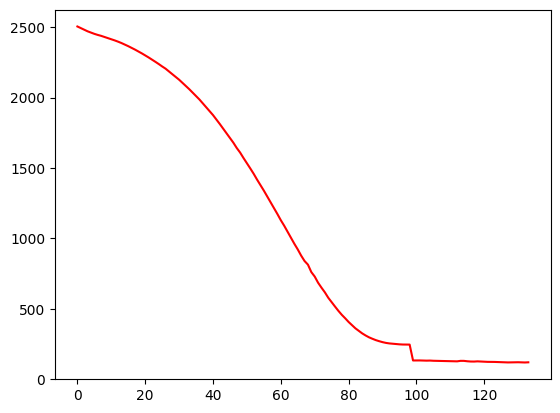

 27%|██▋       | 134/500 [00:24<01:30,  4.06it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.01563836532401
Dataset Name:  weibo , AUC Score (contextual):  64.74128277216893
Dataset Name:  weibo , AUC Score (structural):  49.670356703567045
Dataset Name:  weibo , AUC Score (joint-type):  48.663386342311156
Dataset Name:  weibo , AUC Score (structure type):  49.52742172083692
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.663386342311156
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


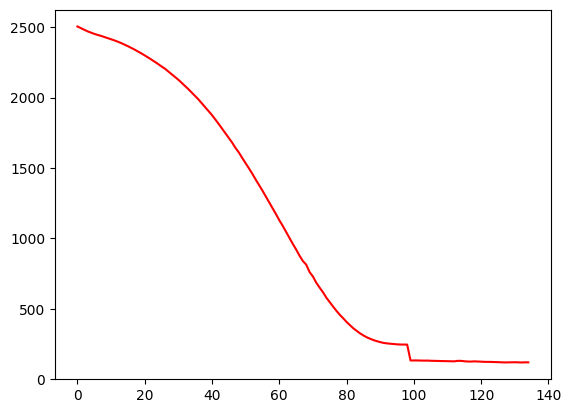

 27%|██▋       | 135/500 [00:24<01:23,  4.36it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.36809558253018
Dataset Name:  weibo , AUC Score (contextual):  65.02818107344193
Dataset Name:  weibo , AUC Score (structural):  49.08803373748023
Dataset Name:  weibo , AUC Score (joint-type):  47.69952367655331
Dataset Name:  weibo , AUC Score (structure type):  48.80402925269176
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.69952367655331
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


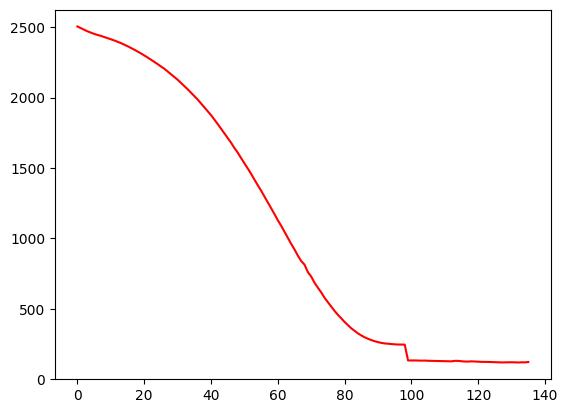

 27%|██▋       | 136/500 [00:24<01:18,  4.64it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.37581479753646
Dataset Name:  weibo , AUC Score (contextual):  64.1733253088529
Dataset Name:  weibo , AUC Score (structural):  49.762539606962896
Dataset Name:  weibo , AUC Score (joint-type):  48.9478853933065
Dataset Name:  weibo , AUC Score (structure type):  49.51285963953949
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.9478853933065
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


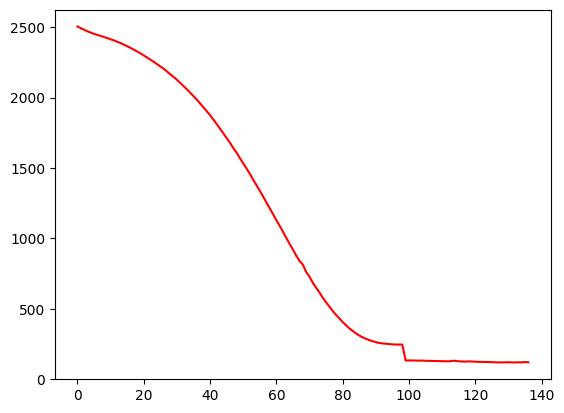

 27%|██▋       | 137/500 [00:24<01:13,  4.91it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.00435761151285
Dataset Name:  weibo , AUC Score (contextual):  64.8950660429772
Dataset Name:  weibo , AUC Score (structural):  49.78174366997126
Dataset Name:  weibo , AUC Score (joint-type):  49.398742099095394
Dataset Name:  weibo , AUC Score (structure type):  49.59194267963717
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.398742099095394
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


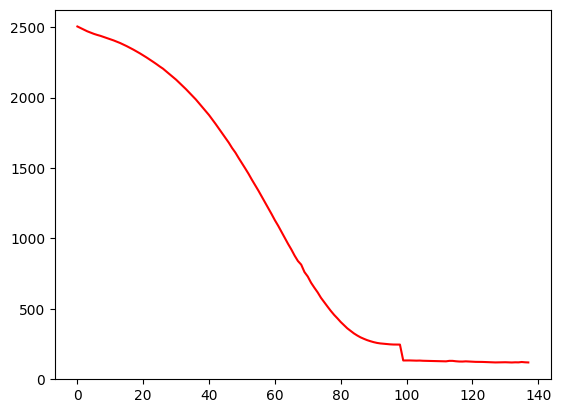

 28%|██▊       | 138/500 [00:24<01:11,  5.10it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.39230548648174
Dataset Name:  weibo , AUC Score (contextual):  65.4542937040782
Dataset Name:  weibo , AUC Score (structural):  49.8064856224599
Dataset Name:  weibo , AUC Score (joint-type):  48.91039349438951
Dataset Name:  weibo , AUC Score (structure type):  49.615227196954315
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.91039349438951
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


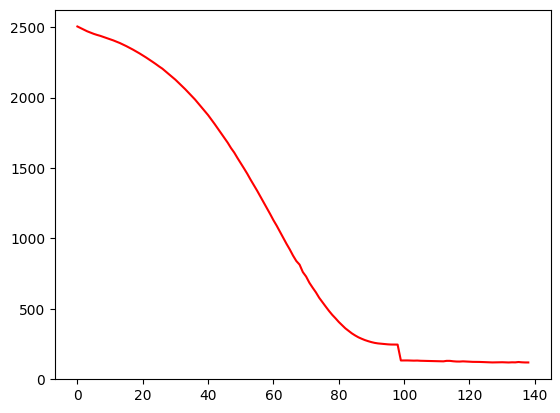

 28%|██▊       | 139/500 [00:25<01:08,  5.24it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.76845045242242
Dataset Name:  weibo , AUC Score (contextual):  66.5021012229239
Dataset Name:  weibo , AUC Score (structural):  49.78604021063252
Dataset Name:  weibo , AUC Score (joint-type):  49.32445206037785
Dataset Name:  weibo , AUC Score (structure type):  49.64964407219602
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.32445206037785
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


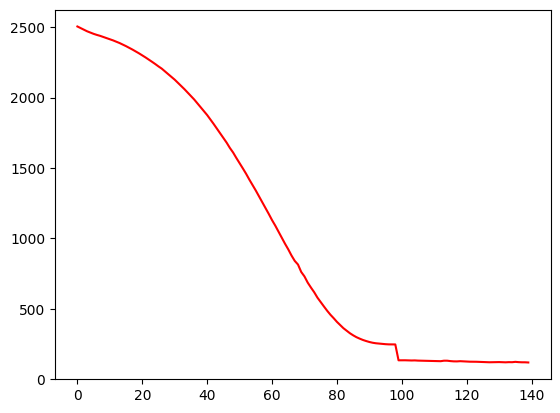

 28%|██▊       | 140/500 [00:25<01:07,  5.35it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.49753137975542
Dataset Name:  weibo , AUC Score (contextual):  65.83273930208989
Dataset Name:  weibo , AUC Score (structural):  49.674828960271164
Dataset Name:  weibo , AUC Score (joint-type):  48.95537221043795
Dataset Name:  weibo , AUC Score (structure type):  49.426187909188215
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.95537221043795
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


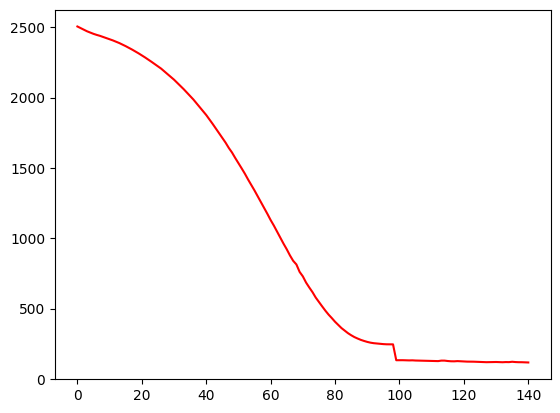

 28%|██▊       | 141/500 [00:25<01:06,  5.43it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.66819481647834
Dataset Name:  weibo , AUC Score (contextual):  65.88902051041015
Dataset Name:  weibo , AUC Score (structural):  49.700681891611545
Dataset Name:  weibo , AUC Score (joint-type):  48.894870634159425
Dataset Name:  weibo , AUC Score (structure type):  49.43430074321308
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.894870634159425
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


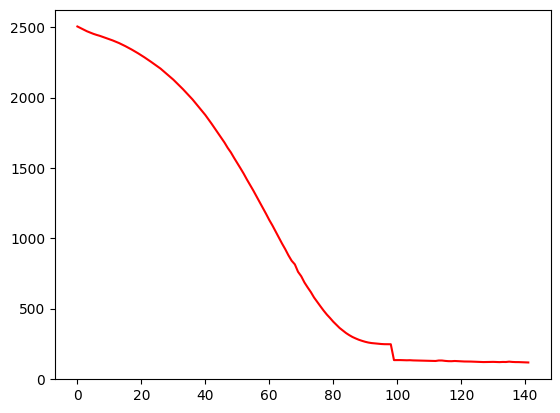

 28%|██▊       | 142/500 [00:25<01:05,  5.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.23593161600925
Dataset Name:  weibo , AUC Score (contextual):  65.9623566303426
Dataset Name:  weibo , AUC Score (structural):  49.850071703482016
Dataset Name:  weibo , AUC Score (joint-type):  49.06874401271429
Dataset Name:  weibo , AUC Score (structure type):  49.67243578042386
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.06874401271429
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


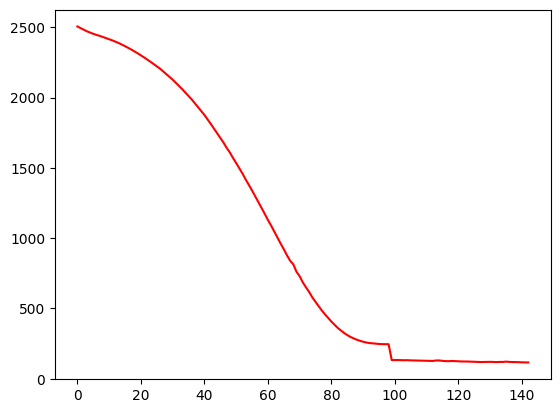

 29%|██▊       | 143/500 [00:25<01:04,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.39001265034126
Dataset Name:  weibo , AUC Score (contextual):  65.50155604388489
Dataset Name:  weibo , AUC Score (structural):  49.4789339137631
Dataset Name:  weibo , AUC Score (joint-type):  49.04197647347209
Dataset Name:  weibo , AUC Score (structure type):  49.295442524331094
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.04197647347209
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


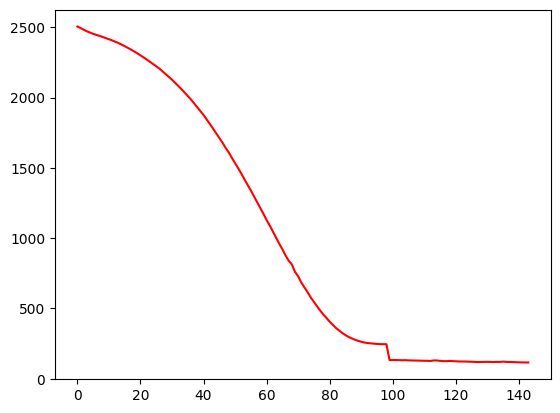

 29%|██▉       | 144/500 [00:26<01:04,  5.50it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.60523109036893
Dataset Name:  weibo , AUC Score (contextual):  66.76107571976063
Dataset Name:  weibo , AUC Score (structural):  49.542083992268495
Dataset Name:  weibo , AUC Score (joint-type):  49.29230788798334
Dataset Name:  weibo , AUC Score (structure type):  49.36388316698606
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.29230788798334
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


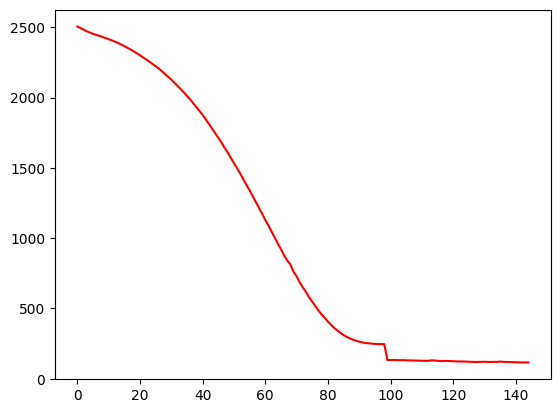

 29%|██▉       | 145/500 [00:26<01:05,  5.44it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.925815439530574
Dataset Name:  weibo , AUC Score (contextual):  66.38979896595204
Dataset Name:  weibo , AUC Score (structural):  49.82893759813173
Dataset Name:  weibo , AUC Score (joint-type):  50.03731845913788
Dataset Name:  weibo , AUC Score (structure type):  49.70105573949964
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.28871637250089
Dataset Name:  weibo  Best AUC Score (contextual):  68.76525908723269
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  50.03731845913788
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


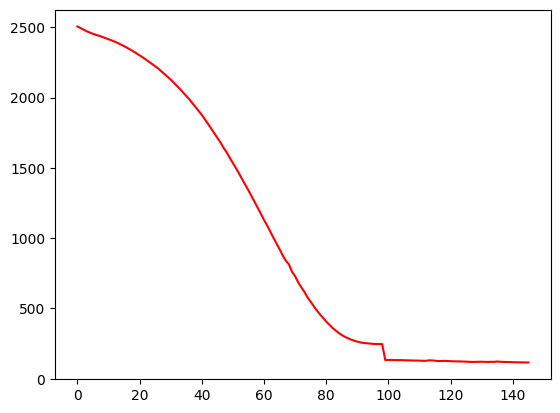

 29%|██▉       | 146/500 [00:26<01:05,  5.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo , AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo , AUC Score (structural):  50.73481615000481
Dataset Name:  weibo , AUC Score (joint-type):  49.163268692327655
Dataset Name:  weibo , AUC Score (structure type):  50.51100029648307
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.163268692327655
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


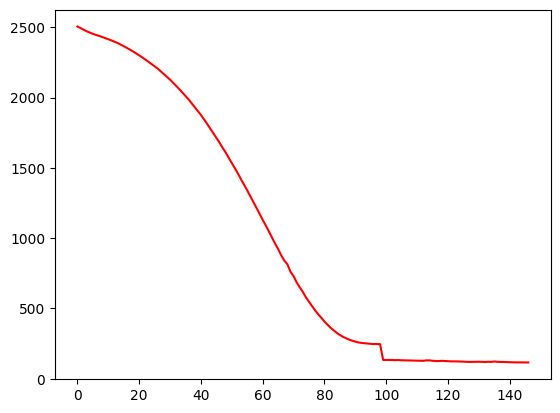

 29%|██▉       | 147/500 [00:26<01:04,  5.49it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.640420928030004
Dataset Name:  weibo , AUC Score (contextual):  65.05587362483935
Dataset Name:  weibo , AUC Score (structural):  49.38980903633921
Dataset Name:  weibo , AUC Score (joint-type):  49.67211209759804
Dataset Name:  weibo , AUC Score (structure type):  49.29048309875621
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.67211209759804
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


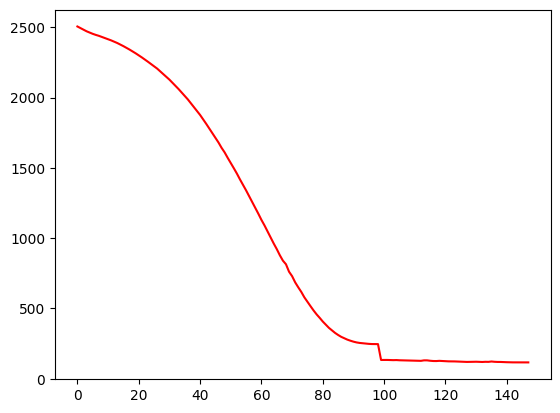

 30%|██▉       | 148/500 [00:26<01:04,  5.50it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.13289155985616
Dataset Name:  weibo , AUC Score (contextual):  65.45789257949468
Dataset Name:  weibo , AUC Score (structural):  49.182996922135125
Dataset Name:  weibo , AUC Score (joint-type):  48.64543532517357
Dataset Name:  weibo , AUC Score (structure type):  48.97234492124056
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.64543532517357
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


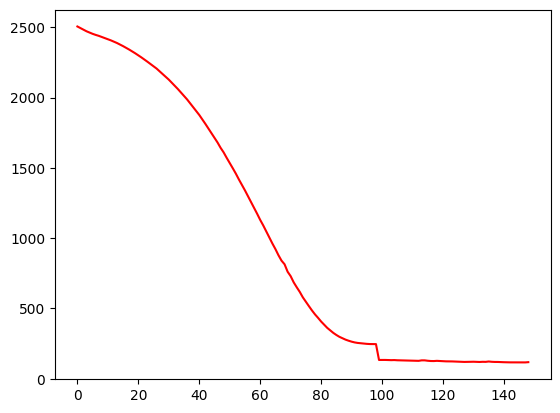

 30%|██▉       | 149/500 [00:26<01:03,  5.53it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.88795796344792
Dataset Name:  weibo , AUC Score (contextual):  64.08787731101279
Dataset Name:  weibo , AUC Score (structural):  49.25074112492277
Dataset Name:  weibo , AUC Score (joint-type):  48.955921436405134
Dataset Name:  weibo , AUC Score (structure type):  49.08752836358441
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.955921436405134
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


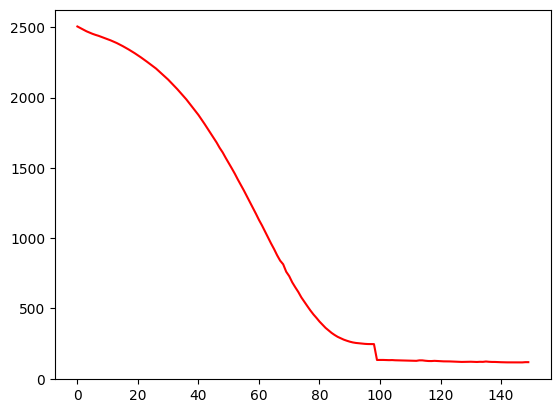

 30%|███       | 150/500 [00:27<01:03,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.85714469141178
Dataset Name:  weibo , AUC Score (contextual):  63.18130758562
Dataset Name:  weibo , AUC Score (structural):  49.48737962033998
Dataset Name:  weibo , AUC Score (joint-type):  49.11750949727324
Dataset Name:  weibo , AUC Score (structure type):  49.341658331641256
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.11750949727324
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


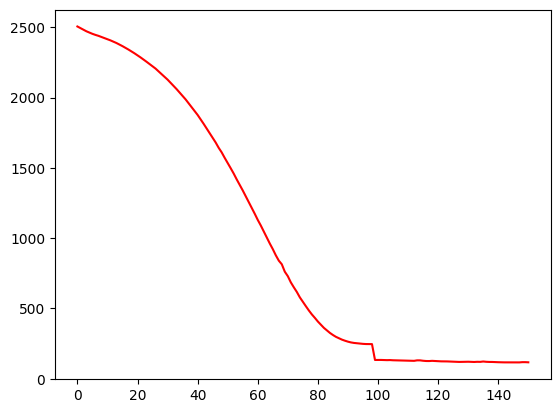

 30%|███       | 151/500 [00:27<01:04,  5.42it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.481027850927724
Dataset Name:  weibo , AUC Score (contextual):  63.03940493968053
Dataset Name:  weibo , AUC Score (structural):  49.12531387986691
Dataset Name:  weibo , AUC Score (joint-type):  48.919123296604575
Dataset Name:  weibo , AUC Score (structure type):  48.95715329769612
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.919123296604575
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


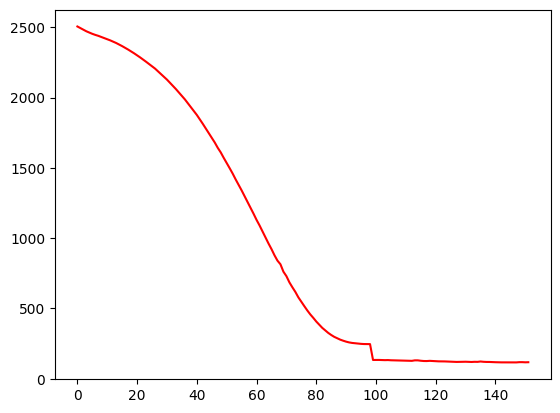

 30%|███       | 152/500 [00:27<01:04,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.84025413184359
Dataset Name:  weibo , AUC Score (contextual):  62.86096431360918
Dataset Name:  weibo , AUC Score (structural):  49.19345486081589
Dataset Name:  weibo , AUC Score (joint-type):  48.294451025520516
Dataset Name:  weibo , AUC Score (structure type):  48.91067256989287
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.294451025520516
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


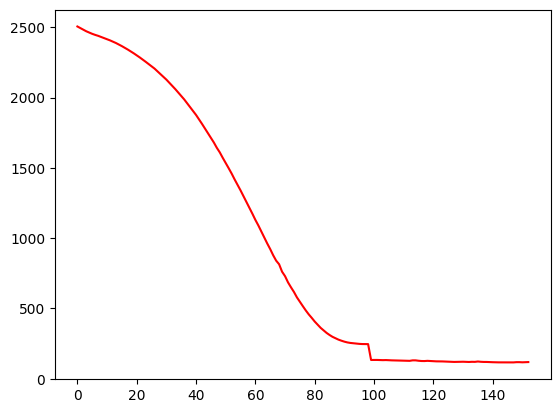

 31%|███       | 153/500 [00:27<01:04,  5.35it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.11182253570557
Dataset Name:  weibo , AUC Score (contextual):  61.88614603513775
Dataset Name:  weibo , AUC Score (structural):  48.667760640740056
Dataset Name:  weibo , AUC Score (joint-type):  47.57771113836043
Dataset Name:  weibo , AUC Score (structure type):  48.348132418770824
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.57771113836043
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


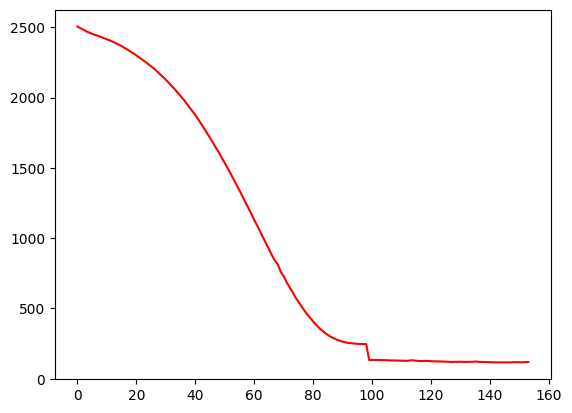

 31%|███       | 154/500 [00:27<01:05,  5.29it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.15250509162478
Dataset Name:  weibo , AUC Score (contextual):  61.48811619540188
Dataset Name:  weibo , AUC Score (structural):  49.23888596028818
Dataset Name:  weibo , AUC Score (joint-type):  48.55290520301993
Dataset Name:  weibo , AUC Score (structure type):  49.009530642926144
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.55290520301993
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


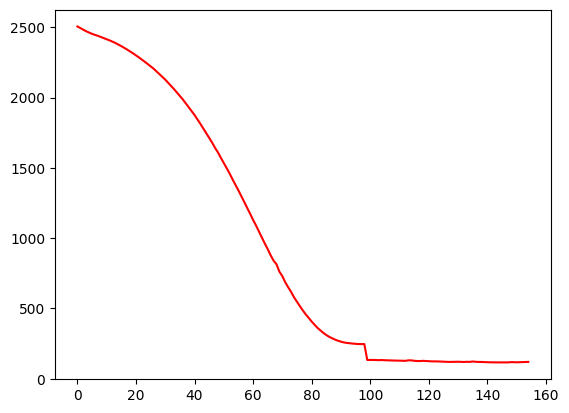

 31%|███       | 155/500 [00:28<01:07,  5.13it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.408100376086274
Dataset Name:  weibo , AUC Score (contextual):  62.6978152947291
Dataset Name:  weibo , AUC Score (structural):  49.283285436541
Dataset Name:  weibo , AUC Score (joint-type):  48.9673684618262
Dataset Name:  weibo , AUC Score (structure type):  49.11493481588539
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.9673684618262
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


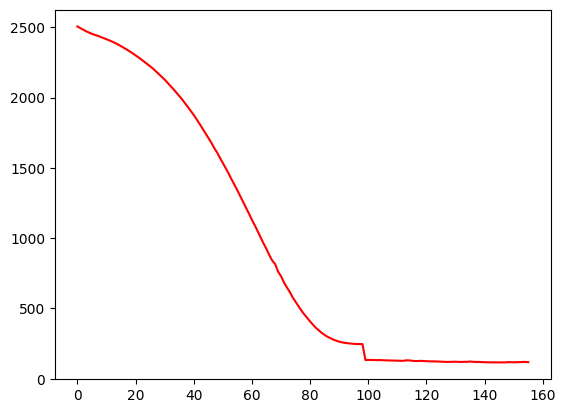

 31%|███       | 156/500 [00:28<01:06,  5.21it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.60077503975778
Dataset Name:  weibo , AUC Score (contextual):  63.07837107671993
Dataset Name:  weibo , AUC Score (structural):  49.37058513442277
Dataset Name:  weibo , AUC Score (joint-type):  48.37556302888293
Dataset Name:  weibo , AUC Score (structure type):  49.25894616564903
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.37556302888293
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


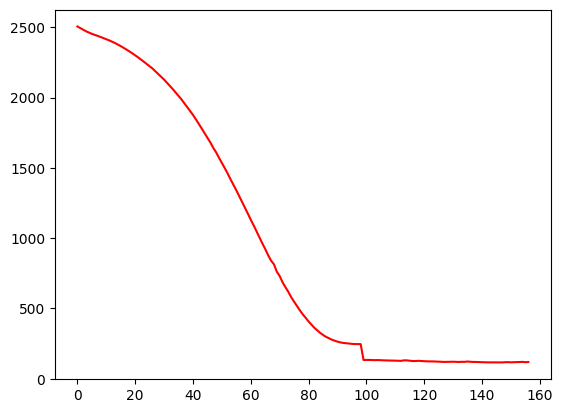

 31%|███▏      | 157/500 [00:28<01:05,  5.21it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.8865975473379
Dataset Name:  weibo , AUC Score (contextual):  63.48612799740072
Dataset Name:  weibo , AUC Score (structural):  49.07557206908474
Dataset Name:  weibo , AUC Score (joint-type):  48.810087488805905
Dataset Name:  weibo , AUC Score (structure type):  48.95116837343831
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.810087488805905
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


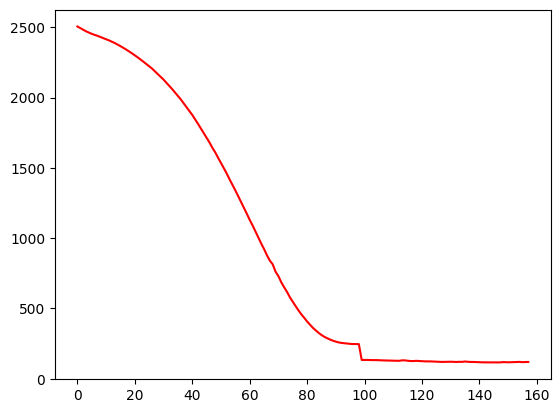

 32%|███▏      | 158/500 [00:28<01:05,  5.24it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.60044915131435
Dataset Name:  weibo , AUC Score (contextual):  64.25212478182722
Dataset Name:  weibo , AUC Score (structural):  49.124619518084586
Dataset Name:  weibo , AUC Score (joint-type):  48.36856762445893
Dataset Name:  weibo , AUC Score (structure type):  48.9278097923274
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.36856762445893
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


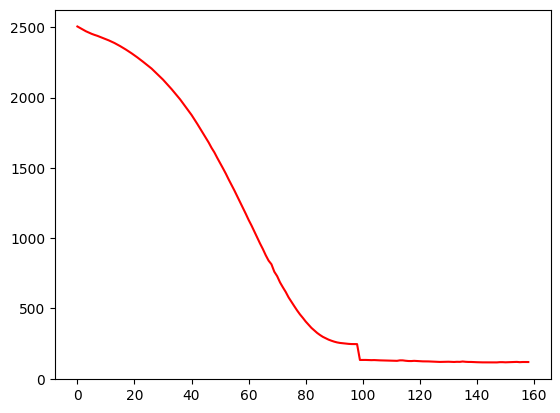

 32%|███▏      | 159/500 [00:28<01:04,  5.30it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.33504083388311
Dataset Name:  weibo , AUC Score (contextual):  65.33736638633017
Dataset Name:  weibo , AUC Score (structural):  49.62478956586801
Dataset Name:  weibo , AUC Score (joint-type):  47.52848314772387
Dataset Name:  weibo , AUC Score (structure type):  49.251499905768064
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.52848314772387
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


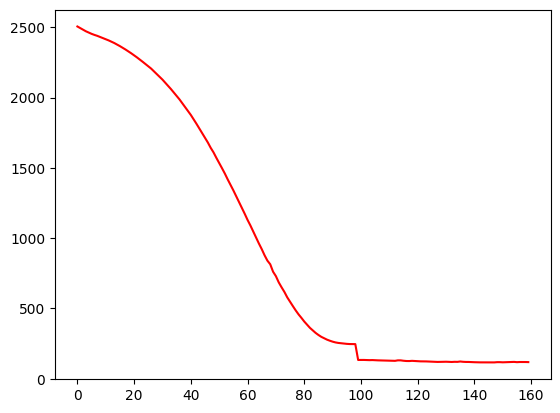

 32%|███▏      | 160/500 [00:29<01:04,  5.31it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.39735767448943
Dataset Name:  weibo , AUC Score (contextual):  66.49773632181635
Dataset Name:  weibo , AUC Score (structural):  49.772663118336254
Dataset Name:  weibo , AUC Score (joint-type):  48.02998426901204
Dataset Name:  weibo , AUC Score (structure type):  49.45898107818197
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.02998426901204
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


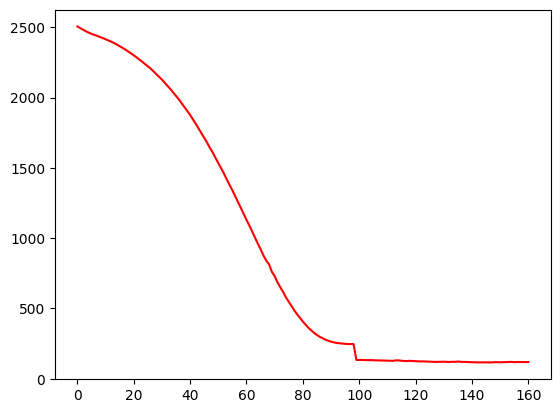

 32%|███▏      | 161/500 [00:29<01:03,  5.36it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.83786010520143
Dataset Name:  weibo , AUC Score (contextual):  69.38415003234653
Dataset Name:  weibo , AUC Score (structural):  49.71212327330646
Dataset Name:  weibo , AUC Score (joint-type):  47.86388677388714
Dataset Name:  weibo , AUC Score (structure type):  49.34580875269962
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.86388677388714
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


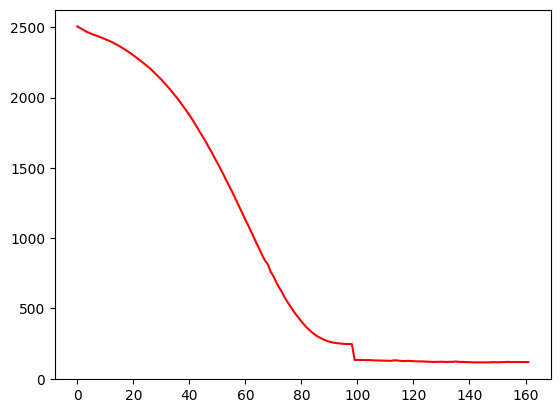

 32%|███▏      | 162/500 [00:29<01:03,  5.33it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.75817120943744
Dataset Name:  weibo , AUC Score (contextual):  68.33804800466207
Dataset Name:  weibo , AUC Score (structural):  49.583717357910906
Dataset Name:  weibo , AUC Score (joint-type):  48.42742152283595
Dataset Name:  weibo , AUC Score (structure type):  49.278071716085456
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.42742152283595
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


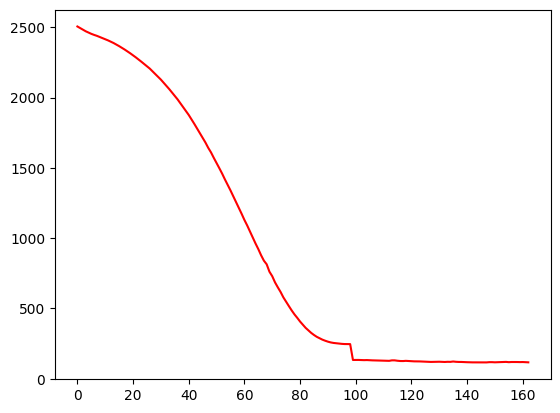

 33%|███▎      | 163/500 [00:29<01:02,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.0884796295266
Dataset Name:  weibo , AUC Score (contextual):  67.44645191353217
Dataset Name:  weibo , AUC Score (structural):  49.819930733869555
Dataset Name:  weibo , AUC Score (joint-type):  48.376632574187425
Dataset Name:  weibo , AUC Score (structure type):  49.48555858571425
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.376632574187425
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


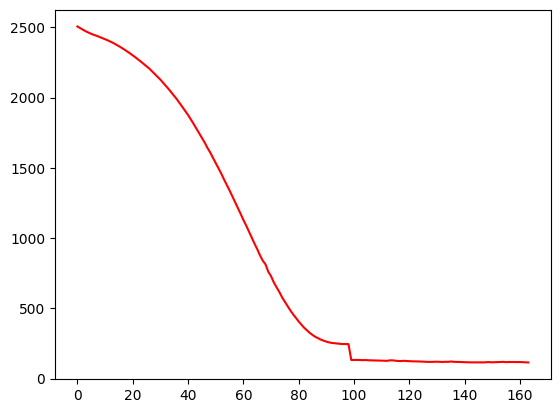

 33%|███▎      | 164/500 [00:29<01:01,  5.50it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.23256389828612
Dataset Name:  weibo , AUC Score (contextual):  66.88207887231768
Dataset Name:  weibo , AUC Score (structural):  49.510965247901325
Dataset Name:  weibo , AUC Score (joint-type):  47.4133480410266
Dataset Name:  weibo , AUC Score (structure type):  49.101178890497025
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.4133480410266
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


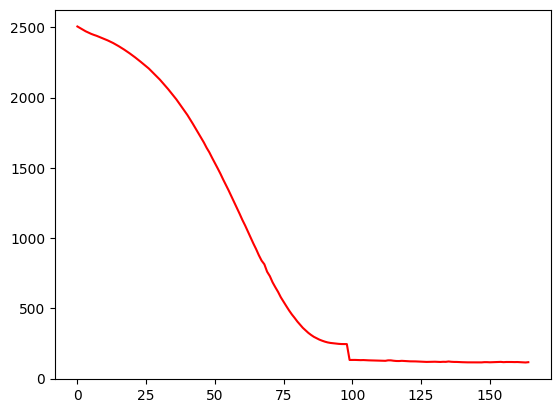

 33%|███▎      | 165/500 [00:29<01:00,  5.53it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.52881850459393
Dataset Name:  weibo , AUC Score (contextual):  66.07376278178906
Dataset Name:  weibo , AUC Score (structural):  49.61928852007414
Dataset Name:  weibo , AUC Score (joint-type):  48.653182301973686
Dataset Name:  weibo , AUC Score (structure type):  49.42366689159271
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.653182301973686
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


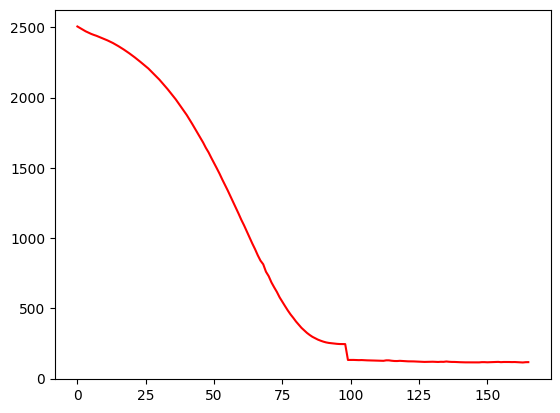

 33%|███▎      | 166/500 [00:30<01:00,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.88088135398395
Dataset Name:  weibo , AUC Score (contextual):  69.52084948491277
Dataset Name:  weibo , AUC Score (structural):  49.984128873546794
Dataset Name:  weibo , AUC Score (joint-type):  48.07539658450825
Dataset Name:  weibo , AUC Score (structure type):  49.677925046984925
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.07539658450825
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


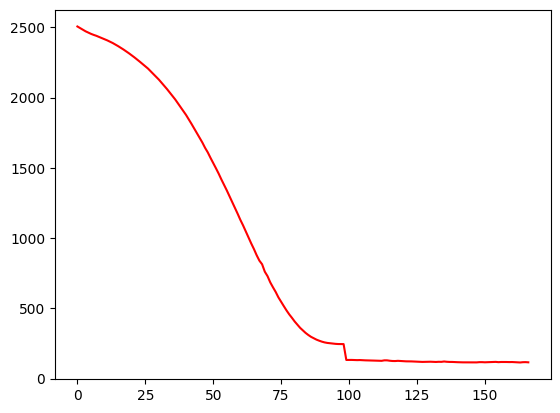

 33%|███▎      | 167/500 [00:30<00:59,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.56458185700161
Dataset Name:  weibo , AUC Score (contextual):  67.68944104406121
Dataset Name:  weibo , AUC Score (structural):  49.661077762851356
Dataset Name:  weibo , AUC Score (joint-type):  48.65222838318859
Dataset Name:  weibo , AUC Score (structure type):  49.482573245103985
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  74.87385579833803
Dataset Name:  weibo  Best AUC Score (contextual):  76.46345594947583
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.65222838318859
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


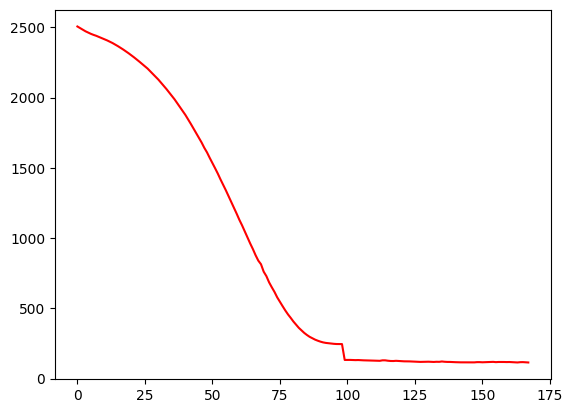

 34%|███▎      | 168/500 [00:30<00:59,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo , AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo , AUC Score (structural):  50.49238752756191
Dataset Name:  weibo , AUC Score (joint-type):  48.34995175483478
Dataset Name:  weibo , AUC Score (structure type):  50.25608696137675
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.34995175483478
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


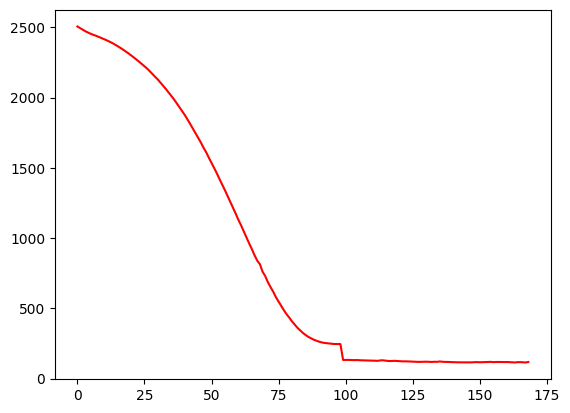

 34%|███▍      | 169/500 [00:30<00:59,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  73.08730080603891
Dataset Name:  weibo , AUC Score (contextual):  74.36463227587099
Dataset Name:  weibo , AUC Score (structural):  50.23432017730316
Dataset Name:  weibo , AUC Score (joint-type):  48.157317973506494
Dataset Name:  weibo , AUC Score (structure type):  49.92443214149876
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.157317973506494
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


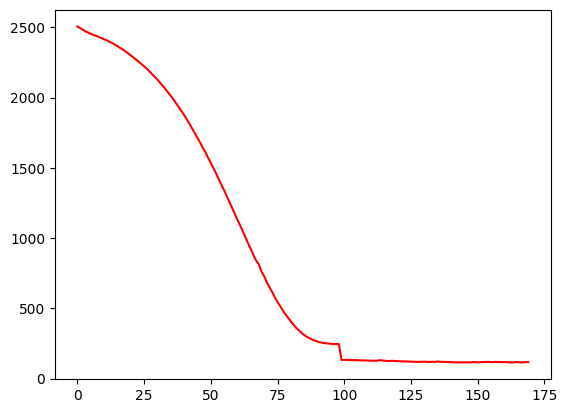

 34%|███▍      | 170/500 [00:30<00:59,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  74.79769542453847
Dataset Name:  weibo , AUC Score (contextual):  75.6542871133666
Dataset Name:  weibo , AUC Score (structural):  50.05387964017889
Dataset Name:  weibo , AUC Score (joint-type):  48.107425130383355
Dataset Name:  weibo , AUC Score (structure type):  49.735247574752584
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.107425130383355
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


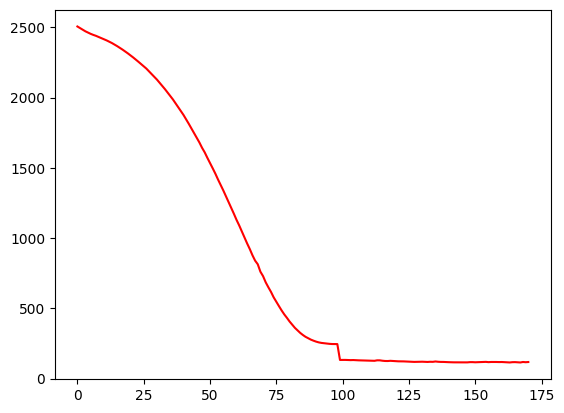

 34%|███▍      | 171/500 [00:31<00:59,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  76.7001838548873
Dataset Name:  weibo , AUC Score (contextual):  77.35304302983106
Dataset Name:  weibo , AUC Score (structural):  50.15330941327847
Dataset Name:  weibo , AUC Score (joint-type):  48.95493861099019
Dataset Name:  weibo , AUC Score (structure type):  49.99750461987157
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.95493861099019
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


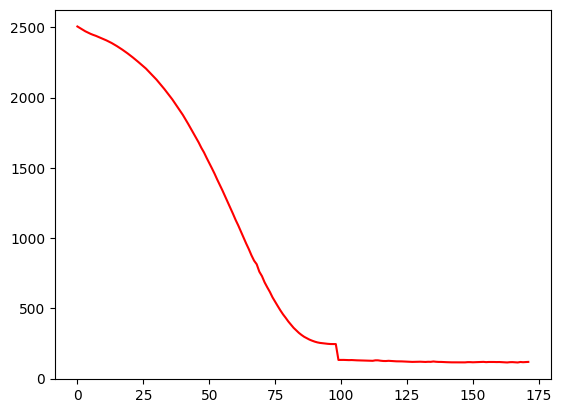

 34%|███▍      | 172/500 [00:31<00:58,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  75.18124105411765
Dataset Name:  weibo , AUC Score (contextual):  75.74441798524259
Dataset Name:  weibo , AUC Score (structural):  50.18050005384846
Dataset Name:  weibo , AUC Score (joint-type):  48.746868689321374
Dataset Name:  weibo , AUC Score (structure type):  49.96130451636457
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.746868689321374
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


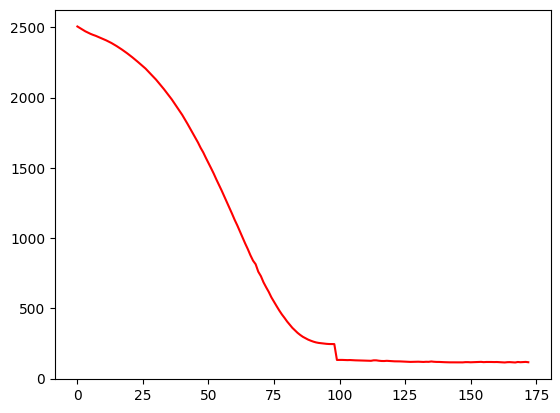

 35%|███▍      | 173/500 [00:31<00:58,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  71.9541506142661
Dataset Name:  weibo , AUC Score (contextual):  73.4828499855756
Dataset Name:  weibo , AUC Score (structural):  49.85012555194677
Dataset Name:  weibo , AUC Score (joint-type):  48.34948924875716
Dataset Name:  weibo , AUC Score (structure type):  49.541020972815396
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.34948924875716
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


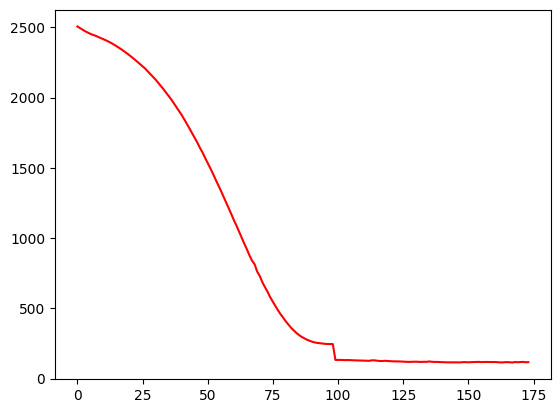

 35%|███▍      | 174/500 [00:31<00:58,  5.53it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.40128912419163
Dataset Name:  weibo , AUC Score (contextual):  72.09366962150237
Dataset Name:  weibo , AUC Score (structural):  49.60011279836301
Dataset Name:  weibo , AUC Score (joint-type):  48.98990117979519
Dataset Name:  weibo , AUC Score (structure type):  49.427874284800126
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.98990117979519
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


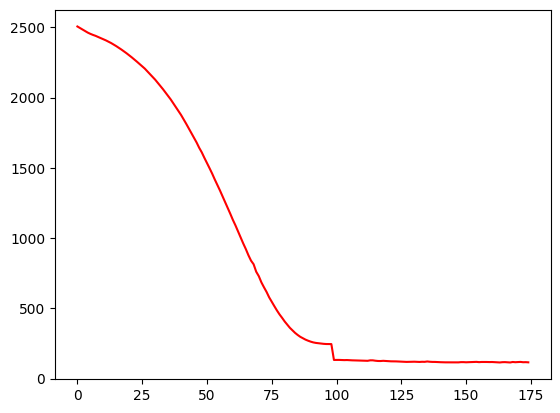

 35%|███▌      | 175/500 [00:31<00:58,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.67247783438876
Dataset Name:  weibo , AUC Score (contextual):  69.71345435961119
Dataset Name:  weibo , AUC Score (structural):  49.45620419337834
Dataset Name:  weibo , AUC Score (joint-type):  48.86749605569036
Dataset Name:  weibo , AUC Score (structure type):  49.259248118039004
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.86749605569036
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


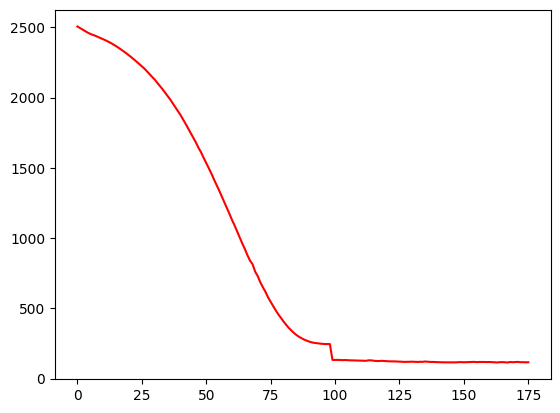

 35%|███▌      | 176/500 [00:31<00:58,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.20411469316656
Dataset Name:  weibo , AUC Score (contextual):  65.51395698809105
Dataset Name:  weibo , AUC Score (structural):  49.043444374535916
Dataset Name:  weibo , AUC Score (joint-type):  48.68240690475323
Dataset Name:  weibo , AUC Score (structure type):  48.76336538130662
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.68240690475323
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


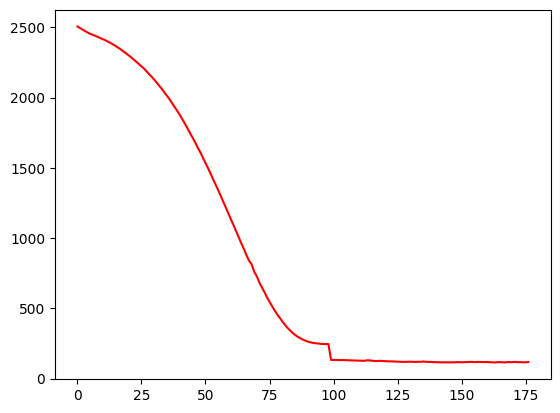

 35%|███▌      | 177/500 [00:32<00:57,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.01673892667144
Dataset Name:  weibo , AUC Score (contextual):  64.57564778312165
Dataset Name:  weibo , AUC Score (structural):  49.25686567925587
Dataset Name:  weibo , AUC Score (joint-type):  48.63465315223908
Dataset Name:  weibo , AUC Score (structure type):  49.00393028067443
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.63465315223908
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


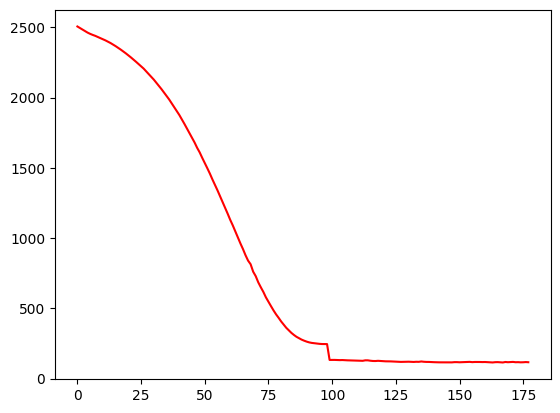

 36%|███▌      | 178/500 [00:32<00:57,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.9057992857357
Dataset Name:  weibo , AUC Score (contextual):  69.62569383138299
Dataset Name:  weibo , AUC Score (structural):  49.79620339982202
Dataset Name:  weibo , AUC Score (joint-type):  48.93502194302272
Dataset Name:  weibo , AUC Score (structure type):  49.631299040201604
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.93502194302272
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


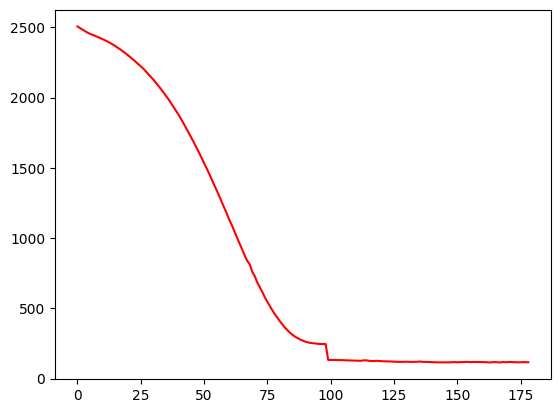

 36%|███▌      | 179/500 [00:32<00:57,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.081121765496064
Dataset Name:  weibo , AUC Score (contextual):  65.3213521133926
Dataset Name:  weibo , AUC Score (structural):  49.309115694843584
Dataset Name:  weibo , AUC Score (joint-type):  48.58820019806823
Dataset Name:  weibo , AUC Score (structure type):  49.11709406033442
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.58820019806823
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


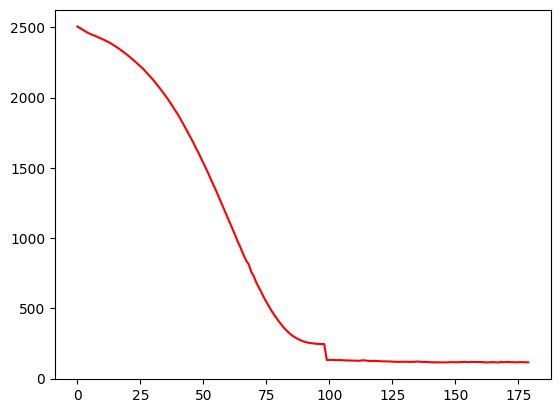

 36%|███▌      | 180/500 [00:32<00:57,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.37784533322246
Dataset Name:  weibo , AUC Score (contextual):  65.04763523533175
Dataset Name:  weibo , AUC Score (structural):  49.468192562109955
Dataset Name:  weibo , AUC Score (joint-type):  48.844226218660154
Dataset Name:  weibo , AUC Score (structure type):  49.2536705446469
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.844226218660154
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


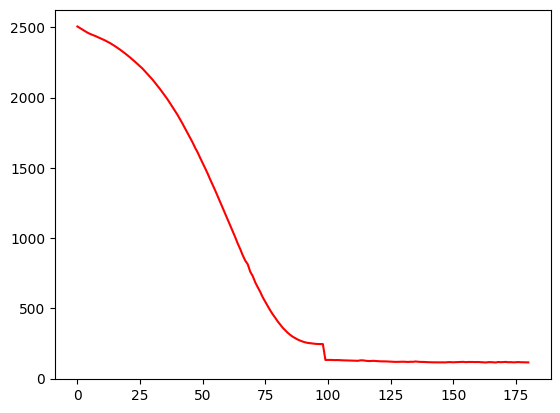

 36%|███▌      | 181/500 [00:32<00:56,  5.62it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.65975717948138
Dataset Name:  weibo , AUC Score (contextual):  65.38618968414882
Dataset Name:  weibo , AUC Score (structural):  49.29423651379371
Dataset Name:  weibo , AUC Score (joint-type):  48.65578389866029
Dataset Name:  weibo , AUC Score (structure type):  49.113681428606256
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.65578389866029
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


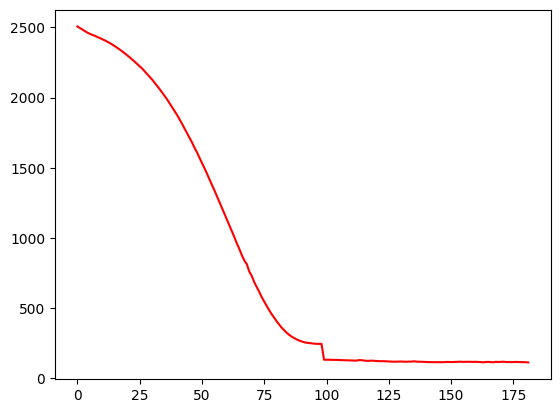

 36%|███▋      | 182/500 [00:33<00:56,  5.66it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.12757218001026
Dataset Name:  weibo , AUC Score (contextual):  65.32305760455382
Dataset Name:  weibo , AUC Score (structural):  49.45868689101638
Dataset Name:  weibo , AUC Score (joint-type):  48.98130145741446
Dataset Name:  weibo , AUC Score (structure type):  49.289671245632235
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.98130145741446
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


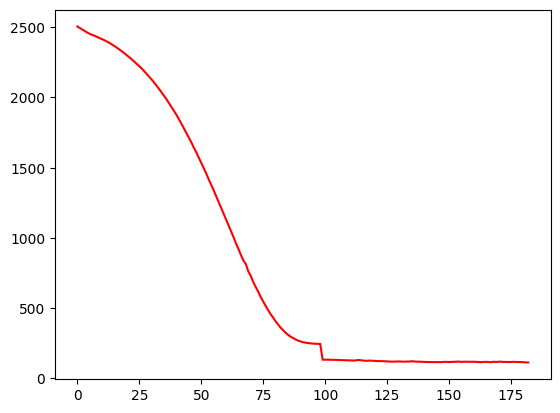

 37%|███▋      | 183/500 [00:33<00:57,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.97661184852118
Dataset Name:  weibo , AUC Score (contextual):  65.49921460686696
Dataset Name:  weibo , AUC Score (structural):  49.619064623825956
Dataset Name:  weibo , AUC Score (joint-type):  48.37755758634266
Dataset Name:  weibo , AUC Score (structure type):  49.33148310582075
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.37755758634266
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


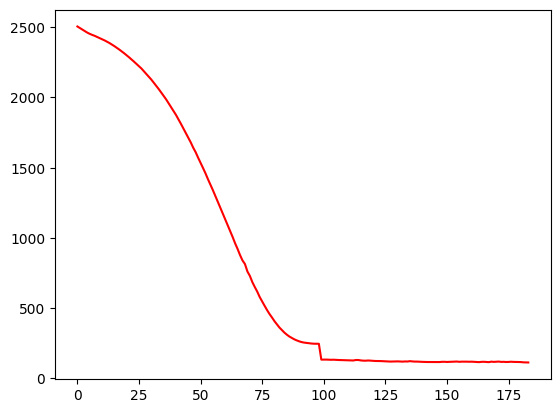

 37%|███▋      | 184/500 [00:33<00:57,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.34488474371288
Dataset Name:  weibo , AUC Score (contextual):  66.69187324789688
Dataset Name:  weibo , AUC Score (structural):  49.90141196342839
Dataset Name:  weibo , AUC Score (joint-type):  48.89093933249967
Dataset Name:  weibo , AUC Score (structure type):  49.649279450442094
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.89093933249967
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


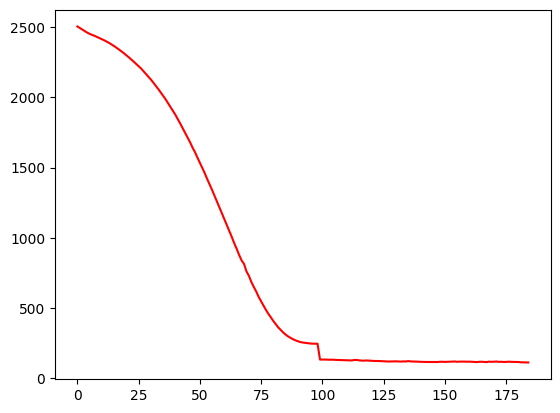

 37%|███▋      | 185/500 [00:33<00:57,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.45737128476475
Dataset Name:  weibo , AUC Score (contextual):  66.56838412517266
Dataset Name:  weibo , AUC Score (structural):  49.499742094195135
Dataset Name:  weibo , AUC Score (joint-type):  49.46346404333219
Dataset Name:  weibo , AUC Score (structure type):  49.30252416245814
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.46346404333219
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


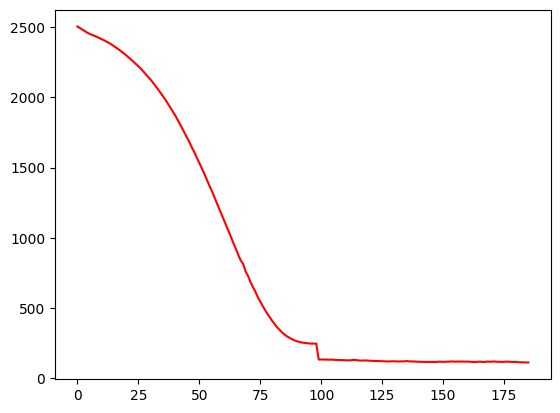

 37%|███▋      | 186/500 [00:33<00:56,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.17556643752572
Dataset Name:  weibo , AUC Score (contextual):  66.28657339075346
Dataset Name:  weibo , AUC Score (structural):  49.58782968014012
Dataset Name:  weibo , AUC Score (joint-type):  49.41013131125676
Dataset Name:  weibo , AUC Score (structure type):  49.36292318627454
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.41013131125676
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


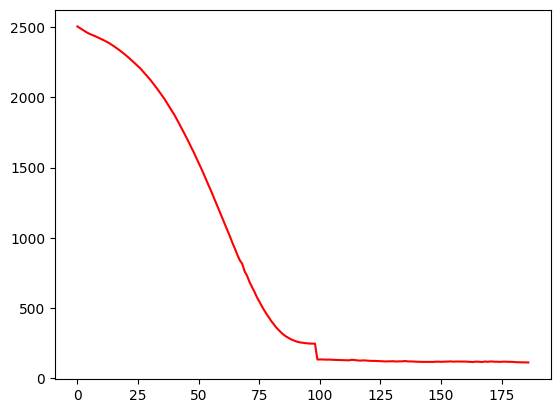

 37%|███▋      | 187/500 [00:33<00:56,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.0988609801477
Dataset Name:  weibo , AUC Score (contextual):  67.64466467442173
Dataset Name:  weibo , AUC Score (structural):  49.445134082677235
Dataset Name:  weibo , AUC Score (joint-type):  48.522177455488126
Dataset Name:  weibo , AUC Score (structure type):  49.15993426781331
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.522177455488126
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


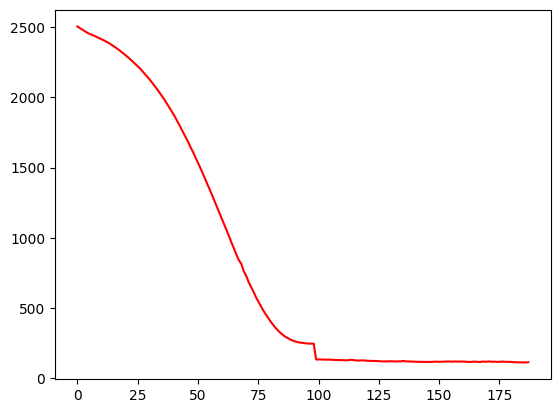

 38%|███▊      | 188/500 [00:34<00:57,  5.46it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.02453212385717
Dataset Name:  weibo , AUC Score (contextual):  65.0164738883522
Dataset Name:  weibo , AUC Score (structural):  49.38042239869404
Dataset Name:  weibo , AUC Score (joint-type):  49.44982011404244
Dataset Name:  weibo , AUC Score (structure type):  49.229454532692785
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.44982011404244
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


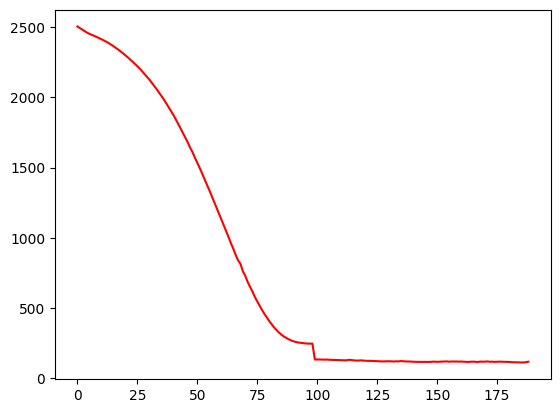

 38%|███▊      | 189/500 [00:34<00:57,  5.40it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.36174717782441
Dataset Name:  weibo , AUC Score (contextual):  65.0654995325798
Dataset Name:  weibo , AUC Score (structural):  49.25530407377806
Dataset Name:  weibo , AUC Score (joint-type):  49.820518735254005
Dataset Name:  weibo , AUC Score (structure type):  49.07000942775122
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.820518735254005
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


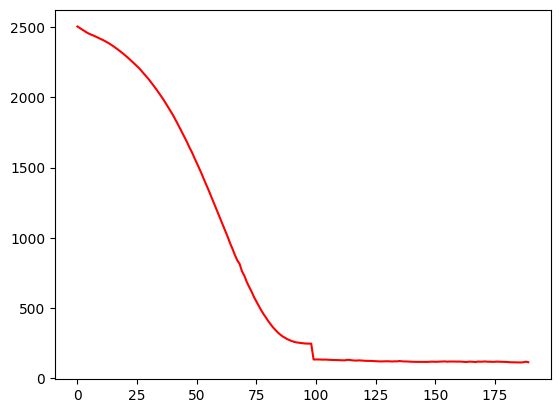

 38%|███▊      | 190/500 [00:34<00:58,  5.34it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.93891762237172
Dataset Name:  weibo , AUC Score (contextual):  65.72488866611513
Dataset Name:  weibo , AUC Score (structural):  49.0616026436762
Dataset Name:  weibo , AUC Score (joint-type):  48.349373622237756
Dataset Name:  weibo , AUC Score (structure type):  48.745752441427506
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.349373622237756
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


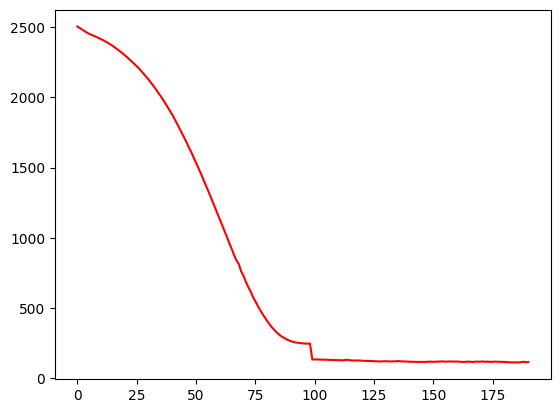

 38%|███▊      | 191/500 [00:34<00:58,  5.31it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.1270983272079
Dataset Name:  weibo , AUC Score (contextual):  65.21295225145069
Dataset Name:  weibo , AUC Score (structural):  49.33930484466135
Dataset Name:  weibo , AUC Score (joint-type):  48.086467823741245
Dataset Name:  weibo , AUC Score (structure type):  49.04817485162744
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.086467823741245
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


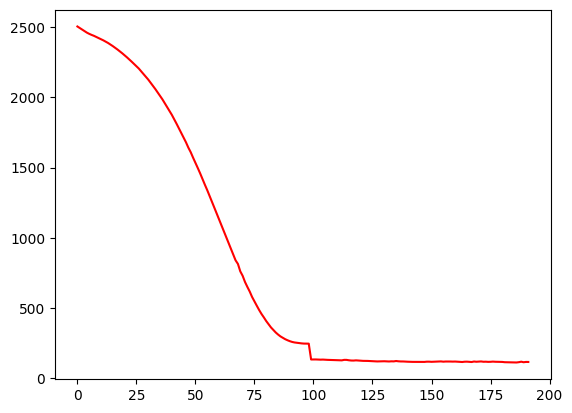

 38%|███▊      | 192/500 [00:34<00:58,  5.29it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.71651251674535
Dataset Name:  weibo , AUC Score (contextual):  65.03644836957935
Dataset Name:  weibo , AUC Score (structural):  49.14085624727215
Dataset Name:  weibo , AUC Score (joint-type):  48.40952831895807
Dataset Name:  weibo , AUC Score (structure type):  48.87447531499332
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.40952831895807
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


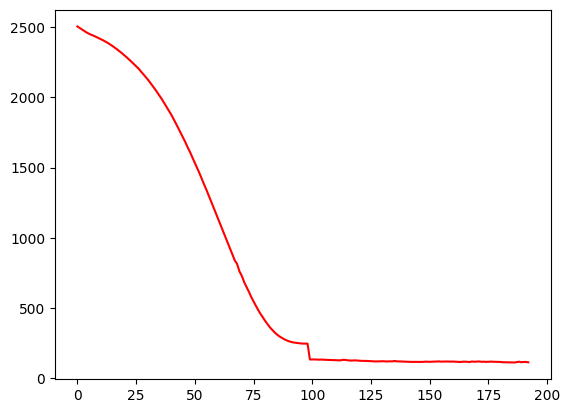

 39%|███▊      | 193/500 [00:35<00:58,  5.27it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.32056539504956
Dataset Name:  weibo , AUC Score (contextual):  65.96675043807996
Dataset Name:  weibo , AUC Score (structural):  49.28559241813616
Dataset Name:  weibo , AUC Score (joint-type):  48.49526538309667
Dataset Name:  weibo , AUC Score (structure type):  48.96408965684307
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.49526538309667
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


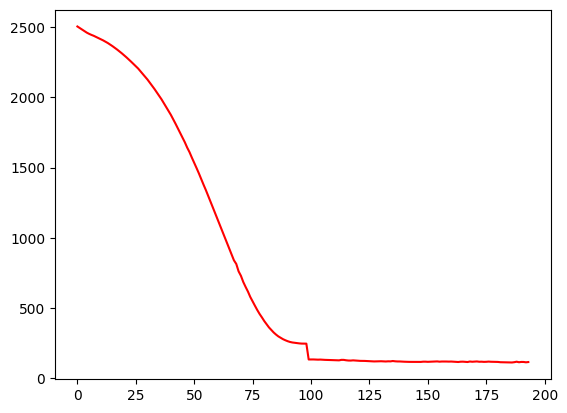

 39%|███▉      | 194/500 [00:35<01:20,  3.79it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.42481301156995
Dataset Name:  weibo , AUC Score (contextual):  66.79203472033124
Dataset Name:  weibo , AUC Score (structural):  49.41690615062833
Dataset Name:  weibo , AUC Score (joint-type):  48.659194880982724
Dataset Name:  weibo , AUC Score (structure type):  49.157672473495985
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.659194880982724
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


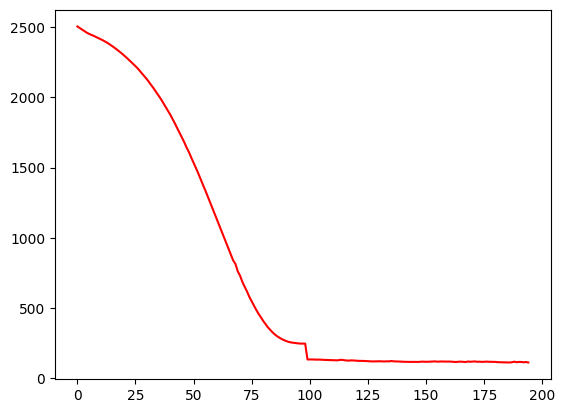

 39%|███▉      | 195/500 [00:35<01:15,  4.07it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.0079576699649
Dataset Name:  weibo , AUC Score (contextual):  66.49553941794767
Dataset Name:  weibo , AUC Score (structural):  49.21646799417303
Dataset Name:  weibo , AUC Score (joint-type):  48.45335076981246
Dataset Name:  weibo , AUC Score (structure type):  49.007063748872234
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.45335076981246
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


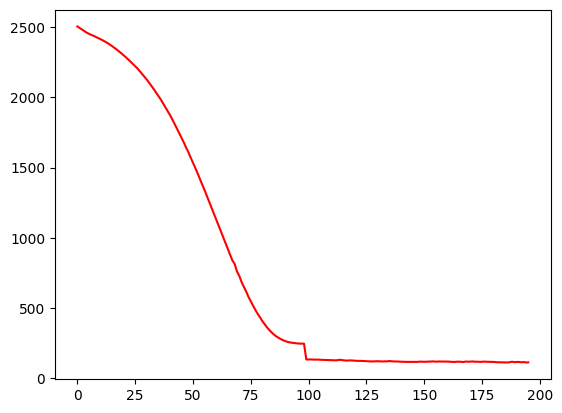

 39%|███▉      | 196/500 [00:35<01:10,  4.32it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.8636441175913
Dataset Name:  weibo , AUC Score (contextual):  67.45850597818011
Dataset Name:  weibo , AUC Score (structural):  49.801333174622066
Dataset Name:  weibo , AUC Score (joint-type):  48.72423479814789
Dataset Name:  weibo , AUC Score (structure type):  49.514517529076876
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.72423479814789
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


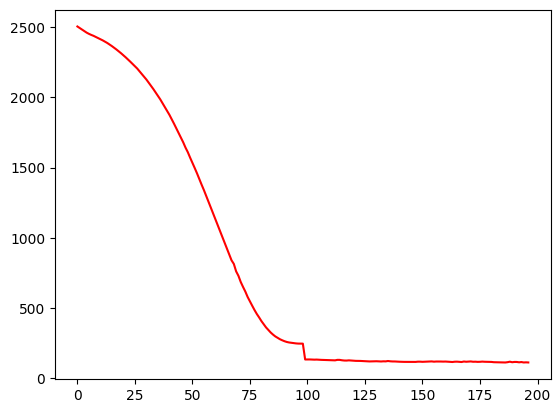

 39%|███▉      | 197/500 [00:36<01:07,  4.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.50953850405587
Dataset Name:  weibo , AUC Score (contextual):  67.32755894495426
Dataset Name:  weibo , AUC Score (structural):  49.385577680661605
Dataset Name:  weibo , AUC Score (joint-type):  49.690005301475914
Dataset Name:  weibo , AUC Score (structure type):  49.19841325728235
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.690005301475914
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


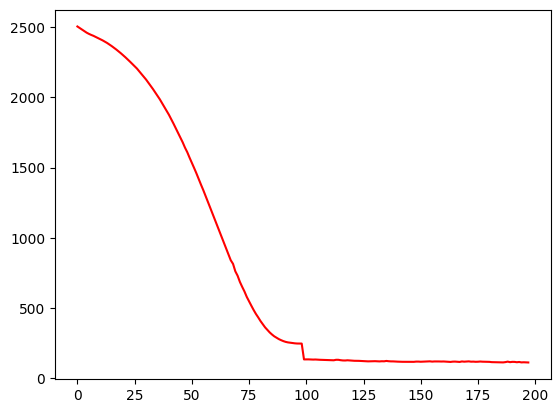

 40%|███▉      | 198/500 [00:36<01:04,  4.68it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.31738354990955
Dataset Name:  weibo , AUC Score (contextual):  67.81313251319443
Dataset Name:  weibo , AUC Score (structural):  49.28859376151365
Dataset Name:  weibo , AUC Score (joint-type):  49.85887783306653
Dataset Name:  weibo , AUC Score (structure type):  49.15640769178705
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.85887783306653
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


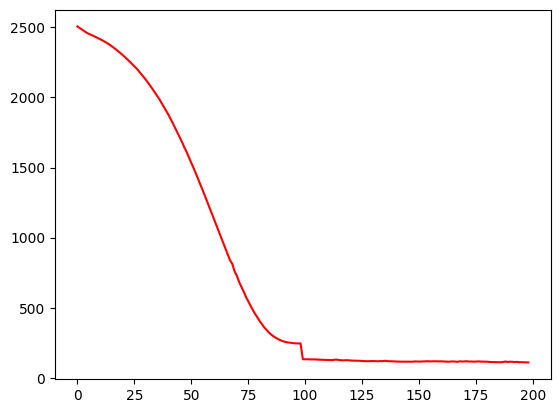

 40%|███▉      | 199/500 [00:36<01:03,  4.78it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.07391247724742
Dataset Name:  weibo , AUC Score (contextual):  67.72970797944392
Dataset Name:  weibo , AUC Score (structural):  49.578315506657376
Dataset Name:  weibo , AUC Score (joint-type):  49.311472983574674
Dataset Name:  weibo , AUC Score (structure type):  49.34719032731411
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.311472983574674
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


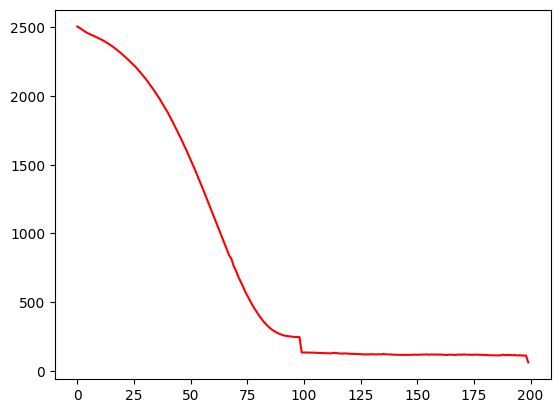

 40%|████      | 200/500 [00:36<01:01,  4.87it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.6743169946849
Dataset Name:  weibo , AUC Score (contextual):  67.63732239043955
Dataset Name:  weibo , AUC Score (structural):  49.60015531030886
Dataset Name:  weibo , AUC Score (joint-type):  49.06961121160983
Dataset Name:  weibo , AUC Score (structure type):  49.36394583635001
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.06961121160983
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


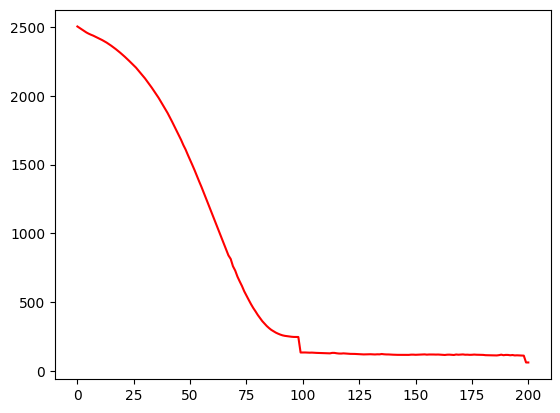

 40%|████      | 201/500 [00:36<01:00,  4.92it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.65765327303887
Dataset Name:  weibo , AUC Score (contextual):  68.48552963016279
Dataset Name:  weibo , AUC Score (structural):  49.427633331632855
Dataset Name:  weibo , AUC Score (joint-type):  49.270093142942706
Dataset Name:  weibo , AUC Score (structure type):  49.206238381954506
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.270093142942706
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


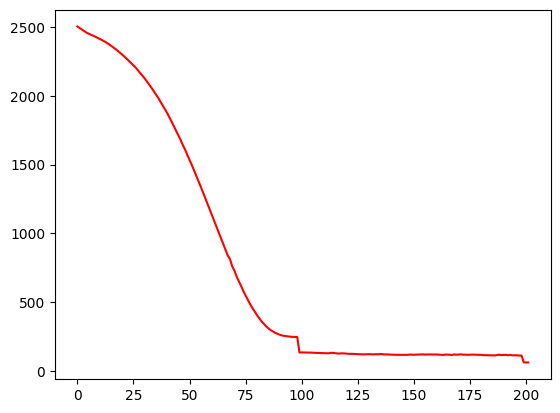

 40%|████      | 202/500 [00:37<01:00,  4.92it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.77330881934836
Dataset Name:  weibo , AUC Score (contextual):  66.9486797474948
Dataset Name:  weibo , AUC Score (structural):  49.074163506612024
Dataset Name:  weibo , AUC Score (joint-type):  49.37998169632198
Dataset Name:  weibo , AUC Score (structure type):  48.86792351785245
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.37998169632198
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


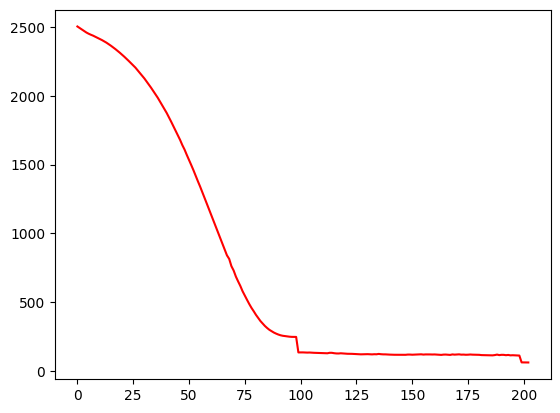

 41%|████      | 203/500 [00:37<00:58,  5.12it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.50356429020823
Dataset Name:  weibo , AUC Score (contextual):  67.0682375685593
Dataset Name:  weibo , AUC Score (structural):  49.43647298224134
Dataset Name:  weibo , AUC Score (joint-type):  49.32858570844658
Dataset Name:  weibo , AUC Score (structure type):  49.22471729849919
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.32858570844658
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


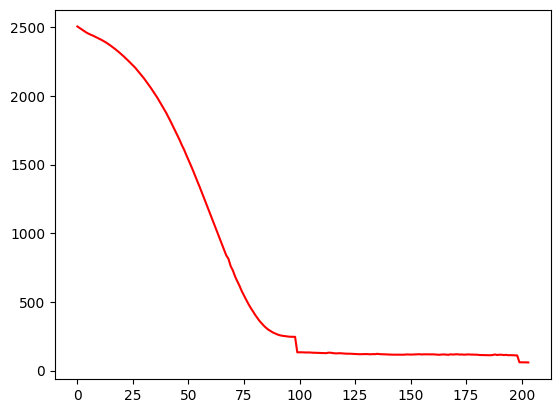

 41%|████      | 204/500 [00:37<00:55,  5.29it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.67343287706913
Dataset Name:  weibo , AUC Score (contextual):  66.9543743535755
Dataset Name:  weibo , AUC Score (structural):  49.70809597496897
Dataset Name:  weibo , AUC Score (joint-type):  49.317225402915064
Dataset Name:  weibo , AUC Score (structure type):  49.53223017021683
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.317225402915064
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


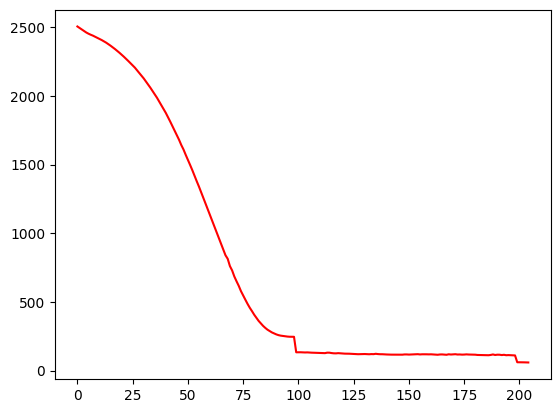

 41%|████      | 205/500 [00:37<00:54,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.79765354206499
Dataset Name:  weibo , AUC Score (contextual):  66.9379987477648
Dataset Name:  weibo , AUC Score (structural):  49.67448319644487
Dataset Name:  weibo , AUC Score (joint-type):  49.40569414357461
Dataset Name:  weibo , AUC Score (structure type):  49.52505737665131
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.40569414357461
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


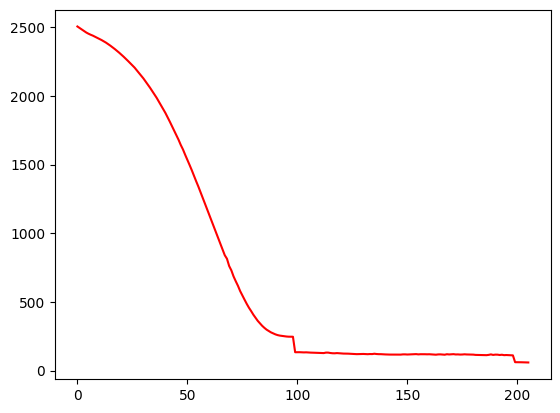

 41%|████      | 206/500 [00:37<00:52,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.18522692046426
Dataset Name:  weibo , AUC Score (contextual):  67.2049081144957
Dataset Name:  weibo , AUC Score (structural):  49.498778490089045
Dataset Name:  weibo , AUC Score (joint-type):  49.36893936371882
Dataset Name:  weibo , AUC Score (structure type):  49.32156425467097
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.36893936371882
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


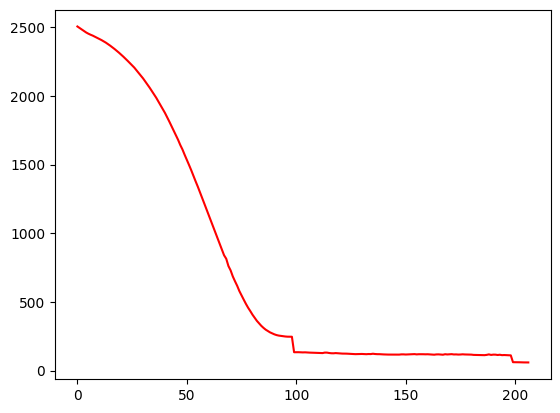

 41%|████▏     | 207/500 [00:37<00:50,  5.76it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.97824251358428
Dataset Name:  weibo , AUC Score (contextual):  67.72628254380655
Dataset Name:  weibo , AUC Score (structural):  49.74738268120008
Dataset Name:  weibo , AUC Score (joint-type):  49.7542647396351
Dataset Name:  weibo , AUC Score (structure type):  49.60237428012841
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.7542647396351
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


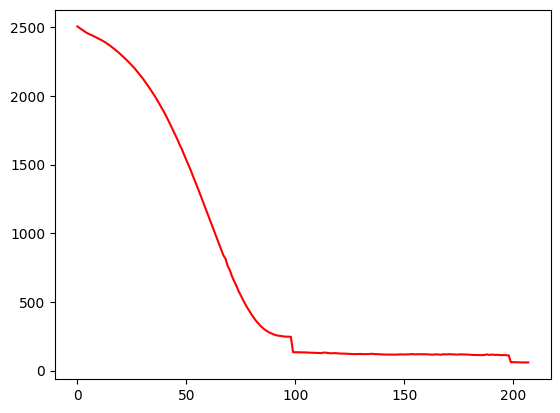

 42%|████▏     | 208/500 [00:38<00:50,  5.78it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.17251727117038
Dataset Name:  weibo , AUC Score (contextual):  69.55666479929839
Dataset Name:  weibo , AUC Score (structural):  49.86468164220813
Dataset Name:  weibo , AUC Score (joint-type):  49.69017874125502
Dataset Name:  weibo , AUC Score (structure type):  49.70208693539745
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.69017874125502
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


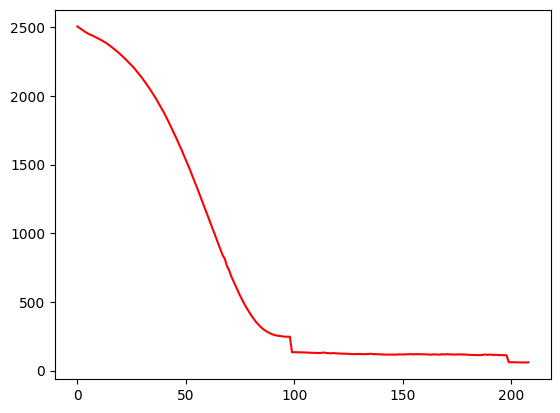

 42%|████▏     | 209/500 [00:38<00:49,  5.89it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.35088219163342
Dataset Name:  weibo , AUC Score (contextual):  70.36078942849858
Dataset Name:  weibo , AUC Score (structural):  49.63186922191803
Dataset Name:  weibo , AUC Score (joint-type):  49.42920968695855
Dataset Name:  weibo , AUC Score (structure type):  49.472973437988884
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.42920968695855
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


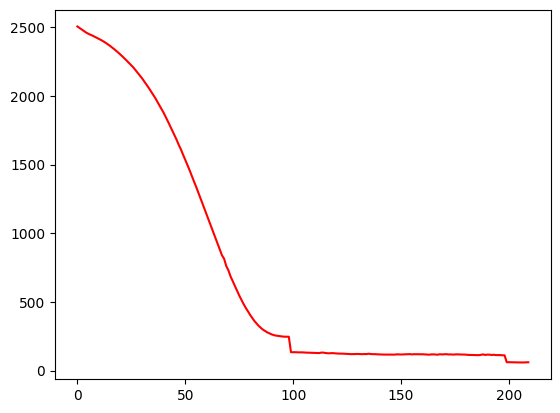

 42%|████▏     | 210/500 [00:38<00:48,  5.93it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.74473274396236
Dataset Name:  weibo , AUC Score (contextual):  69.33258060469201
Dataset Name:  weibo , AUC Score (structural):  49.662829255020654
Dataset Name:  weibo , AUC Score (joint-type):  49.73284492691536
Dataset Name:  weibo , AUC Score (structure type):  49.540080932356055
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.73284492691536
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


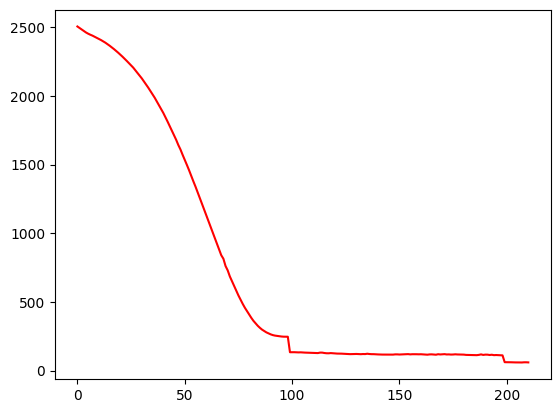

 42%|████▏     | 211/500 [00:38<00:48,  5.95it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.80083324722462
Dataset Name:  weibo , AUC Score (contextual):  68.05898340007874
Dataset Name:  weibo , AUC Score (structural):  49.707727538104876
Dataset Name:  weibo , AUC Score (joint-type):  50.261633906783054
Dataset Name:  weibo , AUC Score (structure type):  49.62134030854749
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  50.261633906783054
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


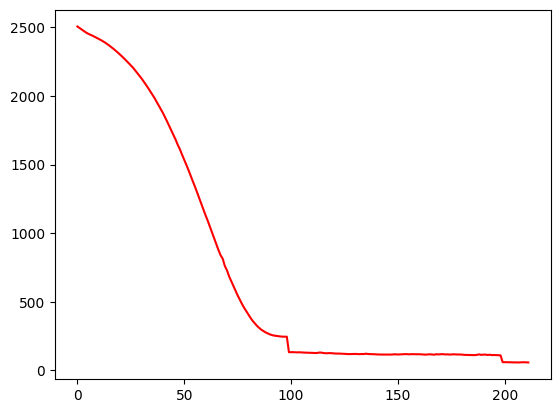

 42%|████▏     | 212/500 [00:38<00:49,  5.85it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.7843095414389
Dataset Name:  weibo , AUC Score (contextual):  67.86871996239825
Dataset Name:  weibo , AUC Score (structural):  49.761672363267415
Dataset Name:  weibo , AUC Score (joint-type):  50.37101659413993
Dataset Name:  weibo , AUC Score (structure type):  49.67869986821203
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  50.37101659413993
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


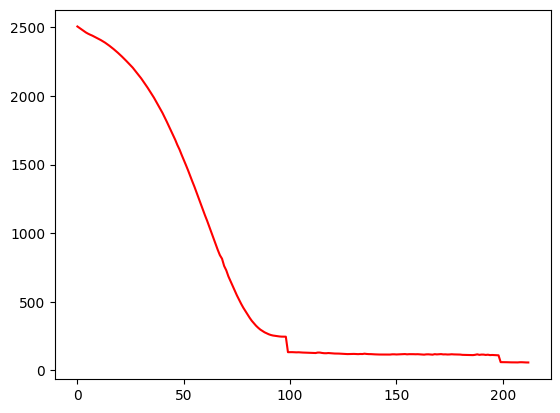

 43%|████▎     | 213/500 [00:38<00:48,  5.93it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.16542231901727
Dataset Name:  weibo , AUC Score (contextual):  69.17957781288969
Dataset Name:  weibo , AUC Score (structural):  49.942909290844064
Dataset Name:  weibo , AUC Score (joint-type):  49.89373922866705
Dataset Name:  weibo , AUC Score (structure type):  49.78346595310189
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.89373922866705
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


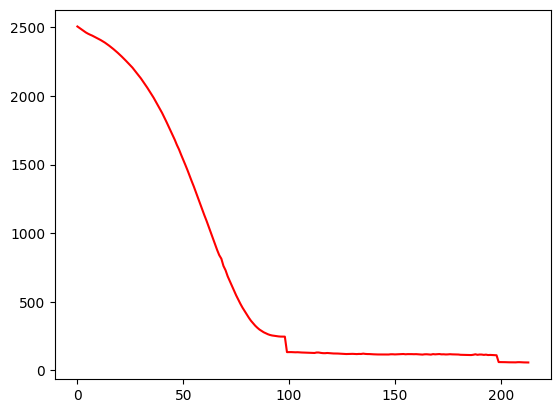

 43%|████▎     | 214/500 [00:39<00:47,  5.97it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.09706523088248
Dataset Name:  weibo , AUC Score (contextual):  68.9415895293249
Dataset Name:  weibo , AUC Score (structural):  49.932326650455444
Dataset Name:  weibo , AUC Score (joint-type):  49.86257788168748
Dataset Name:  weibo , AUC Score (structure type):  49.78018435731656
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.86257788168748
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


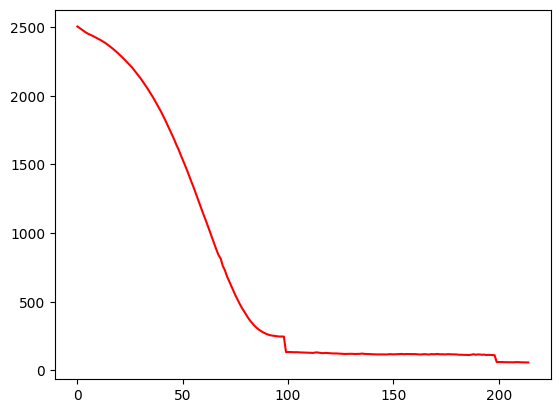

 43%|████▎     | 215/500 [00:39<00:48,  5.82it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.66920916718688
Dataset Name:  weibo , AUC Score (contextual):  68.21585968028113
Dataset Name:  weibo , AUC Score (structural):  49.82322966086804
Dataset Name:  weibo , AUC Score (joint-type):  49.62038368347934
Dataset Name:  weibo , AUC Score (structure type):  49.64100424579244
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.62038368347934
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


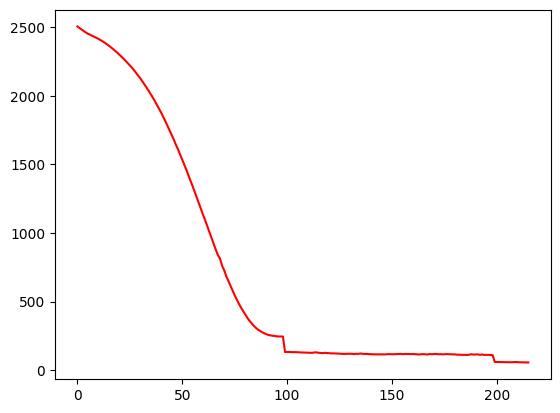

 43%|████▎     | 216/500 [00:39<00:48,  5.85it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.19781734227885
Dataset Name:  weibo , AUC Score (contextual):  67.46295759917722
Dataset Name:  weibo , AUC Score (structural):  49.79075053423345
Dataset Name:  weibo , AUC Score (joint-type):  49.38801773942061
Dataset Name:  weibo , AUC Score (structure type):  49.59656881814012
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.38801773942061
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


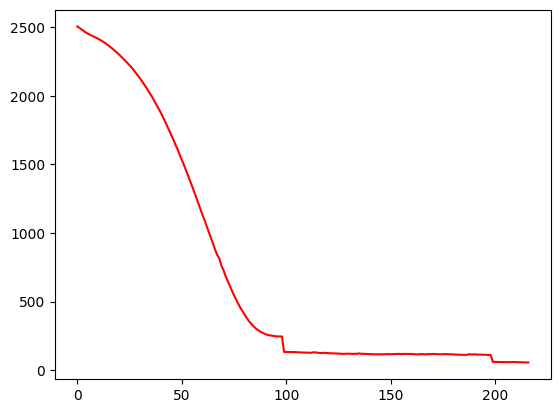

 43%|████▎     | 217/500 [00:39<00:47,  5.95it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.42091274443926
Dataset Name:  weibo , AUC Score (contextual):  67.41211083726897
Dataset Name:  weibo , AUC Score (structural):  49.58237398042183
Dataset Name:  weibo , AUC Score (joint-type):  49.25548084155294
Dataset Name:  weibo , AUC Score (structure type):  49.425640976557325
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.25548084155294
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


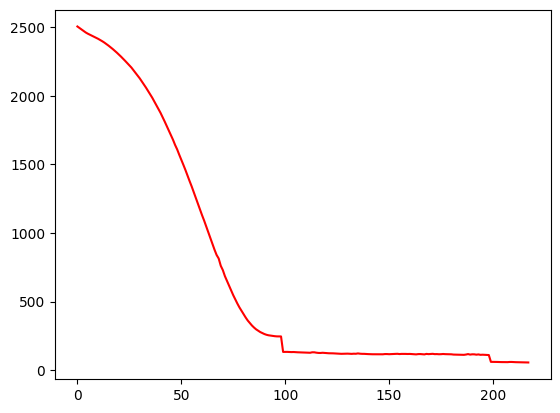

 44%|████▎     | 218/500 [00:39<00:47,  5.99it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.8398979779631
Dataset Name:  weibo , AUC Score (contextual):  67.26266356093835
Dataset Name:  weibo , AUC Score (structural):  49.62681596862052
Dataset Name:  weibo , AUC Score (joint-type):  48.84737704131394
Dataset Name:  weibo , AUC Score (structure type):  49.45362284756373
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.84737704131394
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


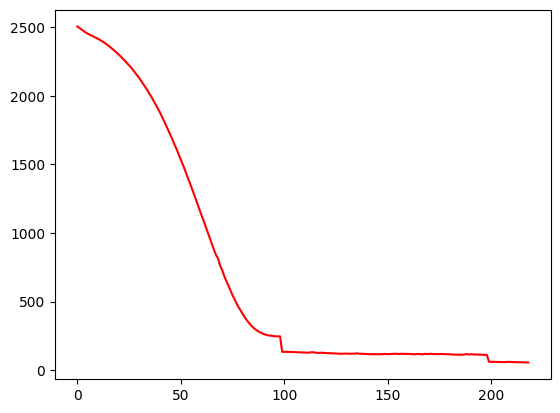

 44%|████▍     | 219/500 [00:39<00:47,  5.97it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.98348057417508
Dataset Name:  weibo , AUC Score (contextual):  68.24465068361289
Dataset Name:  weibo , AUC Score (structural):  49.781012464502524
Dataset Name:  weibo , AUC Score (joint-type):  48.960777750220124
Dataset Name:  weibo , AUC Score (structure type):  49.62907142917371
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.960777750220124
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


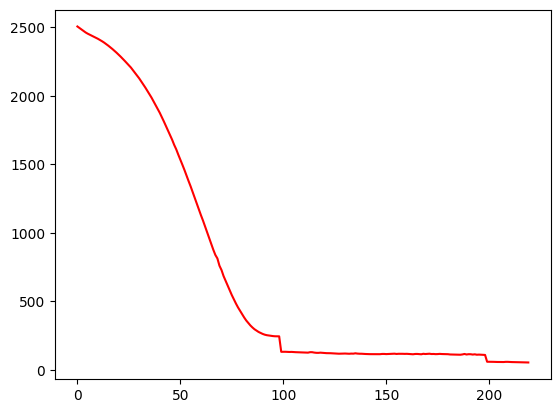

 44%|████▍     | 220/500 [00:40<00:46,  6.00it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.51138561285063
Dataset Name:  weibo , AUC Score (contextual):  68.34481215604723
Dataset Name:  weibo , AUC Score (structural):  49.620243621791055
Dataset Name:  weibo , AUC Score (joint-type):  48.9478275800468
Dataset Name:  weibo , AUC Score (structure type):  49.460519326206345
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.9478275800468
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


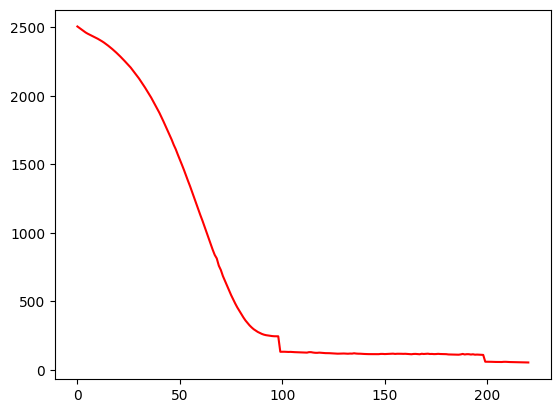

 44%|████▍     | 221/500 [00:40<00:46,  5.97it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.5755416137531
Dataset Name:  weibo , AUC Score (contextual):  67.28281148194463
Dataset Name:  weibo , AUC Score (structural):  49.64043963020275
Dataset Name:  weibo , AUC Score (joint-type):  48.89828161648187
Dataset Name:  weibo , AUC Score (structure type):  49.4813654355441
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.89828161648187
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


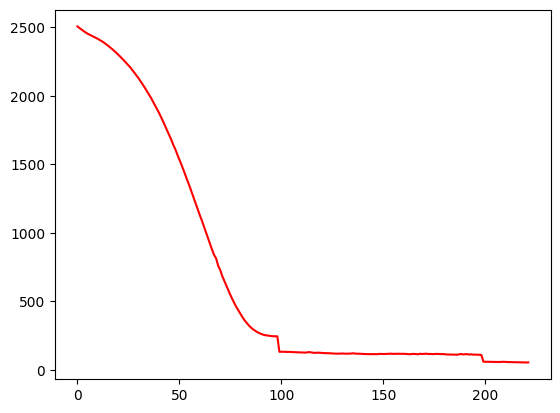

 44%|████▍     | 222/500 [00:40<00:46,  6.02it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.40599402395189
Dataset Name:  weibo , AUC Score (contextual):  67.54875247657553
Dataset Name:  weibo , AUC Score (structural):  50.00263007238367
Dataset Name:  weibo , AUC Score (joint-type):  49.09848893483117
Dataset Name:  weibo , AUC Score (structure type):  49.820212989239785
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.09848893483117
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


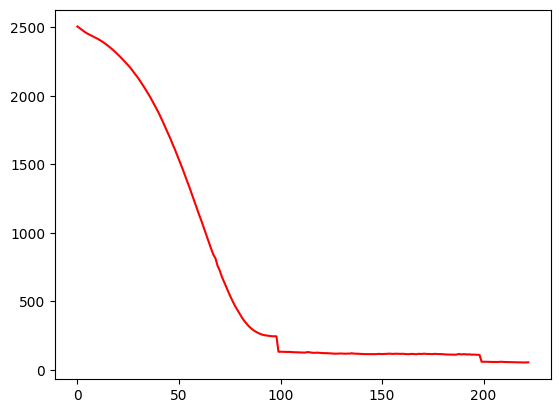

 45%|████▍     | 223/500 [00:40<00:45,  6.03it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.27040853448639
Dataset Name:  weibo , AUC Score (contextual):  67.97506745362077
Dataset Name:  weibo , AUC Score (structural):  49.62683580752858
Dataset Name:  weibo , AUC Score (joint-type):  48.6081746792954
Dataset Name:  weibo , AUC Score (structure type):  49.495705325460236
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.6081746792954
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


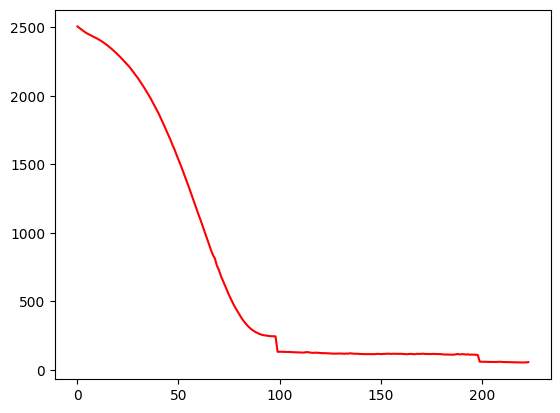

 45%|████▍     | 224/500 [00:40<00:45,  6.05it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.62362758471417
Dataset Name:  weibo , AUC Score (contextual):  67.5628010986832
Dataset Name:  weibo , AUC Score (structural):  49.8691709036906
Dataset Name:  weibo , AUC Score (joint-type):  48.98315148172494
Dataset Name:  weibo , AUC Score (structure type):  49.66422894235307
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.98315148172494
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


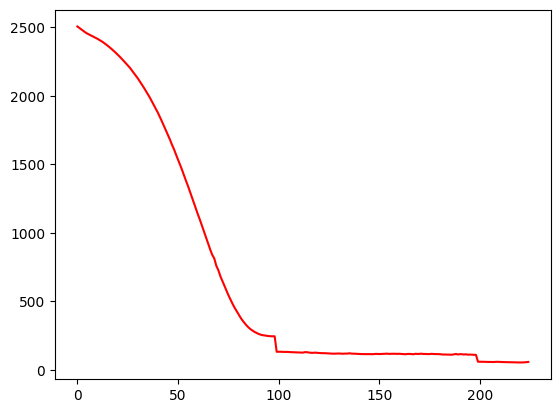

 45%|████▌     | 225/500 [00:40<00:45,  6.01it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.83720282550783
Dataset Name:  weibo , AUC Score (contextual):  69.32492034778144
Dataset Name:  weibo , AUC Score (structural):  49.59399674641908
Dataset Name:  weibo , AUC Score (joint-type):  48.76375016115446
Dataset Name:  weibo , AUC Score (structure type):  49.350571624360285
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.76375016115446
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


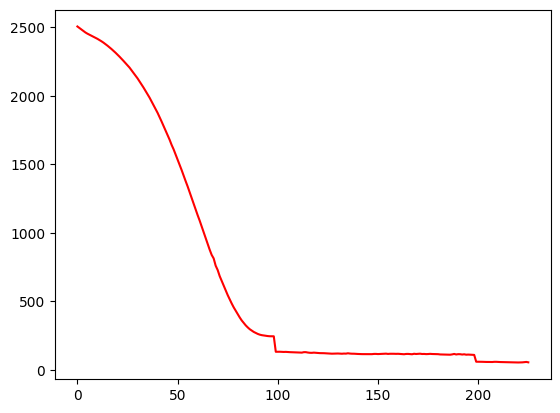

 45%|████▌     | 226/500 [00:41<00:45,  6.06it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.63975141987699
Dataset Name:  weibo , AUC Score (contextual):  69.11858482390369
Dataset Name:  weibo , AUC Score (structural):  49.641437243865525
Dataset Name:  weibo , AUC Score (joint-type):  48.896142525872875
Dataset Name:  weibo , AUC Score (structure type):  49.46216012409902
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.896142525872875
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


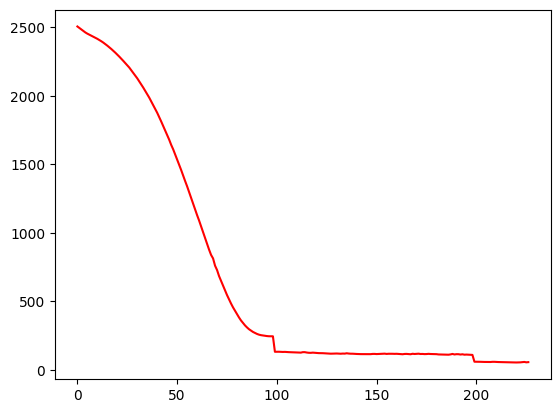

 45%|████▌     | 227/500 [00:41<00:45,  6.05it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.13369435821681
Dataset Name:  weibo , AUC Score (contextual):  67.8096059043526
Dataset Name:  weibo , AUC Score (structural):  49.92012572199454
Dataset Name:  weibo , AUC Score (joint-type):  48.689142149508555
Dataset Name:  weibo , AUC Score (structure type):  49.68232614549912
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.689142149508555
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


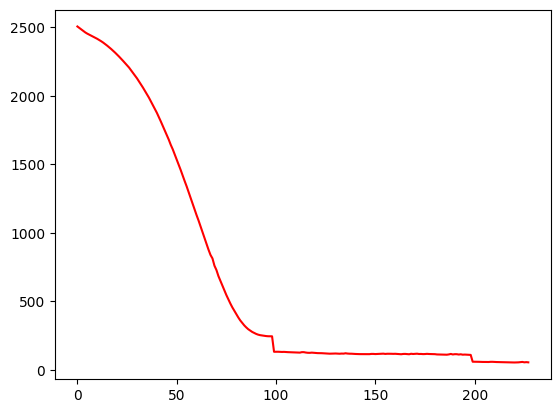

 46%|████▌     | 228/500 [00:41<00:45,  5.99it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.06721739571722
Dataset Name:  weibo , AUC Score (contextual):  67.95113276410399
Dataset Name:  weibo , AUC Score (structural):  49.48984531319967
Dataset Name:  weibo , AUC Score (joint-type):  49.066691641994865
Dataset Name:  weibo , AUC Score (structure type):  49.370406478052395
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.066691641994865
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


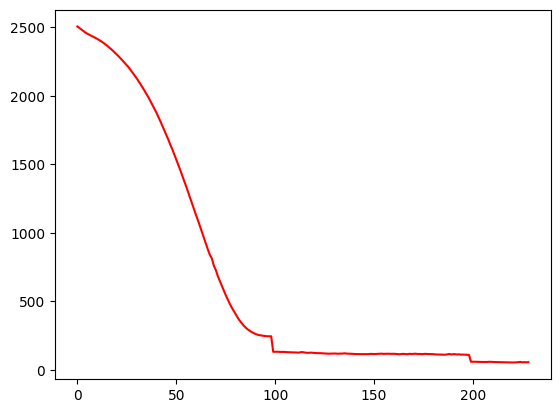

 46%|████▌     | 229/500 [00:41<00:44,  6.05it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.67074506168953
Dataset Name:  weibo , AUC Score (contextual):  66.05916493371421
Dataset Name:  weibo , AUC Score (structural):  49.49400581563419
Dataset Name:  weibo , AUC Score (joint-type):  49.486820600251946
Dataset Name:  weibo , AUC Score (structure type):  49.43928010904014
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.486820600251946
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


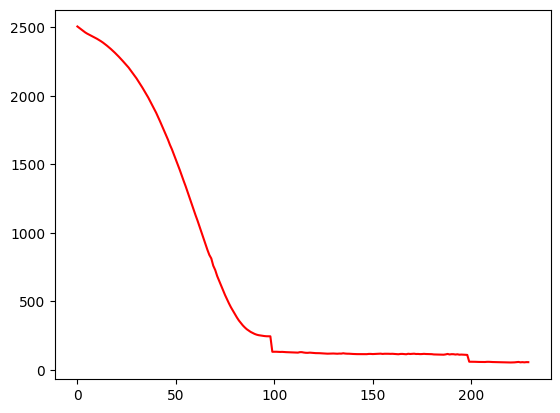

 46%|████▌     | 230/500 [00:41<00:44,  6.01it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.78520344182219
Dataset Name:  weibo , AUC Score (contextual):  65.85149970486331
Dataset Name:  weibo , AUC Score (structural):  49.40700653550314
Dataset Name:  weibo , AUC Score (joint-type):  49.764410966712866
Dataset Name:  weibo , AUC Score (structure type):  49.44715081143153
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.764410966712866
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


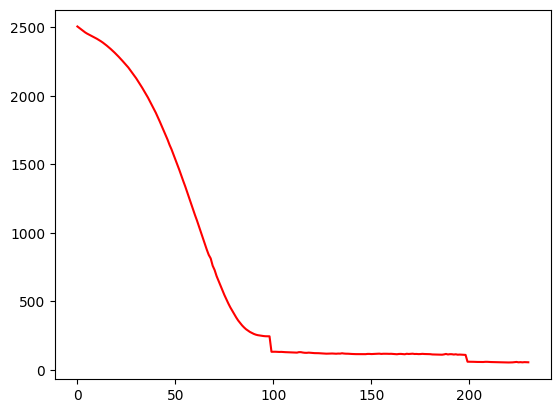

 46%|████▌     | 231/500 [00:41<00:45,  5.91it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.07896160814023
Dataset Name:  weibo , AUC Score (contextual):  65.8414401976751
Dataset Name:  weibo , AUC Score (structural):  49.64182268550796
Dataset Name:  weibo , AUC Score (joint-type):  49.42507603888983
Dataset Name:  weibo , AUC Score (structure type):  49.63593087591944
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.42507603888983
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


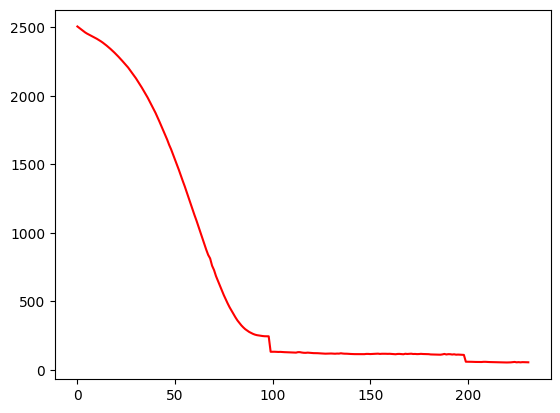

 46%|████▋     | 232/500 [00:42<00:45,  5.95it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.39011475797739
Dataset Name:  weibo , AUC Score (contextual):  66.79515663635517
Dataset Name:  weibo , AUC Score (structural):  49.859325137030176
Dataset Name:  weibo , AUC Score (joint-type):  49.380559828919004
Dataset Name:  weibo , AUC Score (structure type):  49.75814753006363
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.380559828919004
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


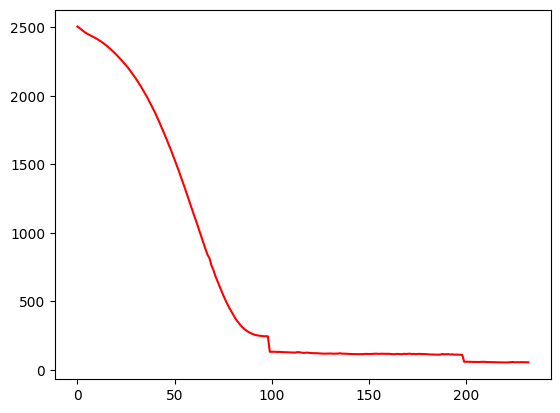

 47%|████▋     | 233/500 [00:42<00:45,  5.81it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.44367785591085
Dataset Name:  weibo , AUC Score (contextual):  66.13004399010931
Dataset Name:  weibo , AUC Score (structural):  49.65041009857104
Dataset Name:  weibo , AUC Score (joint-type):  48.584037643369655
Dataset Name:  weibo , AUC Score (structure type):  49.46286088153234
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.584037643369655
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


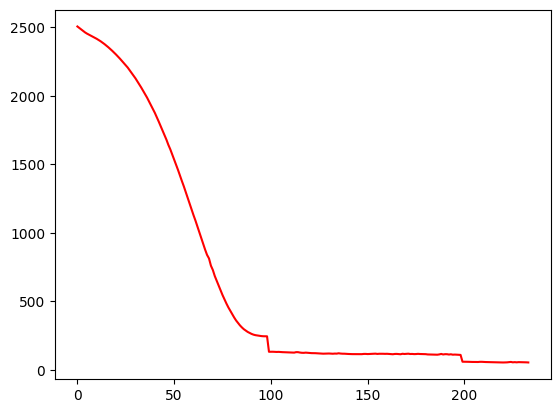

 47%|████▋     | 234/500 [00:42<00:45,  5.81it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.83295557584121
Dataset Name:  weibo , AUC Score (contextual):  66.75046698660525
Dataset Name:  weibo , AUC Score (structural):  49.16008865157776
Dataset Name:  weibo , AUC Score (joint-type):  48.50529598365503
Dataset Name:  weibo , AUC Score (structure type):  48.99302296273862
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.50529598365503
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


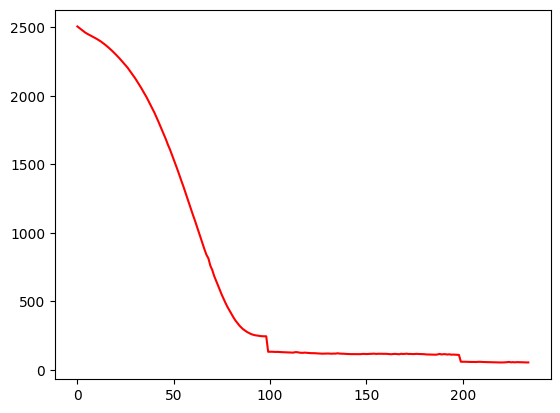

 47%|████▋     | 235/500 [00:42<00:44,  5.89it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.58991494495054
Dataset Name:  weibo , AUC Score (contextual):  65.83114943744808
Dataset Name:  weibo , AUC Score (structural):  49.437252367915384
Dataset Name:  weibo , AUC Score (joint-type):  49.06622913591724
Dataset Name:  weibo , AUC Score (structure type):  49.276251455923266
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.06622913591724
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


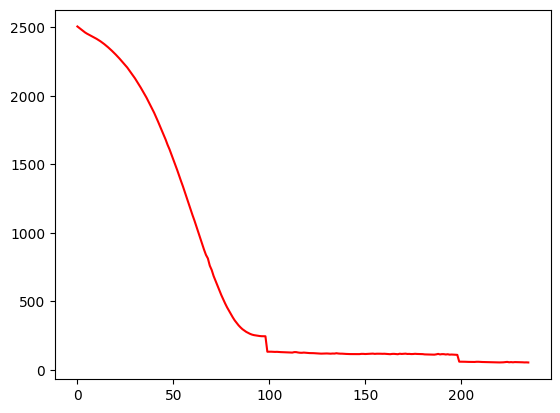

 47%|████▋     | 236/500 [00:42<00:45,  5.76it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.16436211158592
Dataset Name:  weibo , AUC Score (contextual):  66.07981872074288
Dataset Name:  weibo , AUC Score (structural):  49.44845001445407
Dataset Name:  weibo , AUC Score (joint-type):  48.15564138897513
Dataset Name:  weibo , AUC Score (structure type):  49.25278177912171
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.15564138897513
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


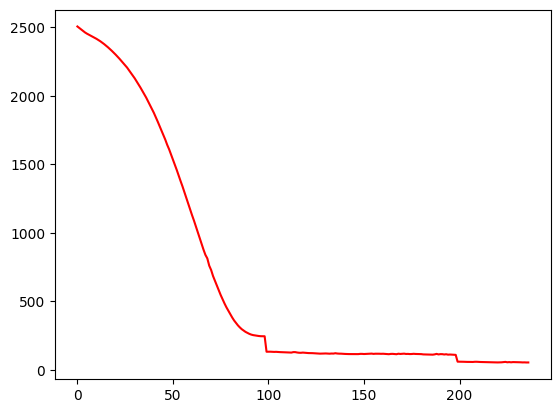

 47%|████▋     | 237/500 [00:43<00:46,  5.68it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.18969275384294
Dataset Name:  weibo , AUC Score (contextual):  65.97429506847114
Dataset Name:  weibo , AUC Score (structural):  49.27137075518221
Dataset Name:  weibo , AUC Score (joint-type):  48.32081387194479
Dataset Name:  weibo , AUC Score (structure type):  49.06508418546577
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.32081387194479
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


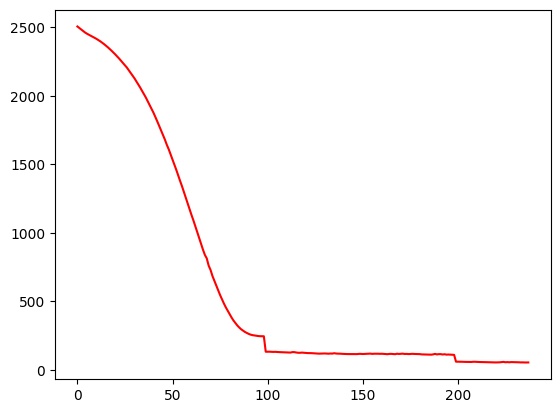

 48%|████▊     | 238/500 [00:43<00:46,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.91539587497378
Dataset Name:  weibo , AUC Score (contextual):  66.18537127964447
Dataset Name:  weibo , AUC Score (structural):  49.29825247561232
Dataset Name:  weibo , AUC Score (joint-type):  48.602219913546044
Dataset Name:  weibo , AUC Score (structure type):  49.142187443383925
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.602219913546044
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


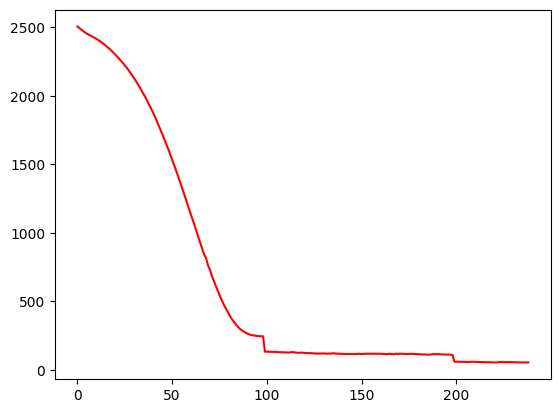

 48%|████▊     | 239/500 [00:43<00:47,  5.53it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.1521947944671
Dataset Name:  weibo , AUC Score (contextual):  65.70664858267902
Dataset Name:  weibo , AUC Score (structural):  49.39591091763452
Dataset Name:  weibo , AUC Score (joint-type):  48.737474034619744
Dataset Name:  weibo , AUC Score (structure type):  49.256228594139294
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.737474034619744
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


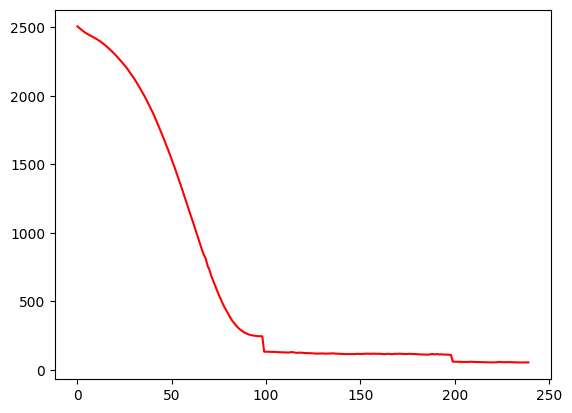

 48%|████▊     | 240/500 [00:43<00:47,  5.44it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.98607117330234
Dataset Name:  weibo , AUC Score (contextual):  65.4050946200715
Dataset Name:  weibo , AUC Score (structural):  49.70273946979101
Dataset Name:  weibo , AUC Score (joint-type):  48.77866598215766
Dataset Name:  weibo , AUC Score (structure type):  49.49669664085372
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.77866598215766
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


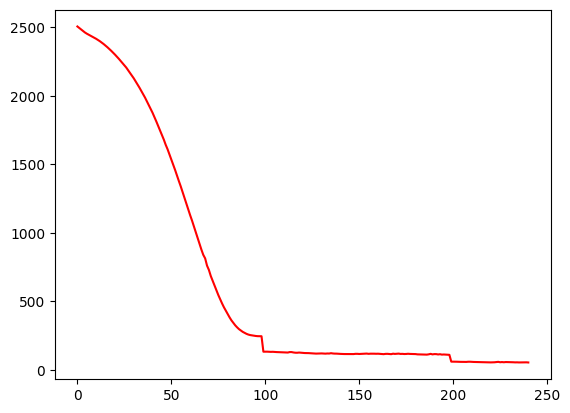

 48%|████▊     | 241/500 [00:43<00:46,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.38641564900408
Dataset Name:  weibo , AUC Score (contextual):  66.18762599677287
Dataset Name:  weibo , AUC Score (structural):  49.11662443813378
Dataset Name:  weibo , AUC Score (joint-type):  49.111598091468665
Dataset Name:  weibo , AUC Score (structure type):  48.96029531171629
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.111598091468665
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


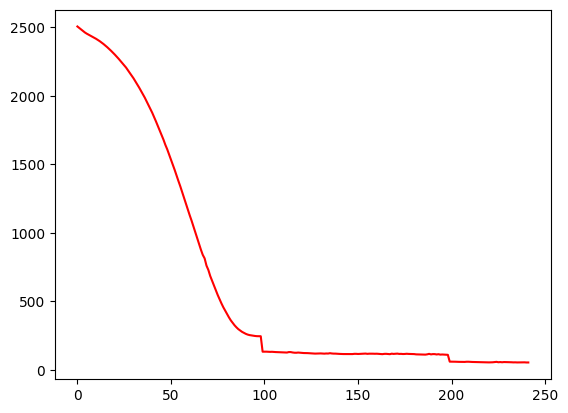

 48%|████▊     | 242/500 [00:43<00:48,  5.37it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.09309587295608
Dataset Name:  weibo , AUC Score (contextual):  67.61347442081231
Dataset Name:  weibo , AUC Score (structural):  49.652541364123316
Dataset Name:  weibo , AUC Score (joint-type):  48.06845899334397
Dataset Name:  weibo , AUC Score (structure type):  49.396790280277905
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.06845899334397
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


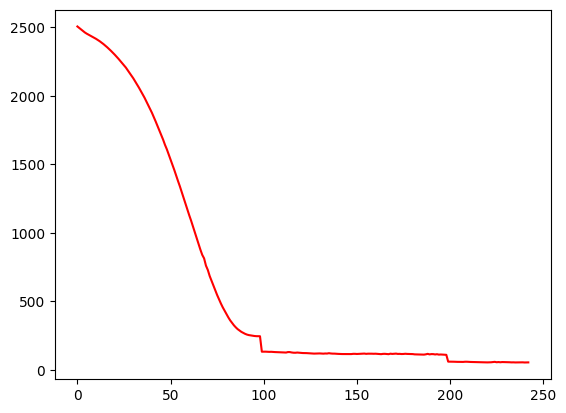

 49%|████▊     | 243/500 [00:44<00:47,  5.39it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.49037314532484
Dataset Name:  weibo , AUC Score (contextual):  68.92259787351267
Dataset Name:  weibo , AUC Score (structural):  49.51548001655131
Dataset Name:  weibo , AUC Score (joint-type):  48.337319557589815
Dataset Name:  weibo , AUC Score (structure type):  49.20959973874851
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.337319557589815
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


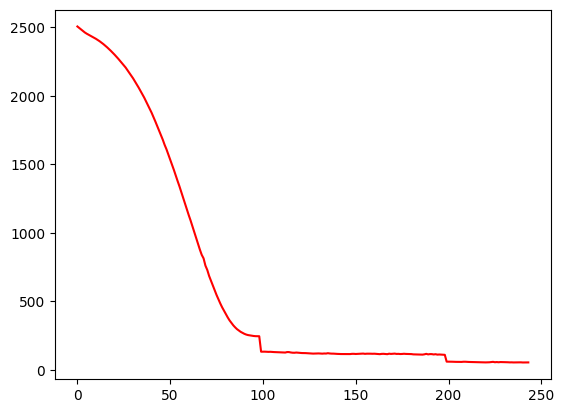

 49%|████▉     | 244/500 [00:44<00:47,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.88955316597871
Dataset Name:  weibo , AUC Score (contextual):  67.87163953201322
Dataset Name:  weibo , AUC Score (structural):  49.01295197283769
Dataset Name:  weibo , AUC Score (joint-type):  48.473354157669476
Dataset Name:  weibo , AUC Score (structure type):  48.88851325251948
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.473354157669476
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


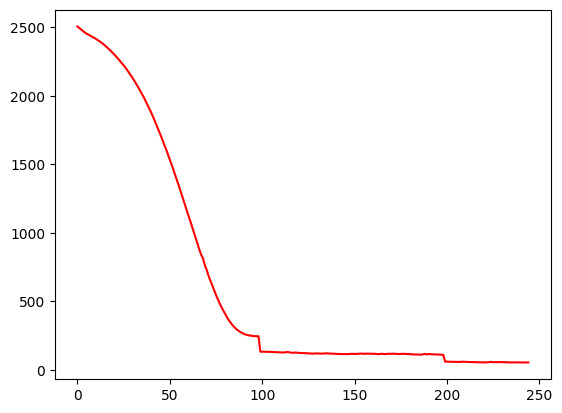

 49%|████▉     | 245/500 [00:44<00:46,  5.51it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.23493316229793
Dataset Name:  weibo , AUC Score (contextual):  67.25584159629348
Dataset Name:  weibo , AUC Score (structural):  49.46932054574002
Dataset Name:  weibo , AUC Score (joint-type):  49.0663158558068
Dataset Name:  weibo , AUC Score (structure type):  49.3440511619014
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.0663158558068
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


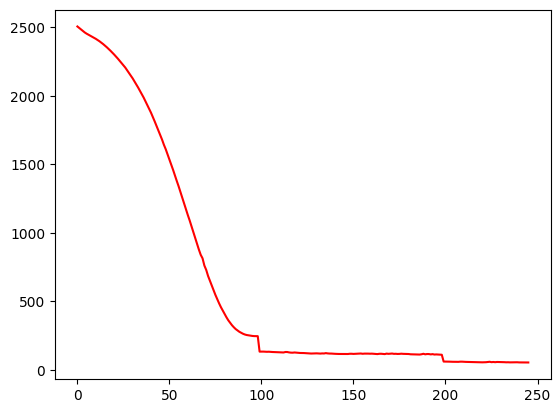

 49%|████▉     | 246/500 [00:44<00:45,  5.63it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.5086085297173
Dataset Name:  weibo , AUC Score (contextual):  66.66556821473232
Dataset Name:  weibo , AUC Score (structural):  49.34258960101122
Dataset Name:  weibo , AUC Score (joint-type):  50.01439550166589
Dataset Name:  weibo , AUC Score (structure type):  49.23507483519666
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  50.01439550166589
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


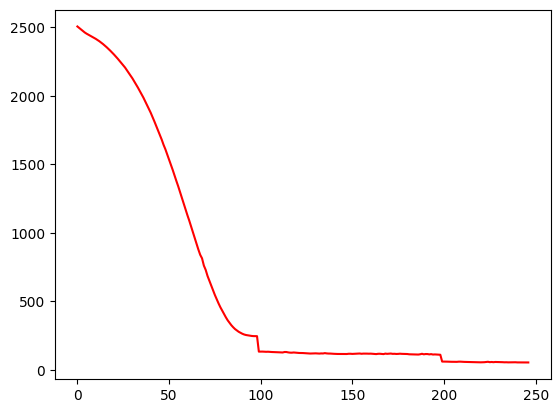

 49%|████▉     | 247/500 [00:44<00:44,  5.71it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.26873201270048
Dataset Name:  weibo , AUC Score (contextual):  66.22222723270474
Dataset Name:  weibo , AUC Score (structural):  49.18434313375391
Dataset Name:  weibo , AUC Score (joint-type):  49.68442632191463
Dataset Name:  weibo , AUC Score (structure type):  49.13066767484582
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.68442632191463
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


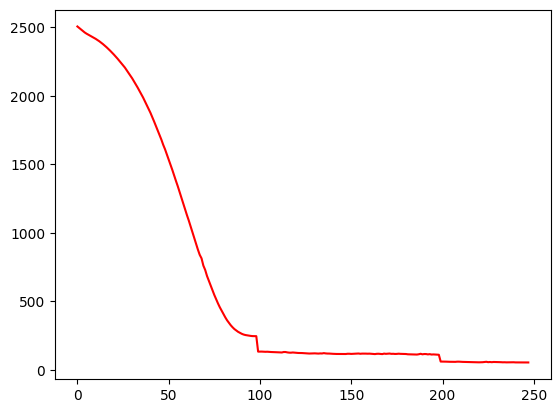

 50%|████▉     | 248/500 [00:44<00:43,  5.76it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.4744758423727
Dataset Name:  weibo , AUC Score (contextual):  66.11943525695393
Dataset Name:  weibo , AUC Score (structural):  49.424456272212495
Dataset Name:  weibo , AUC Score (joint-type):  49.102015543673005
Dataset Name:  weibo , AUC Score (structure type):  49.361609978238924
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.102015543673005
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


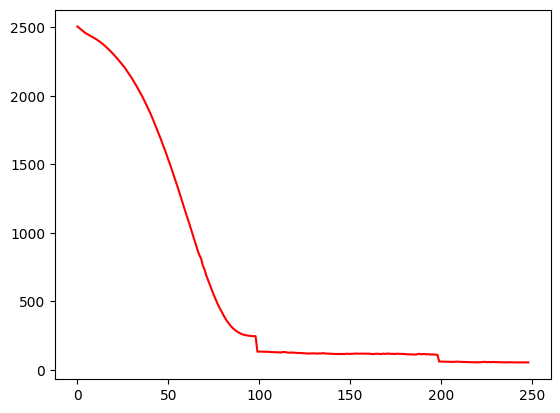

 50%|████▉     | 249/500 [00:45<00:43,  5.77it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.75777867589018
Dataset Name:  weibo , AUC Score (contextual):  66.18167123102351
Dataset Name:  weibo , AUC Score (structural):  49.38583275233674
Dataset Name:  weibo , AUC Score (joint-type):  49.19336049400274
Dataset Name:  weibo , AUC Score (structure type):  49.28916419350568
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.19336049400274
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


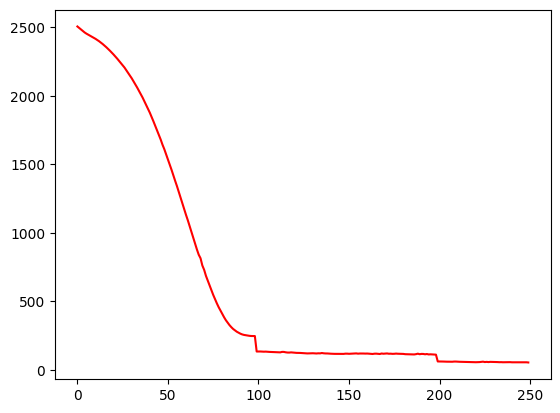

 50%|█████     | 250/500 [00:45<00:42,  5.86it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.73574971767545
Dataset Name:  weibo , AUC Score (contextual):  67.6229557954035
Dataset Name:  weibo , AUC Score (structural):  49.46650342079458
Dataset Name:  weibo , AUC Score (joint-type):  48.84471763136762
Dataset Name:  weibo , AUC Score (structure type):  49.301282169608825
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.84471763136762
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


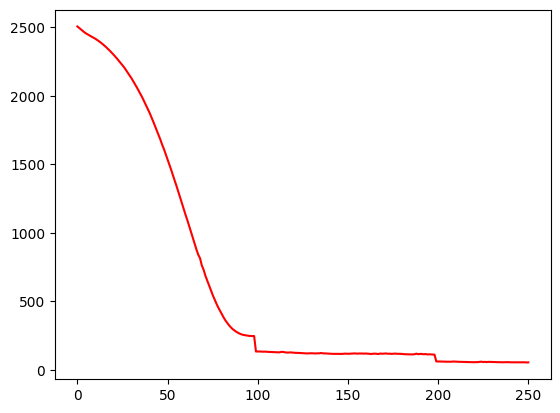

 50%|█████     | 251/500 [00:45<00:43,  5.71it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.70494408842644
Dataset Name:  weibo , AUC Score (contextual):  66.7604397739039
Dataset Name:  weibo , AUC Score (structural):  49.13904523837866
Dataset Name:  weibo , AUC Score (joint-type):  48.327057703992644
Dataset Name:  weibo , AUC Score (structure type):  48.895062201052895
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.327057703992644
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


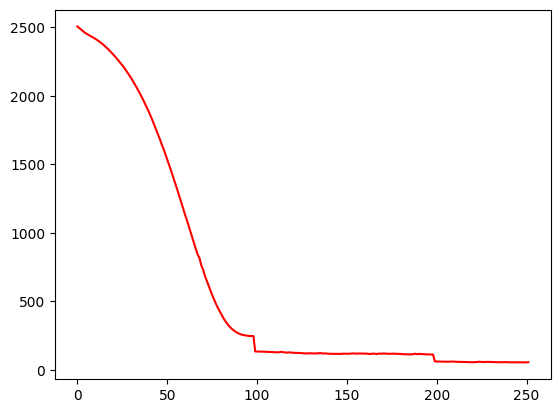

 50%|█████     | 252/500 [00:45<00:44,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.09253305811148
Dataset Name:  weibo , AUC Score (contextual):  70.10843454989775
Dataset Name:  weibo , AUC Score (structural):  49.70674976335017
Dataset Name:  weibo , AUC Score (joint-type):  48.702525919129656
Dataset Name:  weibo , AUC Score (structure type):  49.675899687086165
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.702525919129656
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


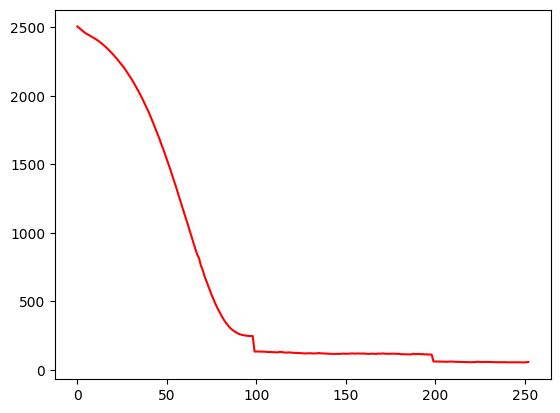

 51%|█████     | 253/500 [00:45<00:43,  5.65it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.87521040592983
Dataset Name:  weibo , AUC Score (contextual):  69.16882454658506
Dataset Name:  weibo , AUC Score (structural):  49.44104159935608
Dataset Name:  weibo , AUC Score (joint-type):  50.008556362435954
Dataset Name:  weibo , AUC Score (structure type):  49.48462424246982
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  50.008556362435954
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


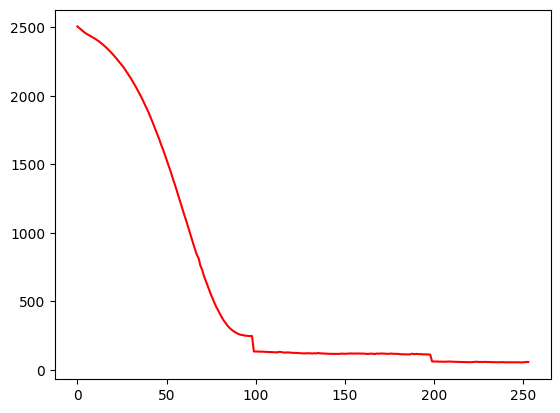

 51%|█████     | 254/500 [00:46<00:44,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.04255931872807
Dataset Name:  weibo , AUC Score (contextual):  68.1043089956854
Dataset Name:  weibo , AUC Score (structural):  49.71582748085545
Dataset Name:  weibo , AUC Score (joint-type):  49.52116167651515
Dataset Name:  weibo , AUC Score (structure type):  49.65000299673504
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.52116167651515
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


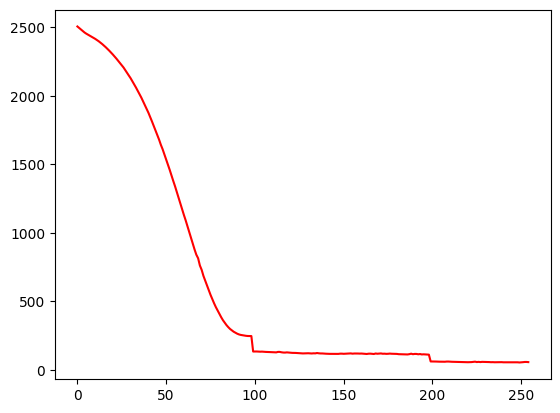

 51%|█████     | 255/500 [00:46<00:42,  5.72it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.5780053426139
Dataset Name:  weibo , AUC Score (contextual):  67.73991201978139
Dataset Name:  weibo , AUC Score (structural):  49.79055214515278
Dataset Name:  weibo , AUC Score (joint-type):  49.00434004140586
Dataset Name:  weibo , AUC Score (structure type):  49.64935351423586
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.00434004140586
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


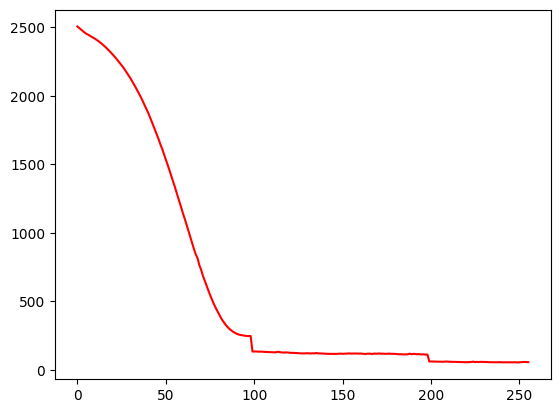

 51%|█████     | 256/500 [00:46<00:43,  5.66it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.973894073416
Dataset Name:  weibo , AUC Score (contextual):  68.95254514203849
Dataset Name:  weibo , AUC Score (structural):  49.87780366282926
Dataset Name:  weibo , AUC Score (joint-type):  48.42357694106574
Dataset Name:  weibo , AUC Score (structure type):  49.61064663617062
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.42357694106574
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


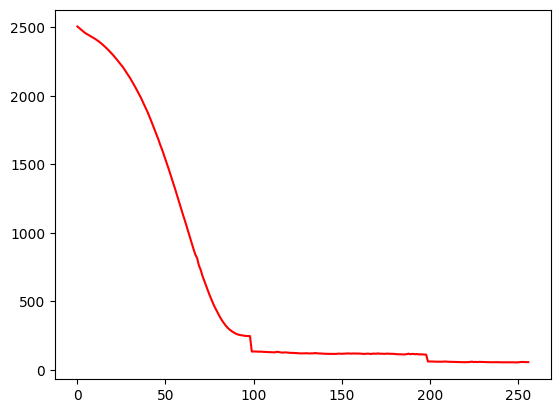

 51%|█████▏    | 257/500 [00:46<00:43,  5.65it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.22480677505565
Dataset Name:  weibo , AUC Score (contextual):  68.9109774083125
Dataset Name:  weibo , AUC Score (structural):  50.08803373748023
Dataset Name:  weibo , AUC Score (joint-type):  48.744295999264615
Dataset Name:  weibo , AUC Score (structure type):  49.93541067462089
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.744295999264615
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


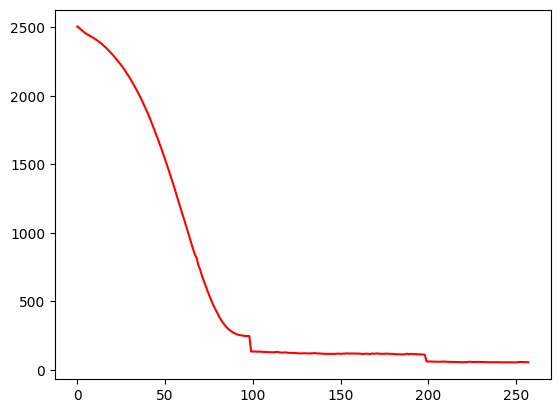

 52%|█████▏    | 258/500 [00:46<00:42,  5.65it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.67084227794187
Dataset Name:  weibo , AUC Score (contextual):  68.09676436529423
Dataset Name:  weibo , AUC Score (structural):  49.775372546352195
Dataset Name:  weibo , AUC Score (joint-type):  48.72293399980459
Dataset Name:  weibo , AUC Score (structure type):  49.61435552307383
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.72293399980459
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


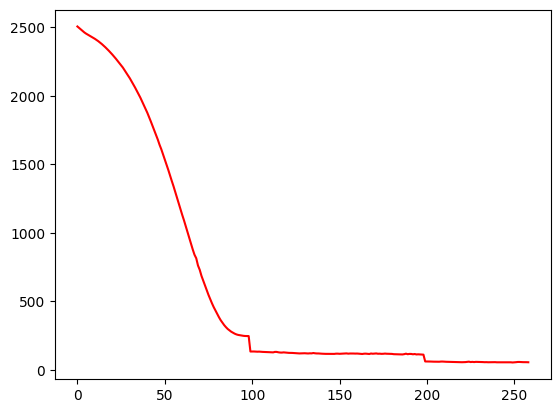

 52%|█████▏    | 259/500 [00:46<00:42,  5.67it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.7734543380154
Dataset Name:  weibo , AUC Score (contextual):  67.91034550938396
Dataset Name:  weibo , AUC Score (structural):  49.62603091468702
Dataset Name:  weibo , AUC Score (joint-type):  48.206170177954995
Dataset Name:  weibo , AUC Score (structure type):  49.39104179043866
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.206170177954995
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


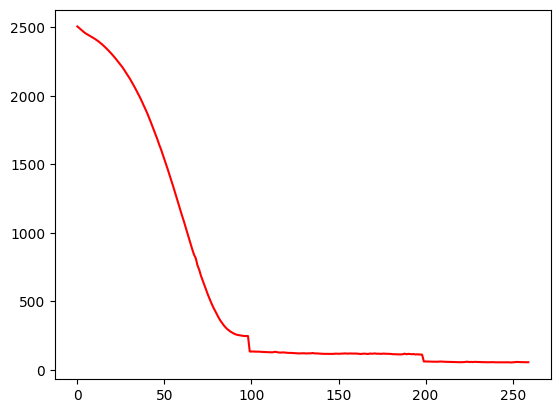

 52%|█████▏    | 260/500 [00:47<00:57,  4.19it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.2923818532108
Dataset Name:  weibo , AUC Score (contextual):  68.79563995520628
Dataset Name:  weibo , AUC Score (structural):  49.86795222790937
Dataset Name:  weibo , AUC Score (joint-type):  49.121585332082255
Dataset Name:  weibo , AUC Score (structure type):  49.7172130409705
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.121585332082255
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


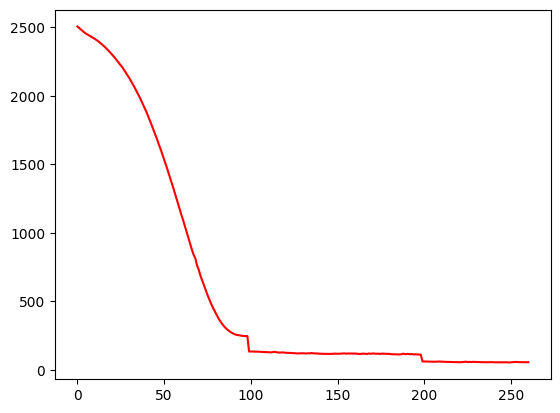

 52%|█████▏    | 261/500 [00:47<00:52,  4.57it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.07859781147263
Dataset Name:  weibo , AUC Score (contextual):  69.95317704096705
Dataset Name:  weibo , AUC Score (structural):  49.866345276355986
Dataset Name:  weibo , AUC Score (joint-type):  49.767937575554704
Dataset Name:  weibo , AUC Score (structure type):  49.86775909623029
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.767937575554704
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


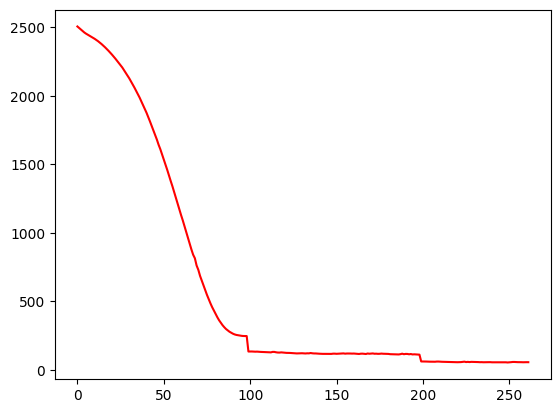

 52%|█████▏    | 262/500 [00:47<00:48,  4.90it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.18257517903994
Dataset Name:  weibo , AUC Score (contextual):  68.22166991288118
Dataset Name:  weibo , AUC Score (structural):  49.714597468555326
Dataset Name:  weibo , AUC Score (joint-type):  49.43837308862137
Dataset Name:  weibo , AUC Score (structure type):  49.70054868737308
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.43837308862137
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


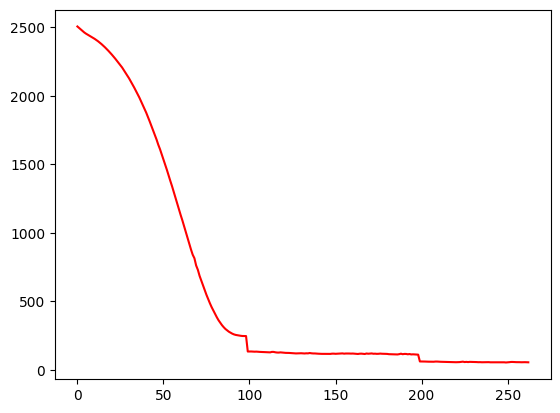

 53%|█████▎    | 263/500 [00:47<00:45,  5.15it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.5828939749769
Dataset Name:  weibo , AUC Score (contextual):  66.94599143091865
Dataset Name:  weibo , AUC Score (structural):  49.701651163977075
Dataset Name:  weibo , AUC Score (joint-type):  49.096407657481876
Dataset Name:  weibo , AUC Score (structure type):  49.497739231181356
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.096407657481876
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


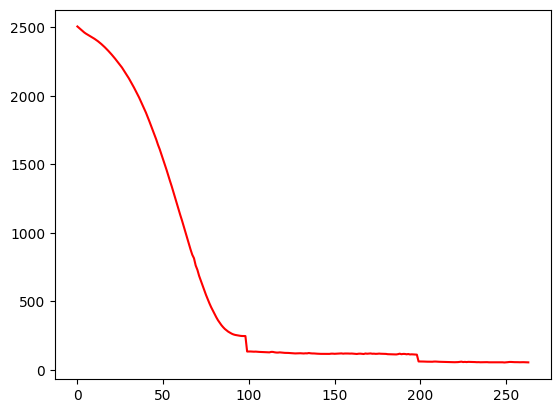

 53%|█████▎    | 264/500 [00:48<00:43,  5.39it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.89659981571711
Dataset Name:  weibo , AUC Score (contextual):  67.51199769671973
Dataset Name:  weibo , AUC Score (structural):  50.10200883114821
Dataset Name:  weibo , AUC Score (joint-type):  48.78129648547413
Dataset Name:  weibo , AUC Score (structure type):  49.92200227934174
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.78129648547413
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


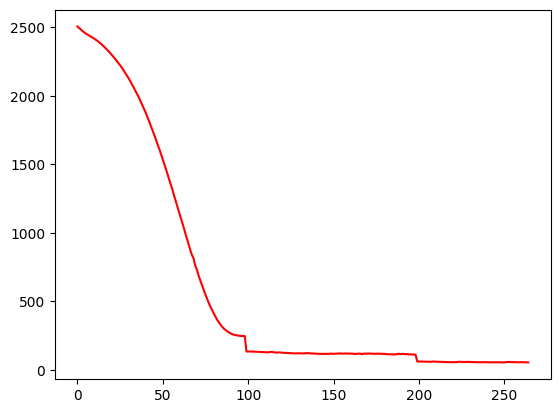

 53%|█████▎    | 265/500 [00:48<00:43,  5.43it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.54966313651424
Dataset Name:  weibo , AUC Score (contextual):  66.64050616665136
Dataset Name:  weibo , AUC Score (structural):  50.128947234172806
Dataset Name:  weibo , AUC Score (joint-type):  48.40533685762964
Dataset Name:  weibo , AUC Score (structure type):  49.973781417006734
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.40533685762964
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


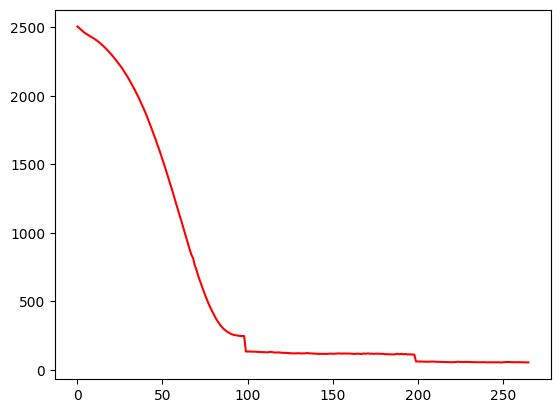

 53%|█████▎    | 266/500 [00:48<00:42,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.17516656690282
Dataset Name:  weibo , AUC Score (contextual):  67.70346075953904
Dataset Name:  weibo , AUC Score (structural):  49.81241462184207
Dataset Name:  weibo , AUC Score (joint-type):  48.99569695908035
Dataset Name:  weibo , AUC Score (structure type):  49.6885104722786
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.99569695908035
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


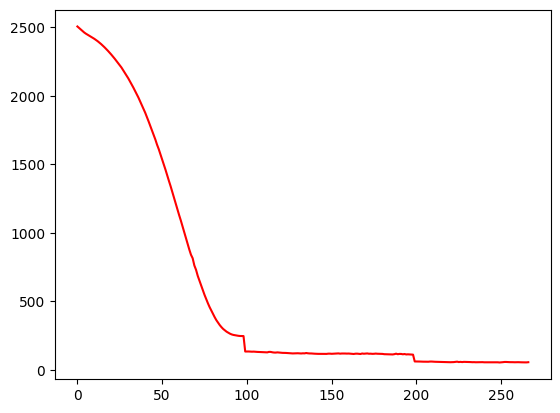

 53%|█████▎    | 267/500 [00:48<00:41,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.04787380719021
Dataset Name:  weibo , AUC Score (contextual):  69.9977655175125
Dataset Name:  weibo , AUC Score (structural):  49.31693222462178
Dataset Name:  weibo , AUC Score (joint-type):  48.237013552006204
Dataset Name:  weibo , AUC Score (structure type):  49.06184247018477
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.237013552006204
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


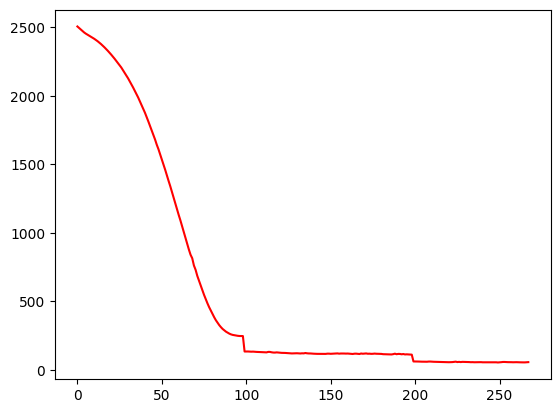

 54%|█████▎    | 268/500 [00:48<00:40,  5.67it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.60453345675926
Dataset Name:  weibo , AUC Score (contextual):  69.13509050954872
Dataset Name:  weibo , AUC Score (structural):  49.908038158722604
Dataset Name:  weibo , AUC Score (joint-type):  48.51977820521048
Dataset Name:  weibo , AUC Score (structure type):  49.61672556447436
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.51977820521048
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


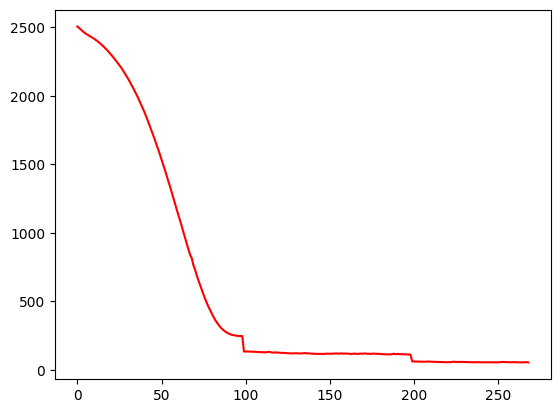

 54%|█████▍    | 269/500 [00:48<00:40,  5.69it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.48529069188012
Dataset Name:  weibo , AUC Score (contextual):  69.17000971840895
Dataset Name:  weibo , AUC Score (structural):  49.592477652887126
Dataset Name:  weibo , AUC Score (joint-type):  48.93262269274507
Dataset Name:  weibo , AUC Score (structure type):  49.36107159143039
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.93262269274507
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


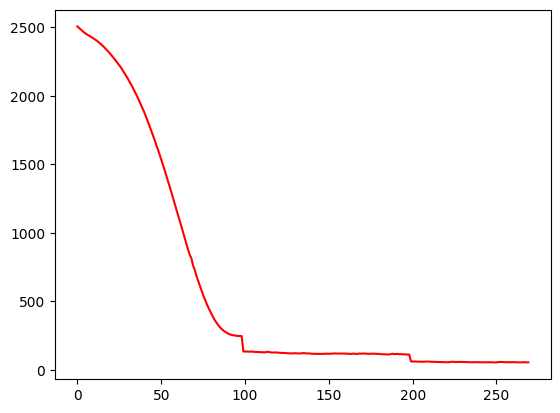

 54%|█████▍    | 270/500 [00:49<00:40,  5.75it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.24965072462793
Dataset Name:  weibo , AUC Score (contextual):  67.9405240309486
Dataset Name:  weibo , AUC Score (structural):  49.16145470210462
Dataset Name:  weibo , AUC Score (joint-type):  48.288958765848776
Dataset Name:  weibo , AUC Score (structure type):  48.91186043920058
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.288958765848776
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


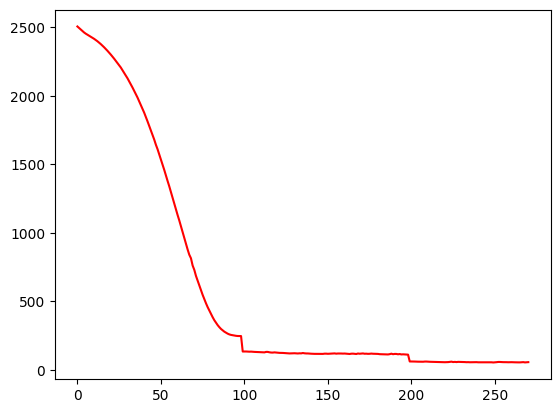

 54%|█████▍    | 271/500 [00:49<00:39,  5.82it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.82636260194714
Dataset Name:  weibo , AUC Score (contextual):  67.69909585843152
Dataset Name:  weibo , AUC Score (structural):  49.71160462756701
Dataset Name:  weibo , AUC Score (joint-type):  47.898343476669744
Dataset Name:  weibo , AUC Score (structure type):  49.4567876504435
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.898343476669744
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


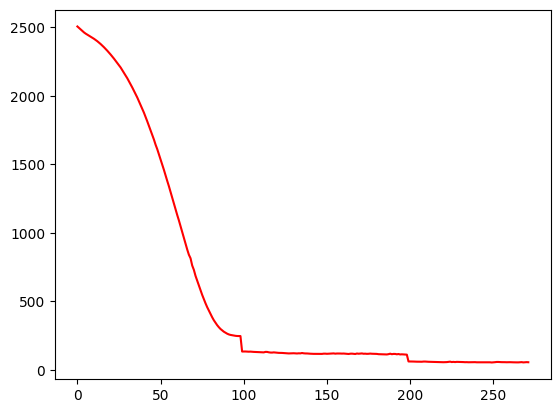

 54%|█████▍    | 272/500 [00:49<00:40,  5.69it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.12903500946788
Dataset Name:  weibo , AUC Score (contextual):  69.52376905452773
Dataset Name:  weibo , AUC Score (structural):  49.45023268205032
Dataset Name:  weibo , AUC Score (joint-type):  48.17739362793814
Dataset Name:  weibo , AUC Score (structure type):  49.21605753184344
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.17739362793814
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


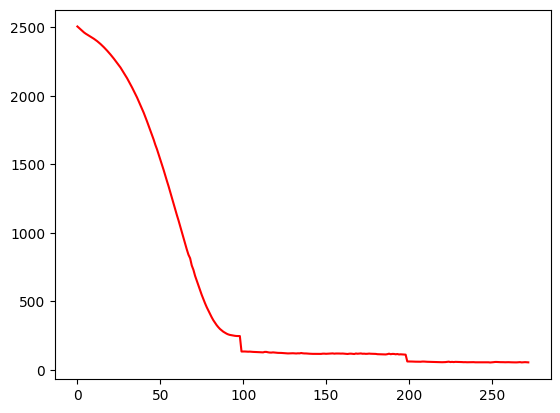

 55%|█████▍    | 273/500 [00:49<00:39,  5.70it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.03646282028627
Dataset Name:  weibo , AUC Score (contextual):  67.2395382570574
Dataset Name:  weibo , AUC Score (structural):  49.33460302344959
Dataset Name:  weibo , AUC Score (joint-type):  48.54715278367955
Dataset Name:  weibo , AUC Score (structure type):  49.191491141172655
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.54715278367955
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


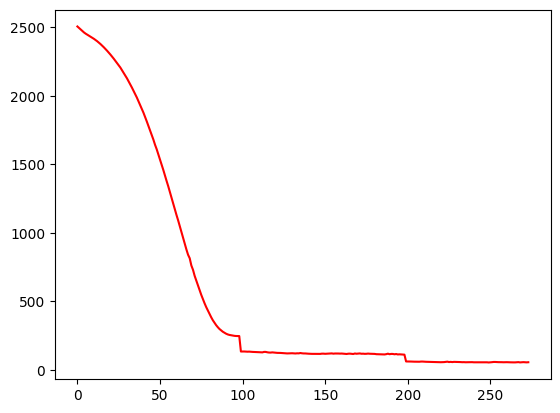

 55%|█████▍    | 274/500 [00:49<00:39,  5.67it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.83110112997079
Dataset Name:  weibo , AUC Score (contextual):  66.84478931980966
Dataset Name:  weibo , AUC Score (structural):  49.22297232188912
Dataset Name:  weibo , AUC Score (joint-type):  48.55848418258122
Dataset Name:  weibo , AUC Score (structure type):  49.0829421055858
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.55848418258122
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


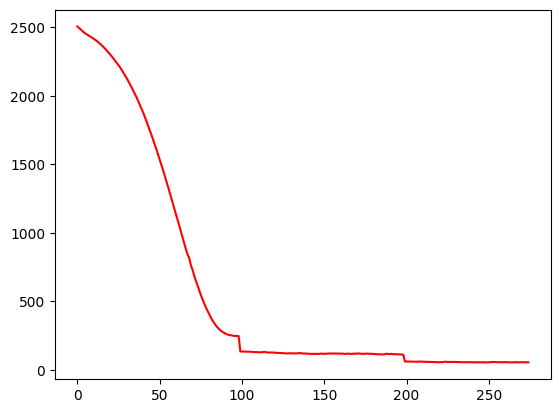

 55%|█████▌    | 275/500 [00:49<00:40,  5.61it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.23247982762763
Dataset Name:  weibo , AUC Score (contextual):  66.76831683053835
Dataset Name:  weibo , AUC Score (structural):  49.243448909143474
Dataset Name:  weibo , AUC Score (joint-type):  48.40183915541765
Dataset Name:  weibo , AUC Score (structure type):  49.05736445926936
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.40183915541765
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


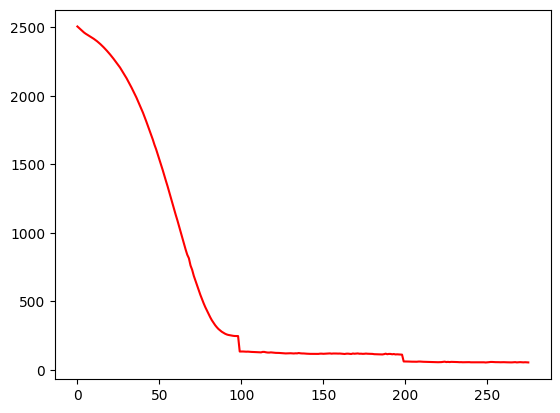

 55%|█████▌    | 276/500 [00:50<00:39,  5.67it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.09292773163912
Dataset Name:  weibo , AUC Score (contextual):  67.73017048552154
Dataset Name:  weibo , AUC Score (structural):  49.8776902976403
Dataset Name:  weibo , AUC Score (joint-type):  49.03720687954665
Dataset Name:  weibo , AUC Score (structure type):  49.74199022859277
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.03720687954665
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


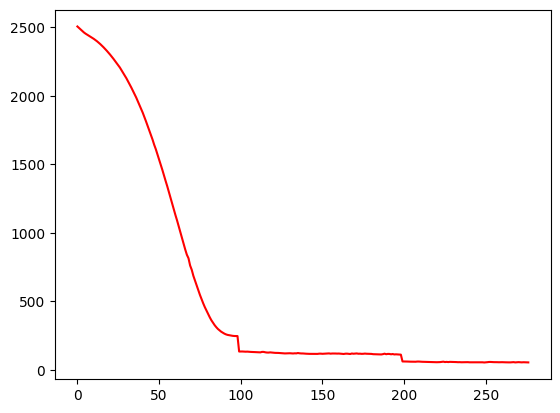

 55%|█████▌    | 277/500 [00:50<00:39,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.18545131269454
Dataset Name:  weibo , AUC Score (contextual):  67.65588044680399
Dataset Name:  weibo , AUC Score (structural):  49.80250083606826
Dataset Name:  weibo , AUC Score (joint-type):  48.306389463649055
Dataset Name:  weibo , AUC Score (structure type):  49.5565515806467
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.306389463649055
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


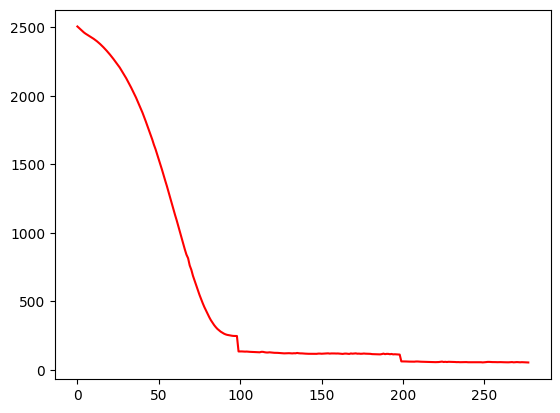

 56%|█████▌    | 278/500 [00:50<00:39,  5.67it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.37733357219591
Dataset Name:  weibo , AUC Score (contextual):  67.4297438814782
Dataset Name:  weibo , AUC Score (structural):  49.57809161040919
Dataset Name:  weibo , AUC Score (joint-type):  48.123844096138825
Dataset Name:  weibo , AUC Score (structure type):  49.31163116048394
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.123844096138825
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


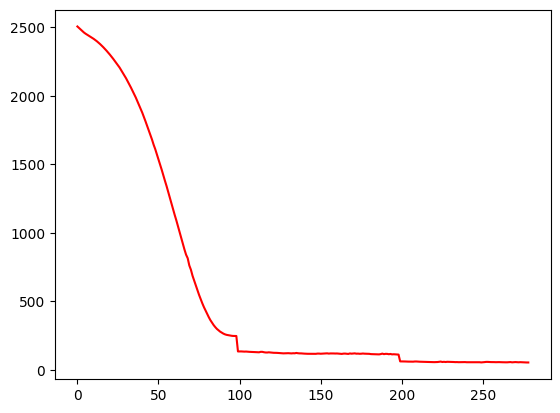

 56%|█████▌    | 279/500 [00:50<00:39,  5.61it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.91156194723543
Dataset Name:  weibo , AUC Score (contextual):  68.60118505619738
Dataset Name:  weibo , AUC Score (structural):  49.64573378452678
Dataset Name:  weibo , AUC Score (joint-type):  48.238950296206234
Dataset Name:  weibo , AUC Score (structure type):  49.39570211223103
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.238950296206234
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


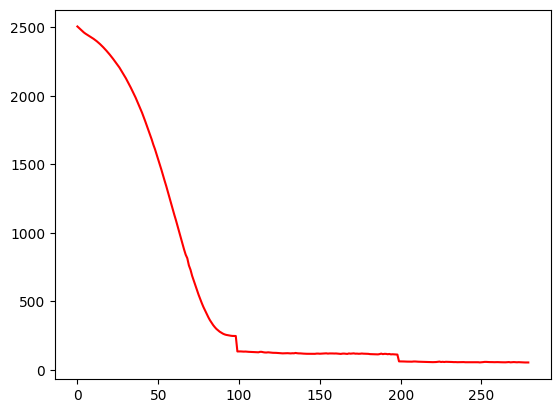

 56%|█████▌    | 280/500 [00:50<00:39,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.43560218131259
Dataset Name:  weibo , AUC Score (contextual):  67.33241525876926
Dataset Name:  weibo , AUC Score (structural):  49.646997806383595
Dataset Name:  weibo , AUC Score (joint-type):  47.769419907533475
Dataset Name:  weibo , AUC Score (structure type):  49.334929920838334
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.769419907533475
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


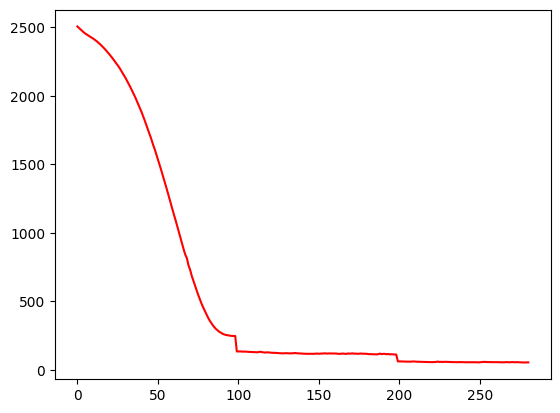

 56%|█████▌    | 281/500 [00:51<00:39,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.137103041279
Dataset Name:  weibo , AUC Score (contextual):  67.92387381215431
Dataset Name:  weibo , AUC Score (structural):  49.08969453749837
Dataset Name:  weibo , AUC Score (joint-type):  48.66665279148434
Dataset Name:  weibo , AUC Score (structure type):  48.870737942015566
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.66665279148434
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


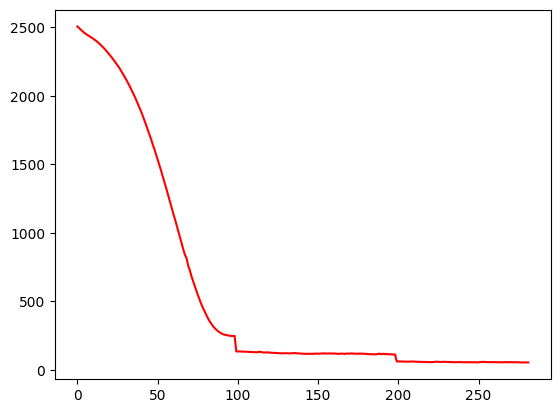

 56%|█████▋    | 282/500 [00:51<00:39,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.9453430663718
Dataset Name:  weibo , AUC Score (contextual):  69.0107052812991
Dataset Name:  weibo , AUC Score (structural):  49.84819834373459
Dataset Name:  weibo , AUC Score (joint-type):  48.13251608509418
Dataset Name:  weibo , AUC Score (structure type):  49.6169990307898
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.13251608509418
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


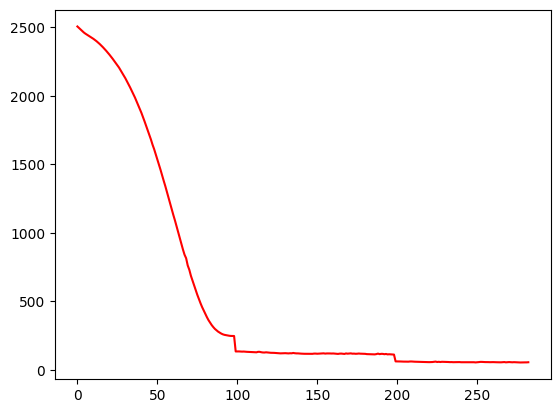

 57%|█████▋    | 283/500 [00:51<00:39,  5.51it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.84282516543577
Dataset Name:  weibo , AUC Score (contextual):  67.4485042842516
Dataset Name:  weibo , AUC Score (structural):  48.831233243208004
Dataset Name:  weibo , AUC Score (joint-type):  49.09215838289375
Dataset Name:  weibo , AUC Score (structure type):  48.66214011548027
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  49.09215838289375
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


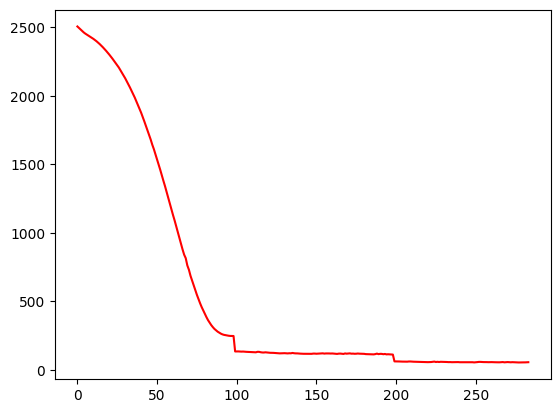

 57%|█████▋    | 284/500 [00:51<00:39,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.89427640842811
Dataset Name:  weibo , AUC Score (contextual):  67.87346064969385
Dataset Name:  weibo , AUC Score (structural):  49.461713741561375
Dataset Name:  weibo , AUC Score (joint-type):  47.59991143008613
Dataset Name:  weibo , AUC Score (structure type):  49.14228999325222
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.59991143008613
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


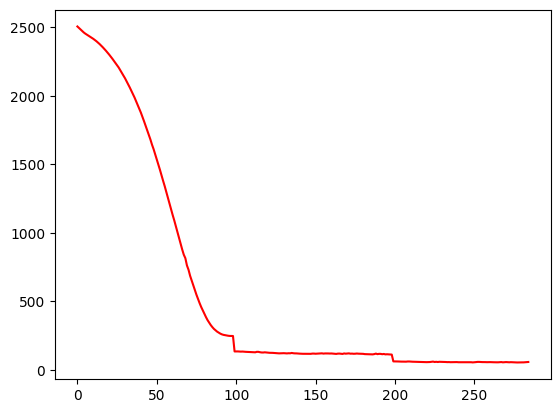

 57%|█████▋    | 285/500 [00:51<00:38,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.45586840710254
Dataset Name:  weibo , AUC Score (contextual):  66.96966596076678
Dataset Name:  weibo , AUC Score (structural):  48.953310546930354
Dataset Name:  weibo , AUC Score (joint-type):  47.80500396888028
Dataset Name:  weibo , AUC Score (structure type):  48.70085269076042
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.80500396888028
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


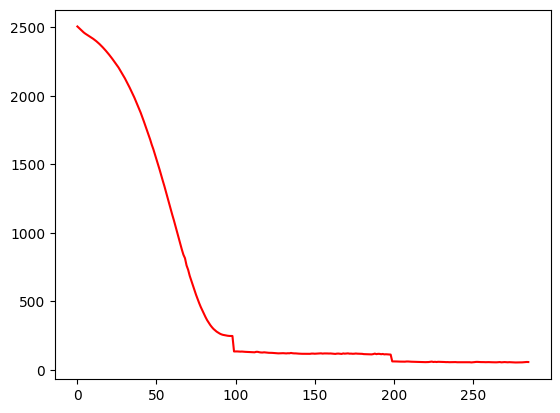

 57%|█████▋    | 286/500 [00:51<00:37,  5.66it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  73.53151487989513
Dataset Name:  weibo , AUC Score (contextual):  74.15556507547232
Dataset Name:  weibo , AUC Score (structural):  49.82172757211443
Dataset Name:  weibo , AUC Score (joint-type):  48.7830308832652
Dataset Name:  weibo , AUC Score (structure type):  49.689786648417346
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.7830308832652
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


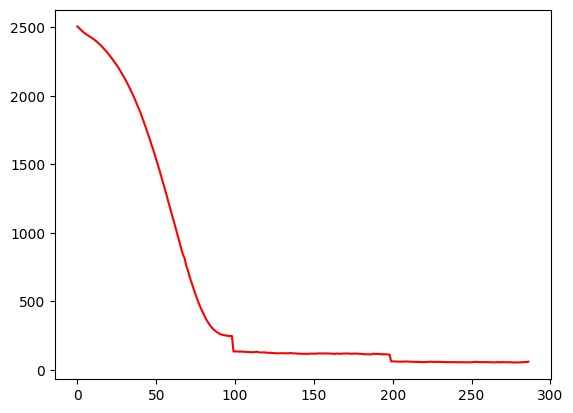

 57%|█████▋    | 287/500 [00:52<00:38,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  73.80315482024471
Dataset Name:  weibo , AUC Score (contextual):  73.84931378551396
Dataset Name:  weibo , AUC Score (structural):  50.38264719052721
Dataset Name:  weibo , AUC Score (joint-type):  48.59224712624739
Dataset Name:  weibo , AUC Score (structure type):  50.316155546728666
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  78.85783437652285
Dataset Name:  weibo  Best AUC Score (contextual):  78.34925221439238
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.59224712624739
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


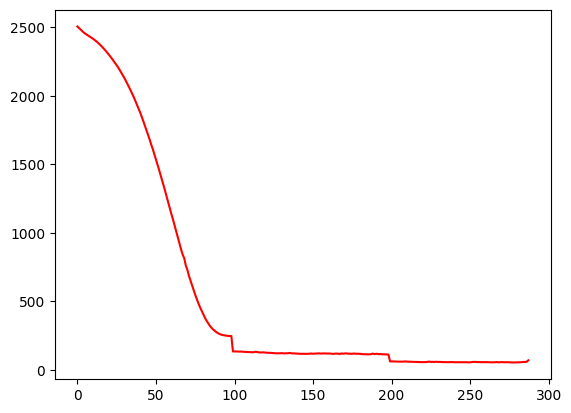

 58%|█████▊    | 288/500 [00:52<00:38,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo , AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo , AUC Score (structural):  50.88025801917006
Dataset Name:  weibo , AUC Score (joint-type):  48.28225242772331
Dataset Name:  weibo , AUC Score (structure type):  50.68201359628942
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  48.28225242772331
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


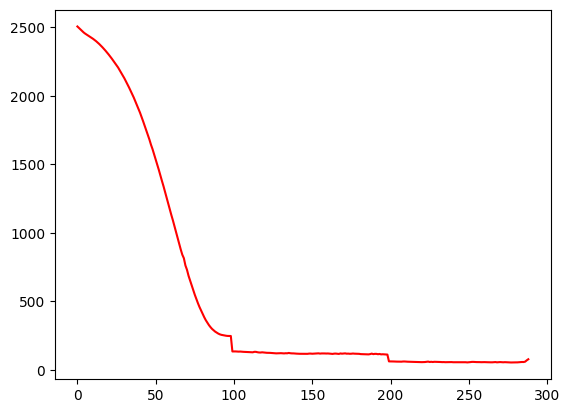

 58%|█████▊    | 289/500 [00:52<00:38,  5.46it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  78.85020687496215
Dataset Name:  weibo , AUC Score (contextual):  78.18075546898983
Dataset Name:  weibo , AUC Score (structural):  50.15085505693766
Dataset Name:  weibo , AUC Score (joint-type):  47.45563844049888
Dataset Name:  weibo , AUC Score (structure type):  49.789476514826774
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.45563844049888
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


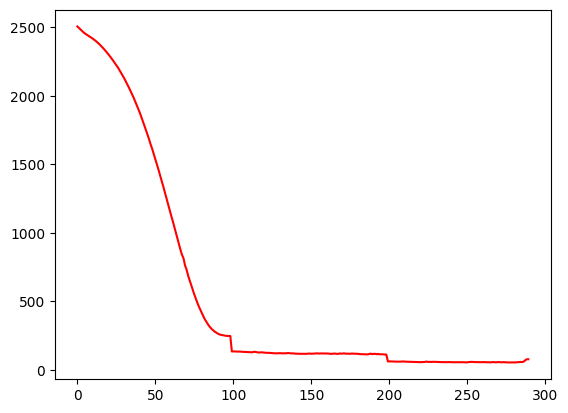

 58%|█████▊    | 290/500 [00:52<00:38,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  79.66456112976292
Dataset Name:  weibo , AUC Score (contextual):  78.99323411421702
Dataset Name:  weibo , AUC Score (structural):  49.782763956671815
Dataset Name:  weibo , AUC Score (joint-type):  47.77531686002311
Dataset Name:  weibo , AUC Score (structure type):  49.50921911921514
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.77531686002311
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


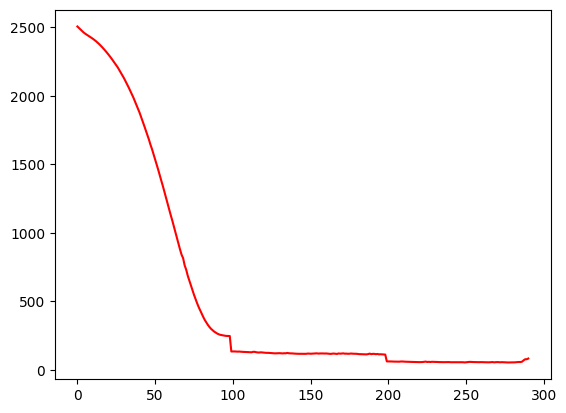

 58%|█████▊    | 291/500 [00:52<00:38,  5.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  77.57248572174508
Dataset Name:  weibo , AUC Score (contextual):  77.56088169846107
Dataset Name:  weibo , AUC Score (structural):  49.75313879866909
Dataset Name:  weibo , AUC Score (joint-type):  47.20079759173086
Dataset Name:  weibo , AUC Score (structure type):  49.52021189537453
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.20079759173086
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


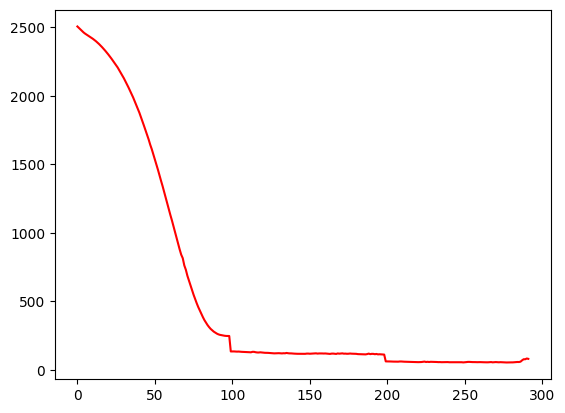

 58%|█████▊    | 292/500 [00:52<00:37,  5.50it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  76.61878817190035
Dataset Name:  weibo , AUC Score (contextual):  77.40793671991848
Dataset Name:  weibo , AUC Score (structural):  50.06683444714631
Dataset Name:  weibo , AUC Score (joint-type):  47.174463651936414
Dataset Name:  weibo , AUC Score (structure type):  49.69325055507965
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.174463651936414
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


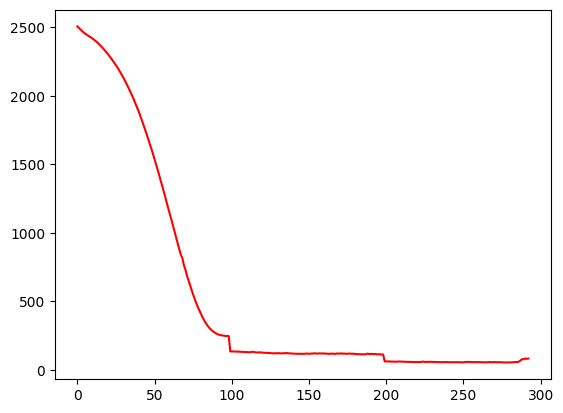

 59%|█████▊    | 293/500 [00:53<00:37,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  74.35219736244359
Dataset Name:  weibo , AUC Score (contextual):  75.9279750847976
Dataset Name:  weibo , AUC Score (structural):  49.80505155281968
Dataset Name:  weibo , AUC Score (joint-type):  47.70825347876837
Dataset Name:  weibo , AUC Score (structure type):  49.45704972232914
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.70825347876837
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


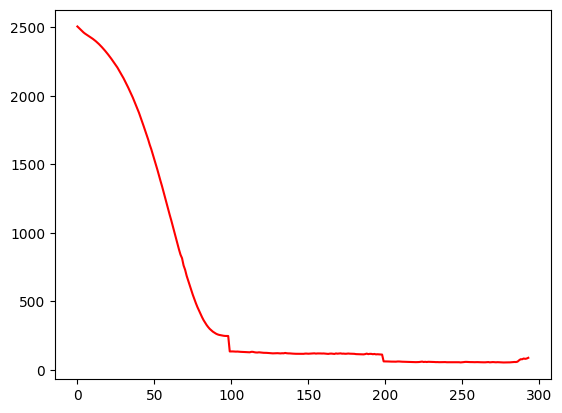

 59%|█████▉    | 294/500 [00:53<00:37,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  73.21650976534198
Dataset Name:  weibo , AUC Score (contextual):  75.33379930820654
Dataset Name:  weibo , AUC Score (structural):  49.76956824867788
Dataset Name:  weibo , AUC Score (joint-type):  47.904211522529536
Dataset Name:  weibo , AUC Score (structure type):  49.4354344889792
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.904211522529536
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


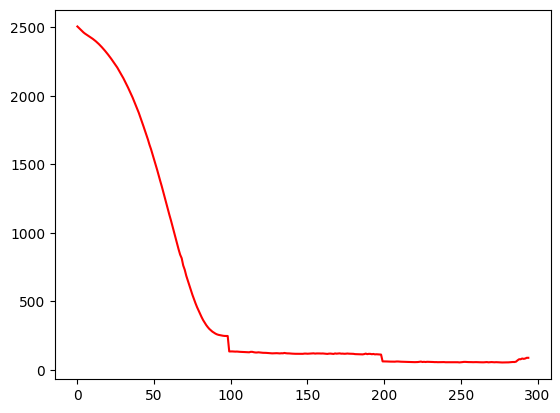

 59%|█████▉    | 295/500 [00:53<00:36,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  72.62064750915454
Dataset Name:  weibo , AUC Score (contextual):  74.78856245595351
Dataset Name:  weibo , AUC Score (structural):  49.72571009120229
Dataset Name:  weibo , AUC Score (joint-type):  47.84587794348985
Dataset Name:  weibo , AUC Score (structure type):  49.4360640312262
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.84587794348985
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


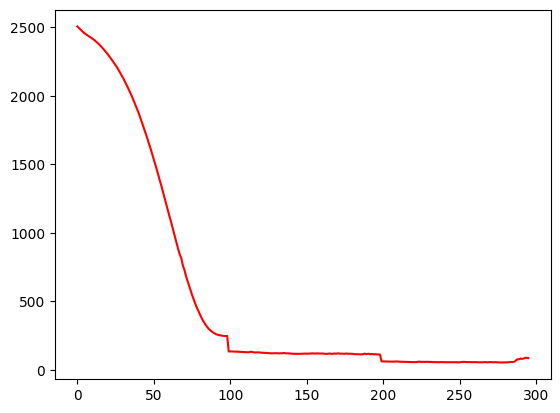

 59%|█████▉    | 296/500 [00:53<00:36,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  71.80643082452221
Dataset Name:  weibo , AUC Score (contextual):  73.90644773941482
Dataset Name:  weibo , AUC Score (structural):  49.476020428407054
Dataset Name:  weibo , AUC Score (joint-type):  47.82775348657316
Dataset Name:  weibo , AUC Score (structure type):  49.28815578646747
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.82775348657316
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


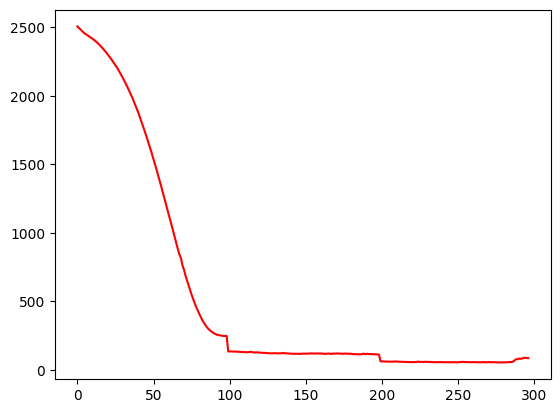

 59%|█████▉    | 297/500 [00:53<00:36,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  71.49272498378201
Dataset Name:  weibo , AUC Score (contextual):  73.85930102612755
Dataset Name:  weibo , AUC Score (structural):  49.58915888698058
Dataset Name:  weibo , AUC Score (joint-type):  47.68564849422475
Dataset Name:  weibo , AUC Score (structure type):  49.40684586458541
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.68564849422475
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


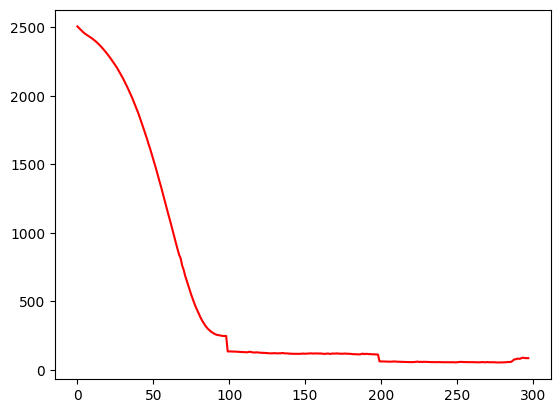

 60%|█████▉    | 298/500 [00:54<00:36,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.77200251417126
Dataset Name:  weibo , AUC Score (contextual):  73.17496547103065
Dataset Name:  weibo , AUC Score (structural):  49.991557127552845
Dataset Name:  weibo , AUC Score (joint-type):  47.67978044836496
Dataset Name:  weibo , AUC Score (structure type):  49.77675748255114
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.67978044836496
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


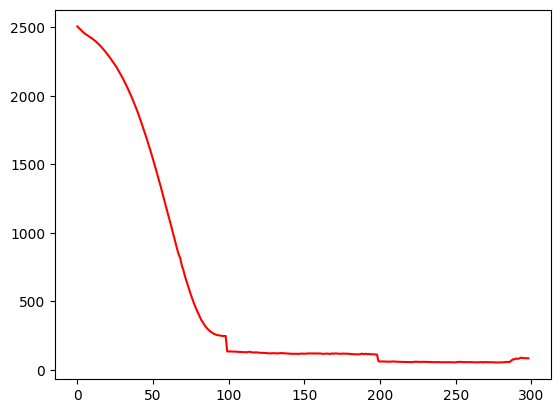

 60%|█████▉    | 299/500 [00:54<00:36,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.91360287711193
Dataset Name:  weibo , AUC Score (contextual):  71.90359407691592
Dataset Name:  weibo , AUC Score (structural):  50.41473237313019
Dataset Name:  weibo , AUC Score (joint-type):  47.73100299646125
Dataset Name:  weibo , AUC Score (structure type):  50.154955699596336
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.73100299646125
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


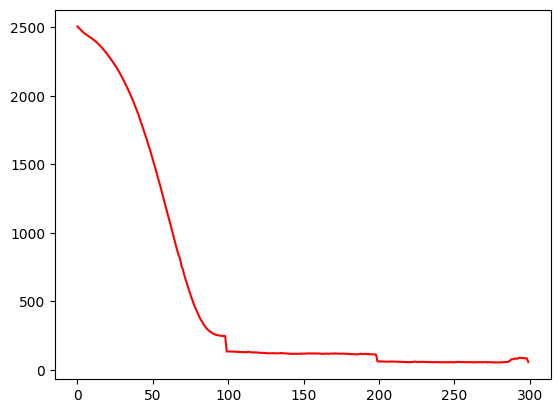

 60%|██████    | 300/500 [00:54<00:36,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.65753649125145
Dataset Name:  weibo , AUC Score (contextual):  72.61154634860124
Dataset Name:  weibo , AUC Score (structural):  50.775060792082584
Dataset Name:  weibo , AUC Score (joint-type):  47.7625979428886
Dataset Name:  weibo , AUC Score (structure type):  50.46936504995661
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.7625979428886
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


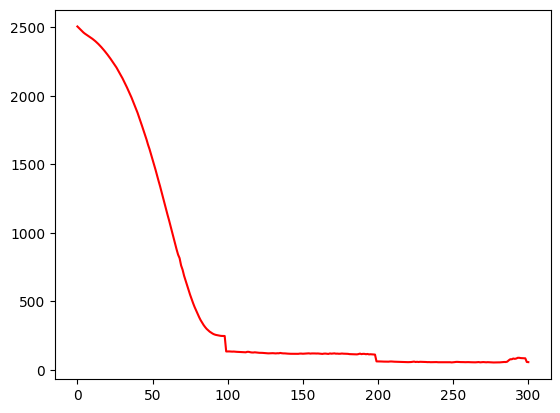

 60%|██████    | 301/500 [00:54<00:36,  5.49it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  71.1340336979656
Dataset Name:  weibo , AUC Score (contextual):  73.09365112125926
Dataset Name:  weibo , AUC Score (structural):  51.01430668684568
Dataset Name:  weibo , AUC Score (joint-type):  47.71894893181331
Dataset Name:  weibo , AUC Score (structure type):  50.67571247660438
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.71894893181331
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


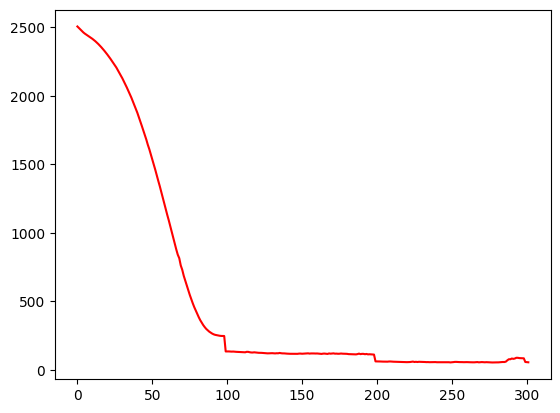

 60%|██████    | 302/500 [00:54<00:36,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.2281952811598
Dataset Name:  weibo , AUC Score (contextual):  72.64181159005543
Dataset Name:  weibo , AUC Score (structural):  51.07992245821076
Dataset Name:  weibo , AUC Score (joint-type):  47.682584391460516
Dataset Name:  weibo , AUC Score (structure type):  50.73203514315621
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.682584391460516
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


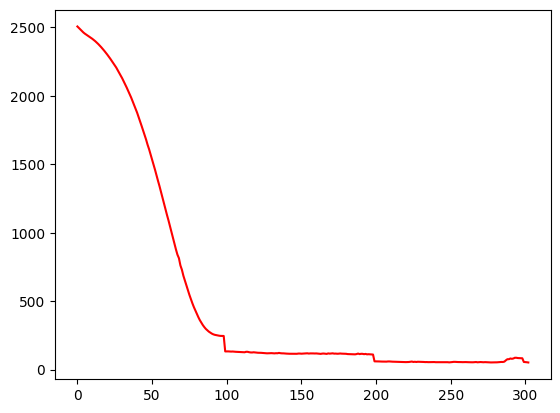

 61%|██████    | 303/500 [00:54<00:36,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.80724829703418
Dataset Name:  weibo , AUC Score (contextual):  71.77267595031992
Dataset Name:  weibo , AUC Score (structural):  51.07262740830173
Dataset Name:  weibo , AUC Score (joint-type):  47.58658547372474
Dataset Name:  weibo , AUC Score (structure type):  50.72440087518336
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.58658547372474
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


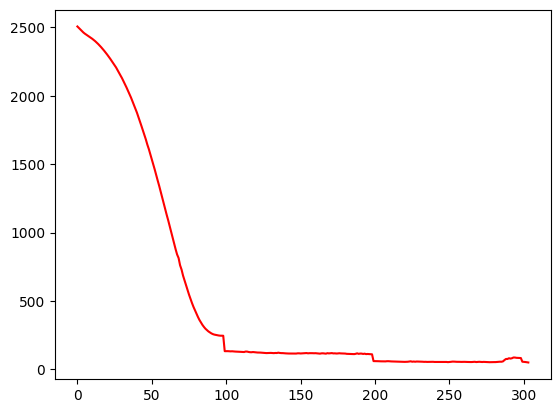

 61%|██████    | 304/500 [00:55<00:36,  5.37it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.56332110283586
Dataset Name:  weibo , AUC Score (contextual):  72.02008779521618
Dataset Name:  weibo , AUC Score (structural):  51.05050135754814
Dataset Name:  weibo , AUC Score (joint-type):  47.431963910650765
Dataset Name:  weibo , AUC Score (structure type):  50.68167461200257
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.431963910650765
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


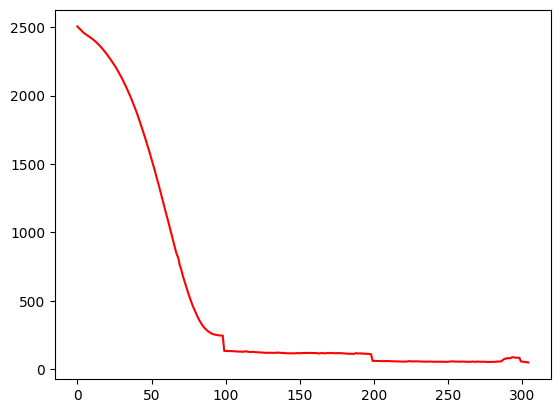

 61%|██████    | 305/500 [00:55<00:35,  5.42it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.1976595951524
Dataset Name:  weibo , AUC Score (contextual):  72.11712735162659
Dataset Name:  weibo , AUC Score (structural):  50.955271764699205
Dataset Name:  weibo , AUC Score (joint-type):  47.43641553164784
Dataset Name:  weibo , AUC Score (structure type):  50.58254022404639
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.43641553164784
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


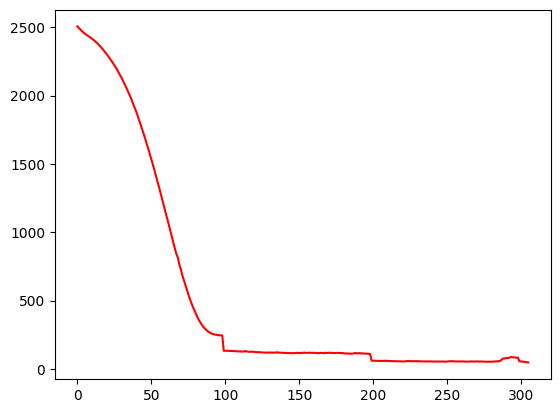

 61%|██████    | 306/500 [00:55<00:35,  5.49it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.47180636968223
Dataset Name:  weibo , AUC Score (contextual):  72.55435458144068
Dataset Name:  weibo , AUC Score (structural):  50.8935019073693
Dataset Name:  weibo , AUC Score (joint-type):  47.56259297094826
Dataset Name:  weibo , AUC Score (structure type):  50.538224437907076
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.56259297094826
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


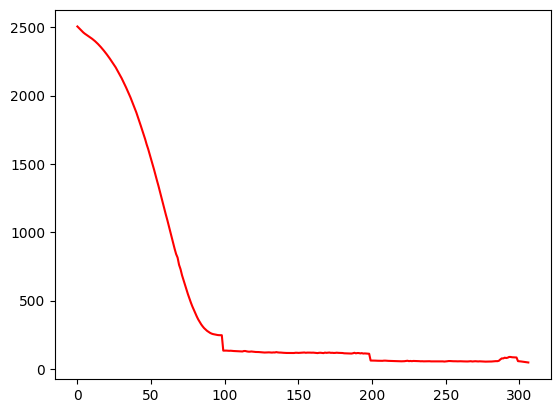

 61%|██████▏   | 307/500 [00:55<00:35,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.8972803294836
Dataset Name:  weibo , AUC Score (contextual):  72.92662861397913
Dataset Name:  weibo , AUC Score (structural):  50.92991197193078
Dataset Name:  weibo , AUC Score (joint-type):  47.73542571082848
Dataset Name:  weibo , AUC Score (structure type):  50.58961616495853
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.73542571082848
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


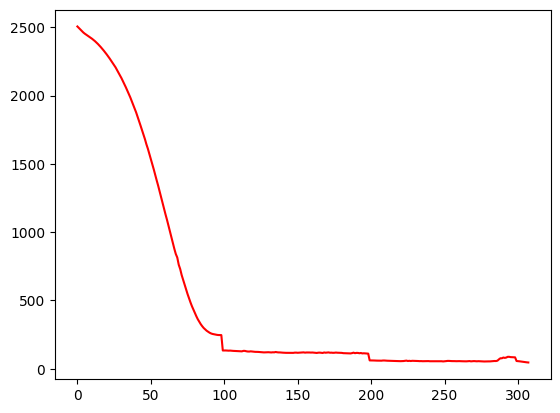

 62%|██████▏   | 308/500 [00:55<00:35,  5.43it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.28233158812837
Dataset Name:  weibo , AUC Score (contextual):  73.13232819200014
Dataset Name:  weibo , AUC Score (structural):  51.00110531059228
Dataset Name:  weibo , AUC Score (joint-type):  47.74889620033913
Dataset Name:  weibo , AUC Score (structure type):  50.655607005204295
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.74889620033913
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


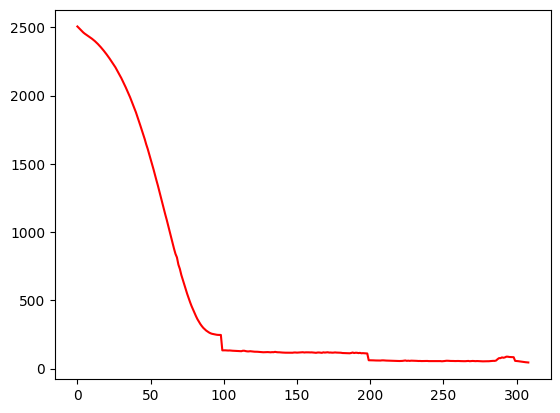

 62%|██████▏   | 309/500 [00:56<00:35,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.49642898413909
Dataset Name:  weibo , AUC Score (contextual):  73.29056308380552
Dataset Name:  weibo , AUC Score (structural):  51.08043260156104
Dataset Name:  weibo , AUC Score (joint-type):  47.800292188214534
Dataset Name:  weibo , AUC Score (structure type):  50.746130052831404
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.800292188214534
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


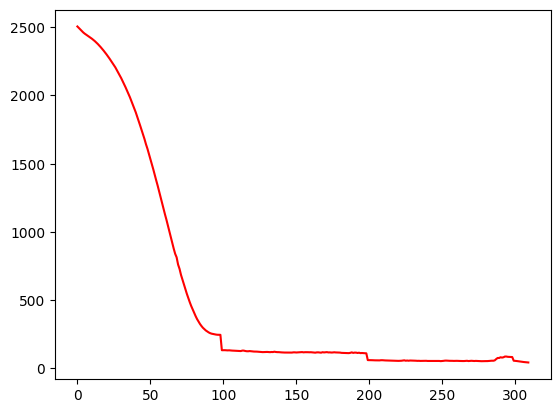

 62%|██████▏   | 310/500 [00:56<00:34,  5.47it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.84224981642025
Dataset Name:  weibo , AUC Score (contextual):  73.51447383863278
Dataset Name:  weibo , AUC Score (structural):  51.20175035851741
Dataset Name:  weibo , AUC Score (joint-type):  47.7797684810202
Dataset Name:  weibo , AUC Score (structure type):  50.86147586580005
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.310631954245814
Dataset Name:  weibo  Best AUC Score (joint-type):  47.7797684810202
Dataset Name:  weibo  Best AUC Score (structure type):  50.93149463698372


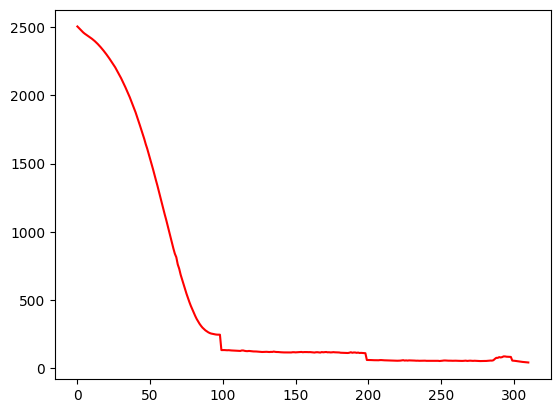

 62%|██████▏   | 311/500 [00:56<00:34,  5.50it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.01387624432218
Dataset Name:  weibo , AUC Score (contextual):  73.64510289893028
Dataset Name:  weibo , AUC Score (structural):  51.343944315019186
Dataset Name:  weibo , AUC Score (joint-type):  47.68995558207257
Dataset Name:  weibo , AUC Score (structure type):  50.98979993432251
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.343944315019186
Dataset Name:  weibo  Best AUC Score (joint-type):  47.68995558207257
Dataset Name:  weibo  Best AUC Score (structure type):  50.98979993432251


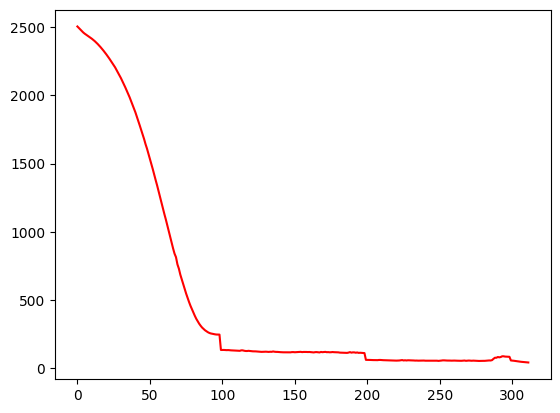

 62%|██████▏   | 312/500 [00:56<00:34,  5.46it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.92521991355703
Dataset Name:  weibo , AUC Score (contextual):  73.70889983101185
Dataset Name:  weibo , AUC Score (structural):  51.48460217321067
Dataset Name:  weibo , AUC Score (joint-type):  47.785116207542664
Dataset Name:  weibo , AUC Score (structure type):  51.1353808667925
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.48460217321067
Dataset Name:  weibo  Best AUC Score (joint-type):  47.785116207542664
Dataset Name:  weibo  Best AUC Score (structure type):  51.1353808667925


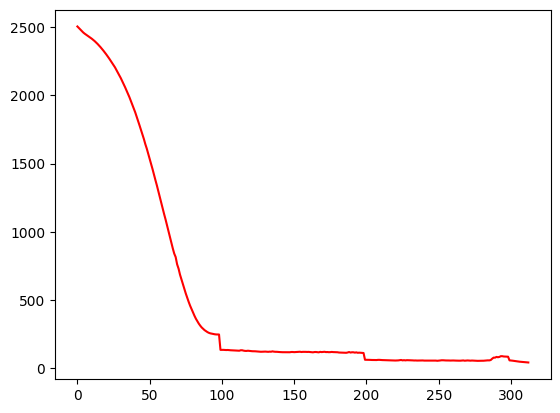

 63%|██████▎   | 313/500 [00:56<00:34,  5.36it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.51043057017026
Dataset Name:  weibo , AUC Score (contextual):  73.73211185478235
Dataset Name:  weibo , AUC Score (structural):  51.593597134128025
Dataset Name:  weibo , AUC Score (joint-type):  47.76569095228267
Dataset Name:  weibo , AUC Score (structure type):  51.23202842044261
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.593597134128025
Dataset Name:  weibo  Best AUC Score (joint-type):  47.76569095228267
Dataset Name:  weibo  Best AUC Score (structure type):  51.23202842044261


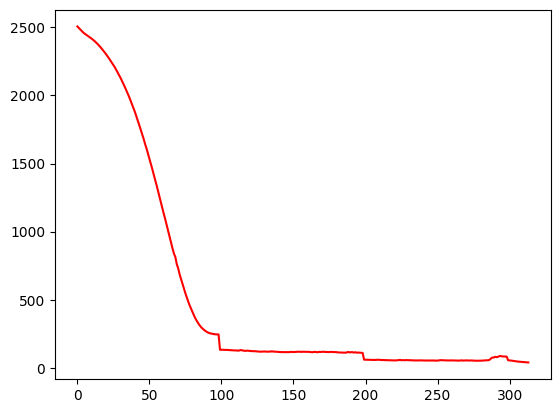

 63%|██████▎   | 314/500 [00:57<00:34,  5.33it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.06234160323663
Dataset Name:  weibo , AUC Score (contextual):  73.63343907378534
Dataset Name:  weibo , AUC Score (structural):  51.61151166811207
Dataset Name:  weibo , AUC Score (joint-type):  47.85718043576166
Dataset Name:  weibo , AUC Score (structure type):  51.25791371636394
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.61151166811207
Dataset Name:  weibo  Best AUC Score (joint-type):  47.85718043576166
Dataset Name:  weibo  Best AUC Score (structure type):  51.25791371636394


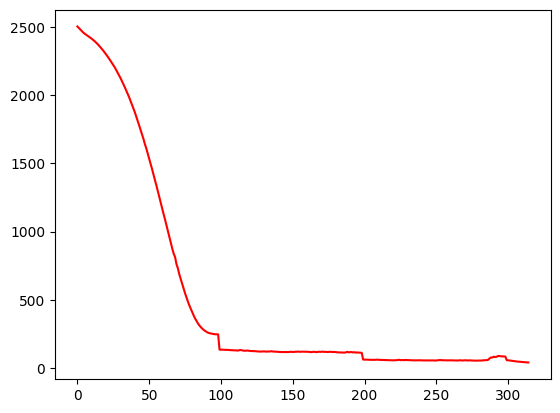

 63%|██████▎   | 315/500 [00:57<00:34,  5.35it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.00574676450249
Dataset Name:  weibo , AUC Score (contextual):  73.68106274646516
Dataset Name:  weibo , AUC Score (structural):  51.60868320664773
Dataset Name:  weibo , AUC Score (joint-type):  47.929360290500064
Dataset Name:  weibo , AUC Score (structure type):  51.26493838234192
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.61151166811207
Dataset Name:  weibo  Best AUC Score (joint-type):  47.929360290500064
Dataset Name:  weibo  Best AUC Score (structure type):  51.26493838234192


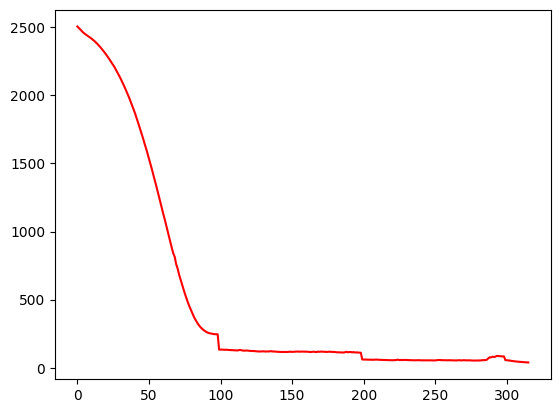

 63%|██████▎   | 316/500 [00:57<00:34,  5.28it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.51420610701491
Dataset Name:  weibo , AUC Score (contextual):  73.8734508214397
Dataset Name:  weibo , AUC Score (structural):  51.63107849972509
Dataset Name:  weibo , AUC Score (joint-type):  48.00628083253407
Dataset Name:  weibo , AUC Score (structure type):  51.29404545329207
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.00628083253407
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


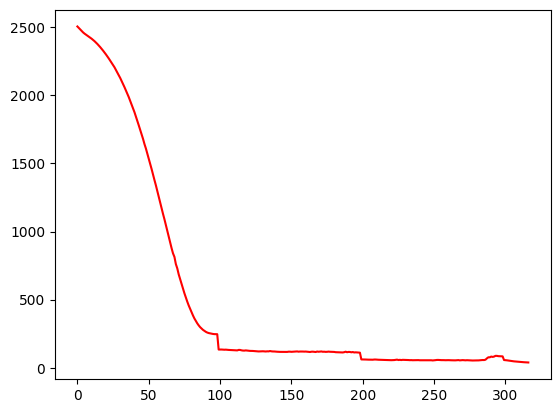

 63%|██████▎   | 317/500 [00:57<00:35,  5.15it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.17000309991445
Dataset Name:  weibo , AUC Score (contextual):  74.18421154565485
Dataset Name:  weibo , AUC Score (structural):  51.59959698675328
Dataset Name:  weibo , AUC Score (joint-type):  48.03119834746579
Dataset Name:  weibo , AUC Score (structure type):  51.26346280368149
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.03119834746579
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


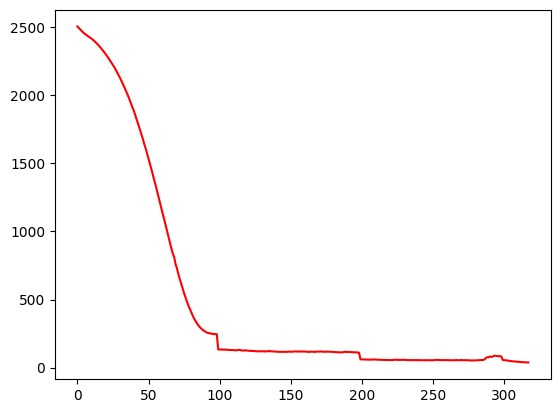

 64%|██████▎   | 318/500 [00:57<00:34,  5.21it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.16176417538303
Dataset Name:  weibo , AUC Score (contextual):  74.11474891412246
Dataset Name:  weibo , AUC Score (structural):  51.503562501062795
Dataset Name:  weibo , AUC Score (joint-type):  48.05128845521236
Dataset Name:  weibo , AUC Score (structure type):  51.17874806665013
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.05128845521236
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


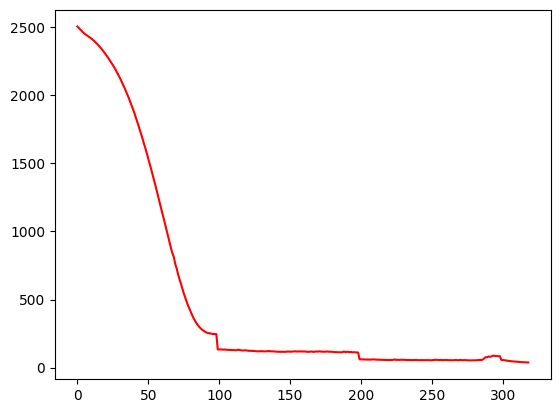

 64%|██████▍   | 319/500 [00:57<00:33,  5.35it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.0731384157664
Dataset Name:  weibo , AUC Score (contextual):  74.12714985832861
Dataset Name:  weibo , AUC Score (structural):  51.393552921704334
Dataset Name:  weibo , AUC Score (joint-type):  48.0400726828301
Dataset Name:  weibo , AUC Score (structure type):  51.07462006982962
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.0400726828301
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


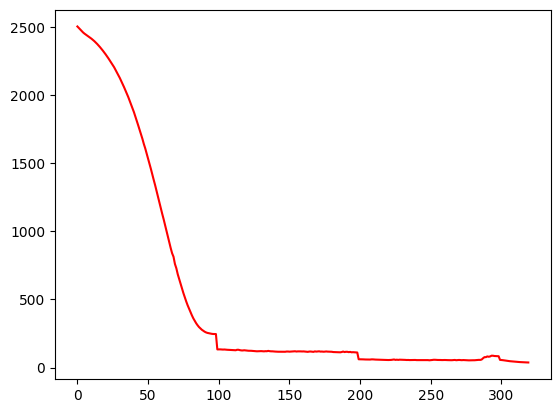

 64%|██████▍   | 320/500 [00:58<00:32,  5.51it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.0305986625734
Dataset Name:  weibo , AUC Score (contextual):  74.1684863390158
Dataset Name:  weibo , AUC Score (structural):  51.35632095952296
Dataset Name:  weibo , AUC Score (joint-type):  47.902665017832504
Dataset Name:  weibo , AUC Score (structure type):  51.02192368056491
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.902665017832504
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


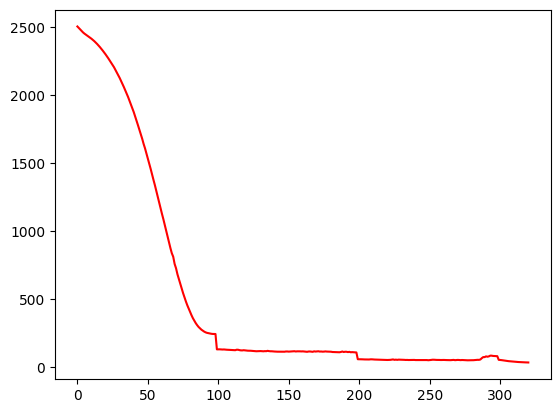

 64%|██████▍   | 321/500 [00:58<00:32,  5.46it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.1929008901707
Dataset Name:  weibo , AUC Score (contextual):  74.46980904858455
Dataset Name:  weibo , AUC Score (structural):  51.386646147567475
Dataset Name:  weibo , AUC Score (joint-type):  47.87140249764845
Dataset Name:  weibo , AUC Score (structure type):  51.037311858023585
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.87140249764845
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


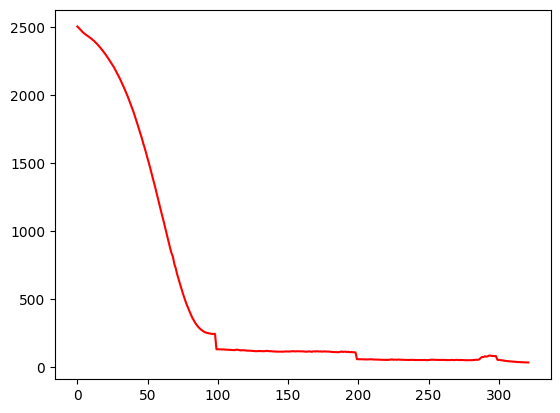

 64%|██████▍   | 322/500 [00:58<00:43,  4.11it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.9252810558541
Dataset Name:  weibo , AUC Score (contextual):  74.49547813589237
Dataset Name:  weibo , AUC Score (structural):  51.42005770288118
Dataset Name:  weibo , AUC Score (joint-type):  47.83651219541807
Dataset Name:  weibo , AUC Score (structure type):  51.06629643885328
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.83651219541807
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


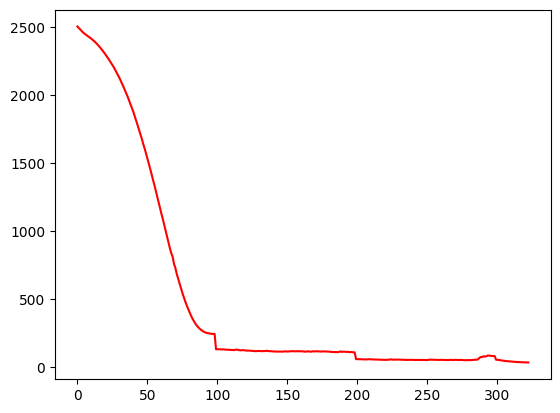

 65%|██████▍   | 323/500 [00:58<00:39,  4.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.6875292336608
Dataset Name:  weibo , AUC Score (contextual):  74.52357538010772
Dataset Name:  weibo , AUC Score (structural):  51.40605710204568
Dataset Name:  weibo , AUC Score (joint-type):  47.86200784294681
Dataset Name:  weibo , AUC Score (structure type):  51.04331957114101
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.86200784294681
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


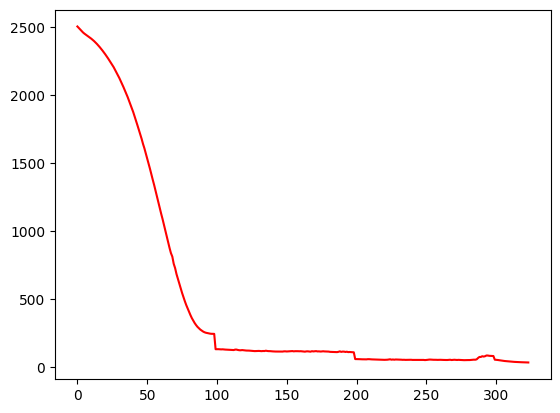

 65%|██████▍   | 324/500 [00:59<00:36,  4.80it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.21963780526058
Dataset Name:  weibo , AUC Score (contextual):  74.44928534139018
Dataset Name:  weibo , AUC Score (structural):  51.364831851083494
Dataset Name:  weibo , AUC Score (joint-type):  47.920543768395454
Dataset Name:  weibo , AUC Score (structure type):  51.01502150470738
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.920543768395454
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


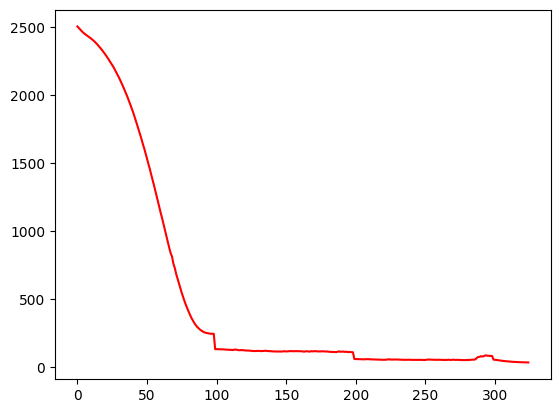

 65%|██████▌   | 325/500 [00:59<00:34,  5.07it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.74300302837798
Dataset Name:  weibo , AUC Score (contextual):  74.0793093859249
Dataset Name:  weibo , AUC Score (structural):  51.33725860300078
Dataset Name:  weibo , AUC Score (joint-type):  47.95242778112131
Dataset Name:  weibo , AUC Score (structure type):  50.98317692199533
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.95242778112131
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


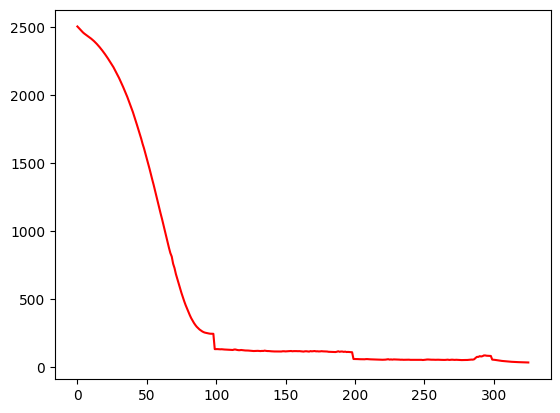

 65%|██████▌   | 326/500 [00:59<00:33,  5.15it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.89208567992375
Dataset Name:  weibo , AUC Score (contextual):  73.46773181816341
Dataset Name:  weibo , AUC Score (structural):  51.25150350581846
Dataset Name:  weibo , AUC Score (joint-type):  47.95235551454668
Dataset Name:  weibo , AUC Score (structure type):  50.91328064093212
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.95235551454668
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


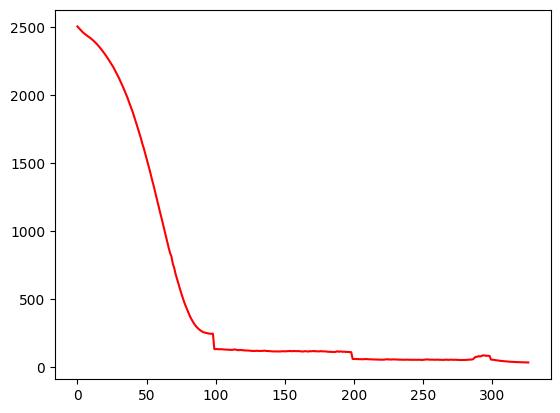

 65%|██████▌   | 327/500 [00:59<00:32,  5.31it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.48009604232026
Dataset Name:  weibo , AUC Score (contextual):  72.05636561567943
Dataset Name:  weibo , AUC Score (structural):  51.09331655528537
Dataset Name:  weibo , AUC Score (joint-type):  47.92719229326123
Dataset Name:  weibo , AUC Score (structure type):  50.75734786897955
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.92719229326123
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


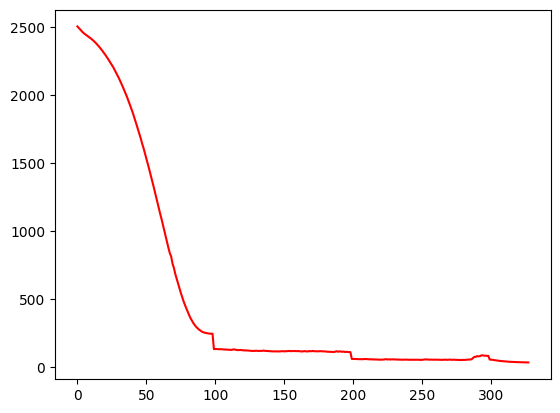

 66%|██████▌   | 328/500 [00:59<00:31,  5.43it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.79156499212182
Dataset Name:  weibo , AUC Score (contextual):  71.66670424528547
Dataset Name:  weibo , AUC Score (structural):  51.06333146280772
Dataset Name:  weibo , AUC Score (joint-type):  47.97780780213065
Dataset Name:  weibo , AUC Score (structure type):  50.72943721315948
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.97780780213065
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


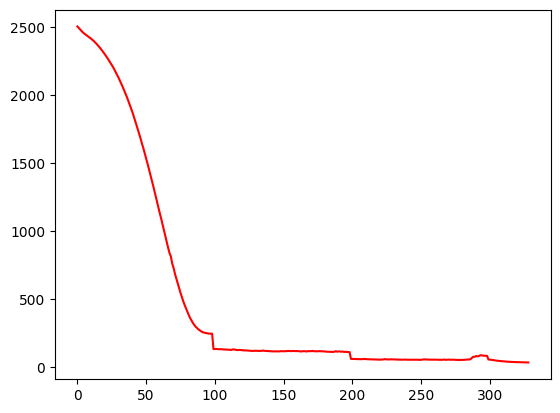

 66%|██████▌   | 329/500 [00:59<00:30,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.39725067546954
Dataset Name:  weibo , AUC Score (contextual):  71.13138236707141
Dataset Name:  weibo , AUC Score (structural):  51.048259560936614
Dataset Name:  weibo , AUC Score (joint-type):  47.913953056789396
Dataset Name:  weibo , AUC Score (structure type):  50.70018771183668
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.913953056789396
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


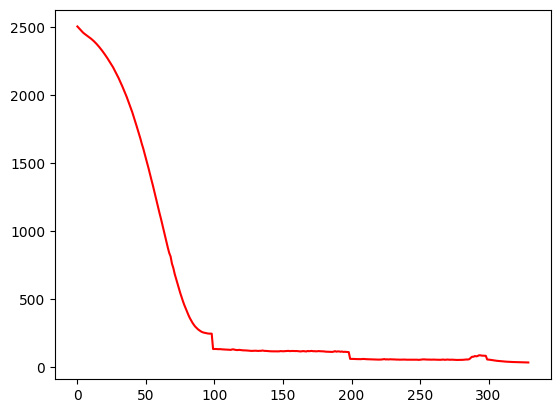

 66%|██████▌   | 330/500 [01:00<00:29,  5.68it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.32365063536018
Dataset Name:  weibo , AUC Score (contextual):  70.87980796747657
Dataset Name:  weibo , AUC Score (structural):  51.01850119883687
Dataset Name:  weibo , AUC Score (joint-type):  48.01044338723264
Dataset Name:  weibo , AUC Score (structure type):  50.68327837799836
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.01044338723264
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


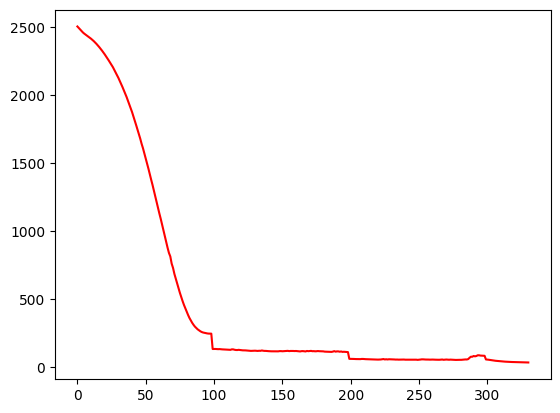

 66%|██████▌   | 331/500 [01:00<00:30,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.20252774484587
Dataset Name:  weibo , AUC Score (contextual):  70.65592611927916
Dataset Name:  weibo , AUC Score (structural):  50.91243105979447
Dataset Name:  weibo , AUC Score (joint-type):  48.099331274025026
Dataset Name:  weibo , AUC Score (structure type):  50.59077839679917
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.099331274025026
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


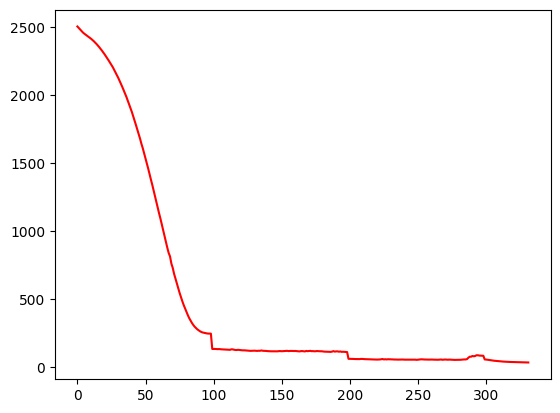

 66%|██████▋   | 332/500 [01:00<00:30,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.23854055782564
Dataset Name:  weibo , AUC Score (contextual):  70.36232147988069
Dataset Name:  weibo , AUC Score (structural):  50.9144489601578
Dataset Name:  weibo , AUC Score (joint-type):  48.21542029950738
Dataset Name:  weibo , AUC Score (structure type):  50.597860034926214
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.21542029950738
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


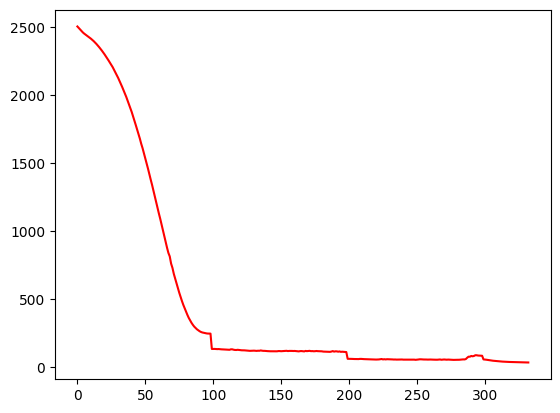

 67%|██████▋   | 333/500 [01:00<00:29,  5.57it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.0611361828497
Dataset Name:  weibo , AUC Score (contextual):  70.04157351505197
Dataset Name:  weibo , AUC Score (structural):  50.86456260875972
Dataset Name:  weibo , AUC Score (joint-type):  48.254877849254235
Dataset Name:  weibo , AUC Score (structure type):  50.55944941203603
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.254877849254235
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


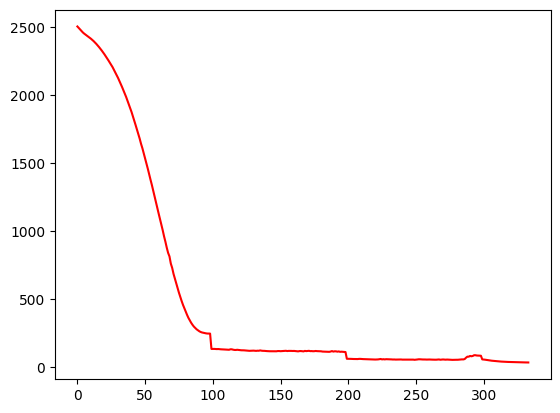

 67%|██████▋   | 334/500 [01:00<00:30,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.82011324776265
Dataset Name:  weibo , AUC Score (contextual):  69.71371451927986
Dataset Name:  weibo , AUC Score (structural):  50.81378634062838
Dataset Name:  weibo , AUC Score (joint-type):  48.38368579187111
Dataset Name:  weibo , AUC Score (structure type):  50.522628312104366
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.38368579187111
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


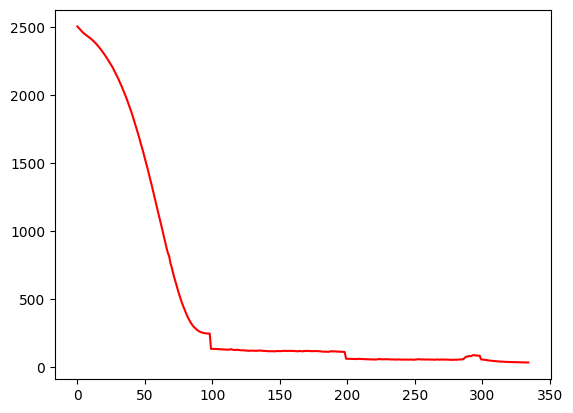

 67%|██████▋   | 335/500 [01:01<00:30,  5.50it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.33170857869227
Dataset Name:  weibo , AUC Score (contextual):  69.32350392291873
Dataset Name:  weibo , AUC Score (structural):  50.759773496352466
Dataset Name:  weibo , AUC Score (joint-type):  48.27774299346652
Dataset Name:  weibo , AUC Score (structure type):  50.44851894061885
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.27774299346652
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


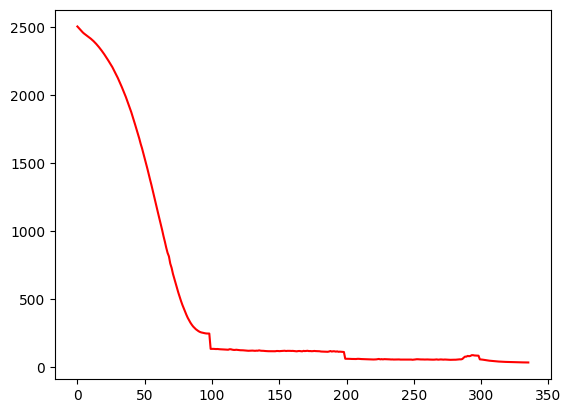

 67%|██████▋   | 336/500 [01:01<00:29,  5.48it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.986644382337445
Dataset Name:  weibo , AUC Score (contextual):  69.16204594188495
Dataset Name:  weibo , AUC Score (structural):  50.78003468974782
Dataset Name:  weibo , AUC Score (joint-type):  48.22747436415531
Dataset Name:  weibo , AUC Score (structure type):  50.45226485941894
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.22747436415531
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


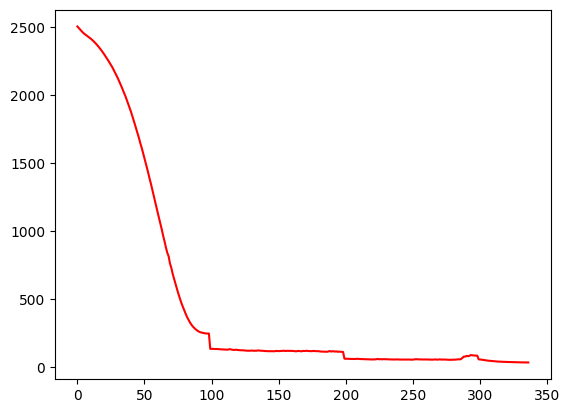

 67%|██████▋   | 337/500 [01:01<00:29,  5.49it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.5563172527054
Dataset Name:  weibo , AUC Score (contextual):  68.85906110109978
Dataset Name:  weibo , AUC Score (structural):  50.7937943895568
Dataset Name:  weibo , AUC Score (joint-type):  48.15604608179304
Dataset Name:  weibo , AUC Score (structure type):  50.46627146226312
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.15604608179304
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


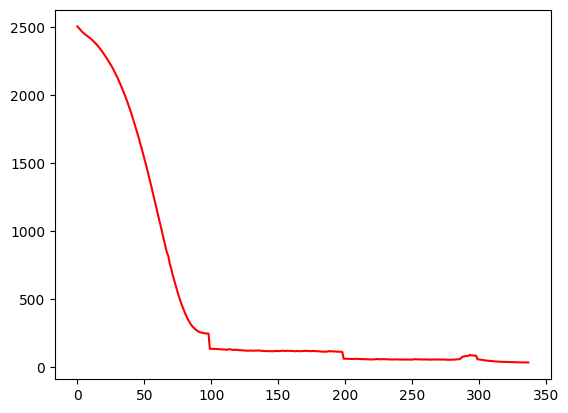

 68%|██████▊   | 338/500 [01:01<00:30,  5.38it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.284753740227174
Dataset Name:  weibo , AUC Score (contextual):  68.65324589655935
Dataset Name:  weibo , AUC Score (structural):  50.718157135488404
Dataset Name:  weibo , AUC Score (joint-type):  48.18749649507113
Dataset Name:  weibo , AUC Score (structure type):  50.39001993797327
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.18749649507113
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


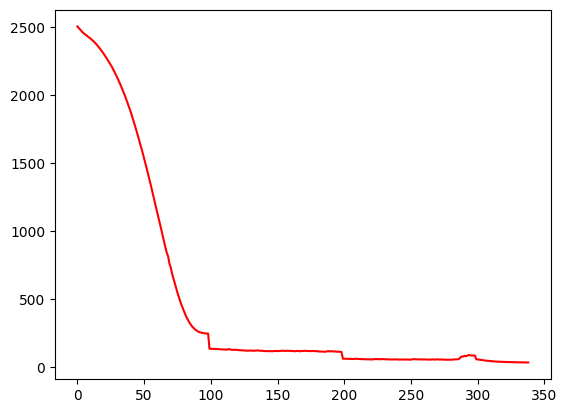

 68%|██████▊   | 339/500 [01:01<00:30,  5.31it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.85493867733315
Dataset Name:  weibo , AUC Score (contextual):  68.44737287875923
Dataset Name:  weibo , AUC Score (structural):  50.73060463323527
Dataset Name:  weibo , AUC Score (joint-type):  48.130781687303106
Dataset Name:  weibo , AUC Score (structure type):  50.39081185084508
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.130781687303106
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


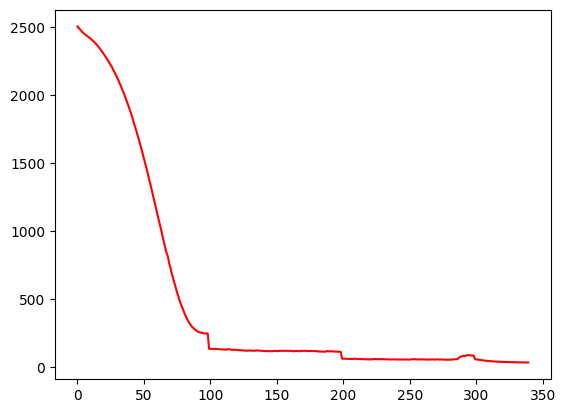

 68%|██████▊   | 340/500 [01:01<00:30,  5.20it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.43158941235527
Dataset Name:  weibo , AUC Score (contextual):  68.01403359066015
Dataset Name:  weibo , AUC Score (structural):  50.69965593665153
Dataset Name:  weibo , AUC Score (joint-type):  47.942165927524144
Dataset Name:  weibo , AUC Score (structure type):  50.357562904658934
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.942165927524144
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


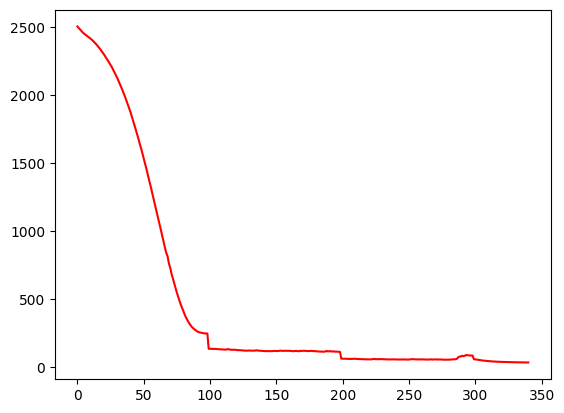

 68%|██████▊   | 341/500 [01:02<00:30,  5.22it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.996531397486685
Dataset Name:  weibo , AUC Score (contextual):  67.61520881860339
Dataset Name:  weibo , AUC Score (structural):  50.65547185425772
Dataset Name:  weibo , AUC Score (joint-type):  47.995238499930906
Dataset Name:  weibo , AUC Score (structure type):  50.32142547051589
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.995238499930906
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


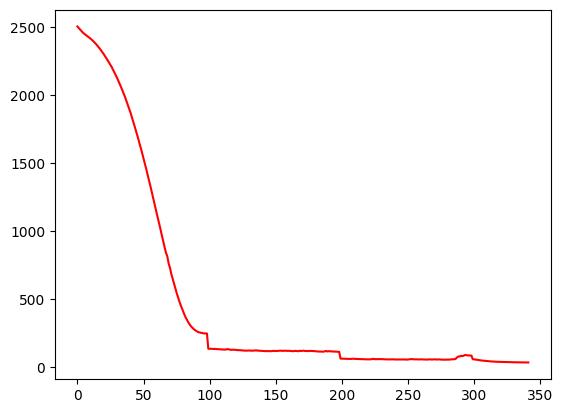

 68%|██████▊   | 342/500 [01:02<00:30,  5.24it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.7942573931737
Dataset Name:  weibo , AUC Score (contextual):  67.33409184330063
Dataset Name:  weibo , AUC Score (structural):  50.60015531030886
Dataset Name:  weibo , AUC Score (joint-type):  47.899210675565286
Dataset Name:  weibo , AUC Score (structure type):  50.28279835345933
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.899210675565286
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


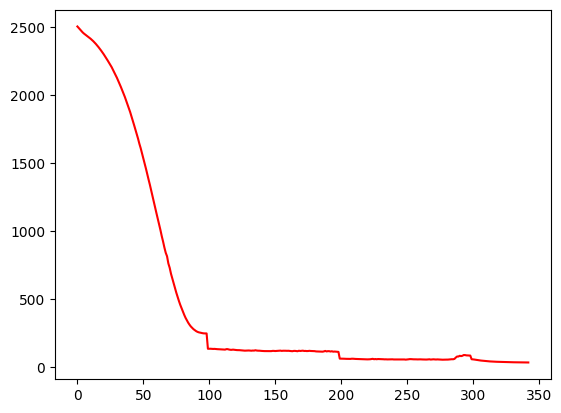

 69%|██████▊   | 343/500 [01:02<00:30,  5.22it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.53996657962041
Dataset Name:  weibo , AUC Score (contextual):  67.03262460058265
Dataset Name:  weibo , AUC Score (structural):  50.54851463261176
Dataset Name:  weibo , AUC Score (joint-type):  48.06522145080063
Dataset Name:  weibo , AUC Score (structure type):  50.239057986025415
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.06522145080063
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


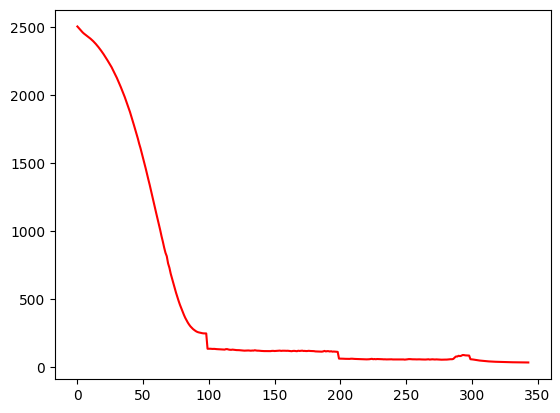

 69%|██████▉   | 344/500 [01:02<00:29,  5.22it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.22694858972234
Dataset Name:  weibo , AUC Score (contextual):  66.66666666666666
Dataset Name:  weibo , AUC Score (structural):  50.535650517795496
Dataset Name:  weibo , AUC Score (joint-type):  48.04686574084512
Dataset Name:  weibo , AUC Score (structure type):  50.23058907606899
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.04686574084512
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


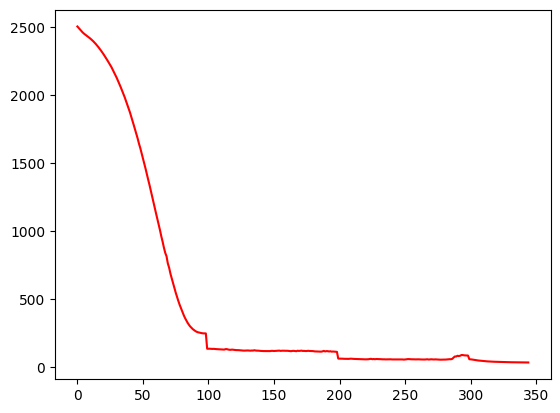

 69%|██████▉   | 345/500 [01:02<00:29,  5.30it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.82963065772603
Dataset Name:  weibo , AUC Score (contextual):  66.4756227499802
Dataset Name:  weibo , AUC Score (structural):  50.546907681058386
Dataset Name:  weibo , AUC Score (joint-type):  48.024607635859724
Dataset Name:  weibo , AUC Score (structure type):  50.243795220219
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.024607635859724
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


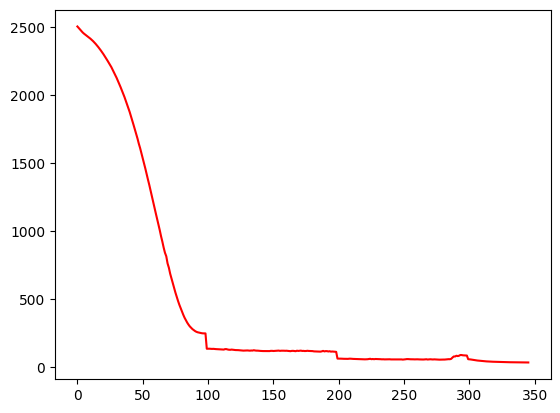

 69%|██████▉   | 346/500 [01:03<00:28,  5.49it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.80490624134455
Dataset Name:  weibo , AUC Score (contextual):  66.57008961633386
Dataset Name:  weibo , AUC Score (structural):  50.49059352344676
Dataset Name:  weibo , AUC Score (joint-type):  48.06088545632295
Dataset Name:  weibo , AUC Score (structure type):  50.18517657606044
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.06088545632295
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


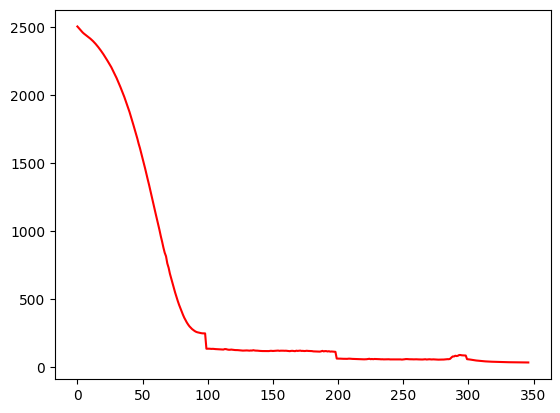

 69%|██████▉   | 347/500 [01:03<00:28,  5.36it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.85367486605251
Dataset Name:  weibo , AUC Score (contextual):  66.85253629660977
Dataset Name:  weibo , AUC Score (structural):  50.61680298830639
Dataset Name:  weibo , AUC Score (joint-type):  47.842640400946514
Dataset Name:  weibo , AUC Score (structure type):  50.2920563276801
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.842640400946514
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


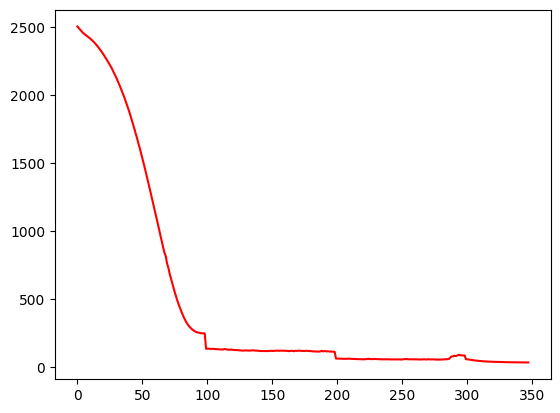

 70%|██████▉   | 348/500 [01:03<00:28,  5.38it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.20457050899128
Dataset Name:  weibo , AUC Score (contextual):  67.28573105155961
Dataset Name:  weibo , AUC Score (structural):  50.629497055339215
Dataset Name:  weibo , AUC Score (joint-type):  47.994660367333886
Dataset Name:  weibo , AUC Score (structure type):  50.323855332672906
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.994660367333886
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


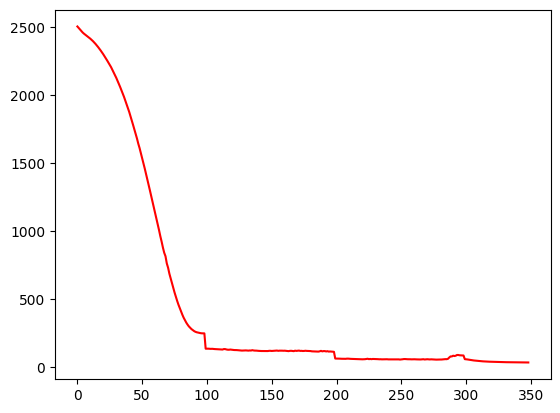

 70%|██████▉   | 349/500 [01:03<00:28,  5.34it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.47107449638618
Dataset Name:  weibo , AUC Score (contextual):  67.37195952840568
Dataset Name:  weibo , AUC Score (structural):  50.635423220591655
Dataset Name:  weibo , AUC Score (joint-type):  48.08690142318901
Dataset Name:  weibo , AUC Score (structure type):  50.31027602094661
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.08690142318901
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


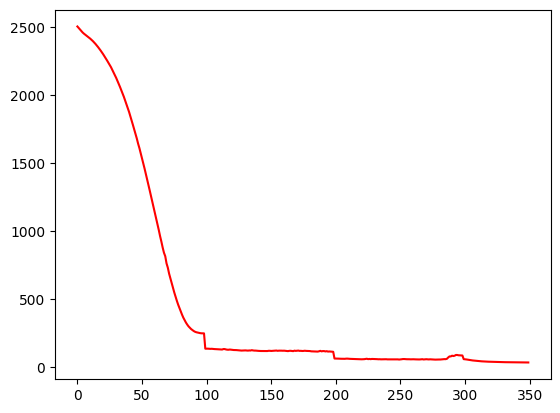

 70%|███████   | 350/500 [01:03<00:27,  5.38it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.9502313930233
Dataset Name:  weibo , AUC Score (contextual):  67.73001149905735
Dataset Name:  weibo , AUC Score (structural):  50.70285566910968
Dataset Name:  weibo , AUC Score (joint-type):  47.94890117227946
Dataset Name:  weibo , AUC Score (structure type):  50.376679909272994
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.94890117227946
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


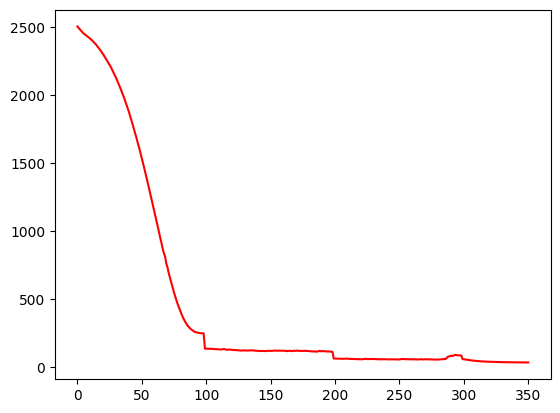

 70%|███████   | 351/500 [01:04<00:27,  5.43it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.170771658588755
Dataset Name:  weibo , AUC Score (contextual):  67.96151024422055
Dataset Name:  weibo , AUC Score (structural):  50.664268992920334
Dataset Name:  weibo , AUC Score (joint-type):  47.78341071638144
Dataset Name:  weibo , AUC Score (structure type):  50.34353636156258
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.78341071638144
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


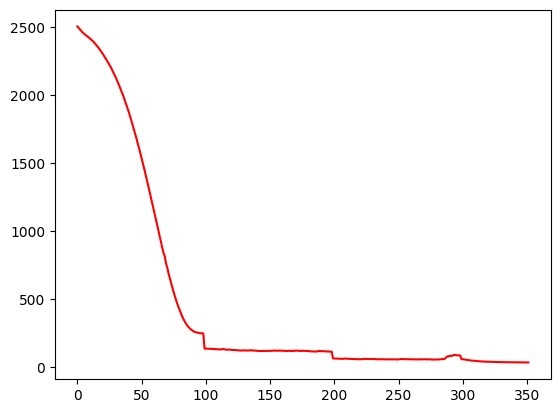

 70%|███████   | 352/500 [01:04<00:27,  5.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.25395575376529
Dataset Name:  weibo , AUC Score (contextual):  68.03386353873807
Dataset Name:  weibo , AUC Score (structural):  50.75114640547327
Dataset Name:  weibo , AUC Score (joint-type):  47.825643302594024
Dataset Name:  weibo , AUC Score (structure type):  50.43100570200056
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.825643302594024
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


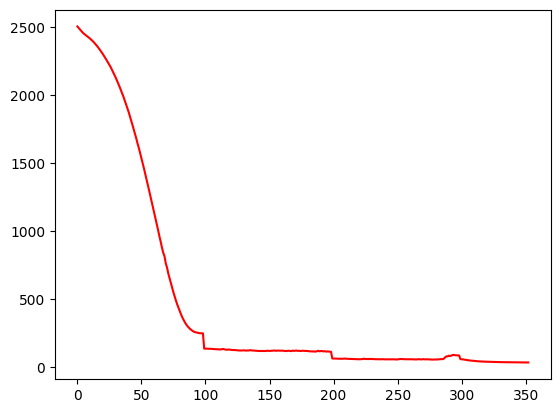

 71%|███████   | 353/500 [01:04<00:26,  5.46it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.29632736564133
Dataset Name:  weibo , AUC Score (contextual):  68.06568973820421
Dataset Name:  weibo , AUC Score (structural):  50.74271486954501
Dataset Name:  weibo , AUC Score (joint-type):  47.98171019716057
Dataset Name:  weibo , AUC Score (structure type):  50.4311054032614
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.98171019716057
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


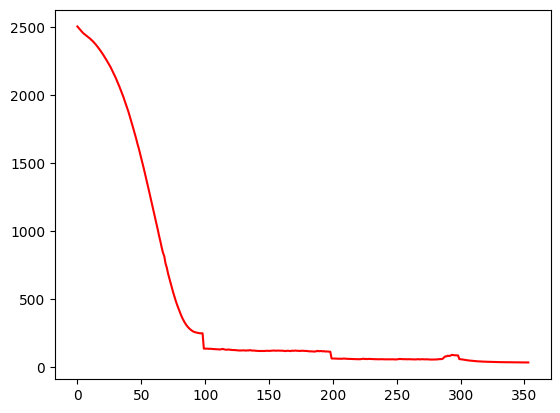

 71%|███████   | 354/500 [01:04<00:26,  5.47it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.56802844828799
Dataset Name:  weibo , AUC Score (contextual):  68.16527307804154
Dataset Name:  weibo , AUC Score (structural):  50.69597156801061
Dataset Name:  weibo , AUC Score (joint-type):  48.13040590111505
Dataset Name:  weibo , AUC Score (structure type):  50.407658515319476
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.13040590111505
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


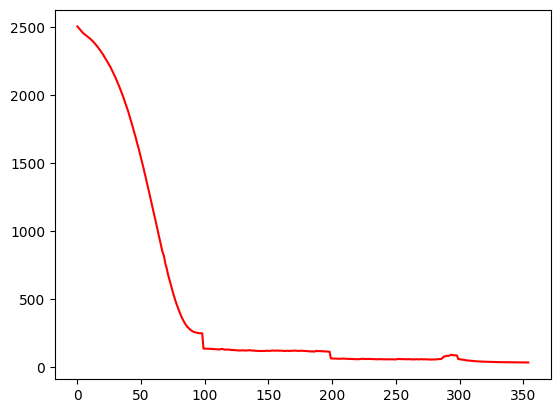

 71%|███████   | 355/500 [01:04<00:26,  5.51it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.84352035335357
Dataset Name:  weibo , AUC Score (contextual):  68.19701255761814
Dataset Name:  weibo , AUC Score (structural):  50.78310121810896
Dataset Name:  weibo , AUC Score (joint-type):  47.77653093847686
Dataset Name:  weibo , AUC Score (structure type):  50.457893707745185
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.77653093847686
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


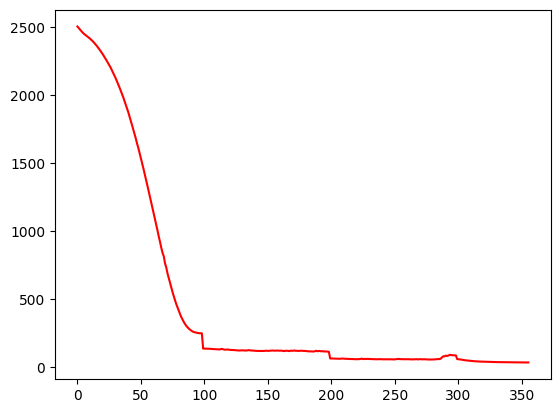

 71%|███████   | 356/500 [01:04<00:26,  5.49it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.631417724785074
Dataset Name:  weibo , AUC Score (contextual):  68.34541919527413
Dataset Name:  weibo , AUC Score (structural):  50.745665198587474
Dataset Name:  weibo , AUC Score (joint-type):  47.85894374018259
Dataset Name:  weibo , AUC Score (structure type):  50.441437302491806
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.85894374018259
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


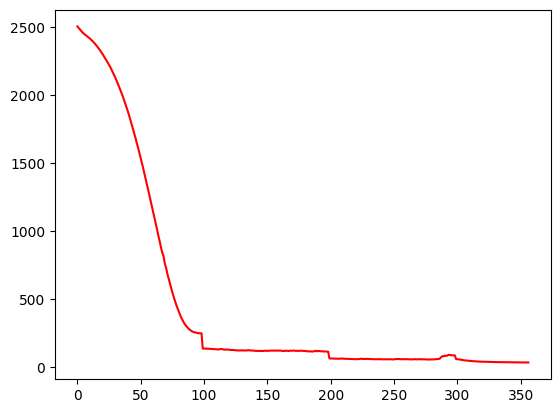

 71%|███████▏  | 357/500 [01:05<00:26,  5.49it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.57820864075171
Dataset Name:  weibo , AUC Score (contextual):  67.9785362492029
Dataset Name:  weibo , AUC Score (structural):  50.696164288831824
Dataset Name:  weibo , AUC Score (joint-type):  47.91979219601933
Dataset Name:  weibo , AUC Score (structure type):  50.3879290601031
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.91979219601933
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


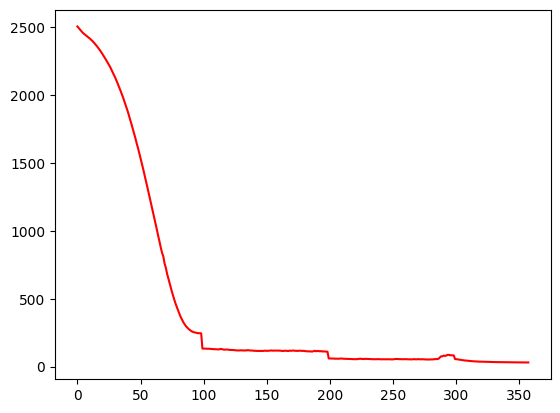

 72%|███████▏  | 358/500 [01:05<00:26,  5.44it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.92488546519199
Dataset Name:  weibo , AUC Score (contextual):  67.70678502197194
Dataset Name:  weibo , AUC Score (structural):  50.67487430634674
Dataset Name:  weibo , AUC Score (joint-type):  47.8228104528686
Dataset Name:  weibo , AUC Score (structure type):  50.359442985577616
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.8228104528686
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


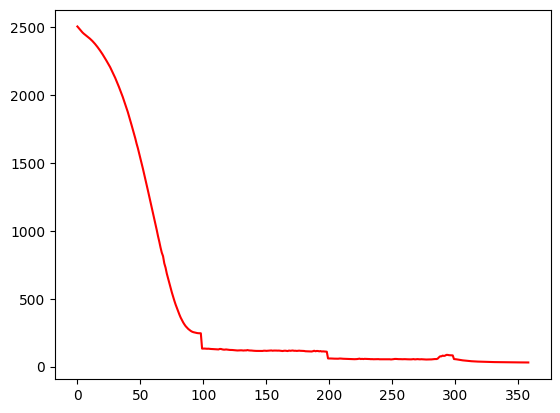

 72%|███████▏  | 359/500 [01:05<00:26,  5.36it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.39115662271963
Dataset Name:  weibo , AUC Score (contextual):  67.31300445682417
Dataset Name:  weibo , AUC Score (structural):  50.424328736374925
Dataset Name:  weibo , AUC Score (joint-type):  47.49943198472342
Dataset Name:  weibo , AUC Score (structure type):  50.050964435933565
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.49943198472342
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


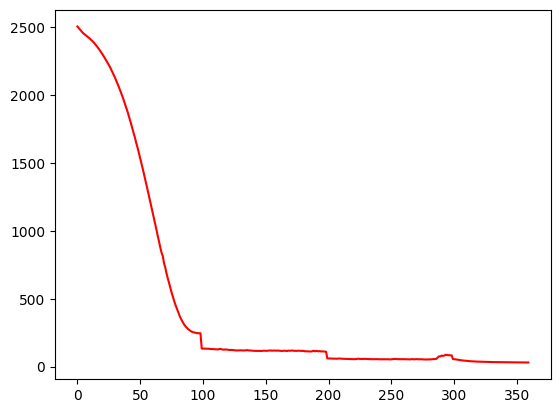

 72%|███████▏  | 360/500 [01:05<00:26,  5.32it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.02148295750182
Dataset Name:  weibo , AUC Score (contextual):  66.56156216052777
Dataset Name:  weibo , AUC Score (structural):  50.250389692837025
Dataset Name:  weibo , AUC Score (joint-type):  47.095606365702395
Dataset Name:  weibo , AUC Score (structure type):  49.839087862220374
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.095606365702395
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


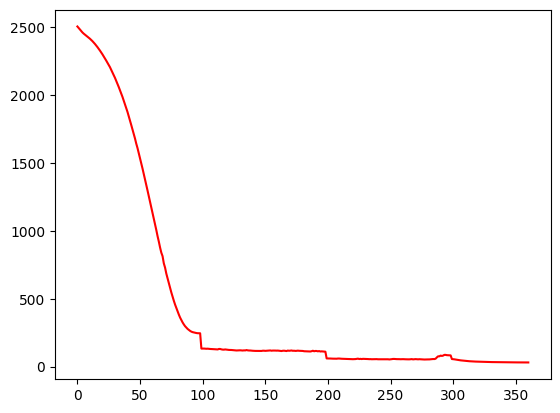

 72%|███████▏  | 361/500 [01:05<00:26,  5.32it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.423256328686314
Dataset Name:  weibo , AUC Score (contextual):  66.66952842302193
Dataset Name:  weibo , AUC Score (structural):  50.93541585185437
Dataset Name:  weibo , AUC Score (joint-type):  48.520732123995565
Dataset Name:  weibo , AUC Score (structure type):  50.559916583658236
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.520732123995565
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


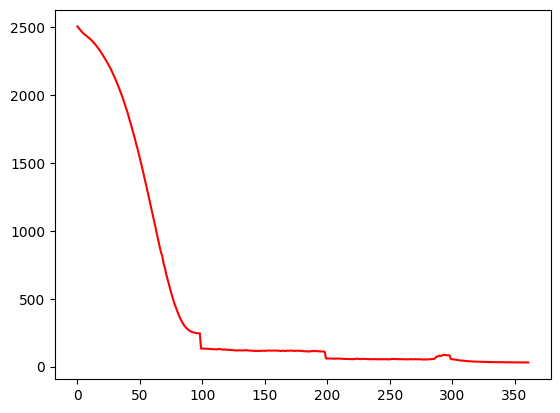

 72%|███████▏  | 362/500 [01:06<00:26,  5.30it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.01645644925892
Dataset Name:  weibo , AUC Score (contextual):  66.6923935672342
Dataset Name:  weibo , AUC Score (structural):  50.57838352577074
Dataset Name:  weibo , AUC Score (joint-type):  48.455403140531885
Dataset Name:  weibo , AUC Score (structure type):  50.27731763272061
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.455403140531885
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


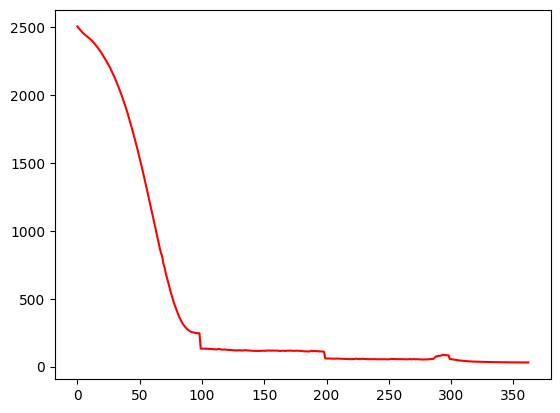

 73%|███████▎  | 363/500 [01:06<00:25,  5.31it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.84458789786057
Dataset Name:  weibo , AUC Score (contextual):  66.88687737287297
Dataset Name:  weibo , AUC Score (structural):  50.52825910747587
Dataset Name:  weibo , AUC Score (joint-type):  47.90776703800123
Dataset Name:  weibo , AUC Score (structure type):  50.21982133989834
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.90776703800123
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


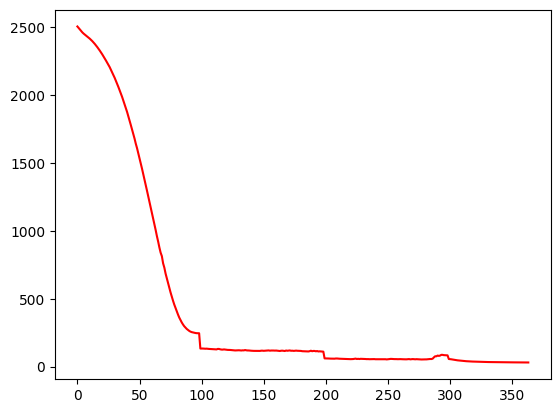

 73%|███████▎  | 364/500 [01:06<00:25,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.310925089069045
Dataset Name:  weibo , AUC Score (contextual):  66.64232728433197
Dataset Name:  weibo , AUC Score (structural):  50.34202277506646
Dataset Name:  weibo , AUC Score (joint-type):  47.95497156454822
Dataset Name:  weibo , AUC Score (structure type):  50.03356229300595
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.95497156454822
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


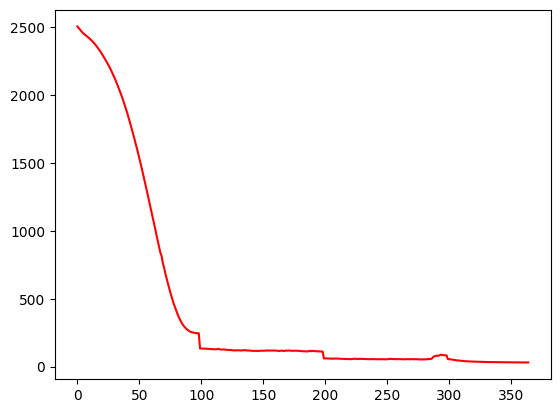

 73%|███████▎  | 365/500 [01:06<00:24,  5.40it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.99711224930894
Dataset Name:  weibo , AUC Score (contextual):  66.72101113078689
Dataset Name:  weibo , AUC Score (structural):  50.389655993334124
Dataset Name:  weibo , AUC Score (joint-type):  47.81169585369083
Dataset Name:  weibo , AUC Score (structure type):  50.08300272395238
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.81169585369083
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


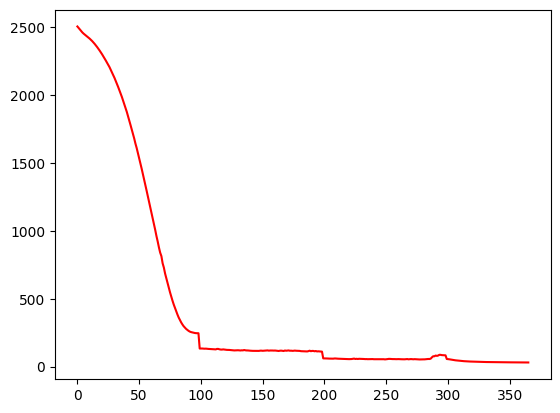

 73%|███████▎  | 366/500 [01:06<00:24,  5.43it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.65173469868158
Dataset Name:  weibo , AUC Score (contextual):  66.4319737389049
Dataset Name:  weibo , AUC Score (structural):  50.37566106075807
Dataset Name:  weibo , AUC Score (joint-type):  47.69755802572343
Dataset Name:  weibo , AUC Score (structure type):  50.04527861545828
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.69755802572343
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


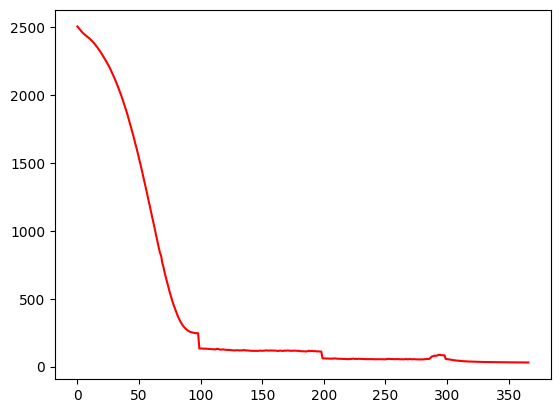

 73%|███████▎  | 367/500 [01:06<00:24,  5.44it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.72527359649386
Dataset Name:  weibo , AUC Score (contextual):  66.27394119350849
Dataset Name:  weibo , AUC Score (structural):  50.25642922327841
Dataset Name:  weibo , AUC Score (joint-type):  47.88166435124562
Dataset Name:  weibo , AUC Score (structure type):  49.9544764043008
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.88166435124562
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


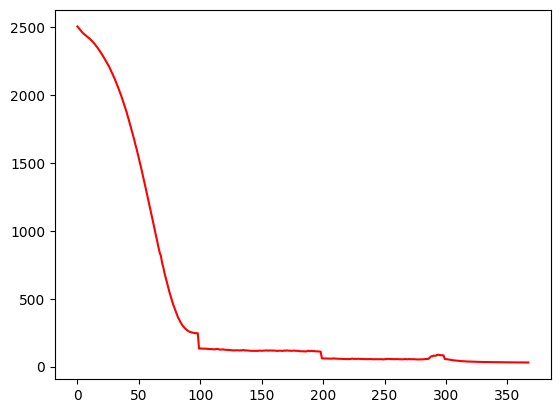

 74%|███████▎  | 368/500 [01:07<00:24,  5.44it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.22871927064577
Dataset Name:  weibo , AUC Score (contextual):  66.32672469961676
Dataset Name:  weibo , AUC Score (structural):  50.225225455019526
Dataset Name:  weibo , AUC Score (joint-type):  47.81801195231331
Dataset Name:  weibo , AUC Score (structure type):  49.917017216299776
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.81801195231331
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


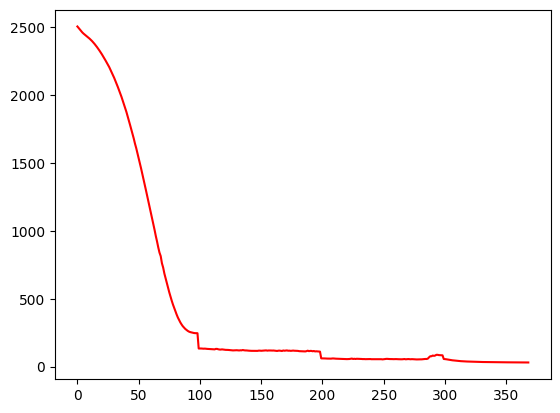

 74%|███████▍  | 369/500 [01:07<00:23,  5.51it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.09218852126743
Dataset Name:  weibo , AUC Score (contextual):  66.3827168416385
Dataset Name:  weibo , AUC Score (structural):  50.17817890160469
Dataset Name:  weibo , AUC Score (joint-type):  47.7248169776731
Dataset Name:  weibo , AUC Score (structure type):  49.881341256564035
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.7248169776731
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


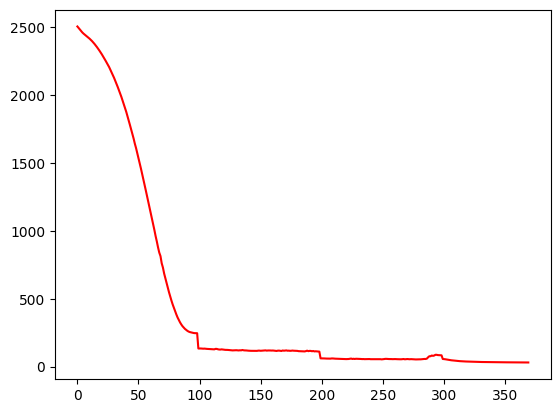

 74%|███████▍  | 370/500 [01:07<00:23,  5.53it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.94327645673051
Dataset Name:  weibo , AUC Score (contextual):  66.21702403933152
Dataset Name:  weibo , AUC Score (structural):  50.09299913275631
Dataset Name:  weibo , AUC Score (joint-type):  47.61173424169527
Dataset Name:  weibo , AUC Score (structure type):  49.76716622125841
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.61173424169527
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


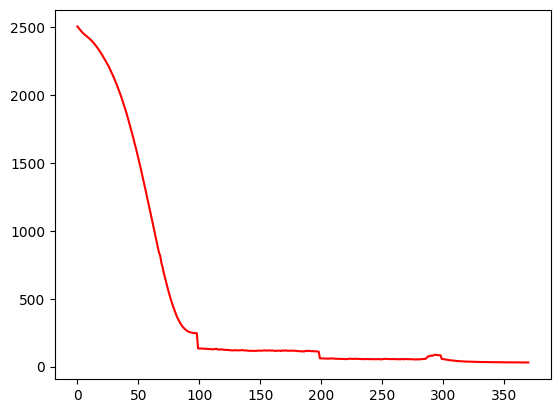

 74%|███████▍  | 371/500 [01:07<00:23,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.115399665796204
Dataset Name:  weibo , AUC Score (contextual):  66.17849150173988
Dataset Name:  weibo , AUC Score (structural):  50.31941775638954
Dataset Name:  weibo , AUC Score (joint-type):  47.608381072632525
Dataset Name:  weibo , AUC Score (structure type):  49.977233929239226
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.608381072632525
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


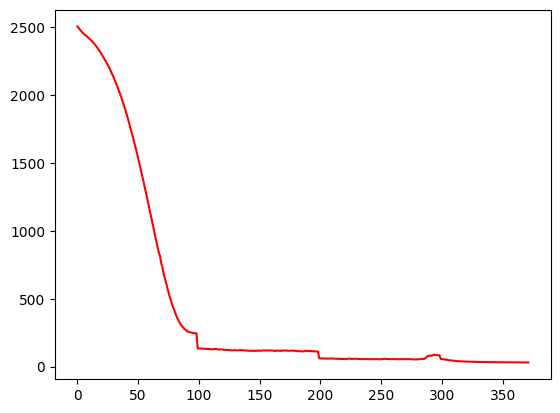

 74%|███████▍  | 372/500 [01:07<00:23,  5.48it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.214985182164305
Dataset Name:  weibo , AUC Score (contextual):  66.64951058185
Dataset Name:  weibo , AUC Score (structural):  50.15812459967917
Dataset Name:  weibo , AUC Score (joint-type):  48.01425906237299
Dataset Name:  weibo , AUC Score (structure type):  49.89488923360837
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.01425906237299
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


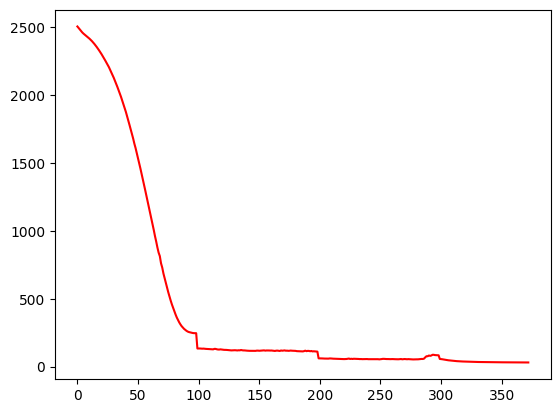

 75%|███████▍  | 373/500 [01:08<00:22,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.56565154148903
Dataset Name:  weibo , AUC Score (contextual):  66.73459724681695
Dataset Name:  weibo , AUC Score (structural):  50.31348592287767
Dataset Name:  weibo , AUC Score (joint-type):  47.394558731623334
Dataset Name:  weibo , AUC Score (structure type):  49.95557596677749
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.394558731623334
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


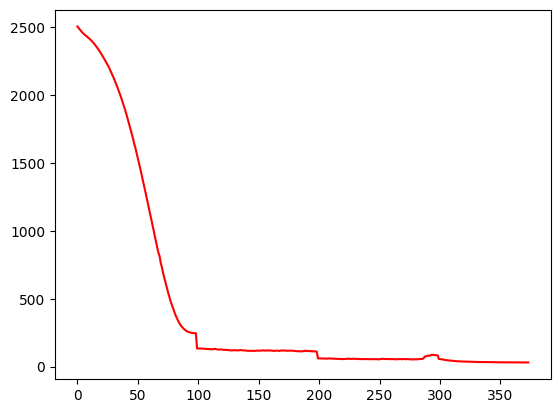

 75%|███████▍  | 374/500 [01:08<00:22,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.880282159472564
Dataset Name:  weibo , AUC Score (contextual):  66.88283044469382
Dataset Name:  weibo , AUC Score (structural):  50.271430271906404
Dataset Name:  weibo , AUC Score (joint-type):  47.574791568745454
Dataset Name:  weibo , AUC Score (structure type):  49.955271165780054
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.574791568745454
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


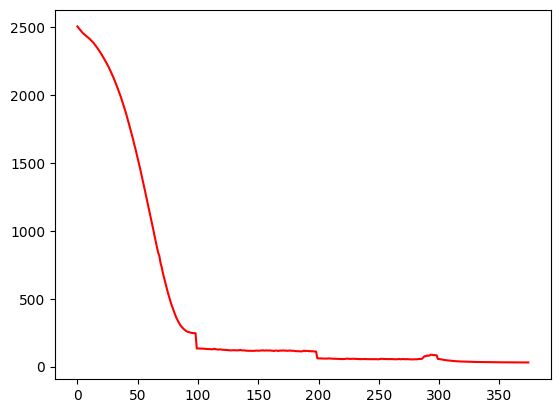

 75%|███████▌  | 375/500 [01:08<00:22,  5.62it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.6315552949535
Dataset Name:  weibo , AUC Score (contextual):  67.13749785368273
Dataset Name:  weibo , AUC Score (structural):  50.359220274230395
Dataset Name:  weibo , AUC Score (joint-type):  47.68689147930834
Dataset Name:  weibo , AUC Score (structure type):  50.03127770982899
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.68689147930834
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


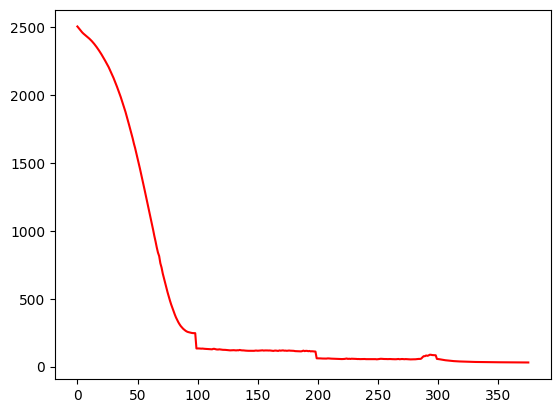

 75%|███████▌  | 376/500 [01:08<00:22,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.690068473258506
Dataset Name:  weibo , AUC Score (contextual):  67.07858614204602
Dataset Name:  weibo , AUC Score (structural):  50.39129978857392
Dataset Name:  weibo , AUC Score (joint-type):  47.80225783904441
Dataset Name:  weibo , AUC Score (structure type):  50.05270208647962
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.80225783904441
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


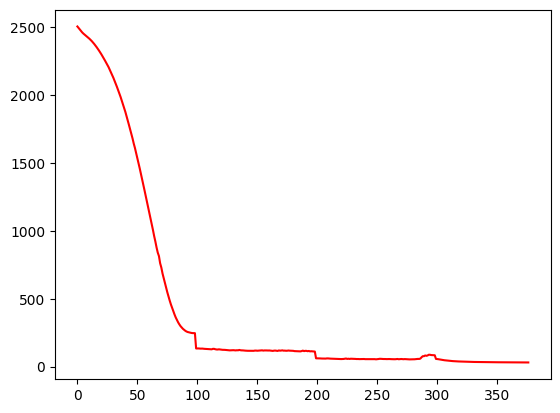

 75%|███████▌  | 377/500 [01:08<00:21,  5.62it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.15465821761643
Dataset Name:  weibo , AUC Score (contextual):  67.35172488750985
Dataset Name:  weibo , AUC Score (structural):  50.21454362009058
Dataset Name:  weibo , AUC Score (joint-type):  47.92094846121337
Dataset Name:  weibo , AUC Score (structure type):  49.92630652520255
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.92094846121337
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


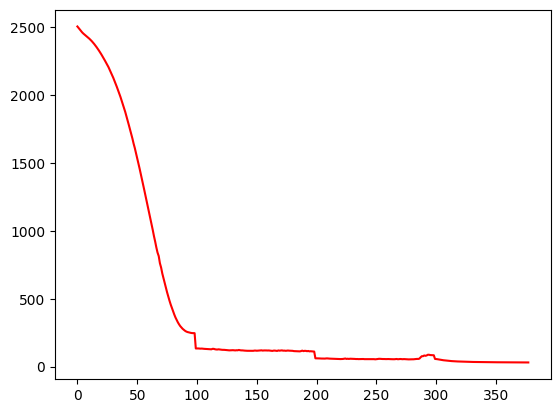

 76%|███████▌  | 378/500 [01:08<00:21,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.05272391990604
Dataset Name:  weibo , AUC Score (contextual):  67.05335065418593
Dataset Name:  weibo , AUC Score (structural):  50.35245237244999
Dataset Name:  weibo , AUC Score (joint-type):  47.78436463516653
Dataset Name:  weibo , AUC Score (structure type):  50.02498228735885
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.78436463516653
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


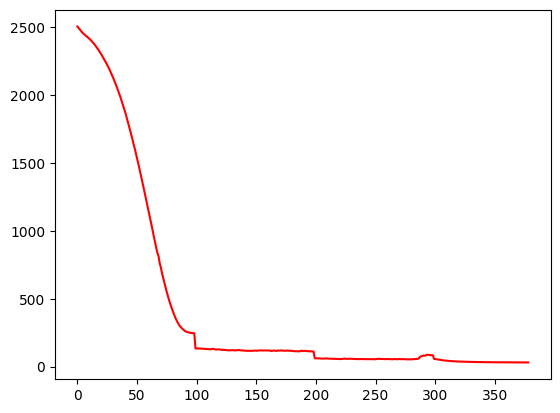

 76%|███████▌  | 379/500 [01:09<00:21,  5.61it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.390422915154666
Dataset Name:  weibo , AUC Score (contextual):  66.61301596166287
Dataset Name:  weibo , AUC Score (structural):  50.07621825066176
Dataset Name:  weibo , AUC Score (joint-type):  47.623094547226785
Dataset Name:  weibo , AUC Score (structure type):  49.77663214382323
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.623094547226785
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


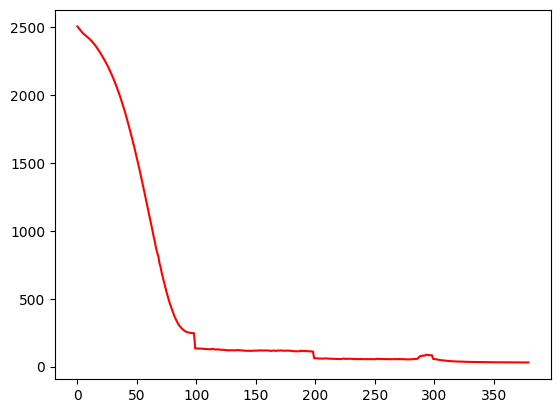

 76%|███████▌  | 380/500 [01:09<00:21,  5.65it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.535941582203684
Dataset Name:  weibo , AUC Score (contextual):  66.22115768740024
Dataset Name:  weibo , AUC Score (structural):  50.02831862420006
Dataset Name:  weibo , AUC Score (joint-type):  47.541520037786746
Dataset Name:  weibo , AUC Score (structure type):  49.69054437799972
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.541520037786746
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


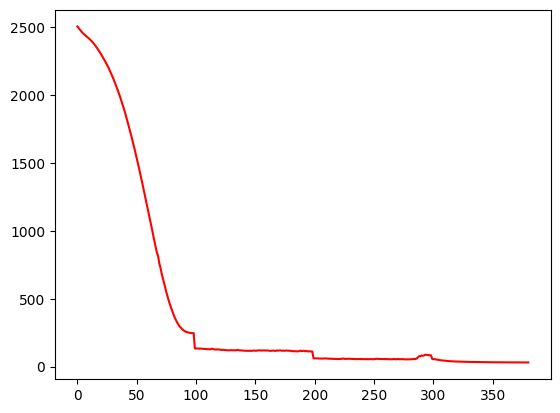

 76%|███████▌  | 381/500 [01:09<00:21,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.39711799668487
Dataset Name:  weibo , AUC Score (contextual):  66.2592566255441
Dataset Name:  weibo , AUC Score (structural):  50.05048151864007
Dataset Name:  weibo , AUC Score (joint-type):  47.841368509233064
Dataset Name:  weibo , AUC Score (structure type):  49.75415947963006
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.841368509233064
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


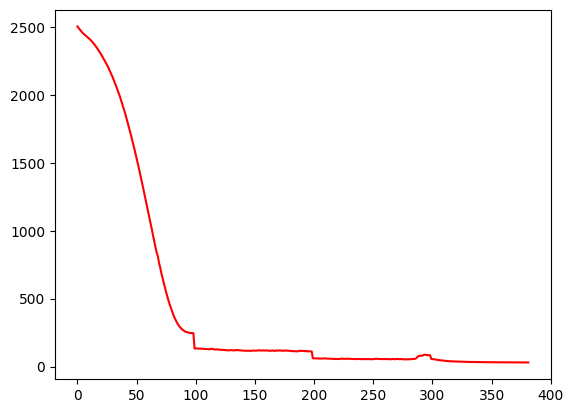

 76%|███████▋  | 382/500 [01:09<00:28,  4.09it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.80169657645936
Dataset Name:  weibo , AUC Score (contextual):  66.80524505017324
Dataset Name:  weibo , AUC Score (structural):  49.9997619331032
Dataset Name:  weibo , AUC Score (joint-type):  47.920254702096955
Dataset Name:  weibo , AUC Score (structure type):  49.72411236822057
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.920254702096955
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


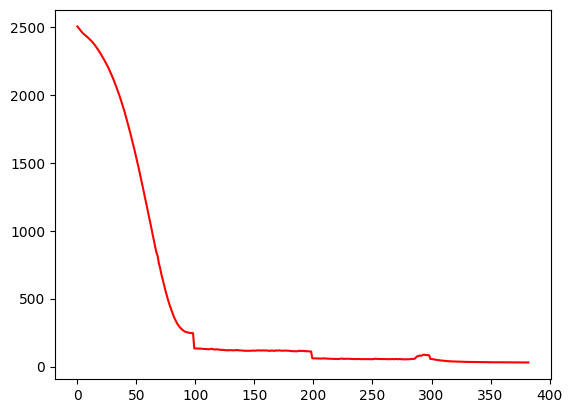

 77%|███████▋  | 383/500 [01:10<00:26,  4.39it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.63141527909318
Dataset Name:  weibo , AUC Score (contextual):  65.99198592594006
Dataset Name:  weibo , AUC Score (structural):  49.9291524251648
Dataset Name:  weibo , AUC Score (joint-type):  48.15225931328254
Dataset Name:  weibo , AUC Score (structure type):  49.66306101329753
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.15225931328254
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


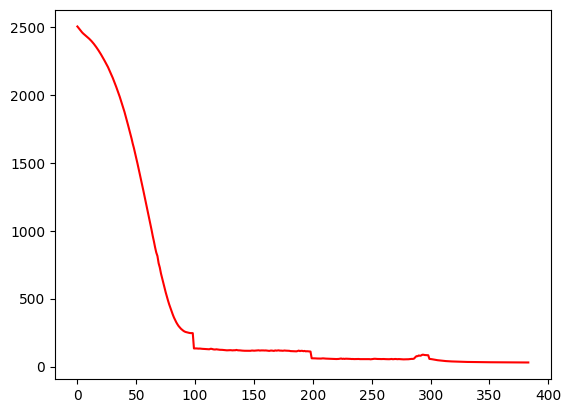

 77%|███████▋  | 384/500 [01:10<00:24,  4.65it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.47409859439973
Dataset Name:  weibo , AUC Score (contextual):  65.12449796410607
Dataset Name:  weibo , AUC Score (structural):  49.67143367286207
Dataset Name:  weibo , AUC Score (joint-type):  48.043859451340595
Dataset Name:  weibo , AUC Score (structure type):  49.41314698427044
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.043859451340595
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


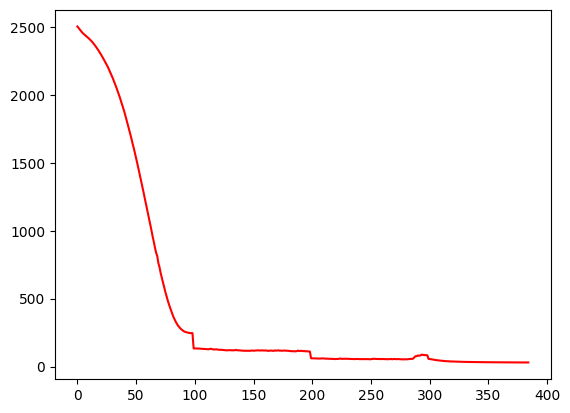

 77%|███████▋  | 385/500 [01:10<00:24,  4.75it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.67786783358778
Dataset Name:  weibo , AUC Score (contextual):  62.98673706009168
Dataset Name:  weibo , AUC Score (structural):  49.97436813077808
Dataset Name:  weibo , AUC Score (joint-type):  47.90597482695046
Dataset Name:  weibo , AUC Score (structure type):  49.63837498111373
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.90597482695046
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


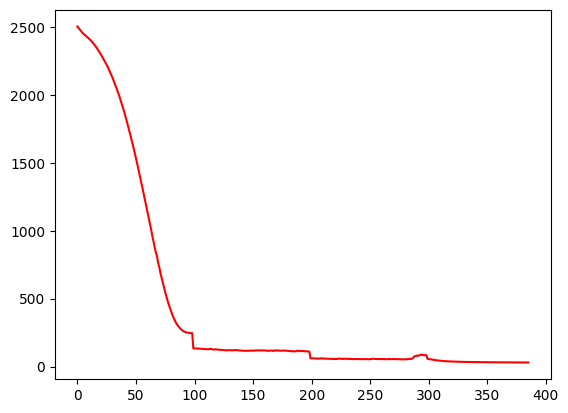

 77%|███████▋  | 386/500 [01:10<00:23,  4.95it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.74207488830831
Dataset Name:  weibo , AUC Score (contextual):  63.678646152209595
Dataset Name:  weibo , AUC Score (structural):  49.75614581030603
Dataset Name:  weibo , AUC Score (joint-type):  48.10832123590873
Dataset Name:  weibo , AUC Score (structure type):  49.48235105372268
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.10832123590873
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


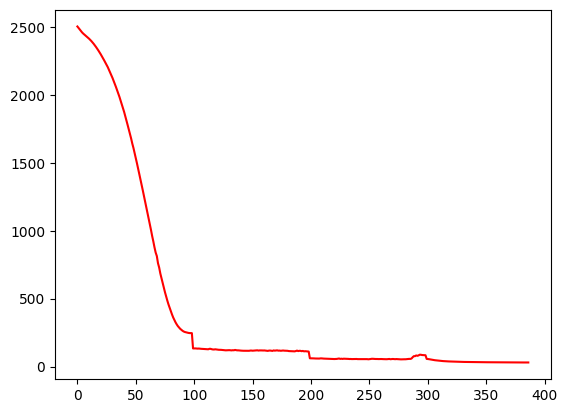

 77%|███████▋  | 387/500 [01:10<00:22,  5.10it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.20490679162521
Dataset Name:  weibo , AUC Score (contextual):  62.712962368771116
Dataset Name:  weibo , AUC Score (structural):  49.52808905969244
Dataset Name:  weibo , AUC Score (joint-type):  48.29922061944595
Dataset Name:  weibo , AUC Score (structure type):  49.291471565542246
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.29922061944595
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


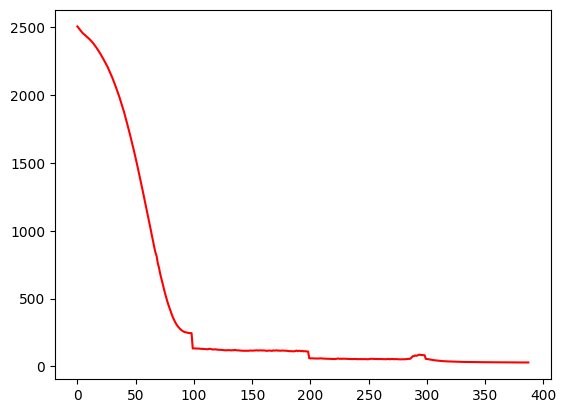

 78%|███████▊  | 388/500 [01:11<00:21,  5.25it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.90116959100084
Dataset Name:  weibo , AUC Score (contextual):  61.88600150198849
Dataset Name:  weibo , AUC Score (structural):  49.630565522245085
Dataset Name:  weibo , AUC Score (joint-type):  48.25019497521835
Dataset Name:  weibo , AUC Score (structure type):  49.35359969408235
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.25019497521835
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


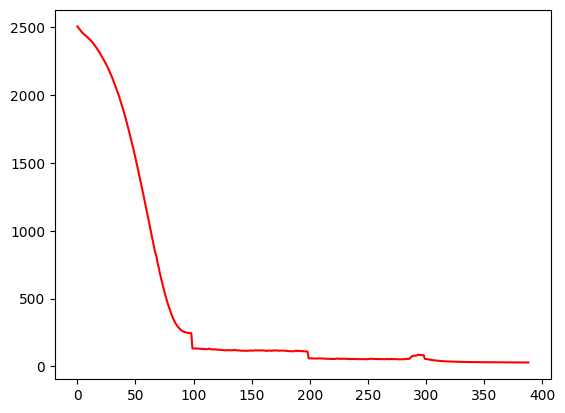

 78%|███████▊  | 389/500 [01:11<00:20,  5.30it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.23815536135404
Dataset Name:  weibo , AUC Score (contextual):  62.82381929425043
Dataset Name:  weibo , AUC Score (structural):  49.42223431450904
Dataset Name:  weibo , AUC Score (joint-type):  48.078373967382916
Dataset Name:  weibo , AUC Score (structure type):  49.18795317071658
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.078373967382916
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


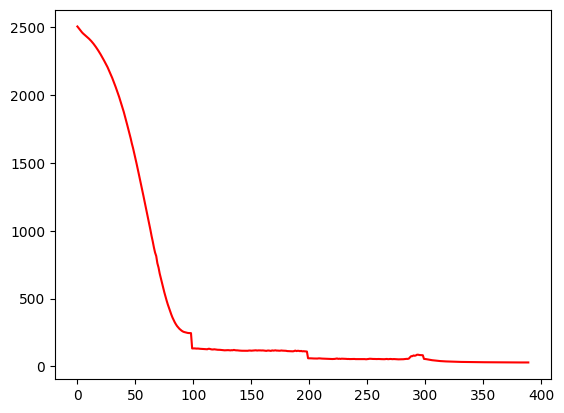

 78%|███████▊  | 390/500 [01:11<00:20,  5.38it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.142187634704136
Dataset Name:  weibo , AUC Score (contextual):  62.68506747096474
Dataset Name:  weibo , AUC Score (structural):  49.76598590870701
Dataset Name:  weibo , AUC Score (joint-type):  48.33737737084952
Dataset Name:  weibo , AUC Score (structure type):  49.462735542804424
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.33737737084952
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


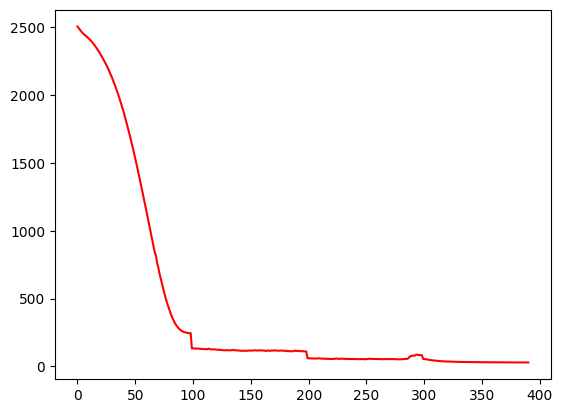

 78%|███████▊  | 391/500 [01:11<00:20,  5.38it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.20178853447417
Dataset Name:  weibo , AUC Score (contextual):  62.94921625454485
Dataset Name:  weibo , AUC Score (structural):  49.501136486019234
Dataset Name:  weibo , AUC Score (joint-type):  48.42950280018524
Dataset Name:  weibo , AUC Score (structure type):  49.254433971444186
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.42950280018524
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


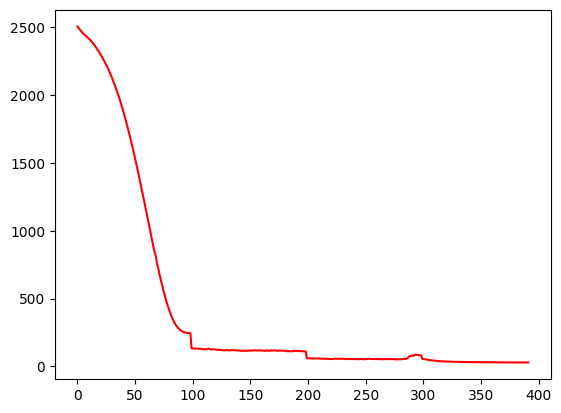

 78%|███████▊  | 392/500 [01:11<00:19,  5.40it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.0797179383551
Dataset Name:  weibo , AUC Score (contextual):  62.787223500858815
Dataset Name:  weibo , AUC Score (structural):  49.780400292482184
Dataset Name:  weibo , AUC Score (joint-type):  48.34486418798097
Dataset Name:  weibo , AUC Score (structure type):  49.46632478819464
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.34486418798097
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


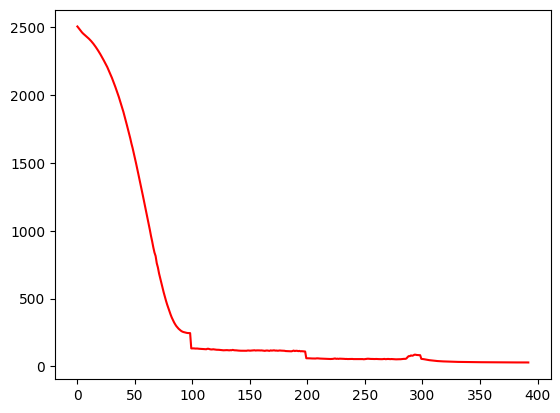

 79%|███████▊  | 393/500 [01:11<00:19,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.91186704729784
Dataset Name:  weibo , AUC Score (contextual):  63.044752666202996
Dataset Name:  weibo , AUC Score (structural):  49.59707177716939
Dataset Name:  weibo , AUC Score (joint-type):  48.43343410184499
Dataset Name:  weibo , AUC Score (structure type):  49.31166819238082
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.43343410184499
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


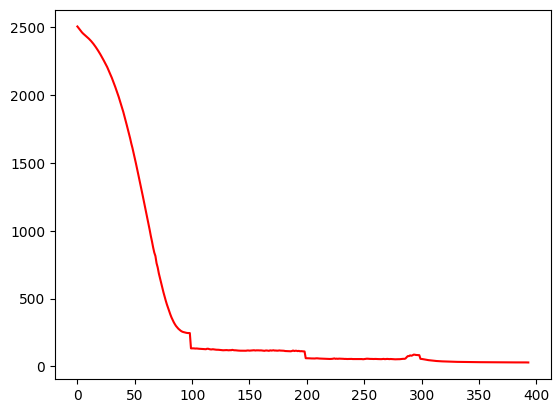

 79%|███████▉  | 394/500 [01:12<00:19,  5.38it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  60.45756449442352
Dataset Name:  weibo , AUC Score (contextual):  62.81031989810991
Dataset Name:  weibo , AUC Score (structural):  49.42544821761581
Dataset Name:  weibo , AUC Score (joint-type):  48.18133938291283
Dataset Name:  weibo , AUC Score (structure type):  49.139754732619444
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.18133938291283
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


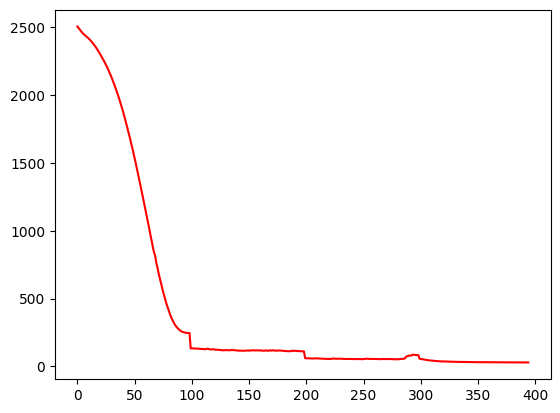

 79%|███████▉  | 395/500 [01:12<00:19,  5.43it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.824018406277126
Dataset Name:  weibo , AUC Score (contextual):  63.115169216520485
Dataset Name:  weibo , AUC Score (structural):  49.460393037110094
Dataset Name:  weibo , AUC Score (joint-type):  48.31419425370886
Dataset Name:  weibo , AUC Score (structure type):  49.221999726989466
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.31419425370886
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


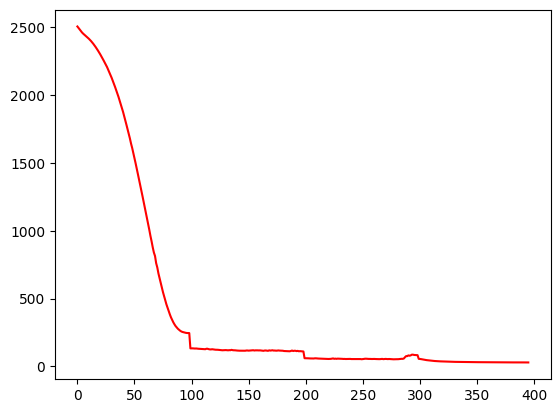

 79%|███████▉  | 396/500 [01:12<00:19,  5.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.5357526525057
Dataset Name:  weibo , AUC Score (contextual):  62.1843179220527
Dataset Name:  weibo , AUC Score (structural):  49.44366600348031
Dataset Name:  weibo , AUC Score (joint-type):  48.493530985305604
Dataset Name:  weibo , AUC Score (structure type):  49.21473577798546
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.493530985305604
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


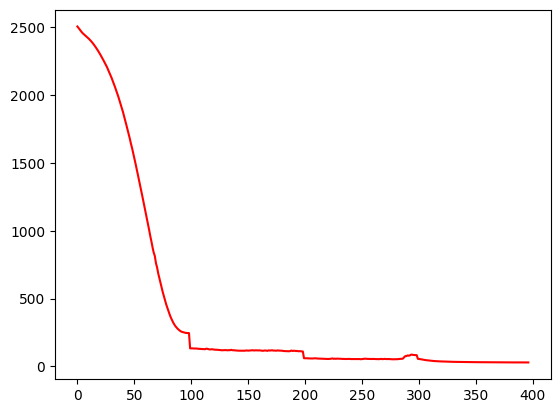

 79%|███████▉  | 397/500 [01:12<00:18,  5.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.325143118831896
Dataset Name:  weibo , AUC Score (contextual):  63.07851560986919
Dataset Name:  weibo , AUC Score (structural):  50.089819239206214
Dataset Name:  weibo , AUC Score (joint-type):  48.22504620724782
Dataset Name:  weibo , AUC Score (structure type):  49.749231388737144
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.22504620724782
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


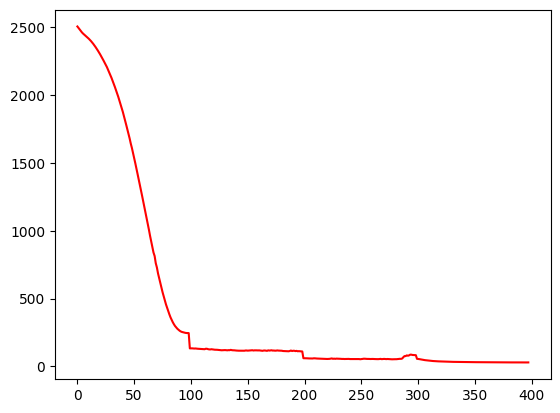

 80%|███████▉  | 398/500 [01:12<00:18,  5.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.14448291653648
Dataset Name:  weibo , AUC Score (contextual):  62.75591762072998
Dataset Name:  weibo , AUC Score (structural):  49.69038549832503
Dataset Name:  weibo , AUC Score (joint-type):  48.1608734889782
Dataset Name:  weibo , AUC Score (structure type):  49.47038405381453
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.1608734889782
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


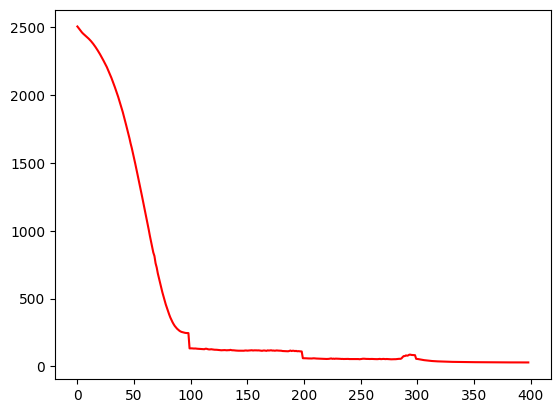

 80%|███████▉  | 399/500 [01:13<00:18,  5.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.44972054913119
Dataset Name:  weibo , AUC Score (contextual):  63.359545865282385
Dataset Name:  weibo , AUC Score (structural):  49.6757982326367
Dataset Name:  weibo , AUC Score (joint-type):  47.72172396827902
Dataset Name:  weibo , AUC Score (structure type):  49.39259713010775
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.72172396827902
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


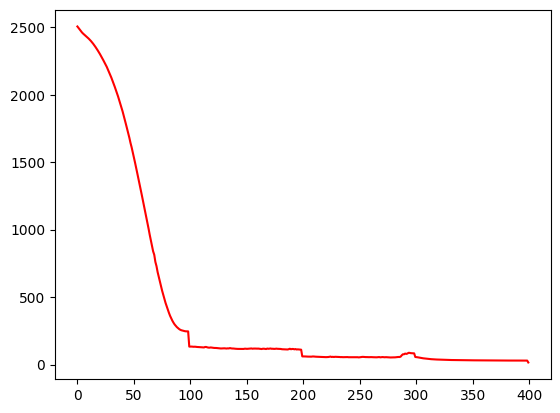

 80%|████████  | 400/500 [01:13<00:18,  5.31it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.82248740315824
Dataset Name:  weibo , AUC Score (contextual):  64.44189680680023
Dataset Name:  weibo , AUC Score (structural):  49.66188832395236
Dataset Name:  weibo , AUC Score (joint-type):  47.95991459825277
Dataset Name:  weibo , AUC Score (structure type):  49.37490727782742
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.95991459825277
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


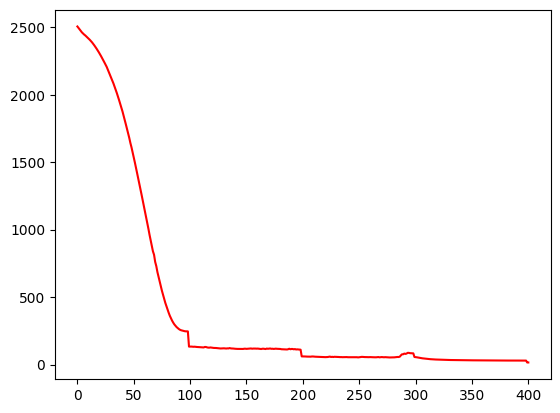

 80%|████████  | 401/500 [01:13<00:18,  5.32it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.14120691225897
Dataset Name:  weibo , AUC Score (contextual):  64.76547762135438
Dataset Name:  weibo , AUC Score (structural):  49.7185142358336
Dataset Name:  weibo , AUC Score (joint-type):  48.26274045257376
Dataset Name:  weibo , AUC Score (structure type):  49.45180828461645
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.26274045257376
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


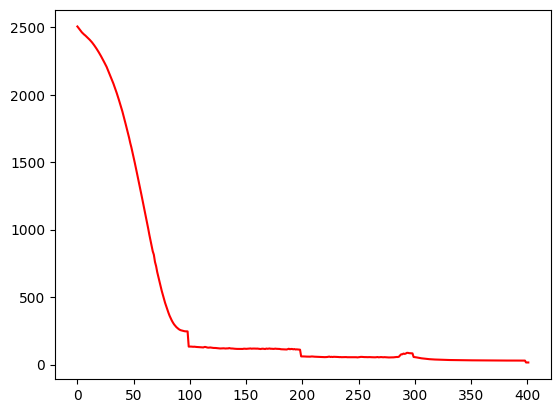

 80%|████████  | 402/500 [01:13<00:18,  5.24it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.077435496405144
Dataset Name:  weibo , AUC Score (contextual):  64.64580417377047
Dataset Name:  weibo , AUC Score (structural):  49.70847008009251
Dataset Name:  weibo , AUC Score (joint-type):  48.483355851597985
Dataset Name:  weibo , AUC Score (structure type):  49.49680488793692
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.483355851597985
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


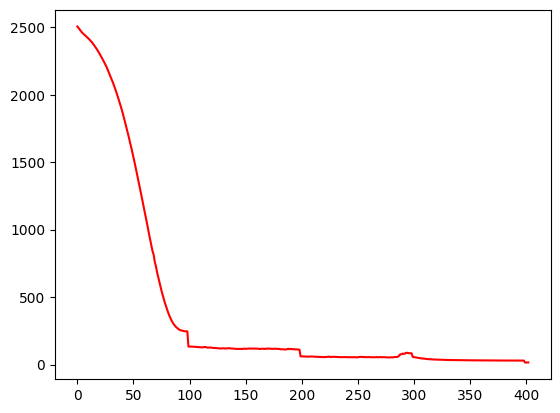

 81%|████████  | 403/500 [01:13<00:18,  5.29it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.38856052078564
Dataset Name:  weibo , AUC Score (contextual):  64.42579581397312
Dataset Name:  weibo , AUC Score (structural):  49.94233396251013
Dataset Name:  weibo , AUC Score (joint-type):  48.49204229386827
Dataset Name:  weibo , AUC Score (structure type):  49.731615600250585
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.49204229386827
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


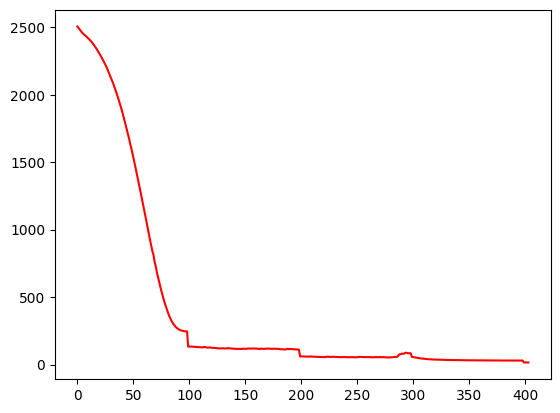

 81%|████████  | 404/500 [01:14<00:18,  5.12it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.7719074378993
Dataset Name:  weibo , AUC Score (contextual):  64.43964208967184
Dataset Name:  weibo , AUC Score (structural):  50.049030444221486
Dataset Name:  weibo , AUC Score (joint-type):  48.151883527094476
Dataset Name:  weibo , AUC Score (structure type):  49.76396438648174
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.151883527094476
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


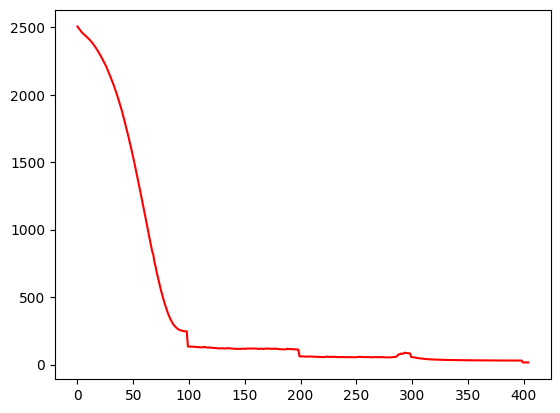

 81%|████████  | 405/500 [01:14<00:18,  5.18it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.96866334990086
Dataset Name:  weibo , AUC Score (contextual):  64.63875095608678
Dataset Name:  weibo , AUC Score (structural):  49.837720566145755
Dataset Name:  weibo , AUC Score (joint-type):  47.774276221348465
Dataset Name:  weibo , AUC Score (structure type):  49.496990047421335
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.774276221348465
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


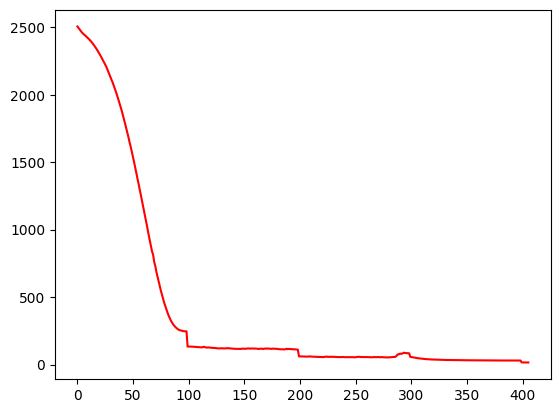

 81%|████████  | 406/500 [01:14<00:18,  5.07it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.88618239114072
Dataset Name:  weibo , AUC Score (contextual):  64.76241351859014
Dataset Name:  weibo , AUC Score (structural):  49.69748499328311
Dataset Name:  weibo , AUC Score (joint-type):  47.97780780213065
Dataset Name:  weibo , AUC Score (structure type):  49.43133249424751
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.97780780213065
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


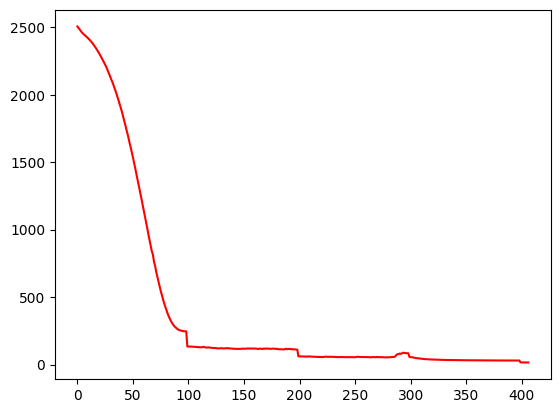

 81%|████████▏ | 407/500 [01:14<00:17,  5.18it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.41888710013702
Dataset Name:  weibo , AUC Score (contextual):  63.989334609850104
Dataset Name:  weibo , AUC Score (structural):  49.55333548727193
Dataset Name:  weibo , AUC Score (joint-type):  47.73909685281958
Dataset Name:  weibo , AUC Score (structure type):  49.31397556441739
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.73909685281958
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


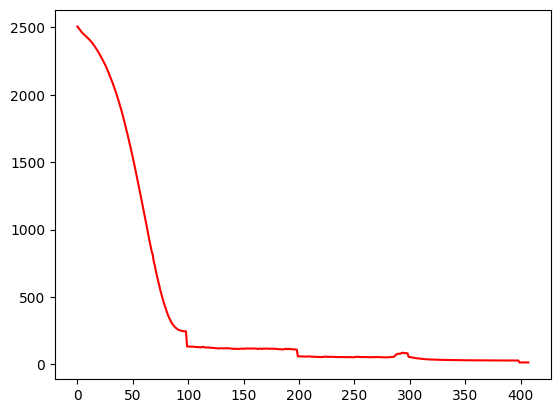

 82%|████████▏ | 408/500 [01:14<00:17,  5.26it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.63649253544267
Dataset Name:  weibo , AUC Score (contextual):  63.847605403689755
Dataset Name:  weibo , AUC Score (structural):  49.74992772969204
Dataset Name:  weibo , AUC Score (joint-type):  47.85142801642128
Dataset Name:  weibo , AUC Score (structure type):  49.47694439677775
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.85142801642128
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


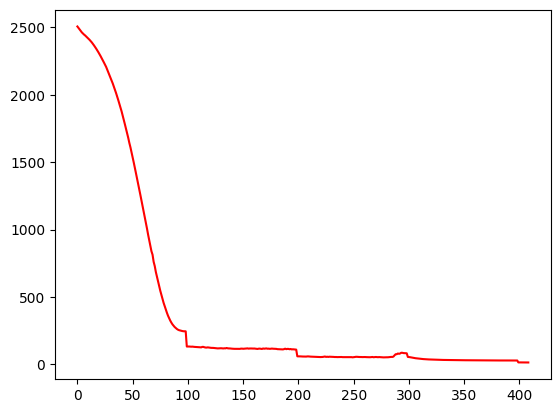

 82%|████████▏ | 409/500 [01:14<00:17,  5.33it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.89925155714145
Dataset Name:  weibo , AUC Score (contextual):  64.314129502858
Dataset Name:  weibo , AUC Score (structural):  49.76877469235522
Dataset Name:  weibo , AUC Score (joint-type):  47.747913374924195
Dataset Name:  weibo , AUC Score (structure type):  49.51730346716547
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.747913374924195
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


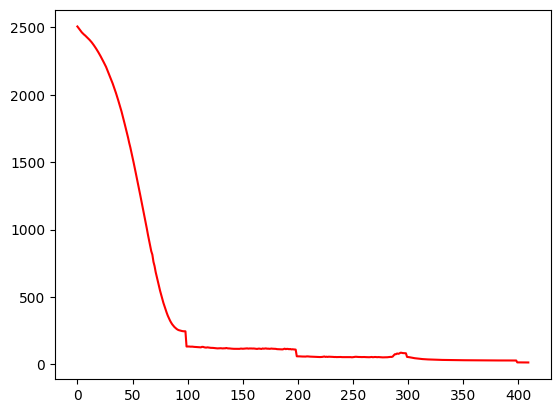

 82%|████████▏ | 410/500 [01:15<00:16,  5.39it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.186653370255115
Dataset Name:  weibo , AUC Score (contextual):  63.81777376168334
Dataset Name:  weibo , AUC Score (structural):  49.91201160859535
Dataset Name:  weibo , AUC Score (joint-type):  47.871171244609634
Dataset Name:  weibo , AUC Score (structure type):  49.62531126733634
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.871171244609634
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


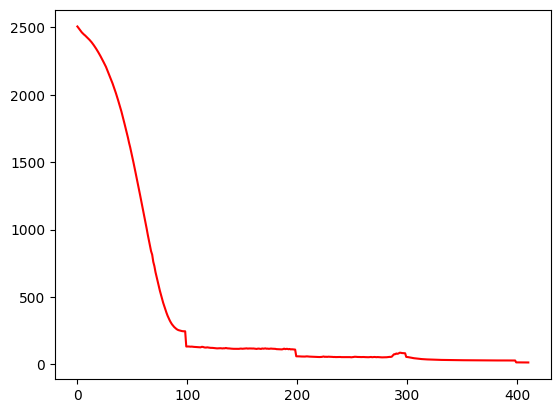

 82%|████████▏ | 411/500 [01:15<00:15,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.97859897317627
Dataset Name:  weibo , AUC Score (contextual):  64.59995825882649
Dataset Name:  weibo , AUC Score (structural):  50.16718531240612
Dataset Name:  weibo , AUC Score (joint-type):  47.492638926708395
Dataset Name:  weibo , AUC Score (structure type):  49.838273160488946
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.492638926708395
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


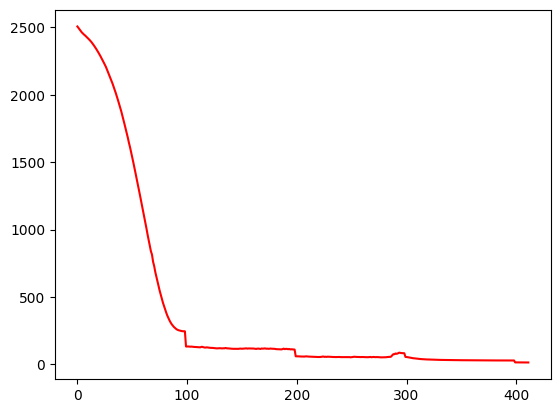

 82%|████████▏ | 412/500 [01:15<00:15,  5.63it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.85079628670602
Dataset Name:  weibo , AUC Score (contextual):  64.8370504368659
Dataset Name:  weibo , AUC Score (structural):  50.07098077893222
Dataset Name:  weibo , AUC Score (joint-type):  47.5819893195784
Dataset Name:  weibo , AUC Score (structure type):  49.721175453936986
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.5819893195784
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


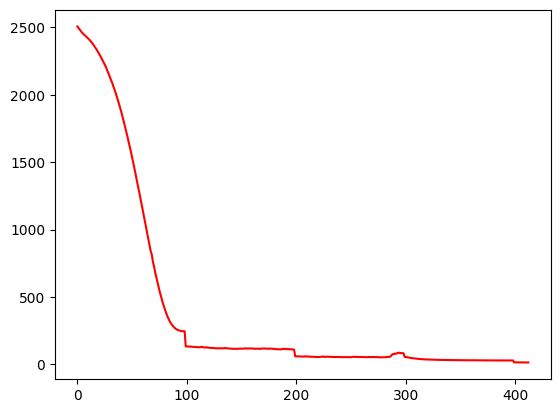

 83%|████████▎ | 413/500 [01:15<00:15,  5.57it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.12981671373605
Dataset Name:  weibo , AUC Score (contextual):  65.64157975888402
Dataset Name:  weibo , AUC Score (structural):  49.93891600206325
Dataset Name:  weibo , AUC Score (joint-type):  47.78450916831579
Dataset Name:  weibo , AUC Score (structure type):  49.61781658112868
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.78450916831579
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


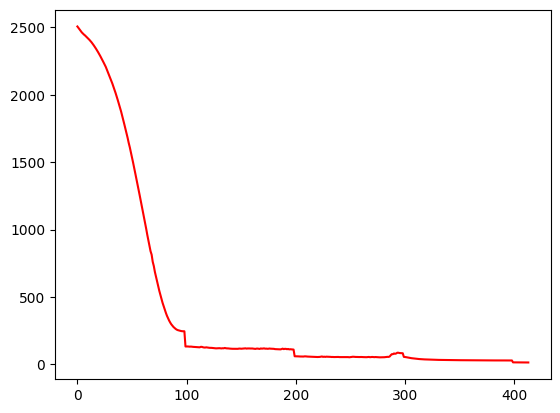

 83%|████████▎ | 414/500 [01:15<00:15,  5.69it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.68283105955321
Dataset Name:  weibo , AUC Score (contextual):  66.20710906529257
Dataset Name:  weibo , AUC Score (structural):  49.72864908372587
Dataset Name:  weibo , AUC Score (joint-type):  48.253027824943764
Dataset Name:  weibo , AUC Score (structure type):  49.50372700404662
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.253027824943764
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


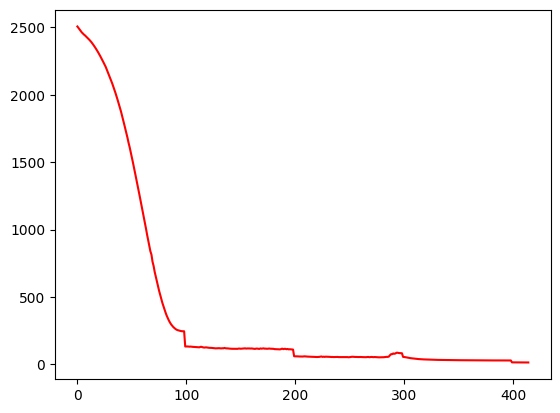

 83%|████████▎ | 415/500 [01:15<00:14,  5.71it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.22160597580355
Dataset Name:  weibo , AUC Score (contextual):  59.95914336936834
Dataset Name:  weibo , AUC Score (structural):  50.33227903707609
Dataset Name:  weibo , AUC Score (joint-type):  49.47332120411145
Dataset Name:  weibo , AUC Score (structure type):  50.28948118654299
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.47332120411145
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


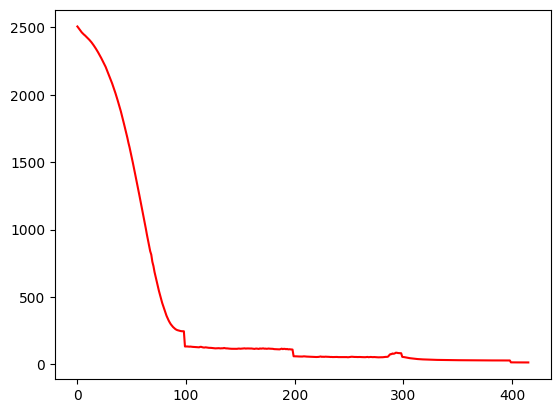

 83%|████████▎ | 416/500 [01:16<00:14,  5.83it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.41275269347105
Dataset Name:  weibo , AUC Score (contextual):  66.12544783596297
Dataset Name:  weibo , AUC Score (structural):  49.59759325703856
Dataset Name:  weibo , AUC Score (joint-type):  48.24929886969296
Dataset Name:  weibo , AUC Score (structure type):  49.39195904203839
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.24929886969296
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


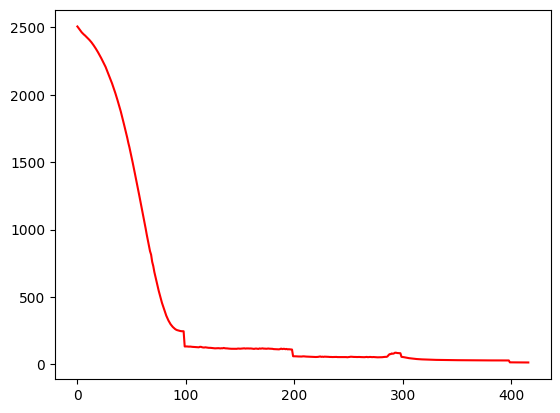

 83%|████████▎ | 417/500 [01:16<00:14,  5.84it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.32896237241896
Dataset Name:  weibo , AUC Score (contextual):  66.67331519153244
Dataset Name:  weibo , AUC Score (structural):  49.85946684351636
Dataset Name:  weibo , AUC Score (joint-type):  47.802835971641436
Dataset Name:  weibo , AUC Score (structure type):  49.59273459250899
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.802835971641436
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


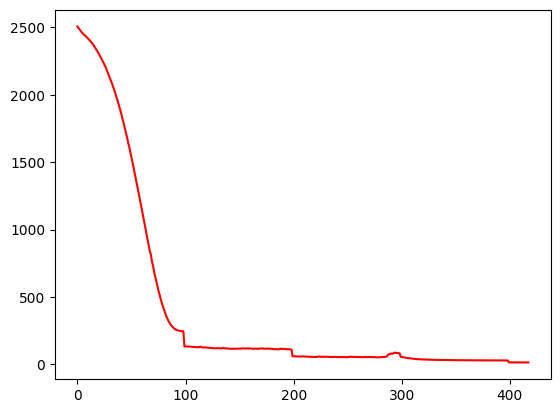

 84%|████████▎ | 418/500 [01:16<00:14,  5.68it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.2984422776973
Dataset Name:  weibo , AUC Score (contextual):  67.07731425033258
Dataset Name:  weibo , AUC Score (structural):  49.98420256091961
Dataset Name:  weibo , AUC Score (joint-type):  48.17295646025599
Dataset Name:  weibo , AUC Score (structure type):  49.77003192035567
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.17295646025599
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


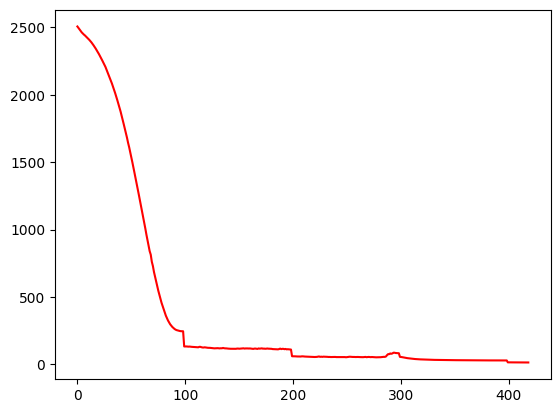

 84%|████████▍ | 419/500 [01:16<00:14,  5.74it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.79878742596432
Dataset Name:  weibo , AUC Score (contextual):  66.8505706457799
Dataset Name:  weibo , AUC Score (structural):  49.78689044954966
Dataset Name:  weibo , AUC Score (joint-type):  47.56091638641689
Dataset Name:  weibo , AUC Score (structure type):  49.52877196076943
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.56091638641689
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


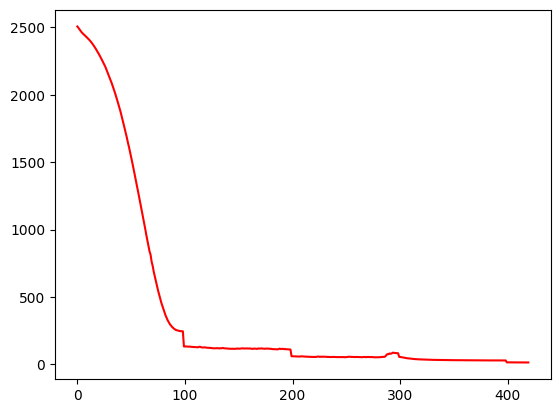

 84%|████████▍ | 420/500 [01:16<00:13,  5.72it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.51126577394837
Dataset Name:  weibo , AUC Score (contextual):  66.75483188771277
Dataset Name:  weibo , AUC Score (structural):  50.228657586115034
Dataset Name:  weibo , AUC Score (joint-type):  47.70891833125495
Dataset Name:  weibo , AUC Score (structure type):  49.94343805042218
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.70891833125495
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


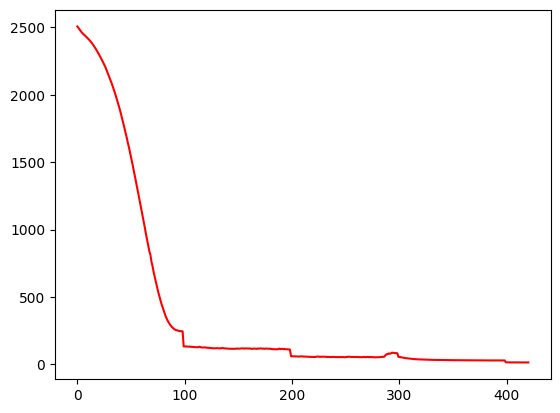

 84%|████████▍ | 421/500 [01:17<00:14,  5.63it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.13705963024807
Dataset Name:  weibo , AUC Score (contextual):  67.10937170283754
Dataset Name:  weibo , AUC Score (structural):  49.6308886130336
Dataset Name:  weibo , AUC Score (joint-type):  47.97219991593952
Dataset Name:  weibo , AUC Score (structure type):  49.45870191465162
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.97219991593952
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


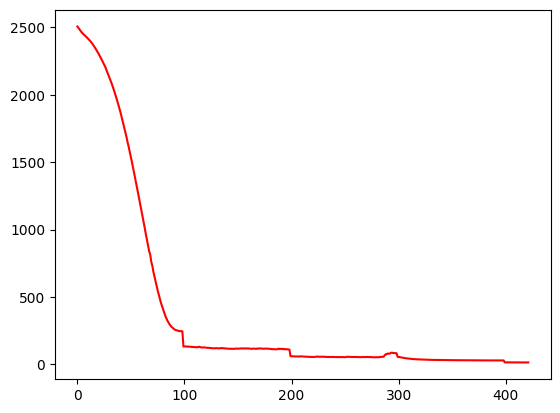

 84%|████████▍ | 422/500 [01:17<00:13,  5.68it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.33069973079046
Dataset Name:  weibo , AUC Score (contextual):  65.95054827204838
Dataset Name:  weibo , AUC Score (structural):  50.2405212531388
Dataset Name:  weibo , AUC Score (joint-type):  47.70127252765931
Dataset Name:  weibo , AUC Score (structure type):  49.92104229863023
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.70127252765931
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


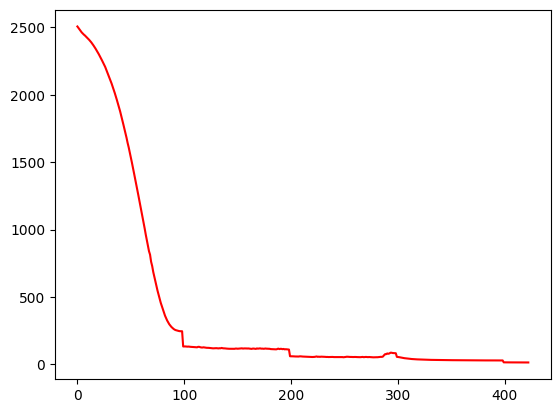

 85%|████████▍ | 423/500 [01:17<00:13,  5.64it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.24615766519579
Dataset Name:  weibo , AUC Score (contextual):  65.83600575126307
Dataset Name:  weibo , AUC Score (structural):  50.09710862085579
Dataset Name:  weibo , AUC Score (joint-type):  47.47023628857373
Dataset Name:  weibo , AUC Score (structure type):  49.75121971673903
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.47023628857373
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


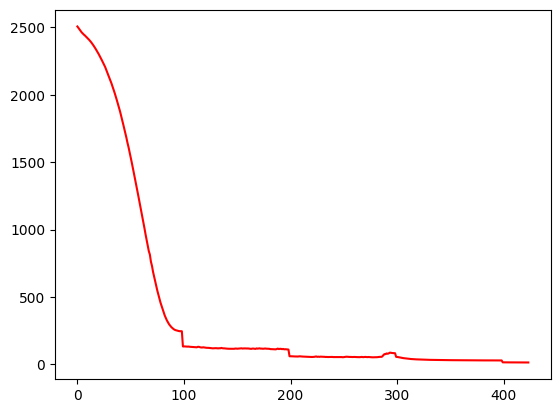

 85%|████████▍ | 424/500 [01:17<00:13,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.68598722492845
Dataset Name:  weibo , AUC Score (contextual):  65.01260039995213
Dataset Name:  weibo , AUC Score (structural):  49.61637786884781
Dataset Name:  weibo , AUC Score (joint-type):  47.30104578405476
Dataset Name:  weibo , AUC Score (structure type):  49.31675010807617
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.30104578405476
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


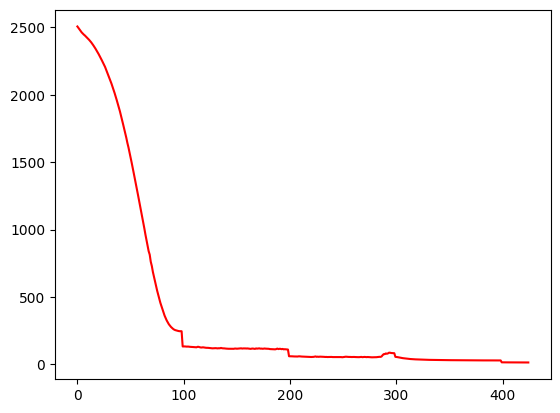

 85%|████████▌ | 425/500 [01:17<00:13,  5.57it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.358690062970446
Dataset Name:  weibo , AUC Score (contextual):  64.43998896923004
Dataset Name:  weibo , AUC Score (structural):  50.12548959590979
Dataset Name:  weibo , AUC Score (joint-type):  47.78317946334264
Dataset Name:  weibo , AUC Score (structure type):  49.77405415407867
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.78317946334264
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


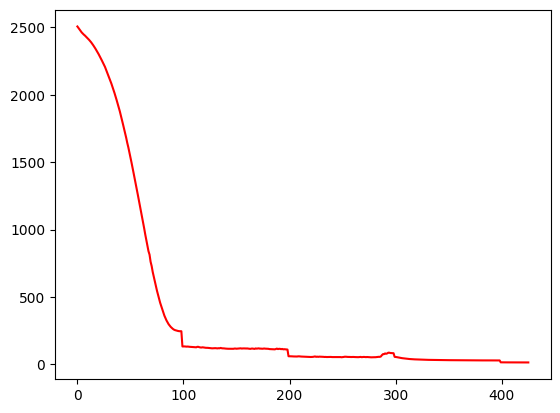

 85%|████████▌ | 426/500 [01:17<00:13,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.39092733910557
Dataset Name:  weibo , AUC Score (contextual):  65.56945771740531
Dataset Name:  weibo , AUC Score (structural):  49.688449787723684
Dataset Name:  weibo , AUC Score (joint-type):  47.74505161856892
Dataset Name:  weibo , AUC Score (structure type):  49.42241065570614
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.74505161856892
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


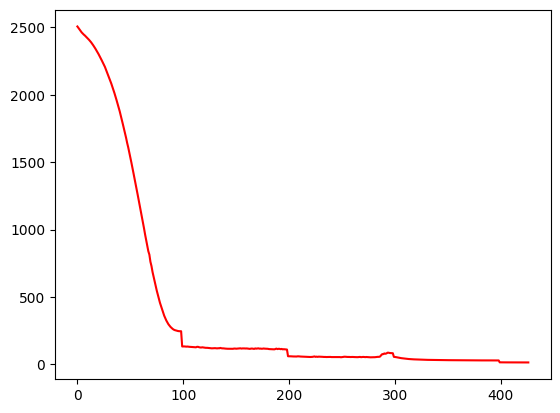

 85%|████████▌ | 427/500 [01:18<00:13,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.47719422890086
Dataset Name:  weibo , AUC Score (contextual):  66.07671125803388
Dataset Name:  weibo , AUC Score (structural):  49.99380459242381
Dataset Name:  weibo , AUC Score (joint-type):  47.85504134515268
Dataset Name:  weibo , AUC Score (structure type):  49.653193437081896
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.85504134515268
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


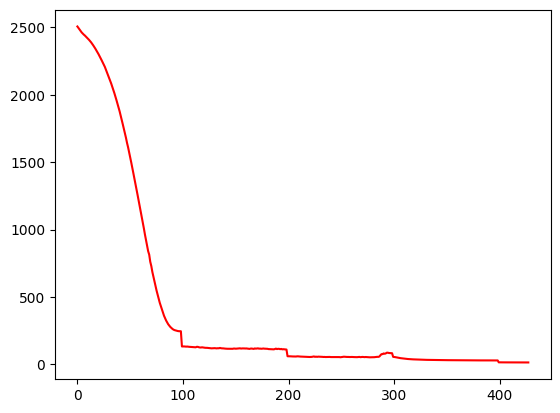

 86%|████████▌ | 428/500 [01:18<00:12,  5.62it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.91217337020622
Dataset Name:  weibo , AUC Score (contextual):  68.14564547637258
Dataset Name:  weibo , AUC Score (structural):  50.163909058445434
Dataset Name:  weibo , AUC Score (joint-type):  47.79985858876677
Dataset Name:  weibo , AUC Score (structure type):  49.856498550970365
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.79985858876677
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


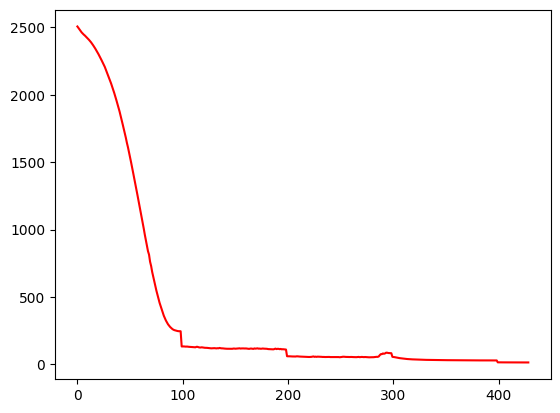

 86%|████████▌ | 429/500 [01:18<00:12,  5.69it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.54752071042458
Dataset Name:  weibo , AUC Score (contextual):  68.43508756107248
Dataset Name:  weibo , AUC Score (structural):  49.96692003786398
Dataset Name:  weibo , AUC Score (joint-type):  47.42323410843571
Dataset Name:  weibo , AUC Score (structure type):  49.63194282548587
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.42323410843571
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


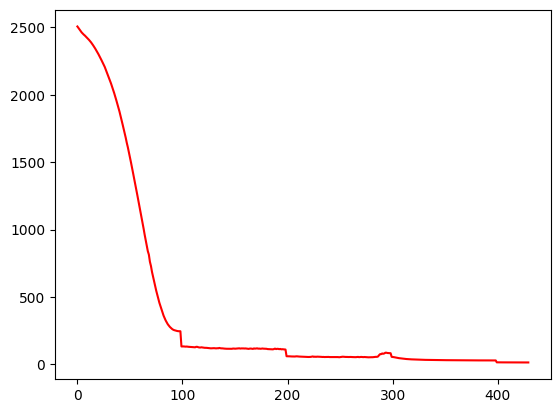

 86%|████████▌ | 430/500 [01:18<00:12,  5.69it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.63916017386424
Dataset Name:  weibo , AUC Score (contextual):  66.81787724741821
Dataset Name:  weibo , AUC Score (structural):  50.152036889032495
Dataset Name:  weibo , AUC Score (joint-type):  48.31514817249395
Dataset Name:  weibo , AUC Score (structure type):  49.89996545208882
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.31514817249395
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


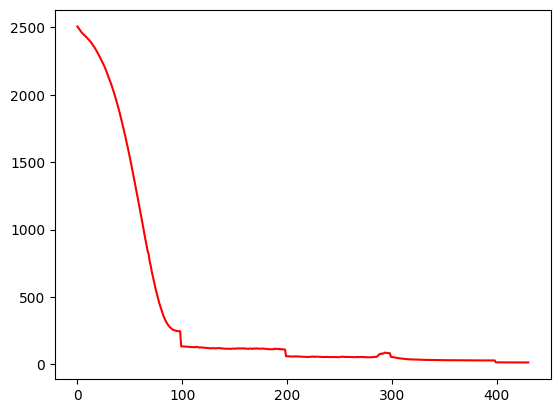

 86%|████████▌ | 431/500 [01:18<00:12,  5.63it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.0207339643626
Dataset Name:  weibo , AUC Score (contextual):  66.56589815500544
Dataset Name:  weibo , AUC Score (structural):  49.78854558130835
Dataset Name:  weibo , AUC Score (joint-type):  48.098753141428
Dataset Name:  weibo , AUC Score (structure type):  49.55585652042828
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.098753141428
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


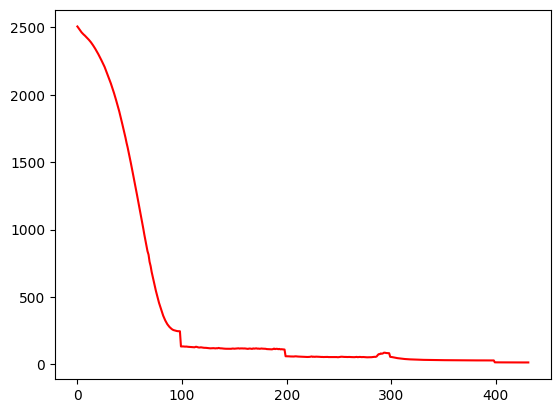

 86%|████████▋ | 432/500 [01:19<00:12,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.80832562430872
Dataset Name:  weibo , AUC Score (contextual):  66.61021201856731
Dataset Name:  weibo , AUC Score (structural):  50.27445712245141
Dataset Name:  weibo , AUC Score (joint-type):  48.576666452757614
Dataset Name:  weibo , AUC Score (structure type):  50.043093733542165
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.576666452757614
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


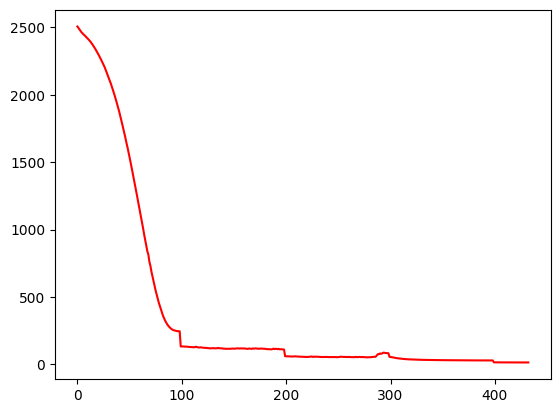

 87%|████████▋ | 433/500 [01:19<00:12,  5.57it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.08296153721517
Dataset Name:  weibo , AUC Score (contextual):  67.06199373651145
Dataset Name:  weibo , AUC Score (structural):  49.883426576201245
Dataset Name:  weibo , AUC Score (joint-type):  47.71539341634161
Dataset Name:  weibo , AUC Score (structure type):  49.65577427543391
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.71539341634161
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


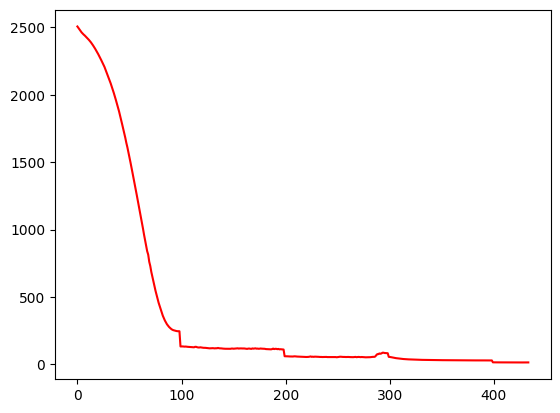

 87%|████████▋ | 434/500 [01:19<00:11,  5.53it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.52763662399138
Dataset Name:  weibo , AUC Score (contextual):  66.34776872614843
Dataset Name:  weibo , AUC Score (structural):  50.38765509774914
Dataset Name:  weibo , AUC Score (joint-type):  47.756093951172076
Dataset Name:  weibo , AUC Score (structure type):  50.08446975679045
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.756093951172076
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


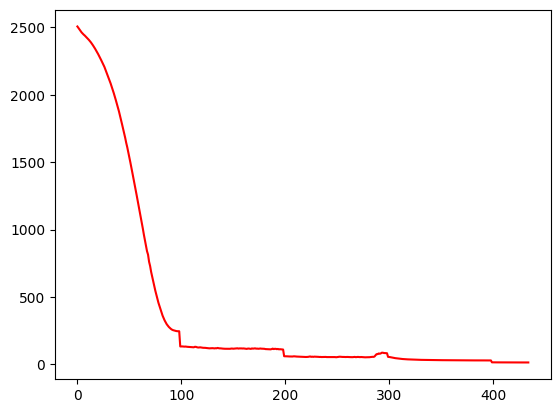

 87%|████████▋ | 435/500 [01:19<00:11,  5.52it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.90959744523025
Dataset Name:  weibo , AUC Score (contextual):  65.15060065086168
Dataset Name:  weibo , AUC Score (structural):  50.2413318142398
Dataset Name:  weibo , AUC Score (joint-type):  48.09895548783696
Dataset Name:  weibo , AUC Score (structure type):  49.999561314452315
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.09895548783696
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


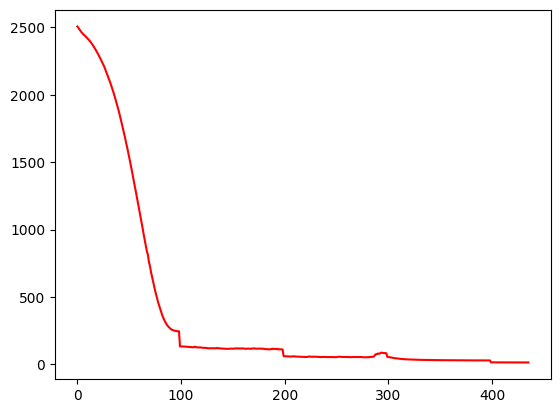

 87%|████████▋ | 436/500 [01:19<00:11,  5.46it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.72294285212921
Dataset Name:  weibo , AUC Score (contextual):  65.9492041137603
Dataset Name:  weibo , AUC Score (structural):  49.98212230970236
Dataset Name:  weibo , AUC Score (joint-type):  47.978819534175436
Dataset Name:  weibo , AUC Score (structure type):  49.799543493564094
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.978819534175436
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


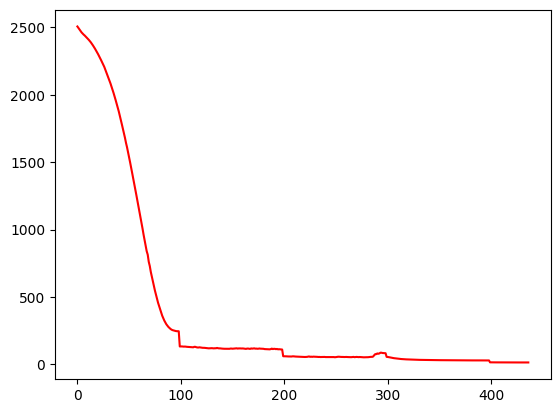

 87%|████████▋ | 437/500 [01:19<00:11,  5.45it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.80172470191602
Dataset Name:  weibo , AUC Score (contextual):  66.15374742658727
Dataset Name:  weibo , AUC Score (structural):  50.53501000447793
Dataset Name:  weibo , AUC Score (joint-type):  48.32835850233595
Dataset Name:  weibo , AUC Score (structure type):  50.25126426895958
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.32835850233595
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


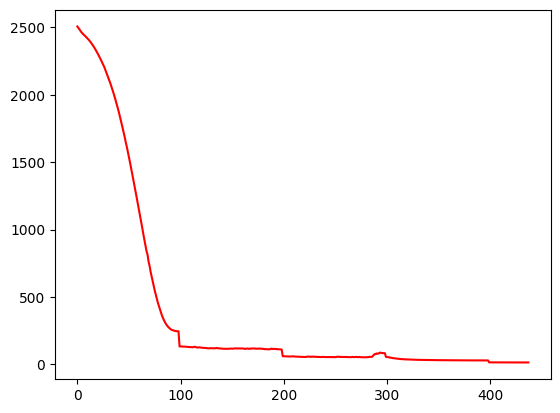

 88%|████████▊ | 438/500 [01:20<00:11,  5.56it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.9103898494004
Dataset Name:  weibo , AUC Score (contextual):  65.97432397510097
Dataset Name:  weibo , AUC Score (structural):  49.7091842807829
Dataset Name:  weibo , AUC Score (joint-type):  48.072650454672385
Dataset Name:  weibo , AUC Score (structure type):  49.53132431304692
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.072650454672385
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


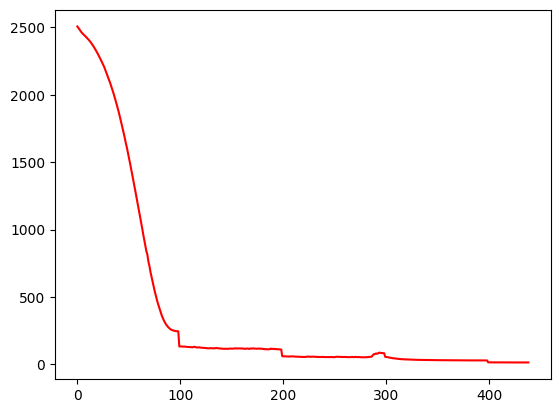

 88%|████████▊ | 439/500 [01:20<00:10,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.60852788302746
Dataset Name:  weibo , AUC Score (contextual):  66.1373862740915
Dataset Name:  weibo , AUC Score (structural):  49.971534001054295
Dataset Name:  weibo , AUC Score (joint-type):  48.34567357361681
Dataset Name:  weibo , AUC Score (structure type):  49.72200439870568
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.34567357361681
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


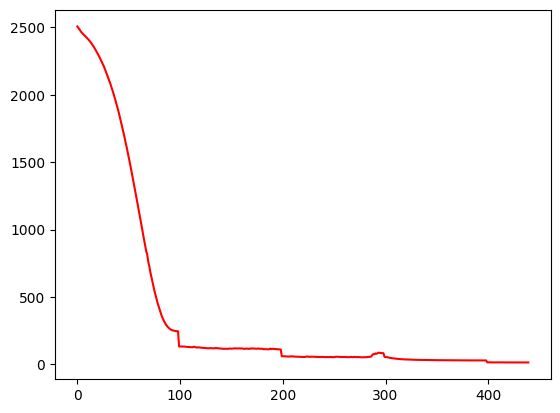

 88%|████████▊ | 440/500 [01:20<00:10,  5.58it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.93967211831769
Dataset Name:  weibo , AUC Score (contextual):  67.33039179467967
Dataset Name:  weibo , AUC Score (structural):  50.402517274020674
Dataset Name:  weibo , AUC Score (joint-type):  48.17888231937548
Dataset Name:  weibo , AUC Score (structure type):  50.08466346209723
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.17888231937548
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


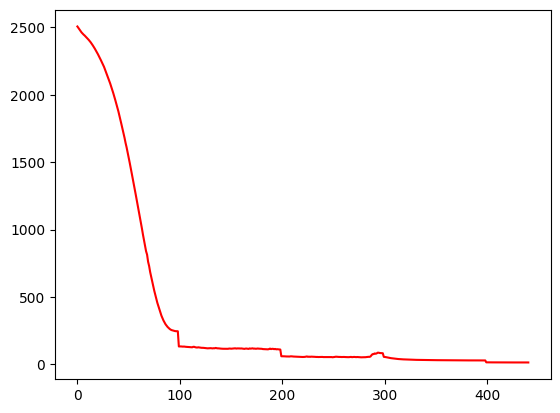

 88%|████████▊ | 441/500 [01:20<00:10,  5.57it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.06691688132707
Dataset Name:  weibo , AUC Score (contextual):  67.98157144533728
Dataset Name:  weibo , AUC Score (structural):  50.08235697564349
Dataset Name:  weibo , AUC Score (joint-type):  48.31595755812979
Dataset Name:  weibo , AUC Score (structure type):  49.881472292506864
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.31595755812979
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


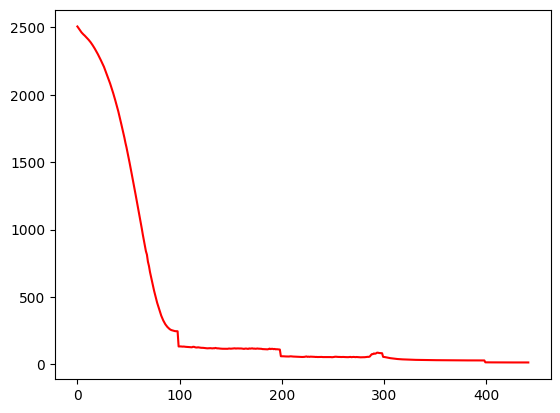

 88%|████████▊ | 442/500 [01:20<00:10,  5.57it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.53012083552173
Dataset Name:  weibo , AUC Score (contextual):  68.622431429138
Dataset Name:  weibo , AUC Score (structural):  50.436081872339464
Dataset Name:  weibo , AUC Score (joint-type):  48.77300028270684
Dataset Name:  weibo , AUC Score (structure type):  50.169315529764646
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.77300028270684
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


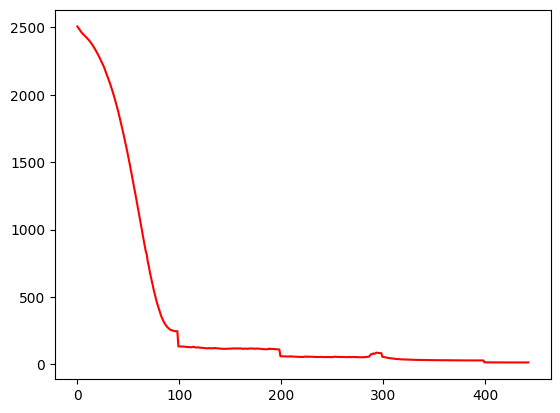

 89%|████████▊ | 443/500 [01:20<00:10,  5.61it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.70538523009986
Dataset Name:  weibo , AUC Score (contextual):  69.40880738760958
Dataset Name:  weibo , AUC Score (structural):  50.03760323317519
Dataset Name:  weibo , AUC Score (joint-type):  48.68243581138308
Dataset Name:  weibo , AUC Score (structure type):  49.945899247261174
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.68243581138308
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


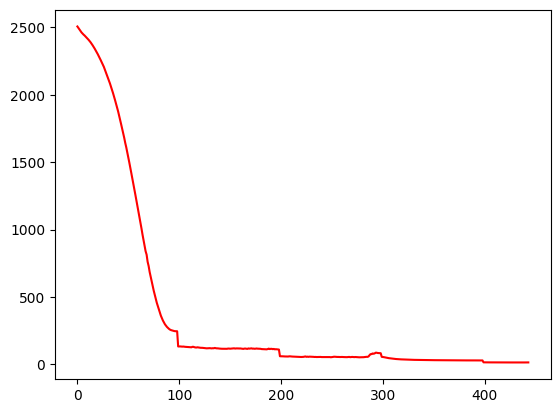

 89%|████████▉ | 444/500 [01:21<00:09,  5.63it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.50532274267226
Dataset Name:  weibo , AUC Score (contextual):  69.45741388570434
Dataset Name:  weibo , AUC Score (structural):  50.56663889219537
Dataset Name:  weibo , AUC Score (joint-type):  49.057470427072325
Dataset Name:  weibo , AUC Score (structure type):  50.31628658267149
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.057470427072325
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


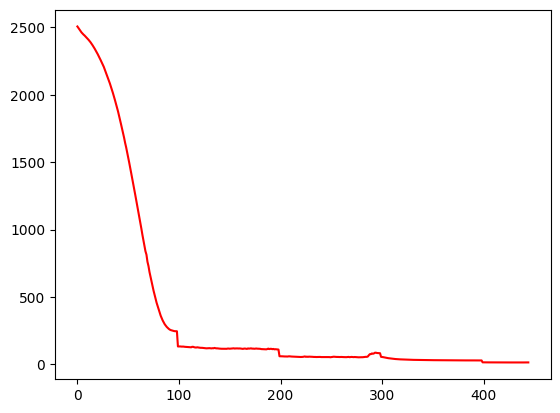

 89%|████████▉ | 445/500 [01:21<00:09,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.22737964291676
Dataset Name:  weibo , AUC Score (contextual):  66.76679923247116
Dataset Name:  weibo , AUC Score (structural):  50.2629108779567
Dataset Name:  weibo , AUC Score (joint-type):  49.00191188449836
Dataset Name:  weibo , AUC Score (structure type):  50.083543959368384
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.00191188449836
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


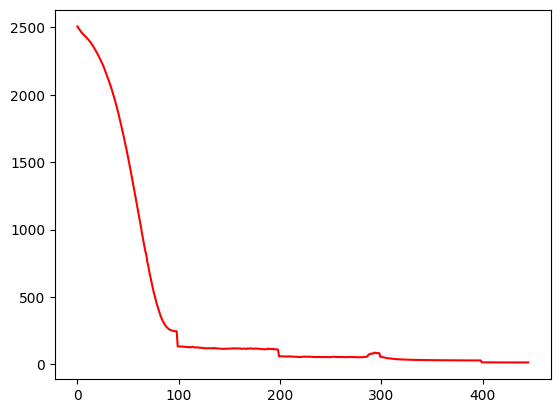

 89%|████████▉ | 446/500 [01:21<00:09,  5.54it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.6277724210332
Dataset Name:  weibo , AUC Score (contextual):  66.23644929459151
Dataset Name:  weibo , AUC Score (structural):  49.36756678626694
Dataset Name:  weibo , AUC Score (joint-type):  48.29112676308762
Dataset Name:  weibo , AUC Score (structure type):  49.2235522180511
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.29112676308762
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


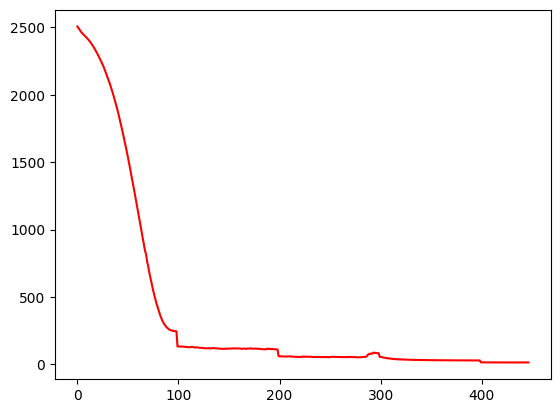

 89%|████████▉ | 447/500 [01:21<00:09,  5.66it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.43789257176118
Dataset Name:  weibo , AUC Score (contextual):  66.60171346939106
Dataset Name:  weibo , AUC Score (structural):  49.877673292861964
Dataset Name:  weibo , AUC Score (joint-type):  47.31584597853856
Dataset Name:  weibo , AUC Score (structure type):  49.5997934417764
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.31584597853856
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


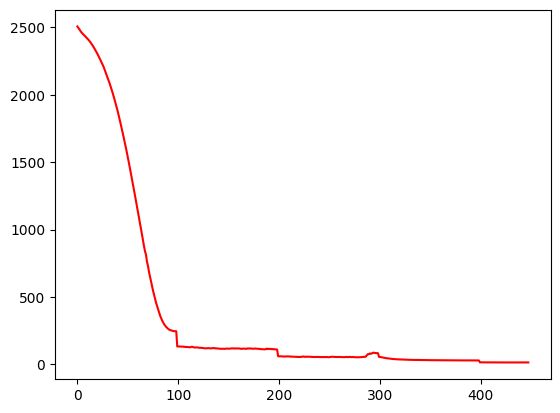

 90%|████████▉ | 448/500 [01:21<00:09,  5.74it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.96400919824717
Dataset Name:  weibo , AUC Score (contextual):  66.1679983951039
Dataset Name:  weibo , AUC Score (structural):  49.946094852653594
Dataset Name:  weibo , AUC Score (joint-type):  47.272457127131936
Dataset Name:  weibo , AUC Score (structure type):  49.683570986955885
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.272457127131936
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


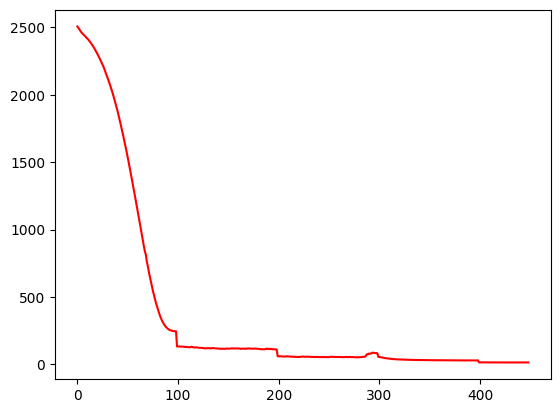

 90%|████████▉ | 449/500 [01:22<00:08,  5.75it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.44880891748174
Dataset Name:  weibo , AUC Score (contextual):  65.89613154135353
Dataset Name:  weibo , AUC Score (structural):  49.98405518617398
Dataset Name:  weibo , AUC Score (joint-type):  47.538831721210585
Dataset Name:  weibo , AUC Score (structure type):  49.746359992424985
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.538831721210585
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


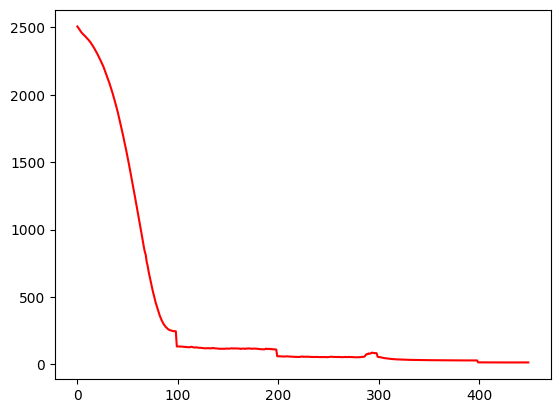

 90%|█████████ | 450/500 [01:22<00:11,  4.29it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.71849230432477
Dataset Name:  weibo , AUC Score (contextual):  66.49504800524019
Dataset Name:  weibo , AUC Score (structural):  50.2879929260122
Dataset Name:  weibo , AUC Score (joint-type):  47.49506708361589
Dataset Name:  weibo , AUC Score (structure type):  49.96613005738919
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.49506708361589
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


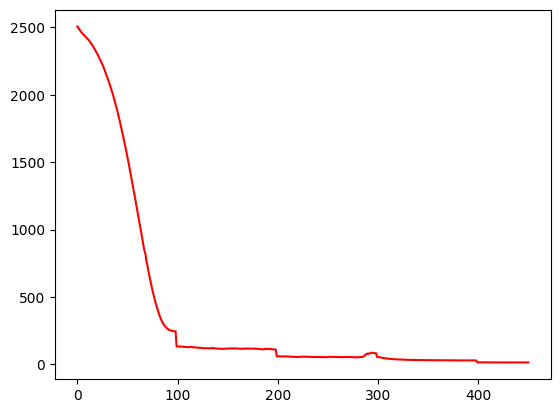

 90%|█████████ | 451/500 [01:22<00:10,  4.50it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.06974196116364
Dataset Name:  weibo , AUC Score (contextual):  66.05208280940066
Dataset Name:  weibo , AUC Score (structural):  49.825630168744084
Dataset Name:  weibo , AUC Score (joint-type):  48.304279279669906
Dataset Name:  weibo , AUC Score (structure type):  49.65778824090286
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.304279279669906
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


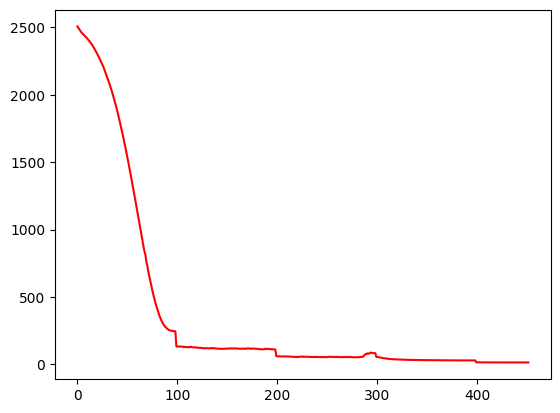

 90%|█████████ | 452/500 [01:22<00:10,  4.75it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.11505084899136
Dataset Name:  weibo , AUC Score (contextual):  64.90798730652071
Dataset Name:  weibo , AUC Score (structural):  49.98674760941158
Dataset Name:  weibo , AUC Score (joint-type):  48.50720382122521
Dataset Name:  weibo , AUC Score (structure type):  49.81142218664122
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.50720382122521
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


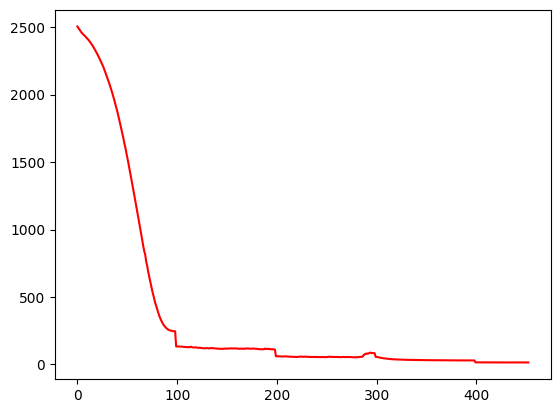

 91%|█████████ | 453/500 [01:22<00:09,  4.98it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.72268544305849
Dataset Name:  weibo , AUC Score (contextual):  64.9409697711809
Dataset Name:  weibo , AUC Score (structural):  50.25773292295135
Dataset Name:  weibo , AUC Score (joint-type):  47.975928871190334
Dataset Name:  weibo , AUC Score (structure type):  50.06309380646652
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.975928871190334
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


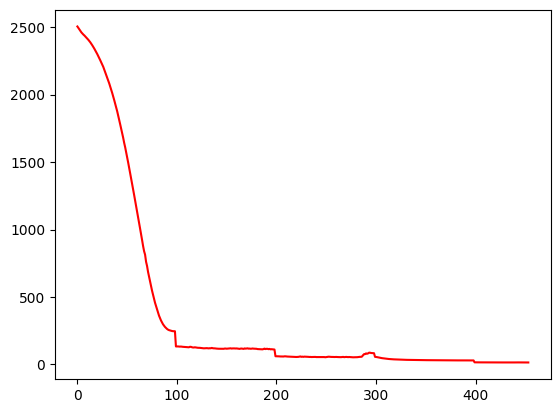

 91%|█████████ | 454/500 [01:23<00:08,  5.17it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.338834101993925
Dataset Name:  weibo , AUC Score (contextual):  65.25801768738869
Dataset Name:  weibo , AUC Score (structural):  50.48448313976227
Dataset Name:  weibo , AUC Score (joint-type):  48.10389852154151
Dataset Name:  weibo , AUC Score (structure type):  50.20091798084323
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.10389852154151
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


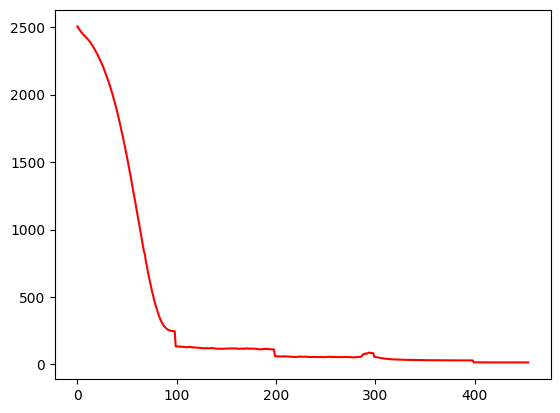

 91%|█████████ | 455/500 [01:23<00:08,  5.43it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.55063101907701
Dataset Name:  weibo , AUC Score (contextual):  64.90925919823415
Dataset Name:  weibo , AUC Score (structural):  49.96171090743166
Dataset Name:  weibo , AUC Score (joint-type):  47.88351437555609
Dataset Name:  weibo , AUC Score (structure type):  49.729952013498306
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.88351437555609
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


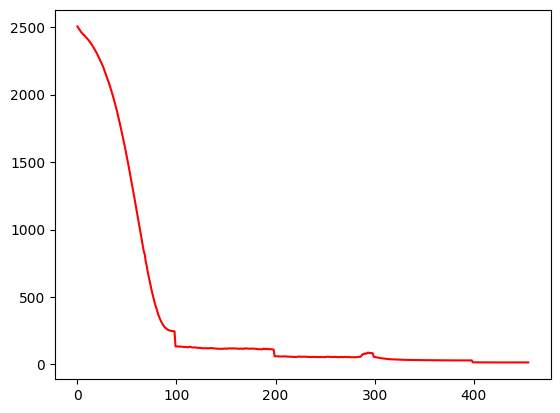

 91%|█████████ | 456/500 [01:23<00:08,  5.49it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.0095192442323
Dataset Name:  weibo , AUC Score (contextual):  64.98453206236663
Dataset Name:  weibo , AUC Score (structural):  50.1200934129157
Dataset Name:  weibo , AUC Score (joint-type):  48.12355502984031
Dataset Name:  weibo , AUC Score (structure type):  49.79846671994702
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.12355502984031
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


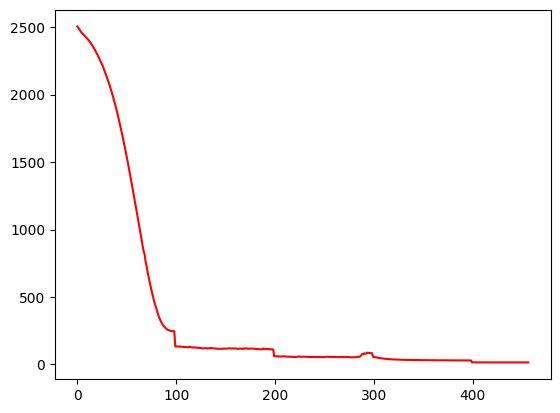

 91%|█████████▏| 457/500 [01:23<00:07,  5.39it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  63.62884730261585
Dataset Name:  weibo , AUC Score (contextual):  65.39885078802364
Dataset Name:  weibo , AUC Score (structural):  50.20908508624258
Dataset Name:  weibo , AUC Score (joint-type):  47.52322214109094
Dataset Name:  weibo , AUC Score (structure type):  49.95618272016488
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.52322214109094
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


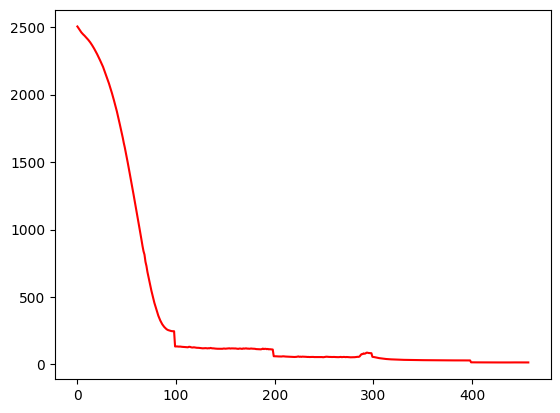

 92%|█████████▏| 458/500 [01:23<00:07,  5.41it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.65677954961362
Dataset Name:  weibo , AUC Score (contextual):  67.6330731158514
Dataset Name:  weibo , AUC Score (structural):  50.445536529098014
Dataset Name:  weibo , AUC Score (joint-type):  47.41187380290419
Dataset Name:  weibo , AUC Score (structure type):  50.09643105948371
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.41187380290419
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


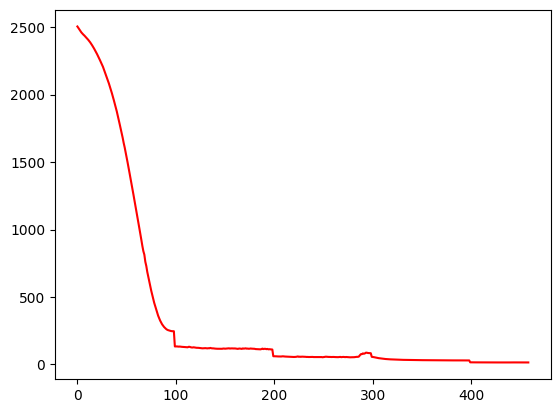

 92%|█████████▏| 459/500 [01:24<00:07,  5.38it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.56818436114554
Dataset Name:  weibo , AUC Score (contextual):  68.2425115930039
Dataset Name:  weibo , AUC Score (structural):  50.35297101818944
Dataset Name:  weibo , AUC Score (joint-type):  48.30500194541618
Dataset Name:  weibo , AUC Score (structure type):  50.05136893819182
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.30500194541618
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


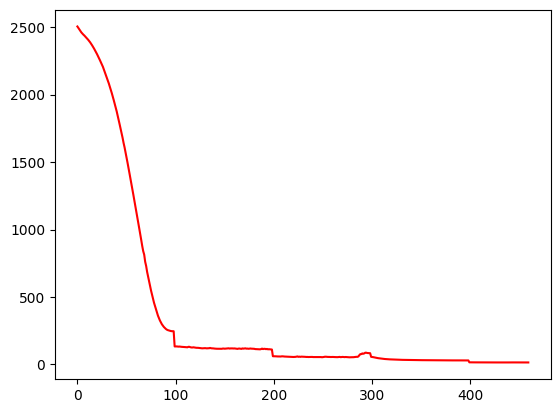

 92%|█████████▏| 460/500 [01:24<00:07,  5.40it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.63193315434944
Dataset Name:  weibo , AUC Score (contextual):  70.63569147838334
Dataset Name:  weibo , AUC Score (structural):  49.7655777940268
Dataset Name:  weibo , AUC Score (joint-type):  48.58733299917269
Dataset Name:  weibo , AUC Score (structure type):  49.582775860854866
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.58733299917269
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


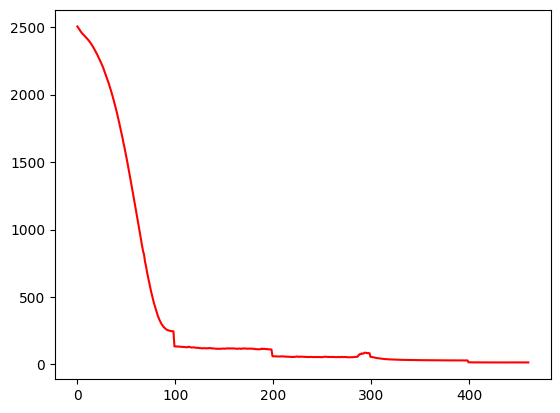

 92%|█████████▏| 461/500 [01:24<00:07,  5.51it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.40346731852509
Dataset Name:  weibo , AUC Score (contextual):  70.01535520177696
Dataset Name:  weibo , AUC Score (structural):  50.02308398660023
Dataset Name:  weibo , AUC Score (joint-type):  48.61490992405073
Dataset Name:  weibo , AUC Score (structure type):  49.85408008324315
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.61490992405073
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


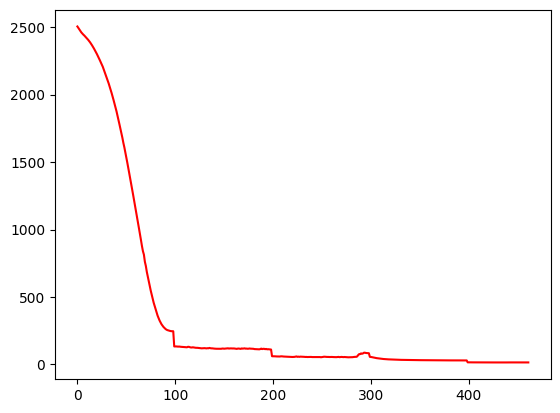

 92%|█████████▏| 462/500 [01:24<00:06,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  72.8516278219463
Dataset Name:  weibo , AUC Score (contextual):  71.33500066774315
Dataset Name:  weibo , AUC Score (structural):  50.11740665793754
Dataset Name:  weibo , AUC Score (joint-type):  48.118929969064126
Dataset Name:  weibo , AUC Score (structure type):  49.93132007431903
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.118929969064126
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


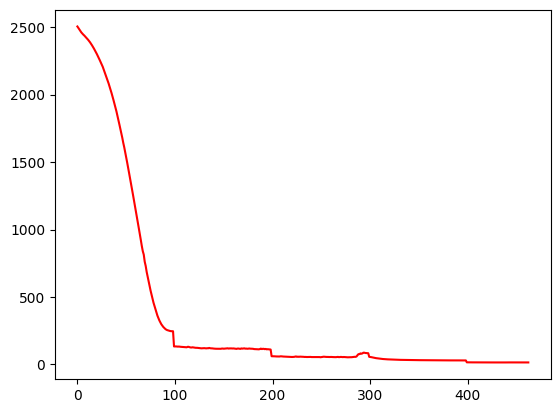

 93%|█████████▎| 463/500 [01:24<00:06,  5.64it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  72.22537784411038
Dataset Name:  weibo , AUC Score (contextual):  70.61496542478004
Dataset Name:  weibo , AUC Score (structural):  49.61110071930212
Dataset Name:  weibo , AUC Score (joint-type):  47.76968006720213
Dataset Name:  weibo , AUC Score (structure type):  49.51942283111016
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.76968006720213
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


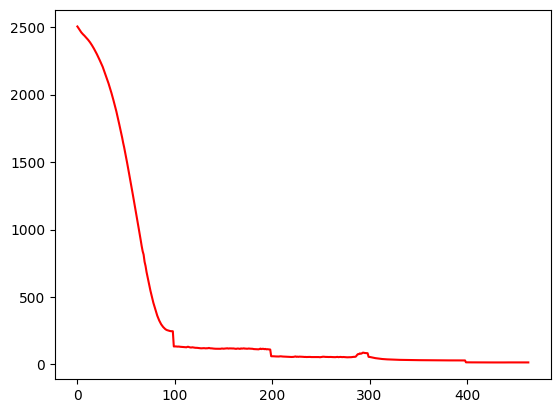

 93%|█████████▎| 464/500 [01:24<00:06,  5.74it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  72.05881094129178
Dataset Name:  weibo , AUC Score (contextual):  70.6896023430558
Dataset Name:  weibo , AUC Score (structural):  50.37573758226061
Dataset Name:  weibo , AUC Score (joint-type):  48.18541521772185
Dataset Name:  weibo , AUC Score (structure type):  50.15395583838049
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.18541521772185
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


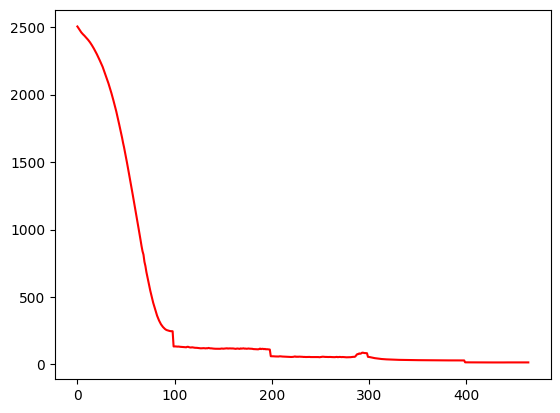

 93%|█████████▎| 465/500 [01:25<00:06,  5.78it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.94720301504896
Dataset Name:  weibo , AUC Score (contextual):  68.54877733627718
Dataset Name:  weibo , AUC Score (structural):  50.10258415948214
Dataset Name:  weibo , AUC Score (joint-type):  47.482955205708244
Dataset Name:  weibo , AUC Score (structure type):  49.91480384830915
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.482955205708244
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


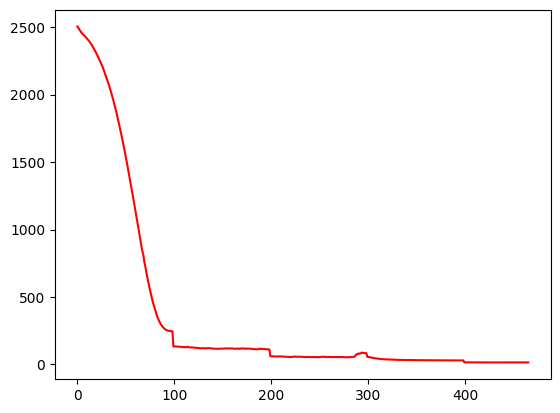

 93%|█████████▎| 466/500 [01:25<00:05,  5.74it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.11550483054718
Dataset Name:  weibo , AUC Score (contextual):  68.69388861813012
Dataset Name:  weibo , AUC Score (structural):  50.2884803963247
Dataset Name:  weibo , AUC Score (joint-type):  48.01061682701174
Dataset Name:  weibo , AUC Score (structure type):  50.08613049493529
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.01061682701174
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


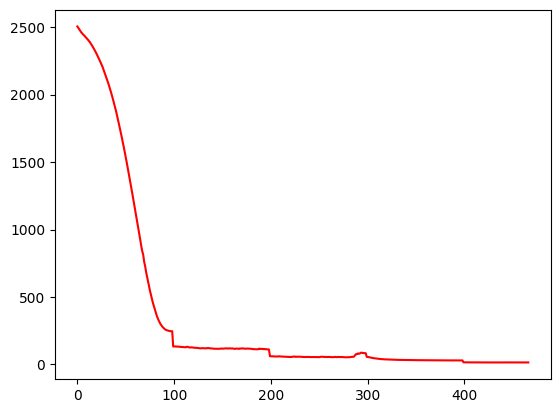

 93%|█████████▎| 467/500 [01:25<00:05,  5.76it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  69.21158230762035
Dataset Name:  weibo , AUC Score (contextual):  69.63611467144436
Dataset Name:  weibo , AUC Score (structural):  50.312828404781754
Dataset Name:  weibo , AUC Score (joint-type):  48.46854120379926
Dataset Name:  weibo , AUC Score (structure type):  50.089135775797736
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.46854120379926
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


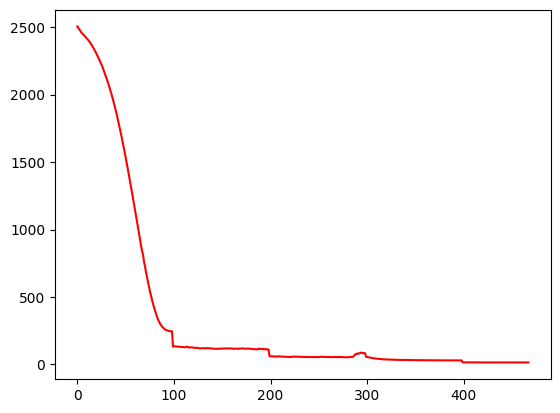

 94%|█████████▎| 468/500 [01:25<00:05,  5.86it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.19425855487735
Dataset Name:  weibo , AUC Score (contextual):  68.7905090284077
Dataset Name:  weibo , AUC Score (structural):  49.72554004341887
Dataset Name:  weibo , AUC Score (joint-type):  48.71622766167912
Dataset Name:  weibo , AUC Score (structure type):  49.60642784853339
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.71622766167912
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


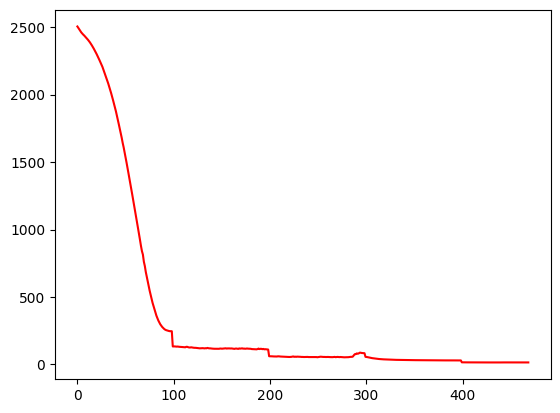

 94%|█████████▍| 469/500 [01:25<00:05,  5.81it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  67.52131879043417
Dataset Name:  weibo , AUC Score (contextual):  68.03215804757683
Dataset Name:  weibo , AUC Score (structural):  50.09213755732027
Dataset Name:  weibo , AUC Score (joint-type):  48.64725644285419
Dataset Name:  weibo , AUC Score (structure type):  49.92246660235651
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.64725644285419
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


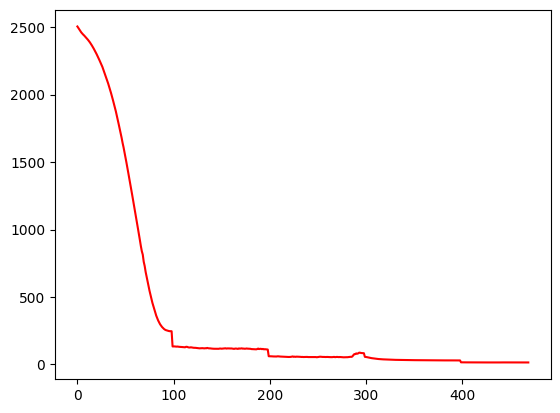

 94%|█████████▍| 470/500 [01:25<00:05,  5.55it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.18933629425096
Dataset Name:  weibo , AUC Score (contextual):  66.33643732724676
Dataset Name:  weibo , AUC Score (structural):  49.974288775145816
Dataset Name:  weibo , AUC Score (joint-type):  48.18050109064714
Dataset Name:  weibo , AUC Score (structure type):  49.80689859800657
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.18050109064714
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


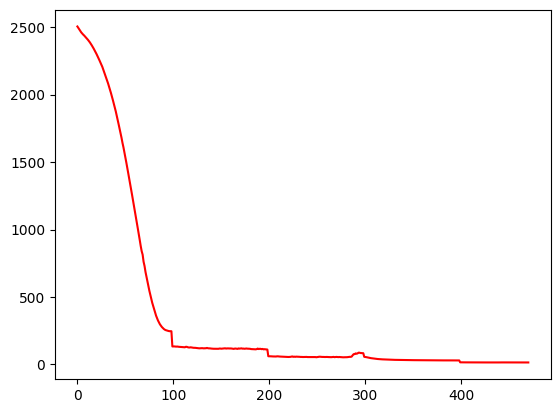

 94%|█████████▍| 471/500 [01:26<00:05,  5.53it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.15014408182307
Dataset Name:  weibo , AUC Score (contextual):  66.48961355882818
Dataset Name:  weibo , AUC Score (structural):  50.03272853005028
Dataset Name:  weibo , AUC Score (joint-type):  47.96138883637518
Dataset Name:  weibo , AUC Score (structure type):  49.82428080068202
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.96138883637518
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


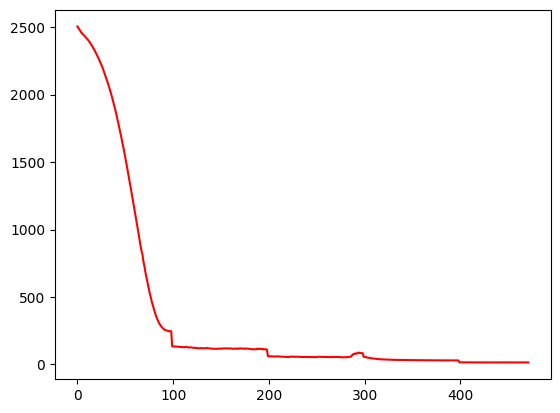

 94%|█████████▍| 472/500 [01:26<00:04,  5.61it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  61.21615697428783
Dataset Name:  weibo , AUC Score (contextual):  62.2026158187485
Dataset Name:  weibo , AUC Score (structural):  50.21136372654049
Dataset Name:  weibo , AUC Score (joint-type):  48.54056207207348
Dataset Name:  weibo , AUC Score (structure type):  50.00254095784767
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.54056207207348
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


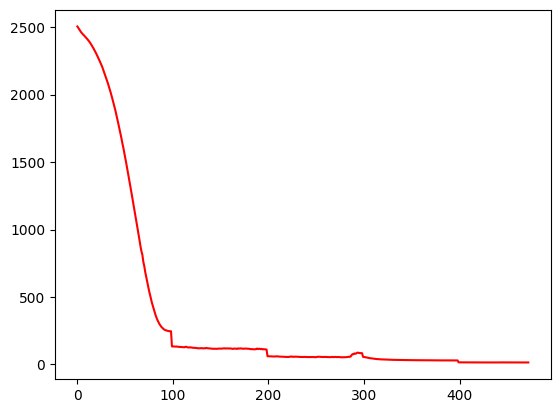

 95%|█████████▍| 473/500 [01:26<00:04,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.79518186470556
Dataset Name:  weibo , AUC Score (contextual):  59.959157822683274
Dataset Name:  weibo , AUC Score (structural):  49.885158229462476
Dataset Name:  weibo , AUC Score (joint-type):  48.9554589303275
Dataset Name:  weibo , AUC Score (structure type):  49.72125521494566
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.9554589303275
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


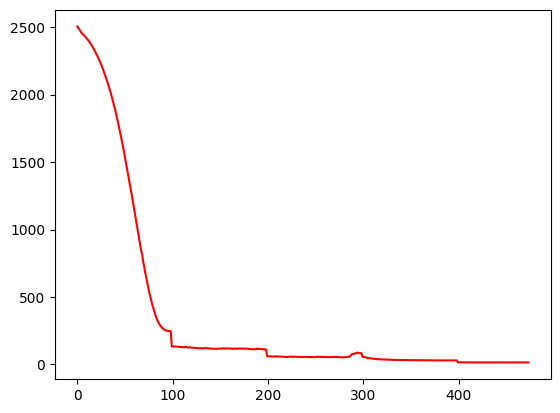

 95%|█████████▍| 474/500 [01:26<00:04,  5.61it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.914898482387045
Dataset Name:  weibo , AUC Score (contextual):  60.48061897188368
Dataset Name:  weibo , AUC Score (structural):  49.8934764002018
Dataset Name:  weibo , AUC Score (joint-type):  48.86382491369926
Dataset Name:  weibo , AUC Score (structure type):  49.71500821880222
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.86382491369926
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


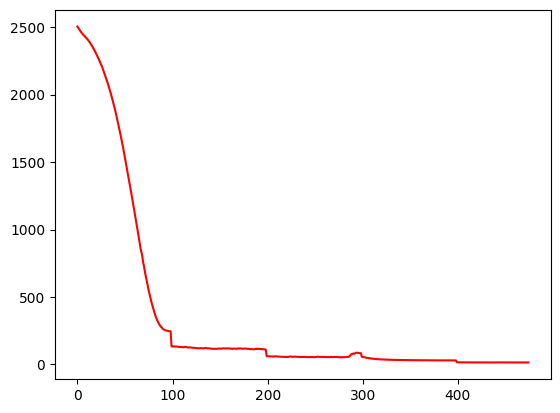

 95%|█████████▌| 475/500 [01:26<00:04,  5.64it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.74363646257572
Dataset Name:  weibo , AUC Score (contextual):  59.97986942297163
Dataset Name:  weibo , AUC Score (structural):  49.85667239160871
Dataset Name:  weibo , AUC Score (joint-type):  49.03639749391082
Dataset Name:  weibo , AUC Score (structure type):  49.69317079407097
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.03639749391082
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


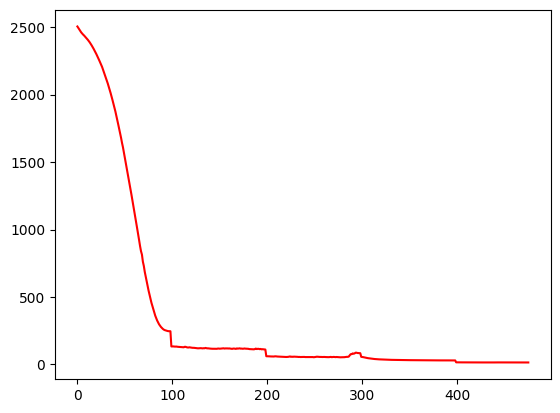

 95%|█████████▌| 476/500 [01:27<00:04,  5.67it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.83960174353374
Dataset Name:  weibo , AUC Score (contextual):  59.69031171175233
Dataset Name:  weibo , AUC Score (structural):  49.711508267156404
Dataset Name:  weibo , AUC Score (joint-type):  49.29392665925501
Dataset Name:  weibo , AUC Score (structure type):  49.54980038098416
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.29392665925501
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


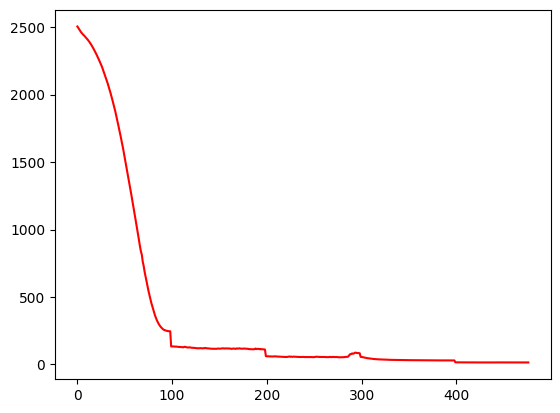

 95%|█████████▌| 477/500 [01:27<00:03,  5.81it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.8339460810539
Dataset Name:  weibo , AUC Score (contextual):  59.58419547356865
Dataset Name:  weibo , AUC Score (structural):  49.587551935427186
Dataset Name:  weibo , AUC Score (joint-type):  48.445430353233235
Dataset Name:  weibo , AUC Score (structure type):  49.3769554265858
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.445430353233235
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


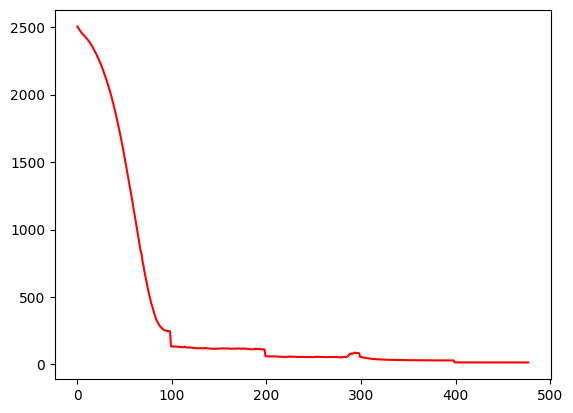

 96%|█████████▌| 478/500 [01:27<00:03,  5.66it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  58.50798120974926
Dataset Name:  weibo , AUC Score (contextual):  59.9047989052481
Dataset Name:  weibo , AUC Score (structural):  49.86981141700818
Dataset Name:  weibo , AUC Score (joint-type):  48.5973346931012
Dataset Name:  weibo , AUC Score (structure type):  49.63539533771837
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.5973346931012
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


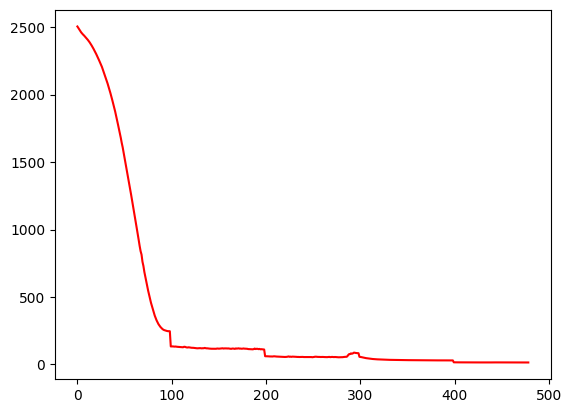

 96%|█████████▌| 479/500 [01:27<00:03,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  59.22531792465924
Dataset Name:  weibo , AUC Score (contextual):  60.64058826148012
Dataset Name:  weibo , AUC Score (structural):  49.853668214101496
Dataset Name:  weibo , AUC Score (joint-type):  49.00202751101776
Dataset Name:  weibo , AUC Score (structure type):  49.635537768090984
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.00202751101776
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


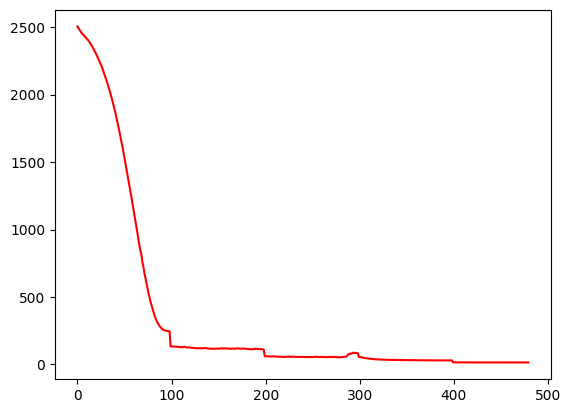

 96%|█████████▌| 480/500 [01:27<00:03,  5.57it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.02960938020665
Dataset Name:  weibo , AUC Score (contextual):  62.396521491790224
Dataset Name:  weibo , AUC Score (structural):  50.00798657756164
Dataset Name:  weibo , AUC Score (joint-type):  48.030909281167276
Dataset Name:  weibo , AUC Score (structure type):  49.65291997076645
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.030909281167276
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


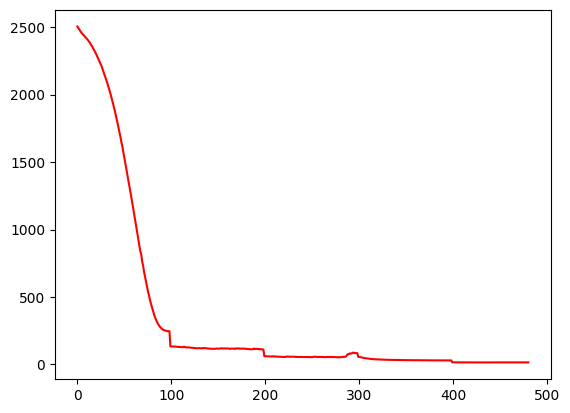

 96%|█████████▌| 481/500 [01:27<00:03,  5.65it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  62.51238895794572
Dataset Name:  weibo , AUC Score (contextual):  64.18477233427396
Dataset Name:  weibo , AUC Score (structural):  49.24415177331497
Dataset Name:  weibo , AUC Score (joint-type):  48.692610945090706
Dataset Name:  weibo , AUC Score (structure type):  49.135974630529915
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.692610945090706
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


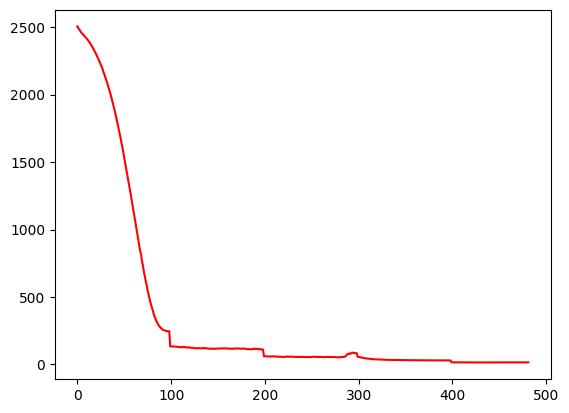

 96%|█████████▋| 482/500 [01:28<00:03,  5.77it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.24207397117387
Dataset Name:  weibo , AUC Score (contextual):  64.53662383282254
Dataset Name:  weibo , AUC Score (structural):  49.394964318306776
Dataset Name:  weibo , AUC Score (joint-type):  49.38767085986239
Dataset Name:  weibo , AUC Score (structure type):  49.27167944096193
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.38767085986239
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


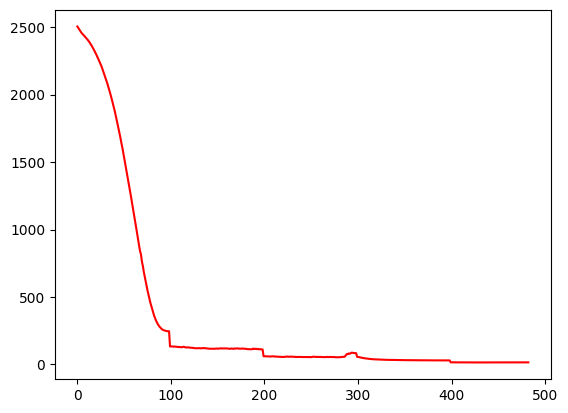

 97%|█████████▋| 483/500 [01:28<00:02,  5.80it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.32825159321541
Dataset Name:  weibo , AUC Score (contextual):  65.00904488448043
Dataset Name:  weibo , AUC Score (structural):  49.53005311159102
Dataset Name:  weibo , AUC Score (joint-type):  48.10483798701167
Dataset Name:  weibo , AUC Score (structure type):  49.28012271345129
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.10483798701167
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


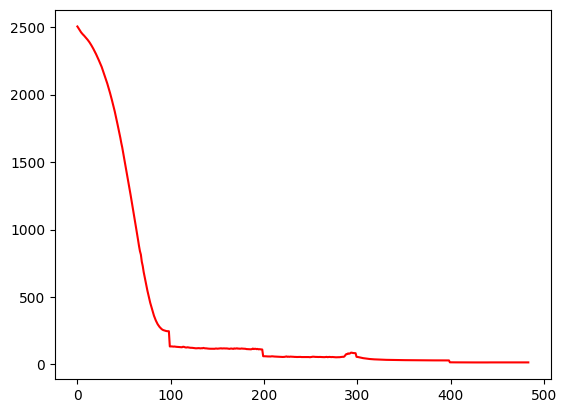

 97%|█████████▋| 484/500 [01:28<00:02,  5.78it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.90190635568064
Dataset Name:  weibo , AUC Score (contextual):  64.68514609699793
Dataset Name:  weibo , AUC Score (structural):  49.808050062067444
Dataset Name:  weibo , AUC Score (joint-type):  48.33757971725847
Dataset Name:  weibo , AUC Score (structure type):  49.5324238755236
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.33757971725847
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


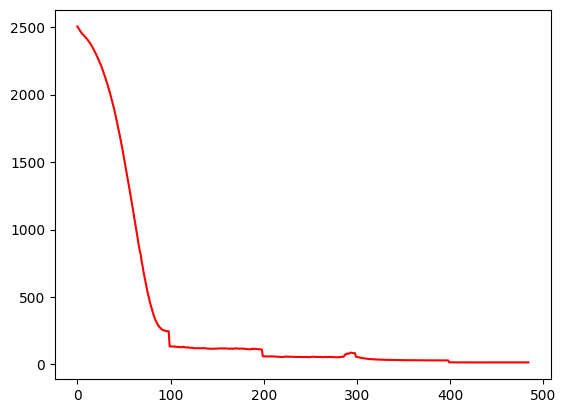

 97%|█████████▋| 485/500 [01:28<00:02,  5.79it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.73970868141133
Dataset Name:  weibo , AUC Score (contextual):  65.65259318485732
Dataset Name:  weibo , AUC Score (structural):  49.89345372716401
Dataset Name:  weibo , AUC Score (joint-type):  49.586317220199724
Dataset Name:  weibo , AUC Score (structure type):  49.78891818776607
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.586317220199724
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


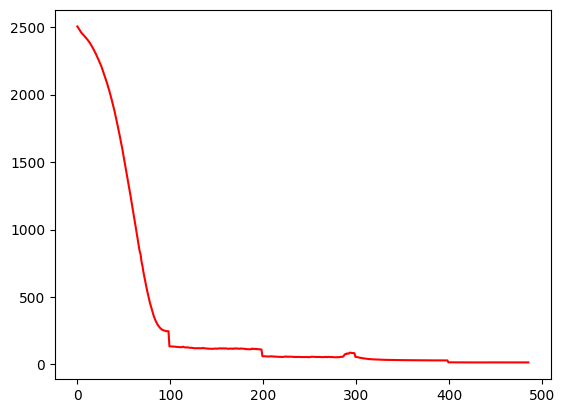

 97%|█████████▋| 486/500 [01:28<00:02,  5.87it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.92049361399278
Dataset Name:  weibo , AUC Score (contextual):  64.74966569482578
Dataset Name:  weibo , AUC Score (structural):  49.88587526428259
Dataset Name:  weibo , AUC Score (joint-type):  49.45883898255601
Dataset Name:  weibo , AUC Score (structure type):  49.80872740399111
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.45883898255601
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


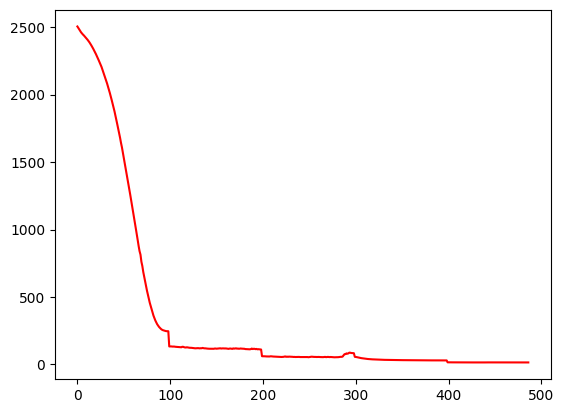

 97%|█████████▋| 487/500 [01:28<00:02,  5.85it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.19467340536303
Dataset Name:  weibo , AUC Score (contextual):  65.30343000288488
Dataset Name:  weibo , AUC Score (structural):  50.55975195696657
Dataset Name:  weibo , AUC Score (joint-type):  48.80699447941183
Dataset Name:  weibo , AUC Score (structure type):  50.37442666077803
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.80699447941183
Dataset Name:  weibo  Best AUC Score (structure type):  51.29404545329207


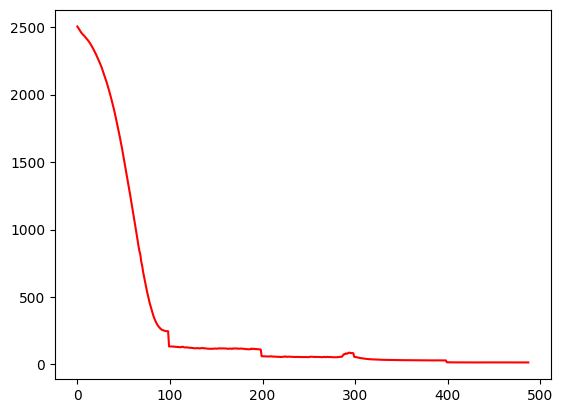

 98%|█████████▊| 488/500 [01:29<00:02,  5.60it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.27953891370926
Dataset Name:  weibo , AUC Score (contextual):  62.777019460521345
Dataset Name:  weibo , AUC Score (structural):  51.52587277024844
Dataset Name:  weibo , AUC Score (joint-type):  50.471380412983244
Dataset Name:  weibo , AUC Score (structure type):  51.409553636885505
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  50.471380412983244
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


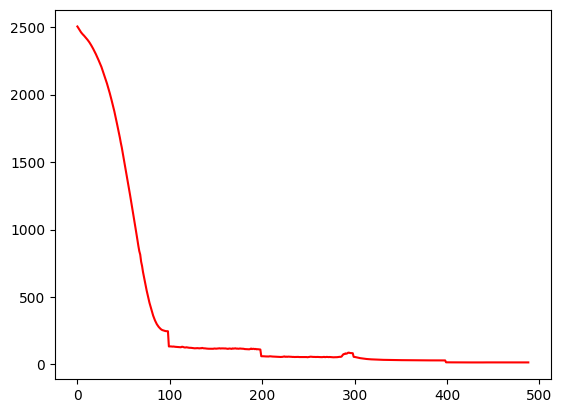

 98%|█████████▊| 489/500 [01:29<00:01,  5.61it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  68.13080049329605
Dataset Name:  weibo , AUC Score (contextual):  67.91314945247953
Dataset Name:  weibo , AUC Score (structural):  50.51239364928212
Dataset Name:  weibo , AUC Score (joint-type):  49.64228045559162
Dataset Name:  weibo , AUC Score (structure type):  50.43399673982575
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.64228045559162
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


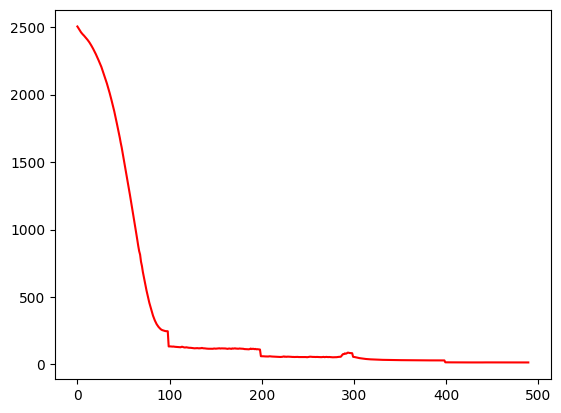

 98%|█████████▊| 490/500 [01:29<00:01,  5.73it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.70737969183058
Dataset Name:  weibo , AUC Score (contextual):  66.761393692689
Dataset Name:  weibo , AUC Score (structural):  50.92837587362049
Dataset Name:  weibo , AUC Score (joint-type):  47.9118139661804
Dataset Name:  weibo , AUC Score (structure type):  50.691835594785815
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.9118139661804
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


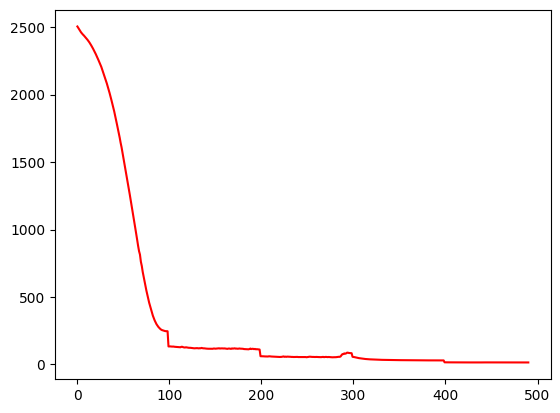

 98%|█████████▊| 491/500 [01:29<00:01,  5.70it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  64.93394491935027
Dataset Name:  weibo , AUC Score (contextual):  67.04719354202763
Dataset Name:  weibo , AUC Score (structural):  50.74066862788443
Dataset Name:  weibo , AUC Score (joint-type):  48.688592923541385
Dataset Name:  weibo , AUC Score (structure type):  50.49895353556623
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.688592923541385
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


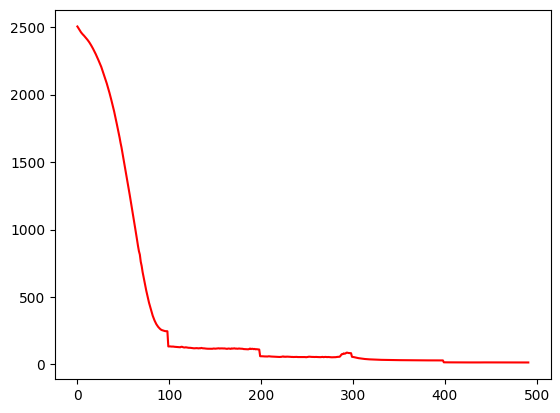

 98%|█████████▊| 492/500 [01:29<00:01,  5.67it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  65.5806622811335
Dataset Name:  weibo , AUC Score (contextual):  67.46839204558923
Dataset Name:  weibo , AUC Score (structural):  50.41929248785575
Dataset Name:  weibo , AUC Score (joint-type):  48.09661405081901
Dataset Name:  weibo , AUC Score (structure type):  50.11364804292692
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.09661405081901
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


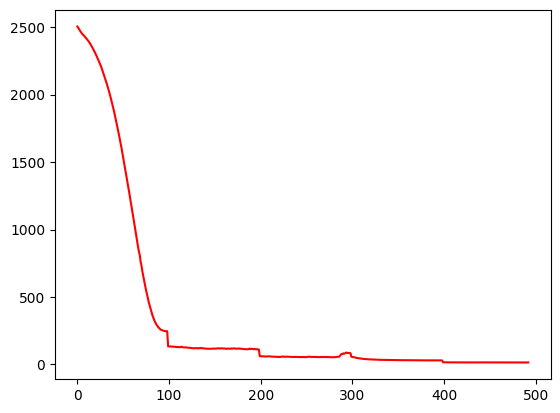

 99%|█████████▊| 493/500 [01:30<00:01,  5.62it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.62202259941584
Dataset Name:  weibo , AUC Score (contextual):  68.1239076907245
Dataset Name:  weibo , AUC Score (structural):  50.3830269639102
Dataset Name:  weibo , AUC Score (joint-type):  47.71519106993265
Dataset Name:  weibo , AUC Score (structure type):  50.054647685369716
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  47.71519106993265
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


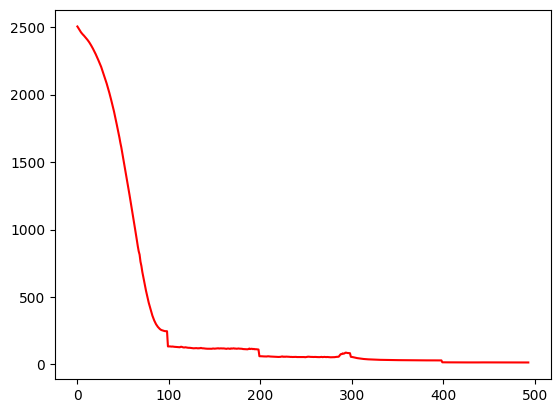

 99%|█████████▉| 494/500 [01:30<00:01,  5.59it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.19260496145284
Dataset Name:  weibo , AUC Score (contextual):  66.70855237332103
Dataset Name:  weibo , AUC Score (structural):  50.08068767323618
Dataset Name:  weibo , AUC Score (joint-type):  48.702497012499805
Dataset Name:  weibo , AUC Score (structure type):  49.88458012323759
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.702497012499805
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


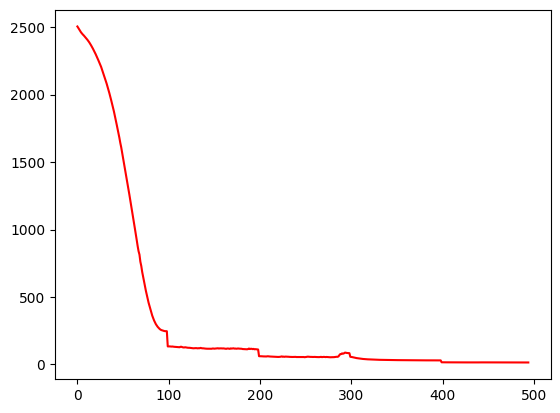

 99%|█████████▉| 495/500 [01:30<00:00,  5.71it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.16197267061605
Dataset Name:  weibo , AUC Score (contextual):  66.66958623628163
Dataset Name:  weibo , AUC Score (structural):  49.87751458159743
Dataset Name:  weibo , AUC Score (joint-type):  49.30976749241346
Dataset Name:  weibo , AUC Score (structure type):  49.7681689310817
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.30976749241346
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


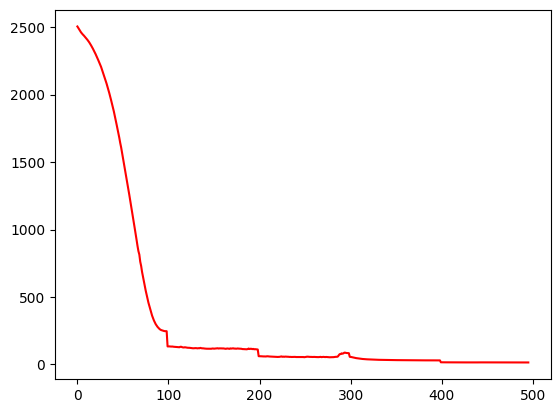

 99%|█████████▉| 496/500 [01:30<00:00,  5.68it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.22342067918086
Dataset Name:  weibo , AUC Score (contextual):  66.77685873965937
Dataset Name:  weibo , AUC Score (structural):  50.22670770486507
Dataset Name:  weibo , AUC Score (joint-type):  48.92233193251805
Dataset Name:  weibo , AUC Score (structure type):  49.980982696646784
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.92233193251805
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


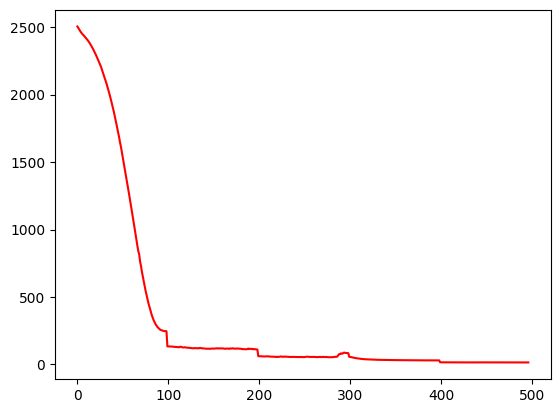

 99%|█████████▉| 497/500 [01:30<00:00,  5.72it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  66.00593752846939
Dataset Name:  weibo , AUC Score (contextual):  65.83230570264213
Dataset Name:  weibo , AUC Score (structural):  49.776064074004786
Dataset Name:  weibo , AUC Score (joint-type):  49.573020170468176
Dataset Name:  weibo , AUC Score (structure type):  49.807143578247484
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.573020170468176
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


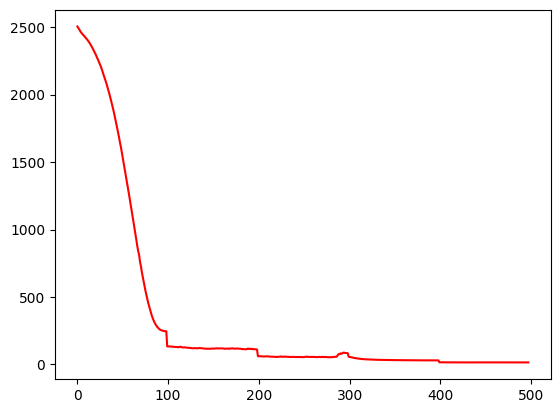

100%|█████████▉| 498/500 [01:30<00:00,  5.78it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  72.77457324205197
Dataset Name:  weibo , AUC Score (contextual):  70.06790745484639
Dataset Name:  weibo , AUC Score (structural):  50.0305859279791
Dataset Name:  weibo , AUC Score (joint-type):  49.67783561030857
Dataset Name:  weibo , AUC Score (structure type):  49.84240933851005
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  49.67783561030857
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


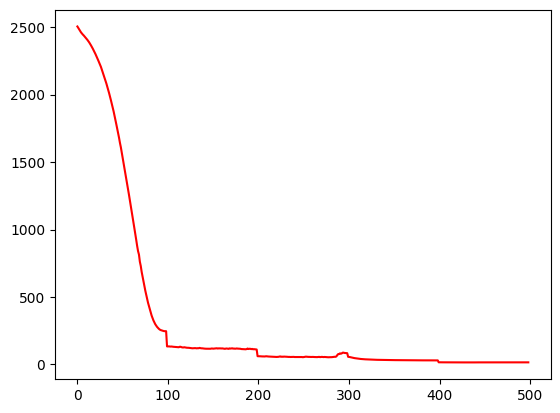

100%|█████████▉| 499/500 [01:31<00:00,  5.81it/s]

Dataset Name:  weibo , AUC Score(benchmark/combined):  70.50948041887365
Dataset Name:  weibo , AUC Score (contextual):  68.21109008635567
Dataset Name:  weibo , AUC Score (structural):  49.879623174111934
Dataset Name:  weibo , AUC Score (joint-type):  48.9150185551657
Dataset Name:  weibo , AUC Score (structure type):  49.73851492750067
Dataset Name:  weibo  Best AUC Score(benchmark/combined):  82.0742249143855
Dataset Name:  weibo  Best AUC Score (contextual):  79.91075945232342
Dataset Name:  weibo  Best AUC Score (structural):  51.63107849972509
Dataset Name:  weibo  Best AUC Score (joint-type):  48.9150185551657
Dataset Name:  weibo  Best AUC Score (structure type):  51.409553636885505


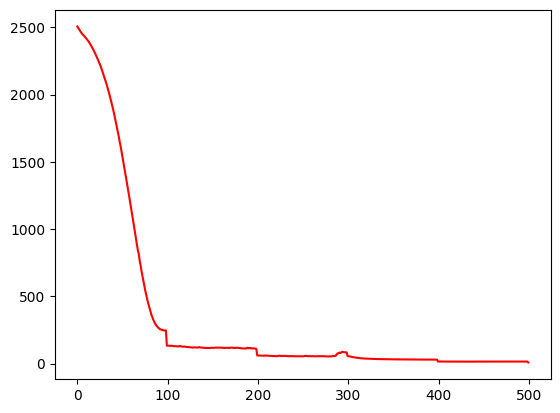

100%|██████████| 500/500 [01:31<00:00,  5.48it/s]


In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
parser = argparse.ArgumentParser(description='parameters')
parser.add_argument('-f')
parser.add_argument('--dataset', type=str, default="weibo")
parser.add_argument('--lr', type=float, default=0.01)
parser.add_argument('--epoch_num', type=int, default=500)
parser.add_argument('--lambda_loss1', type=float, default=1e-2) #neighbor reconstruction loss weight
parser.add_argument('--lambda_loss2', type=float, default=0.5) #feature loss weight
parser.add_argument('--lambda_loss3', type=float, default=0.8) #degree loss weight
parser.add_argument('--sample_size', type=int, default=10)
parser.add_argument('--dimension', type=int, default=16)
parser.add_argument('--encoder', type=str, default="GCN")
parser.add_argument('--loss_step', type=int, default=100)
parser.add_argument('--real_loss', type=bool, default=False) #use real loss or adaptive loss
parser.add_argument('--neigh_loss', type=str, default="KL")
parser.add_argument('--h_loss_weight', type=float, default=1.0)#adaptive loss weight for h_loss
parser.add_argument('--feature_loss_weight', type=float, default=2.0) #adaptive loss weight for feature loss
parser.add_argument('--degree_loss_weight', type=float, default=1.0)#adaptive loss weight for degree loss
parser.add_argument('--calculate_contextual', type=bool, default=True)
parser.add_argument('--contextual_n', type=int, default=434)
parser.add_argument('--contextual_k', type=int, default=10)
parser.add_argument('--calculate_structural', type=bool, default=True)
parser.add_argument('--structural_n', type=int, default=434)
parser.add_argument('--structural_m', type=int, default=10)
parser.add_argument('--use_combine_outlier', type=bool, default=False)
parser.add_argument('--plot_loss', type=bool, default=True)
parser.add_argument('--normalize_feat', type=bool, default=False)
parser.add_argument('--aggregator', type=str, default="mean")



args = parser.parse_args()

print("GAD-NR: Graph Anomaly Detection via Neighborhood Reconstruction")
print("Dataset: ", args.dataset, "lr:", args.lr, "lambda_loss1 (neighbor):",args.lambda_loss1, "lambda_loss2 (feature):", args.lambda_loss2, "lambda_loss3 (degree):", args.lambda_loss3, "sample_size:", args.sample_size, "dimension:",args.dimension, "encoder:", args.encoder, "loss_step:", args.loss_step,"real_loss:", args.real_loss, "h_loss_weight:",args.h_loss_weight,"feature_loss_weight",args.feature_loss_weight,"degree_loss_weight:",args.degree_loss_weight,
"calculate_contextual",args.calculate_contextual,"calculate_structural",args.calculate_structural)


dataset_str = args.dataset
train_real_datasets(dataset_str=dataset_str, lr=args.lr, epoch_num=args.epoch_num, lambda_loss1=args.lambda_loss1, 
lambda_loss2=args.lambda_loss2, lambda_loss3=args.lambda_loss3, encoder=args.encoder, sample_size=args.sample_size, loss_step=args.loss_step, 
hidden_dim=args.dimension,real_loss=args.real_loss,calculate_contextual=args.calculate_contextual,calculate_structural=args.calculate_structural)